In [1]:
!pip install wordcloud
!pip install imblearn
!pip install keras_tuner
!pip install hf_xet
!pip install transformers
!pip install sentence_transformers
!pip install graphviz
!pip install SMOTE
!pip install evaluate
!pip install datasets
!pip install torch
!pip install scikit-learn
!pip install seaborn
!pip install matplotlib
!pip install tqdm
!pip install pandas
!pip install numpy
!pip install gensim
!pip install nltk
!pip install tensorflow
!pip install imbalanced-learn
!pip install psutil memory-profiler
!pip install shap

import nltk
nltk.download('punkt')


[nltk_data] Downloading package punkt to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

## Importing Libraries

In [2]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
from sklearn.utils import shuffle
import matplotlib.pyplot as plt
import seaborn as sns
palette=sns.color_palette('magma')
sns.set(palette=palette)


from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import CountVectorizer

import nltk
nltk.download('stopwords')
import re  #reggex
import nltk  #stop articles

from wordcloud import WordCloud

from tensorflow.keras.preprocessing.text import Tokenizer

from keras.utils import to_categorical
from keras.utils import pad_sequences

# Model libraries
from keras.layers import LSTM, RNN
from keras.layers import Bidirectional, Dense, Dropout, Embedding, SpatialDropout1D
from transformers import BertTokenizer, TFBertModel

from keras.models import Sequential, Model   # For Model building

[nltk_data] Downloading package stopwords to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
2025-05-04 03:50:50.506787: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-05-04 03:50:50.518218: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-05-04 03:50:50.521722: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-05-04 03:50:50.531095: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following ins

## Data Reading

In [3]:
df_train=pd.read_csv('train_data.csv',encoding='ISO-8859-1')
print(f"Train set : {df_train.shape}")

Train set : (4000, 8)


In [4]:
df_train.head()

,name,brand,categories,primaryCategories,reviews.date,reviews.text,reviews.title,sentiment
0,"All-New Fire HD 8 Tablet, 8"" HD Display, Wi-Fi...",Amazon,"Electronics,iPad & Tablets,All Tablets,Fire Ta...",Electronics,2016-12-26T00:00:00.000Z,Purchased on Black FridayPros - Great Price (e...,Powerful tablet,Positive
1,Amazon - Echo Plus w/ Built-In Hub - Silver,Amazon,"Amazon Echo,Smart Home,Networking,Home & Tools...","Electronics,Hardware",2018-01-17T00:00:00.000Z,I purchased two Amazon in Echo Plus and two do...,Amazon Echo Plus AWESOME,Positive
2,Amazon Echo Show Alexa-enabled Bluetooth Speak...,Amazon,"Amazon Echo,Virtual Assistant Speakers,Electro...","Electronics,Hardware",2017-12-20T00:00:00.000Z,Just an average Alexa option. Does show a few ...,Average,Neutral
3,"Fire HD 10 Tablet, 10.1 HD Display, Wi-Fi, 16 ...",Amazon,"eBook Readers,Fire Tablets,Electronics Feature...","Office Supplies,Electronics",2017-08-04T00:00:00.000Z,"very good product. Exactly what I wanted, and ...",Greattttttt,Positive
4,"Brand New Amazon Kindle Fire 16gb 7"" Ips Displ...",Amazon,"Computers/Tablets & Networking,Tablets & eBook...",Electronics,2017-01-23T00:00:00.000Z,This is the 3rd one I've purchased. I've bough...,Very durable!,Positive


## Data Cleaning

In [5]:
print("Missing values in train_df:\n", df_train.isnull().sum())

Missing values in train_df:
 name                  0
brand                 0
categories            0
primaryCategories     0
reviews.date          0
reviews.text          0
reviews.title        10
sentiment             0
dtype: int64


### Imputing Null Values

Found few review titles missing values in train set, so dropping them

In [6]:
df_train = df_train.dropna(subset=['reviews.title'])

In [7]:
print("Missing values in train_df:\n", df_train.isnull().sum())

Missing values in train_df:
 name                 0
brand                0
categories           0
primaryCategories    0
reviews.date         0
reviews.text         0
reviews.title        0
sentiment            0
dtype: int64


In [8]:
print("Duplicates:", df_train.duplicated().sum())

Duplicates: 58


### Dropping Duplicates

Found few duplicate rows in the dataset, hence dropping the duplicate records

In [9]:
df_train = df_train.drop_duplicates()

In [10]:
print("Duplicates:", df_train.duplicated().sum())

Duplicates: 0


In [11]:
df_train = df_train.reset_index(drop=True)

In [12]:
# Checking sentiments
Categories = df_train['sentiment'].unique()
print(Categories)

['Positive' 'Neutral' 'Negative']


## Exploratory Data Analysis

### Visualizing Data

Common trends as per E-Commerce domain:-

Products bought by customers have specific information that might be used in their reviews to describe their experience. So we can try to understand columns like:-

1.   Product Brand
1.   Product Name
2.   Categories / Prime Categories
3.   Review Tite
4.   Review Date

In [13]:
#Primary Categories
print(f"{df_train['primaryCategories'].nunique()} unique Primary Categories in the data set : {df_train['primaryCategories'].unique()}")

4 unique Primary Categories in the data set : ['Electronics' 'Electronics,Hardware' 'Office Supplies,Electronics'
 'Electronics,Media']


In [14]:
#Brand
print(f"{df_train['brand'].nunique()} unique Brand in the data set : {df_train['brand'].unique()}")

1 unique Brand in the data set : ['Amazon']


In [15]:
#review.titles
print(f"Number of unique review titles in total data set : {df_train['reviews.title'].nunique()}/{df_train.shape[0]}")

Number of unique review titles in total data set : 2606/3932


In [16]:
#names
print(f"Number of unique Product Names in total data set : {df_train['name'].nunique()}/{df_train.shape[0]}")

Number of unique Product Names in total data set : 23/3932


In [17]:
#review.text
print(f"Number of unique actual reviews in total data set : {df_train['reviews.text'].nunique()}/{df_train.shape[0]}")

Number of unique actual reviews in total data set : 3590/3932


In [18]:
df_train['Date'] =  pd.to_datetime(df_train['reviews.date'])
unique_year = df_train['Date'].dt.year.unique()
print(f'Unique Years of Review :{unique_year}')
unique_month = df_train['Date'].dt.month.unique()
print(f'Unique Months of Review:{unique_month}')

Unique Years of Review :[2016 2018 2017 2015 2014]
Unique Months of Review:[12  1  8  5  6 11  4  2  9  7  3 10]


In [19]:
df_train['year']=df_train['Date'].dt.year
df_train['month'] = df_train['Date'].dt.month

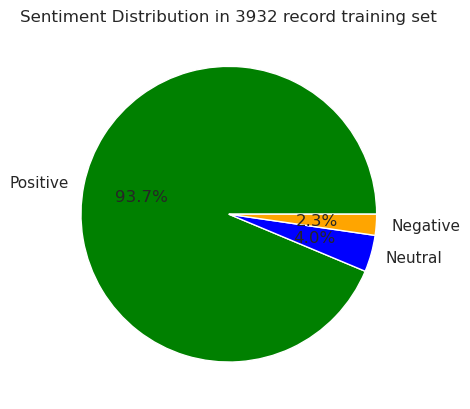

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define custom colors for each sentiment
custom_colors = {
    'Positive': 'green',
    'Neutral': 'blue',
    'Negative': 'orange'
}

# Get the sentiment counts
sentiment_counts = df_train['sentiment'].value_counts()

# Map the colors to each sentiment category
colors = [custom_colors.get(sentiment, 'gray') for sentiment in sentiment_counts.index]

# Plot the pie chart
plt.pie(sentiment_counts, labels=sentiment_counts.index, autopct='%1.1f%%', colors=colors)
plt.title(f'Sentiment Distribution in {df_train.shape[0]} record training set')
plt.show()


#### Review Count by Category

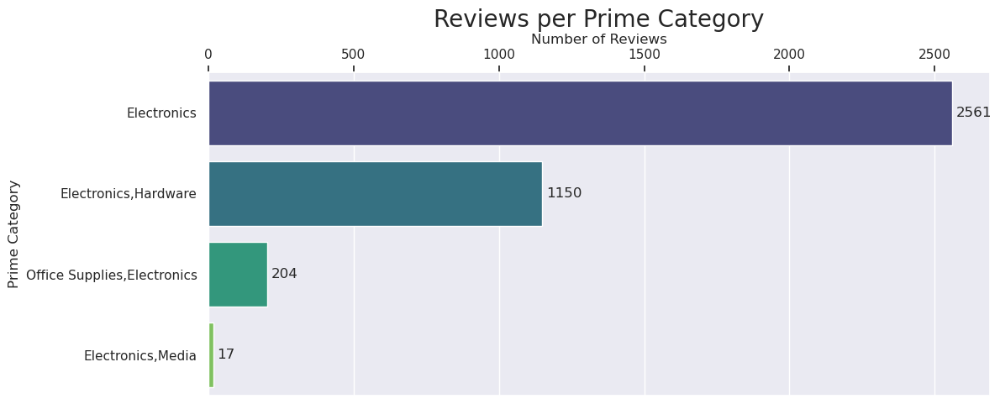

In [21]:
unique_categories = df_train['primaryCategories'].unique()
desired_categories = [cat for cat in unique_categories if "Electronics" in cat]
primeCat_data = df_train[df_train['primaryCategories'].isin(desired_categories)]

plt.figure(figsize=(12, 5))
ax=sns.countplot(y='primaryCategories', data=primeCat_data, hue='primaryCategories', palette='viridis')

for container in ax.containers:
    ax.bar_label(container, fmt='%d', label_type='edge', fontsize=12, padding=3)

ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')

plt.xlabel('Number of Reviews')
plt.ylabel('Prime Category')
plt.title('Reviews per Prime Category',fontsize=20)
plt.show()

#### Sentiment Count by Category

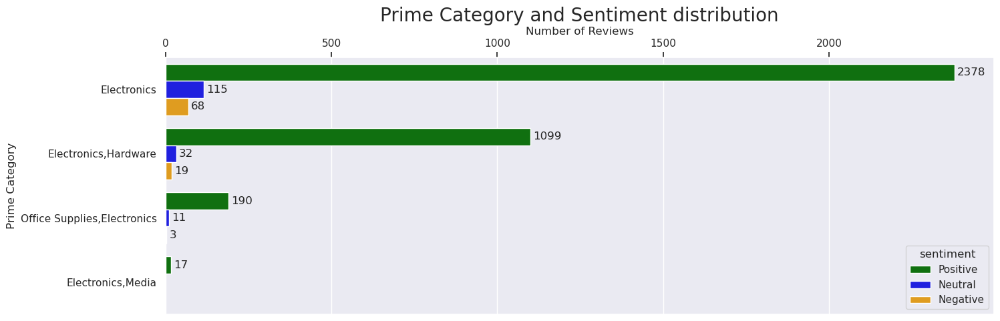

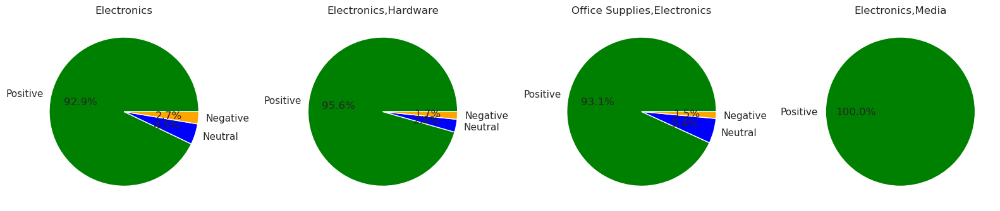

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define custom colors for sentiment categories
sentiment_colors = {
    'Positive': 'green',
    'Neutral': 'blue',
    'Negative': 'orange'
}

# Create the countplot
plt.figure(figsize=(16, 5))
ax = sns.countplot(y='primaryCategories', data=df_train, hue=df_train['sentiment'],
                   palette=sentiment_colors)  # Use the custom color palette

# Add labels to each bar in the countplot
for container in ax.containers:
    ax.bar_label(container, fmt='%d', label_type='edge', fontsize=12, padding=3)

# Adjust axis properties
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')

# Set labels and title
plt.xlabel('Number of Reviews')
plt.ylabel('Prime Category')
plt.title('Prime Category and Sentiment distribution', fontsize=20)
plt.show()

# Create pie charts for each unique category
unique_categories = df_train['primaryCategories'].unique()
fig, axes = plt.subplots(1, len(unique_categories), figsize=(16, 5))

for i, category in enumerate(unique_categories):
    category_data = df_train[df_train['primaryCategories'] == category]
    sentiment_counts = category_data['sentiment'].value_counts()

    # Define custom colors for each sentiment
    colors = [sentiment_colors.get(sentiment, 'gray') for sentiment in sentiment_counts.index]

    # Plot the pie chart with custom colors
    axes[i].pie(sentiment_counts, labels=sentiment_counts.index, autopct='%1.1f%%', colors=colors)
    axes[i].set_title(f"{category}")

# Adjust layout and show the pie charts
plt.tight_layout()
plt.show()


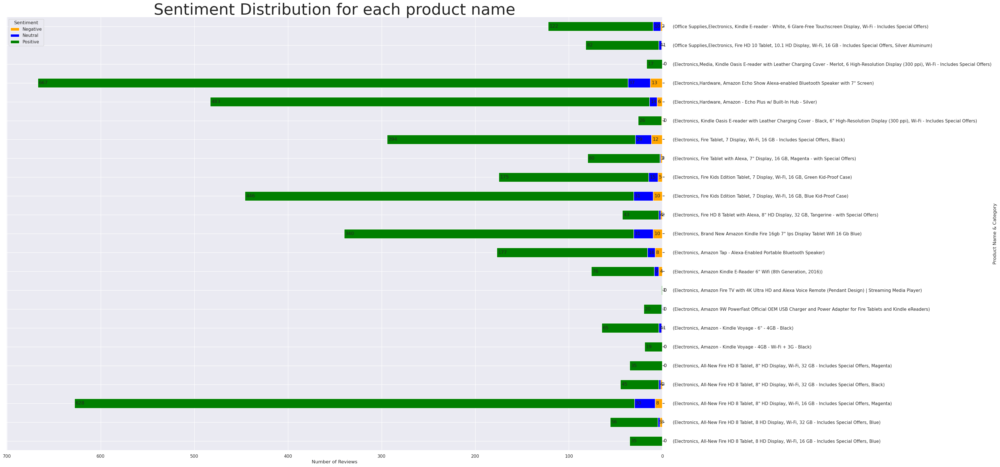

In [23]:
import matplotlib.pyplot as plt
import pandas as pd

# Define custom colors for sentiment categories
sentiment_colors = {
    'Positive': 'green',
    'Neutral': 'blue',
    'Negative': 'orange'
}

# Group the data for the bar plot
df_pivot = df_train.groupby(['primaryCategories', 'name', 'sentiment']).size().unstack(fill_value=0)

# Plot the stacked bar chart
ax = df_pivot.plot(kind='barh', stacked=True, figsize=(30, 20), color=[sentiment_colors.get(sentiment, 'gray') for sentiment in df_pivot.columns])

# Add labels to the bars
for container in ax.containers:
    ax.bar_label(container, fmt='%d', label_type='edge', fontsize=12, padding=3)

# Adjust axis properties
ax.yaxis.set_ticks_position('right')
ax.yaxis.set_label_position('right')
ax.invert_xaxis()

# Adjust tick parameters
ax.tick_params(axis='y', pad=20)

# Set labels and title
plt.ylabel('Product Name & Category')
plt.xlabel('Number of Reviews')
plt.title('Sentiment Distribution for each product name', fontsize=40)
plt.legend(title='Sentiment')

# Show the plot
plt.show()


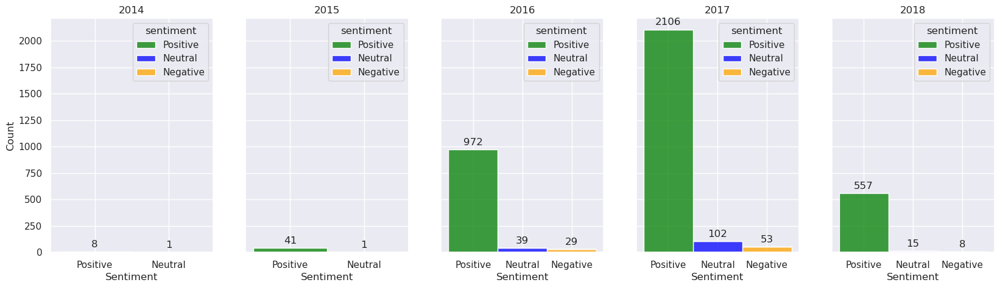

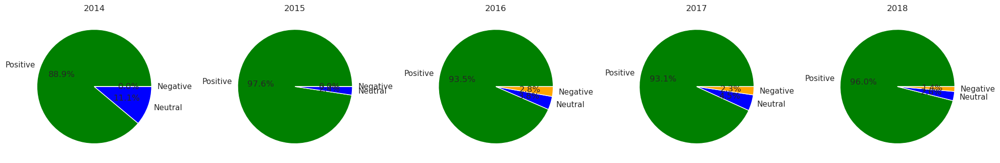

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define custom colors for sentiment categories
sentiment_colors = {
    'Positive': 'green',
    'Neutral': 'blue',
    'Negative': 'orange'
}

# Add 'year' column to df_train (assuming Date is already a datetime column)
df_train['year'] = df_train['Date'].dt.year
unique_years = sorted(df_train['year'].unique())

# Create subplots for each year
fig, axes = plt.subplots(nrows=1, ncols=len(unique_years), figsize=(len(unique_years) * 4, 5), sharey=True)

# Define the desired order of sentiments
sentiment_order = ['Positive', 'Neutral', 'Negative']

# Plot histogram for each year
for i, year in enumerate(unique_years):
    df_train['sentiment'] = pd.Categorical(df_train['sentiment'], ['Positive', 'Neutral', 'Negative'])
    ax = axes[i] if len(unique_years) > 1 else axes
    sns.histplot(data=df_train[df_train['year'] == year], x='sentiment', hue='sentiment', multiple='stack',
                 palette=sentiment_colors, ax=ax)  # Set the fixed order of sentimentsorder=sentiment_order
    ax.set_title(f'{year}')
    ax.set_xlabel('Sentiment')
    ax.set_ylabel('Count' if i == 0 else "")

    # Add labels to bars
    for container in ax.containers:
        labels = [f'{int(val)}' if val > 0 else '' for val in container.datavalues]
        ax.bar_label(container, labels=labels, label_type='edge', fontsize=12, padding=3)

# Show the plot
plt.show()

# Create pie charts for each unique year
unique_years = sorted(df_train['year'].unique())

fig, axes = plt.subplots(1, len(unique_years), figsize=(len(unique_years) * 4, 5))


# Plot pie chart for each year
for i, year in enumerate(unique_years):
    year_data = df_train[df_train['year'] == year]
    sentiment_counts = year_data['sentiment'].value_counts()

    # Map custom colors based on sentiment
    colors = [sentiment_colors.get(sentiment, 'gray') for sentiment in sentiment_counts.index]

    axes[i].pie(sentiment_counts, labels=sentiment_counts.index, autopct='%1.1f%%', colors=colors)
    axes[i].set_title(f"{year}")

# Adjust layout and show the pie charts
plt.tight_layout()
plt.show()



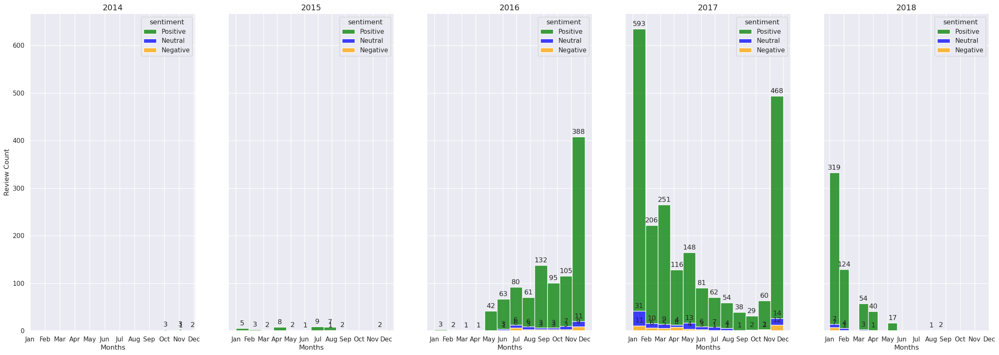

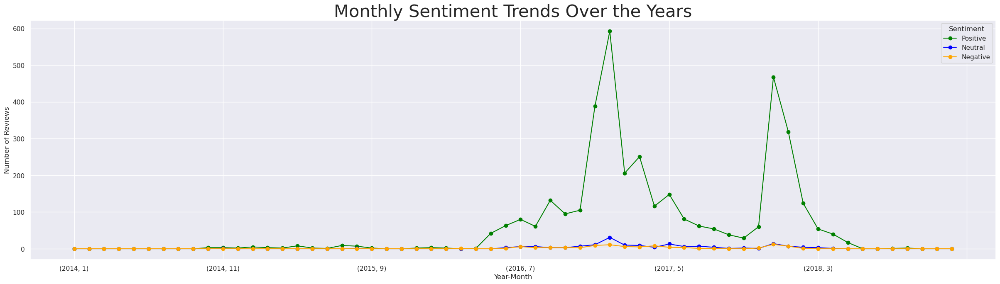

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

# Define custom colors for sentiment categories
sentiment_colors = {
    'Positive': 'green',
    'Neutral': 'blue',
    'Negative': 'orange'
}

monthNames = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
unique_years = sorted(df_train['year'].unique())

# Create subplots for each year
fig, axes = plt.subplots(nrows=1, ncols=len(unique_years), figsize=(30, len(unique_years) * 2), sharey=True)

for i, year in enumerate(unique_years):
    ax = axes[i] if len(unique_years) > 1 else axes
    year_data = df_train[df_train['year'] == year]

    # Plot histograms for monthly sentiment distribution with custom colors
    sns.histplot(data=year_data, x='month', hue='sentiment', multiple='stack', bins=12,
                 palette=sentiment_colors, ax=ax)  # Use custom color palette

    ax.set_title(f'{year}', fontsize=14)
    ax.set_xlabel('Months')
    ax.set_xticks(range(1, 13))
    ax.set_xticklabels(monthNames)
    ax.set_ylabel('Review Count' if i == 0 else "")

    # Add labels to the bars
    for container in ax.containers:
        labels = [f'{int(val)}' if val > 0 else '' for val in container.datavalues]
        ax.bar_label(container, labels=labels, label_type='edge', fontsize=12, padding=3)

plt.show()


# Group and pivot the monthly sentiment data
df_train['month'] = df_train['Date'].dt.month
monthly_sentiment = df_train.groupby(['year', 'month', 'sentiment']).size().reset_index(name='count')
pivot_month = monthly_sentiment.pivot_table(index=['year', 'month'], columns='sentiment', values='count', fill_value=0)

# Plot the line plot with custom colors
pivot_month.plot(figsize=(30, len(unique_years) * 1.5), marker='o', color=[sentiment_colors[s] for s in ['Positive', 'Neutral', 'Negative']])
plt.title("Monthly Sentiment Trends Over the Years", size=30)
plt.ylabel("Number of Reviews")
plt.xlabel("Year-Month")
plt.legend(title='Sentiment')
plt.show()


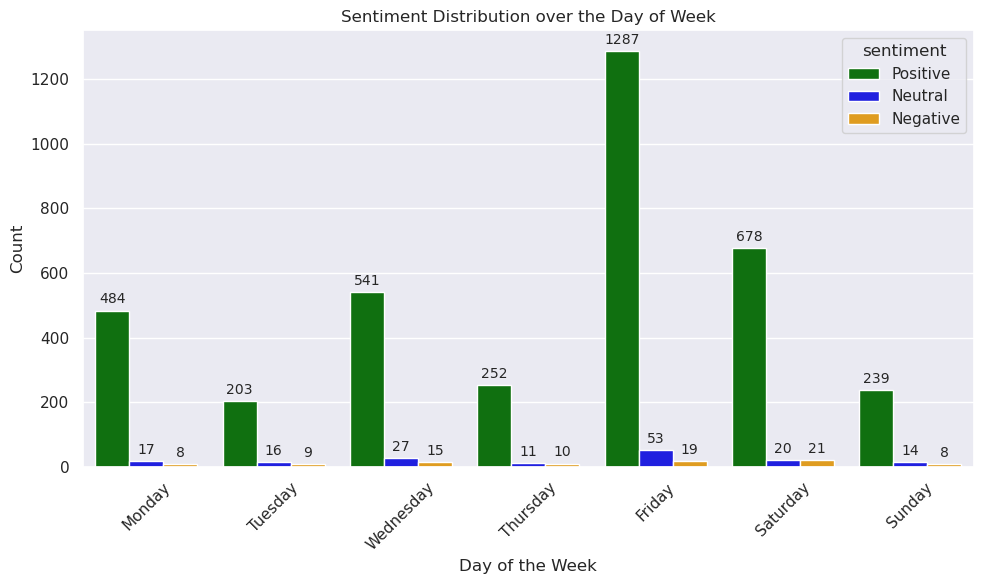

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define custom colors for sentiment categories
sentiment_colors = {
    'Positive': 'green',
    'Neutral': 'blue',
    'Negative': 'orange'
}

# Add 'dayofweek' column to df_train
df_train['dayofweek'] = df_train['Date'].dt.day_name()
ordered_days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Create the countplot with custom color palette
plt.figure(figsize=(10, 6))
ax = sns.countplot(data=df_train, x='dayofweek', hue='sentiment', palette=sentiment_colors, order=ordered_days)

# Set titles and labels
plt.title("Sentiment Distribution over the Day of Week")
plt.xlabel("Day of the Week")
plt.ylabel("Count")
plt.xticks(rotation=45)

# Add labels to the bars
for container in ax.containers:
    ax.bar_label(container, fmt='%d', padding=3, fontsize=10)

# Adjust layout for better appearance
plt.tight_layout()
plt.show()


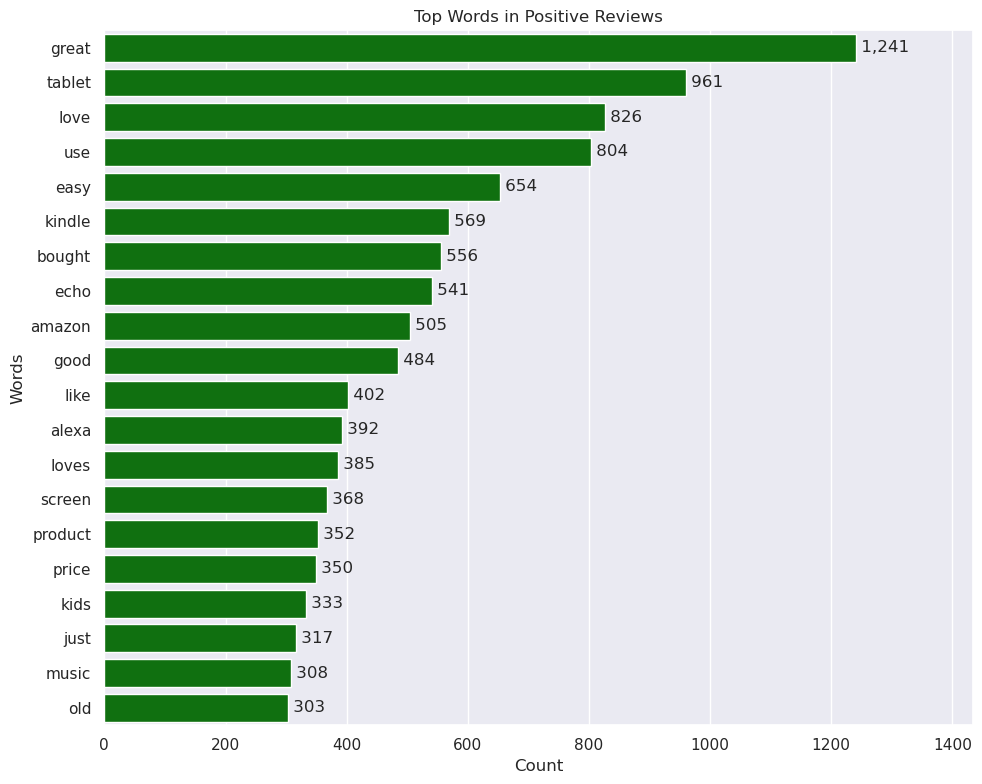

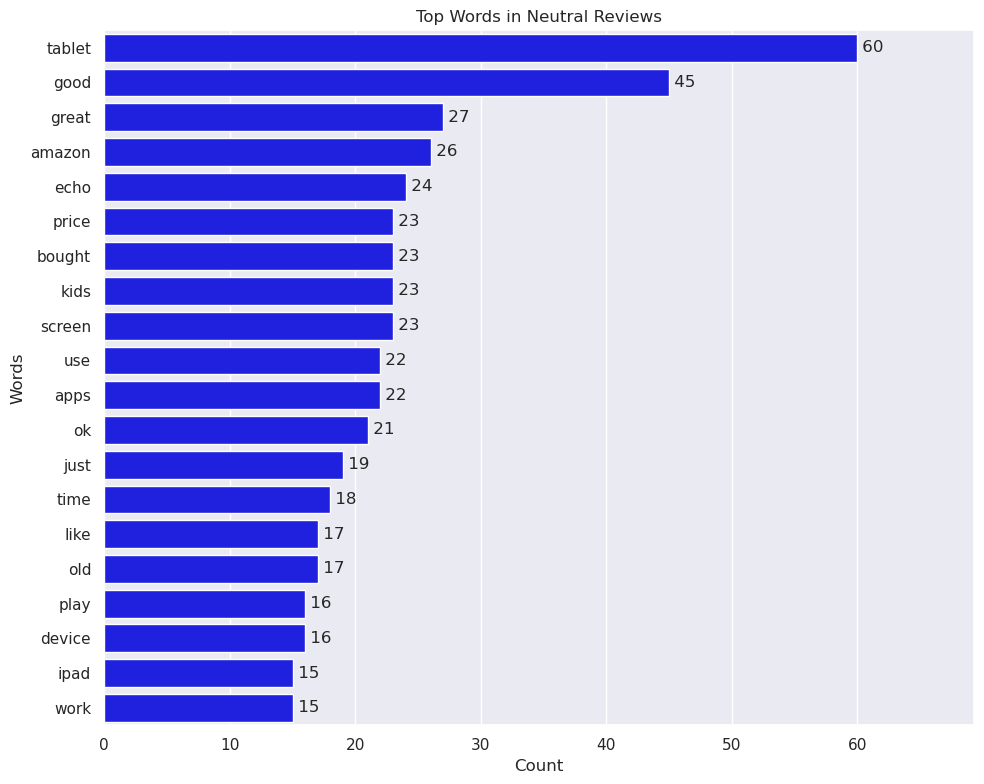

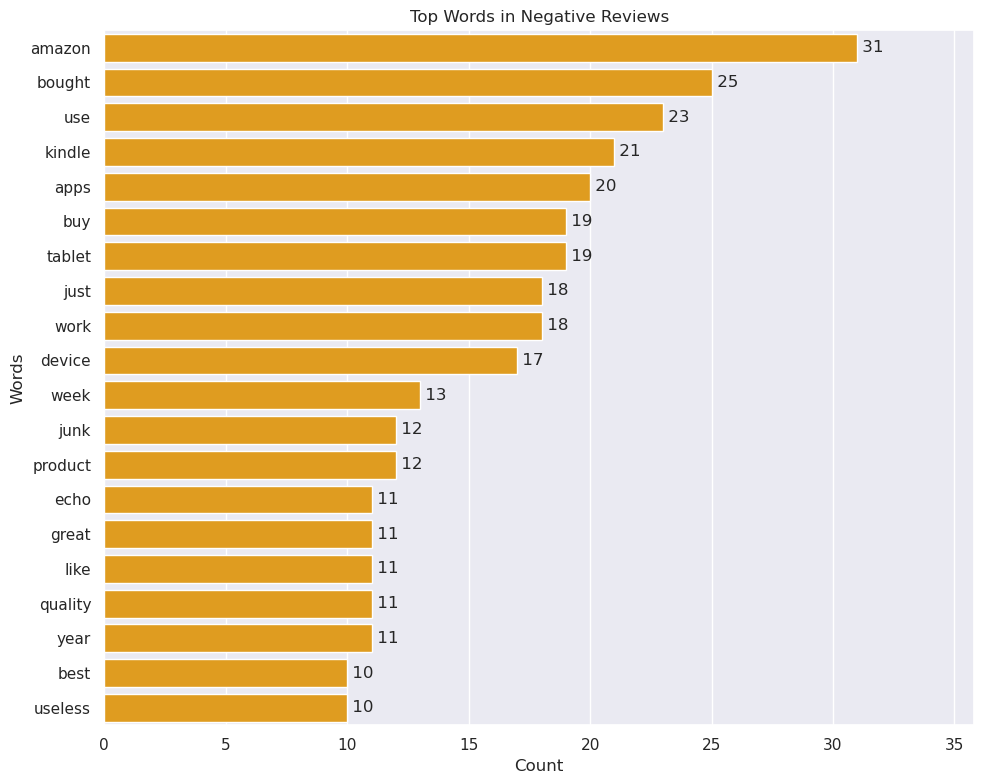

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd

# Define custom colors for sentiment categories
sentiment_colors = {
    'Positive': 'green',
    'Neutral': 'blue',
    'Negative': 'orange'
}

# Loop through each sentiment and plot the top words
for sentiment in df_train['sentiment'].unique():
    # Create figure with larger size for better readability
    plt.figure(figsize=(10, 8))
    
    vectorizer = CountVectorizer(stop_words='english', max_features=20)
    text_data = df_train[df_train['sentiment'] == sentiment]['reviews.text'].fillna("")
    X = vectorizer.fit_transform(text_data)
    word_freq = pd.DataFrame({'word': vectorizer.get_feature_names_out(), 
                            'count': X.toarray().sum(axis=0)})
    
    # Sort the data
    word_freq_sorted = word_freq.sort_values(by='count', ascending=False)
    
    # Create the barplot
    ax = sns.barplot(data=word_freq_sorted, 
                    x='count', 
                    y='word',
                    color=sentiment_colors.get(sentiment, 'gray'))
    
    # Add count labels to the bars
    for i, v in enumerate(word_freq_sorted['count']):
        ax.text(v, i, f' {v:,}', va='center')
    
    # Adjust layout
    plt.title(f"Top Words in {sentiment} Reviews")
    plt.xlabel("Count")
    plt.ylabel("Words")
    
    # Add some padding to x-axis to prevent label cutoff
    current_xlim = plt.xlim()
    plt.xlim(0, current_xlim[1] * 1.1)  # Add 10% padding
    
    plt.tight_layout()
    plt.show()

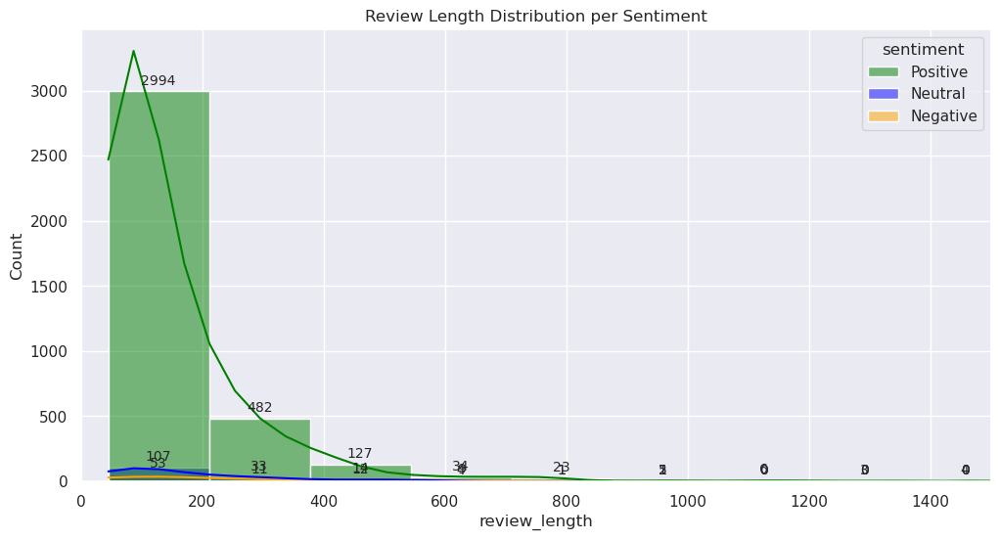

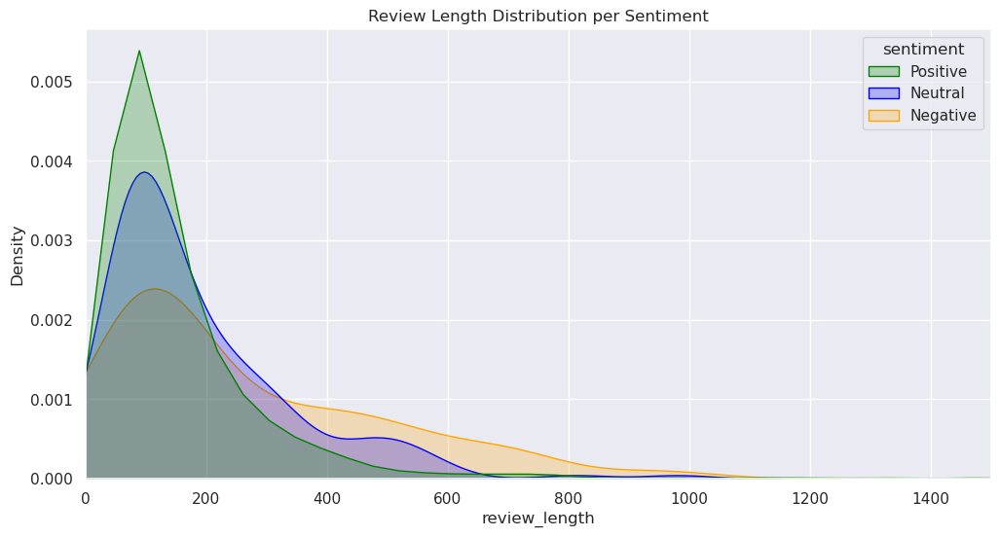

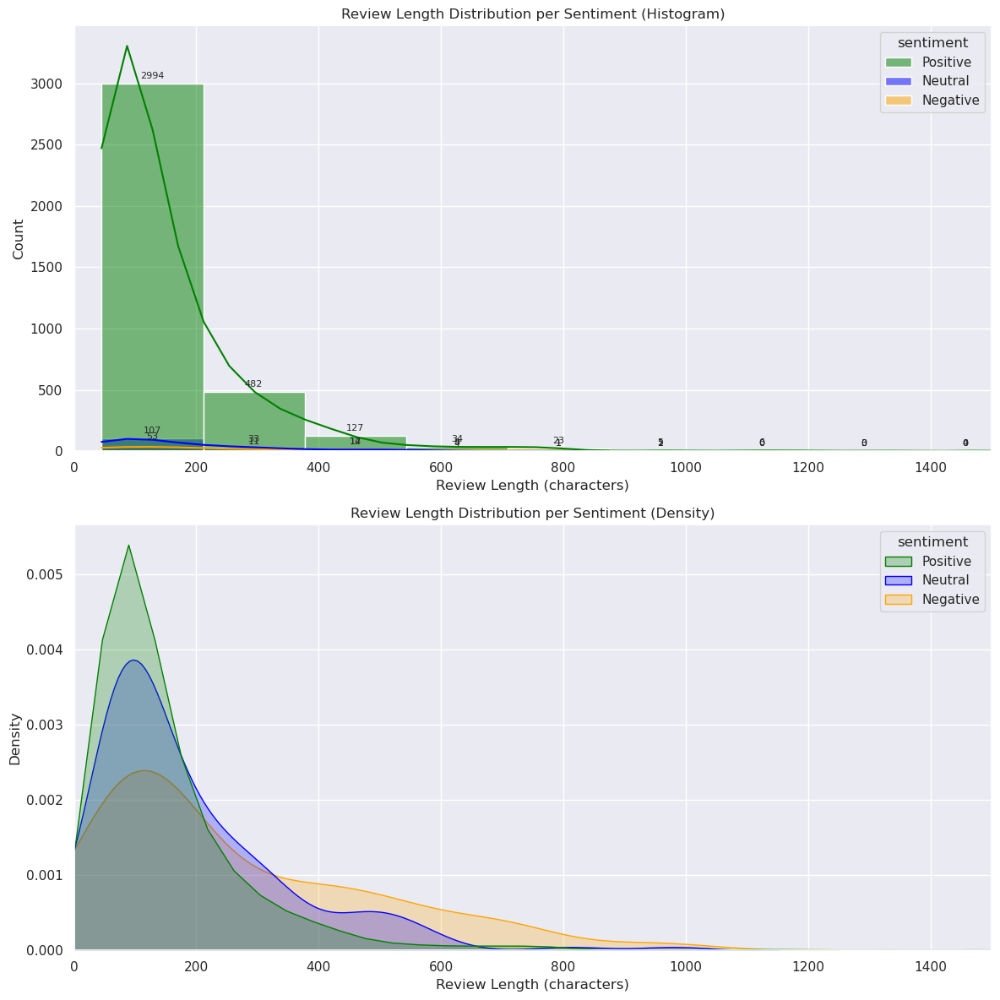

In [28]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define sentiment colors
sentiment_colors = {
    'Positive': 'green',
    'Neutral': 'blue',
    'Negative': 'orange'
}

# Calculate review lengths
df_train['review_length'] = df_train['reviews.text'].fillna("").apply(len)

# First plot: Histogram with KDE
plt.figure(figsize=(12, 6))
ax = sns.histplot(data=df_train, 
                 x='review_length', 
                 hue='sentiment', 
                 kde=True, 
                 bins=50,
                 palette=sentiment_colors)

# Add value labels
for container in ax.containers:
    ax.bar_label(container, fmt='%d', padding=3, fontsize=10)

plt.xlim(0, 1500)
plt.title("Review Length Distribution per Sentiment")
plt.show()

# Second plot: KDE with fill
plt.figure(figsize=(12, 6))
sns.kdeplot(data=df_train, 
           x='review_length', 
           hue='sentiment', 
           fill=True, 
           common_norm=False, 
           palette=sentiment_colors)

plt.xlim(0, 1500)
plt.title("Review Length Distribution per Sentiment")
plt.show()

# Optional: Add more customization
def plot_review_length_distribution(df, colors=sentiment_colors):
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))
    
    # Histogram with KDE
    sns.histplot(data=df, 
                x='review_length', 
                hue='sentiment', 
                kde=True, 
                bins=50,
                palette=colors,
                ax=ax1)
    
    # Add value labels to histogram
    for container in ax1.containers:
        ax1.bar_label(container, fmt='%d', padding=3, fontsize=8)
    
    ax1.set_xlim(0, 1500)
    ax1.set_title("Review Length Distribution per Sentiment (Histogram)")
    ax1.set_xlabel("Review Length (characters)")
    ax1.set_ylabel("Count")
    
    # KDE plot
    sns.kdeplot(data=df, 
               x='review_length', 
               hue='sentiment', 
               fill=True, 
               common_norm=False, 
               palette=colors,
               ax=ax2)
    
    ax2.set_xlim(0, 1500)
    ax2.set_title("Review Length Distribution per Sentiment (Density)")
    ax2.set_xlabel("Review Length (characters)")
    ax2.set_ylabel("Density")
    
    # Adjust layout
    plt.tight_layout()
    plt.show()

# Call the function with your data
plot_review_length_distribution(df_train)

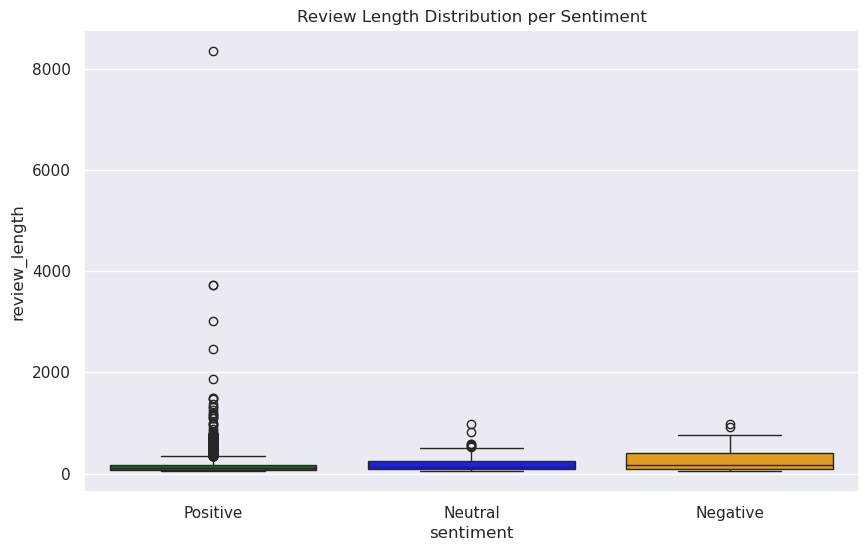

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define custom colors for sentiment categories
sentiment_colors = {
    'Positive': 'green',
    'Neutral': 'blue',
    'Negative': 'orange'
}

# Assuming 'review_length' column already exists in df_train
# If it doesn't, uncomment the following line to create it:
df_train['review_length'] = df_train['reviews.text'].fillna("").apply(len)

# Create the boxplot with custom color palette
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_train, x='sentiment', y='review_length', palette=sentiment_colors)

# Set title
plt.title("Review Length Distribution per Sentiment")

# Show the plot
plt.show()


#### WordCloud for Text Visualization

Visualize the most commonly used words as per each sentiment

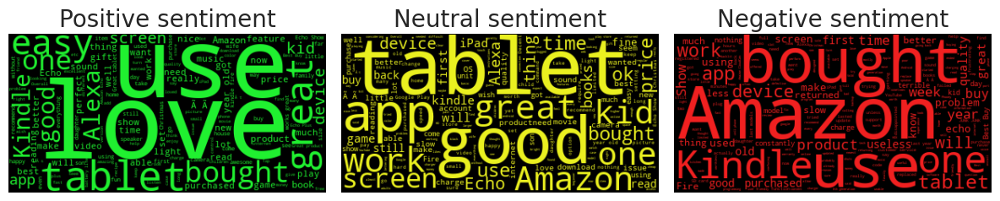

In [30]:
def TextVisualize(df,col):

  original_palette = {'#20f030':'Positive','#eaf020':'Neutral','#f02020':'Negative'}
  color_palette = {v: k for k, v in original_palette.items()}
  num_sentiments = df['sentiment'].nunique()
  plt.figure(figsize=(4*num_sentiments,3))

  for sentiment in df['sentiment'].unique():
    input = df[df['sentiment']==sentiment][col].str.cat(sep=' ')

    wordcloud = WordCloud(background_color="black",color_func=lambda *args, **kwargs:color_palette.get(sentiment, '#000000')).generate(input)
    # Display the word cloud
    plt.subplot(1, num_sentiments, df['sentiment'].unique().tolist().index(sentiment)+1)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(f'{sentiment} sentiment', size='20')

  plt.tight_layout()
  plt.show()

TextVisualize(df_train,'reviews.text')


### Pre-processing Data

1) **Regex clean**:

Reviews often contains noise, we remove any unwanted phrases that dont add context to the reviews.

2) **Stop words** (Optional):

Common words like "the," "is," "and," "but," "not," "very," might not carry significant meaning. But in our case we might need to understand the context of the review (In case of LSTM / Transformers), So need to keep one column with and a column without stop words


#### Cleaning Non ASCII, URLs, Symbols, numbers, special charactes etc.

In [31]:
def regex_clean_text(text):
    cleaned_text = re.sub(r'[^\x00-\x7F]+', '', text)    # Line 1: Removes all non-ASCII characters
    cleaned_text=re.sub(r'\bhttps?\S*\b', '', text,flags=re.IGNORECASE)    # Line 2: Removes URLs from the text
    cleaned_text = re.sub(r'\r\r', ' ', cleaned_text)    # Line 3: Replaces double carriage returns with a space
    cleaned_text = re.sub(r'[^\w\s]', '', cleaned_text)    # Line 4: Removes all special characters and punctuation    # \w: Matches word characters (letters, digits, underscores)    # \s: Matches whitespace
    cleaned_text = re.sub(r'\s+', ' ', cleaned_text)    # Line 5: Replaces multiple spaces with a single space
    cleaned_text = cleaned_text.strip()    # Line 6: Removes leading and trailing whitespace
    return cleaned_text

#### Removing Stopwords

In [32]:
stop_words = set(nltk.corpus.stopwords.words('english'))

def remove_stopwords(text):
  words=text.split()
  filtered_words = [word for word in words if word.lower() not in stop_words]
  return ' '.join(filtered_words)

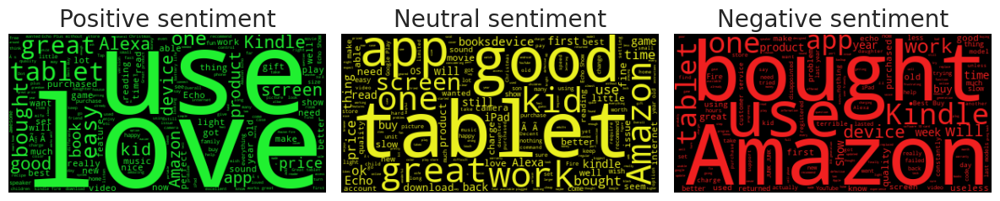




AFTER REGEX CLEANING:




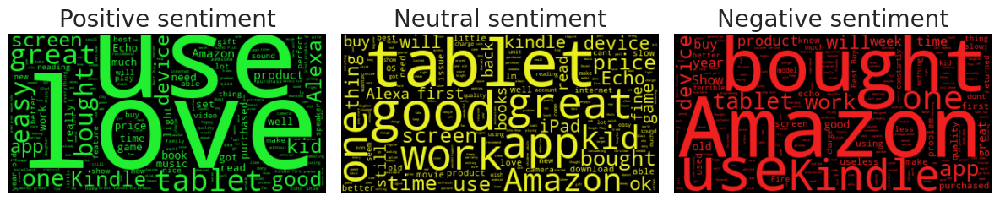

In [33]:
TextVisualize(df_train,'reviews.text')

df_train['reviews.text.regexcleaned'] = df_train['reviews.text'].apply(lambda text: regex_clean_text(text))
print('\n\n\nAFTER REGEX CLEANING:\n\n')

TextVisualize(df_train,'reviews.text.regexcleaned')

In [34]:
df_train['cleaned.reviews.text'] = df_train['reviews.text.regexcleaned'].apply(lambda x: remove_stopwords(x))

#### Combining Review Text and Title for improving model context

Customers have given a brief title of each review, summarizing their overall experience in short. The title captures a lot of the overall sentiment and gives important info to us, So it is ideal we use it for our analysis.

We need to test 3 approaches to this:-

1.   Train model seperately each with text and tune it using title
1.   Combine both text and title into a new dataframe column and train one model
2.   Weighted mechanism to prioritize text over title during processing



In [35]:
df_train['combined_reviews'] = df_train['reviews.title'] + " " + df_train['reviews.text.regexcleaned']

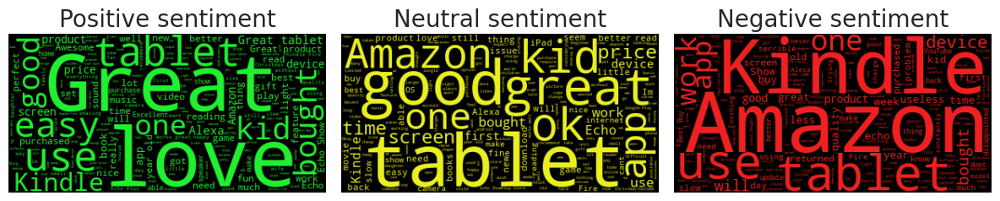




AFTER REGEX CLEANING:




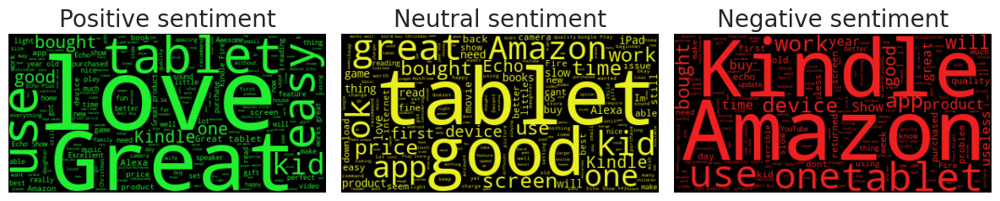

In [36]:
TextVisualize(df_train,'combined_reviews')

df_train['combined_reviews.regexcleaned'] = df_train['combined_reviews'].apply(lambda text: regex_clean_text(text))
print('\n\n\nAFTER REGEX CLEANING:\n\n')

TextVisualize(df_train,'combined_reviews.regexcleaned')

In [37]:
df_train['cleaned.combined_reviews'] = df_train['combined_reviews.regexcleaned'].apply(lambda x: remove_stopwords(x))

In [38]:
df_train.columns

Index(['name', 'brand', 'categories', 'primaryCategories', 'reviews.date',
       'reviews.text', 'reviews.title', 'sentiment', 'Date', 'year', 'month',
       'dayofweek', 'review_length', 'reviews.text.regexcleaned',
       'cleaned.reviews.text', 'combined_reviews',
       'combined_reviews.regexcleaned', 'cleaned.combined_reviews'],
      dtype='object')

In [39]:
# renaming columns for clarity
df_train.rename(columns={'combined_reviews.regexcleaned': 'combined_review_cleaned', 
                         'cleaned.combined_reviews': 'combined_review_cleaned_stopwords_removed',
                         'reviews.text.regexcleaned':'review_text_cleaned',
                         'cleaned.reviews.text':'review_text_cleaned_stopwords_removed'}, inplace=True)

In [40]:
df_train.columns

Index(['name', 'brand', 'categories', 'primaryCategories', 'reviews.date',
       'reviews.text', 'reviews.title', 'sentiment', 'Date', 'year', 'month',
       'dayofweek', 'review_length', 'review_text_cleaned',
       'review_text_cleaned_stopwords_removed', 'combined_reviews',
       'combined_review_cleaned', 'combined_review_cleaned_stopwords_removed'],
      dtype='object')

In [41]:
df_train.sentiment.value_counts()

sentiment
Positive    3684
Neutral      158
Negative      90
Name: count, dtype: int64

In [42]:
df_train

,name,brand,categories,primaryCategories,reviews.date,reviews.text,reviews.title,sentiment,Date,year,month,dayofweek,review_length,review_text_cleaned,review_text_cleaned_stopwords_removed,combined_reviews,combined_review_cleaned,combined_review_cleaned_stopwords_removed
0,"All-New Fire HD 8 Tablet, 8"" HD Display, Wi-Fi...",Amazon,"Electronics,iPad & Tablets,All Tablets,Fire Ta...",Electronics,2016-12-26T00:00:00.000Z,Purchased on Black FridayPros - Great Price (e...,Powerful tablet,Positive,2016-12-26 00:00:00+00:00,2016,12,Monday,409,Purchased on Black FridayPros Great Price even...,Purchased Black FridayPros Great Price even sa...,Powerful tablet Purchased on Black FridayPros ...,Powerful tablet Purchased on Black FridayPros ...,Powerful tablet Purchased Black FridayPros Gre...
1,Amazon - Echo Plus w/ Built-In Hub - Silver,Amazon,"Amazon Echo,Smart Home,Networking,Home & Tools...","Electronics,Hardware",2018-01-17T00:00:00.000Z,I purchased two Amazon in Echo Plus and two do...,Amazon Echo Plus AWESOME,Positive,2018-01-17 00:00:00+00:00,2018,1,Wednesday,601,I purchased two Amazon in Echo Plus and two do...,purchased two Amazon Echo Plus two dots plus f...,Amazon Echo Plus AWESOME I purchased two Amazo...,Amazon Echo Plus AWESOME I purchased two Amazo...,Amazon Echo Plus AWESOME purchased two Amazon ...
2,Amazon Echo Show Alexa-enabled Bluetooth Speak...,Amazon,"Amazon Echo,Virtual Assistant Speakers,Electro...","Electronics,Hardware",2017-12-20T00:00:00.000Z,Just an average Alexa option. Does show a few ...,Average,Neutral,2017-12-20 00:00:00+00:00,2017,12,Wednesday,81,Just an average Alexa option Does show a few t...,average Alexa option show things screen still ...,Average Just an average Alexa option Does show...,Average Just an average Alexa option Does show...,Average average Alexa option show things scree...
3,"Fire HD 10 Tablet, 10.1 HD Display, Wi-Fi, 16 ...",Amazon,"eBook Readers,Fire Tablets,Electronics Feature...","Office Supplies,Electronics",2017-08-04T00:00:00.000Z,"very good product. Exactly what I wanted, and ...",Greattttttt,Positive,2017-08-04 00:00:00+00:00,2017,8,Friday,63,very good product Exactly what I wanted and a ...,good product Exactly wanted good price,Greattttttt very good product Exactly what I w...,Greattttttt very good product Exactly what I w...,Greattttttt good product Exactly wanted good p...
4,"Brand New Amazon Kindle Fire 16gb 7"" Ips Displ...",Amazon,"Computers/Tablets & Networking,Tablets & eBook...",Electronics,2017-01-23T00:00:00.000Z,This is the 3rd one I've purchased. I've bough...,Very durable!,Positive,2017-01-23 00:00:00+00:00,2017,1,Monday,179,This is the 3rd one Ive purchased Ive bought o...,3rd one Ive purchased Ive bought one nieces ca...,Very durable! This is the 3rd one Ive purchase...,Very durable This is the 3rd one Ive purchased...,durable 3rd one Ive purchased Ive bought one n...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3927,Amazon - Echo Plus w/ Built-In Hub - Silver,Amazon,"Amazon Echo,Smart Home,Networking,Home & Tools...","Electronics,Hardware",2017-12-08T00:00:00.000Z,"ItâÃÃ´s fun for the family to play with, bu...",Fun toy,Positive,2017-12-08 00:00:00+00:00,2017,12,Friday,111,ItâÃÃs fun for the family to play with but it ...,ItâÃÃs fun family play may get boring newness ...,Fun toy ItâÃÃs fun for the family to play with...,Fun toy ItâÃÃs fun for the family to play with...,Fun toy ItâÃÃs fun family play may get boring ...
3928,"Amazon Kindle E-Reader 6"" Wifi (8th Generation...",Amazon,"Computers,Electronics Features,Tablets,Electro...",Electronics,2017-03-31T00:00:00.000Z,"I love the Kindle, it is a great product. It r...",Great Product,Positive,2017-03-31 00:00:00+00:00,2017,3,Friday,115,I love the Kindle it is a great product It red...,love Kindle great product reduces eye strain e...,Great Product I love the Kindle it is a great ...,Great Product I love the Kindle it is a great ...,Great Product love Kindle great product r

In [43]:
df_train.to_csv(f"sentiment_train.csv", index = False)

## Test Dataframe

In [44]:
df_test_new = pd.read_csv(f"test_data_hidden.csv")

In [45]:
df_test_new

,name,brand,categories,primaryCategories,reviews.date,reviews.text,reviews.title,sentiment
0,"Fire Tablet, 7 Display, Wi-Fi, 16 GB - Include...",Amazon,"Fire Tablets,Computers/Tablets & Networking,Ta...",Electronics,2016-05-23T00:00:00.000Z,Amazon kindle fire has a lot of free app and c...,very handy device,Positive
1,Amazon Echo Show Alexa-enabled Bluetooth Speak...,Amazon,"Computers,Amazon Echo,Virtual Assistant Speake...","Electronics,Hardware",2018-01-02T00:00:00.000Z,The Echo Show is a great addition to the Amazo...,Another winner from Amazon,Positive
2,"All-New Fire HD 8 Tablet, 8"" HD Display, Wi-Fi...",Amazon,"Electronics,iPad & Tablets,All Tablets,Fire Ta...",Electronics,2017-01-02T00:00:00.000Z,Great value from Best Buy. Bought at Christmas...,simple to use and reliable so far,Positive
3,"Brand New Amazon Kindle Fire 16gb 7"" Ips Displ...",Amazon,"Computers/Tablets & Networking,Tablets & eBook...",Electronics,2017-03-25T00:00:00.000Z,"I use mine for email, Facebook ,games and to g...",Love it!!!,Positive
4,Amazon Echo Show Alexa-enabled Bluetooth Speak...,Amazon,"Computers,Amazon Echo,Virtual Assistant Speake...","Electronics,Hardware",2017-11-15T00:00:00.000Z,This is a fantastic item & the person I bought...,Fantastic!,Positive
...,...,...,...,...,...,...,...,...
995,Amazon Echo Show Alexa-enabled Bluetooth Speak...,Amazon,"Computers,Amazon Echo,Virtual Assistant Speake...","Electronics,Hardware",2017-12-07T18:06:07.000Z,We love Alexa! Love being able to watch news b...,Awesome,Positive
996,Amazon Tap - Alexa-Enabled Portable Bluetooth ...,Amazon,"Amazon Echo,Home Theater & Audio,MP3 MP4 Playe...",Electronics,2017-01-23T00:00:00.000Z,Speaker is pretty loud and I love that I can t...,Good Bluetooth device,Neutral
997,"Fire HD 8 Tablet with Alexa, 8"" HD Display, 32...",Amazon,"Tablets,Fire Tablets,Computers & Tablets,All T...",Electronics,2017-01-18T00:00:00.000Z,Bought 2 of these for my 6 and 8 yr old and it...,good product for kids,Positive
998,"All-New Fire HD 8 Tablet, 8"" HD Display, Wi-Fi...",Amazon,"Electronics,iPad & Tablets,All Tablets,Fire Ta...",Electronics,2016-12-12T00:00:00.000Z,Was told by sales person I could come back in ...,Was misled on price match. Item is okay.,Positive


#### Imputing Null Values

In [46]:
print("Missing values in train_df:\n", df_test_new.isnull().sum())
# print("\nMissing values in test_df:\n", df_test.isnull().sum())

Missing values in train_df:
 name                 0
brand                0
categories           0
primaryCategories    0
reviews.date         0
reviews.text         0
reviews.title        3
sentiment            0
dtype: int64


In [47]:
df_test_new = df_test_new.dropna(subset=['reviews.title'])

In [48]:
print("Missing values in train_df:\n", df_test_new.isnull().sum())
# print("\nMissing values in test_df:\n", df_test.isnull().sum())

Missing values in train_df:
 name                 0
brand                0
categories           0
primaryCategories    0
reviews.date         0
reviews.text         0
reviews.title        0
sentiment            0
dtype: int64


In [49]:
print("Duplicates:", df_test_new.duplicated().sum())

Duplicates: 3


In [50]:
df_test_new.sentiment.value_counts(normalize=True)

sentiment
Positive    0.936810
Neutral     0.039117
Negative    0.024072
Name: proportion, dtype: float64

#### Cleaning Non ASCII, URLs, Symbols, numbers, special characters etc.

In [51]:
def regex_clean_text(text):
    cleaned_text = re.sub(r'[^\x00-\x7F]+', '', text)    # Line 1: Removes all non-ASCII characters
    cleaned_text=re.sub(r'\bhttps?\S*\b', '', text,flags=re.IGNORECASE)    # Line 2: Removes URLs from the text
    cleaned_text = re.sub(r'\r\r', ' ', cleaned_text)    # Line 3: Replaces double carriage returns with a space
    cleaned_text = re.sub(r'[^\w\s]', '', cleaned_text)    # Line 4: Removes all special characters and punctuation    # \w: Matches word characters (letters, digits, underscores)    # \s: Matches whitespace
    cleaned_text = re.sub(r'\s+', ' ', cleaned_text)    # Line 5: Replaces multiple spaces with a single space
    cleaned_text = cleaned_text.strip()    # Line 6: Removes leading and trailing whitespace
    return cleaned_text

#### Removing Stopwords

In [52]:
stop_words = set(nltk.corpus.stopwords.words('english'))

def remove_stopwords(text):
  words=text.split()
  filtered_words = [word for word in words if word.lower() not in stop_words]
  return ' '.join(filtered_words)

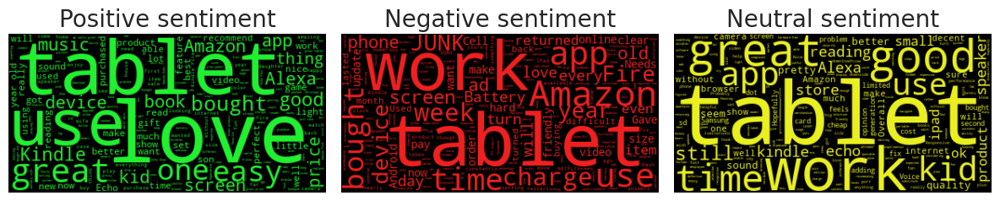




AFTER REGEX CLEANING:




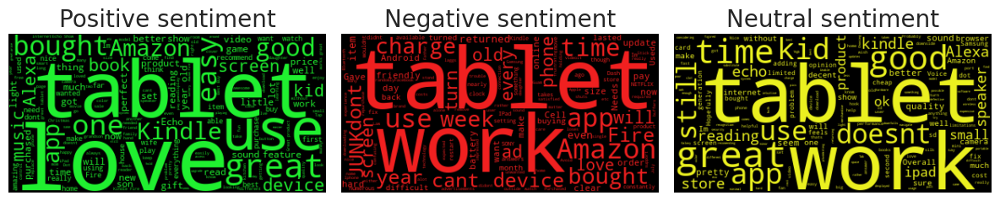

In [53]:
TextVisualize(df_test_new,'reviews.text')

df_test_new['reviews.text.regexcleaned'] = df_test_new['reviews.text'].apply(lambda text: regex_clean_text(text))
print('\n\n\nAFTER REGEX CLEANING:\n\n')

TextVisualize(df_test_new,'reviews.text.regexcleaned')

In [54]:
df_test_new['cleaned.reviews.text'] = df_test_new['reviews.text.regexcleaned'].apply(lambda x: remove_stopwords(x))

In [55]:
df_test_new['combined_reviews'] = df_test_new['reviews.title'] + " " + df_test_new['reviews.text.regexcleaned']

#### Combining Review Text and Title for improving model context

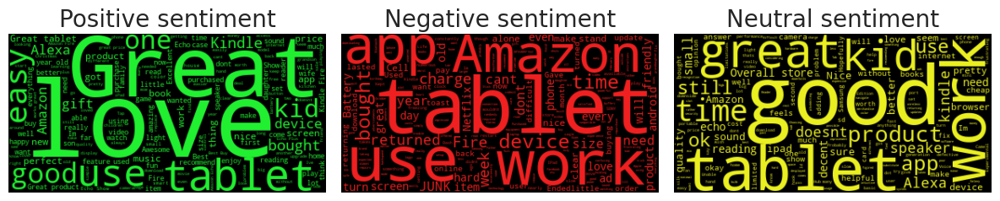




AFTER REGEX CLEANING:




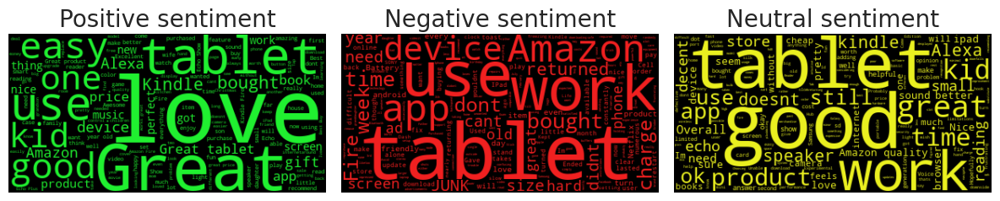

In [56]:
TextVisualize(df_test_new,'combined_reviews')

df_test_new['combined_reviews.regexcleaned'] = df_test_new['combined_reviews'].apply(lambda text: regex_clean_text(text))
print('\n\n\nAFTER REGEX CLEANING:\n\n')

TextVisualize(df_test_new,'combined_reviews.regexcleaned')

In [57]:
df_test_new['cleaned.combined_reviews'] = df_test_new['combined_reviews.regexcleaned'].apply(lambda x: remove_stopwords(x))

In [58]:
# renaming columns for clarity
df_test_new.rename(columns={'combined_reviews.regexcleaned': 'combined_review_cleaned', 
                         'cleaned.combined_reviews': 'combined_review_cleaned_stopwords_removed',
                         'reviews.text.regexcleaned':'review_text_cleaned',
                         'cleaned.reviews.text':'review_text_cleaned_stopwords_removed'}, inplace=True)

In [59]:
df_test = df_test_new.copy()

In [60]:
df_test

,name,brand,categories,primaryCategories,reviews.date,reviews.text,reviews.title,sentiment,review_text_cleaned,review_text_cleaned_stopwords_removed,combined_reviews,combined_review_cleaned,combined_review_cleaned_stopwords_removed
0,"Fire Tablet, 7 Display, Wi-Fi, 16 GB - Include...",Amazon,"Fire Tablets,Computers/Tablets & Networking,Ta...",Electronics,2016-05-23T00:00:00.000Z,Amazon kindle fire has a lot of free app and c...,very handy device,Positive,Amazon kindle fire has a lot of free app and c...,Amazon kindle fire lot free app used one wants...,very handy device Amazon kindle fire has a lot...,very handy device Amazon kindle fire has a lot...,handy device Amazon kindle fire lot free app u...
1,Amazon Echo Show Alexa-enabled Bluetooth Speak...,Amazon,"Computers,Amazon Echo,Virtual Assistant Speake...","Electronics,Hardware",2018-01-02T00:00:00.000Z,The Echo Show is a great addition to the Amazo...,Another winner from Amazon,Positive,The Echo Show is a great addition to the Amazo...,Echo Show great addition Amazon family Works l...,Another winner from Amazon The Echo Show is a ...,Another winner from Amazon The Echo Show is a ...,Another winner Amazon Echo Show great addition...
2,"All-New Fire HD 8 Tablet, 8"" HD Display, Wi-Fi...",Amazon,"Electronics,iPad & Tablets,All Tablets,Fire Ta...",Electronics,2017-01-02T00:00:00.000Z,Great value from Best Buy. Bought at Christmas...,simple to use and reliable so far,Positive,Great value from Best Buy Bought at Christmas ...,Great value Best Buy Bought Christmas sale,simple to use and reliable so far Great value ...,simple to use and reliable so far Great value ...,simple use reliable far Great value Best Buy B...
3,"Brand New Amazon Kindle Fire 16gb 7"" Ips Displ...",Amazon,"Computers/Tablets & Networking,Tablets & eBook...",Electronics,2017-03-25T00:00:00.000Z,"I use mine for email, Facebook ,games and to g...",Love it!!!,Positive,I use mine for email Facebook games and to go ...,use mine email Facebook games go line also loa...,Love it!!! I use mine for email Facebook games...,Love it I use mine for email Facebook games an...,Love use mine email Facebook games go line als...
4,Amazon Echo Show Alexa-enabled Bluetooth Speak...,Amazon,"Computers,Amazon Echo,Virtual Assistant Speake...","Electronics,Hardware",2017-11-15T00:00:00.000Z,This is a fantastic item & the person I bought...,Fantastic!,Positive,This is a fantastic item the person I bought i...,fantastic item person bought loves,Fantastic! This is a fantastic item the person...,Fantastic This is a fantastic item the person ...,Fantastic fantastic item person bought loves
...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,Amazon Echo Show Alexa-enabled Bluetooth Speak...,Amazon,"Computers,Amazon Echo,Virtual Assistant Speake...","Electronics,Hardware",2017-12-07T18:06:07.000Z,We love Alexa! Love being able to watch news b...,Awesome,Positive,We love Alexa Love being able to watch news br...,love Alexa Love able watch news briefings seei...,Awesome We love Alexa Love being able to watch...,Awesome We love Alexa Love being able to watch...,Awesome love Alexa Love able watch news briefi...
996,Amazon Tap - Alexa-Enabled Portable Bluetooth ...,Amazon,"Amazon Echo,Home Theater & Audio,MP3 MP4 Playe...",Electronics,2017-01-23T00:00:00.000Z,Speaker is pretty loud and I love that I can t...,Good Bluetooth device,Neutral,Speaker is pretty loud and I love that I can t...,Speaker pretty loud love take downside hold ho...,Good Bluetooth device Speaker is pretty loud a...,Good Bluetooth device Speaker is pretty loud a...,Good Bluetooth device Speaker pretty loud love...
997,"Fire HD 8 Tablet with Alexa, 8"" HD Display, 32...",Amazon,"Tablets,Fire Tablets,Computers & Tablets,All T...",Electronics,2017-01-18T00:00:00.000Z,Bought 2 of these for my 6 and 8 yr old and it...,good product for kids,Positive,Bought 2 of these for my 6 and 8 yr old and it...,Bought 2 6 8 yr old said came 32gb storage act...,good product for kids Bought 

In [61]:
df_test.to_csv(f"sentiment_test.csv", index = False)

In [62]:
import warnings
warnings.filterwarnings('ignore')

# Training a Neural Network From Scratch

## 1. SBERT + SMOTE + Neural Network

Creating embeddings...


Batches:   0%|          | 0/123 [00:00<?, ?it/s]

Original dataset shape: {0: 90, 1: 158, 2: 3684}
Resampled dataset shape: {0: 3684, 1: 3684, 2: 3684}


2025-05-04 02:51:06.696421: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 20380 MB memory:  -> device: 0, name: NVIDIA L4, pci bus id: 0000:9f:00.0, compute capability: 8.9
2025-05-04 02:51:06.698766: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 20750 MB memory:  -> device: 1, name: NVIDIA L4, pci bus id: 0000:a1:00.0, compute capability: 8.9
2025-05-04 02:51:06.700933: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 20750 MB memory:  -> device: 2, name: NVIDIA L4, pci bus id: 0000:a3:00.0, compute capability: 8.9
2025-05-04 02:51:06.702943: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:3 with 20750 MB memory:  -> device: 3, name: NVIDIA L4, pci bus id: 0000:a5:00.0, compute capability: 8.9
2025

Epoch 1/100


I0000 00:00:1746327069.413927    2627 service.cc:146] XLA service 0x7f42f00064b0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1746327069.414052    2627 service.cc:154]   StreamExecutor device (0): NVIDIA L4, Compute Capability 8.9
I0000 00:00:1746327069.414058    2627 service.cc:154]   StreamExecutor device (1): NVIDIA L4, Compute Capability 8.9
I0000 00:00:1746327069.414063    2627 service.cc:154]   StreamExecutor device (2): NVIDIA L4, Compute Capability 8.9
I0000 00:00:1746327069.414068    2627 service.cc:154]   StreamExecutor device (3): NVIDIA L4, Compute Capability 8.9
I0000 00:00:1746327069.414072    2627 service.cc:154]   StreamExecutor device (4): NVIDIA L4, Compute Capability 8.9
I0000 00:00:1746327069.414076    2627 service.cc:154]   StreamExecutor device (5): NVIDIA L4, Compute Capability 8.9
I0000 00:00:1746327069.414079    2627 service.cc:154]   StreamExecutor device (6): NVIDIA L4, Compute Capability 8.9
I0000 00:00:

 73/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4630 - loss: 2.2839

I0000 00:00:1746327072.400649    2627 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5571 - loss: 2.0334

173/173 ━━━━━━━━━━━━━━━━━━━━ 8s 18ms/step - accuracy: 0.5578 - loss: 2.0316 - learning_rate: 0.0010
Epoch 2/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8681 - loss: 1.2422

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8682 - loss: 1.2418 - learning_rate: 0.0010
Epoch 3/100
163/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9383 - loss: 1.0232

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9386 - loss: 1.0212 - learning_rate: 0.0010
Epoch 4/100
149/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9580 - loss: 0.9011

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9580 - loss: 0.8983 - learning_rate: 0.0010
Epoch 5/100
155/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9650 - loss: 0.8094

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9649 - loss: 0.8081 - learning_rate: 0.0010
Epoch 6/100
167/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9703 - loss: 0.7308

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9703 - loss: 0.7298 - learning_rate: 0.0010
Epoch 7/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9746 - loss: 0.6499

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9746 - loss: 0.6498 - learning_rate: 0.0010
Epoch 8/100
170/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9743 - loss: 0.6010

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9743 - loss: 0.6005 - learning_rate: 0.0010
Epoch 9/100
167/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9791 - loss: 0.5288

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9791 - loss: 0.5282 - learning_rate: 0.0010
Epoch 10/100
151/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9721 - loss: 0.5075

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9719 - loss: 0.5066 - learning_rate: 0.0010
Epoch 11/100
168/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9718 - loss: 0.4704

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9720 - loss: 0.4697 - learning_rate: 0.0010
Epoch 12/100
152/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9783 - loss: 0.4198

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9784 - loss: 0.4184 - learning_rate: 0.0010
Epoch 13/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9833 - loss: 0.3758

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9833 - loss: 0.3757 - learning_rate: 0.0010
Epoch 14/100
155/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9773 - loss: 0.3698

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9773 - loss: 0.3689 - learning_rate: 0.0010
Epoch 15/100
151/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9783 - loss: 0.3406

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9783 - loss: 0.3398 - learning_rate: 0.0010
Epoch 16/100
164/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9773 - loss: 0.3225

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9774 - loss: 0.3222 - learning_rate: 0.0010
Epoch 17/100
166/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9820 - loss: 0.3032

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9820 - loss: 0.3031 - learning_rate: 0.0010
Epoch 18/100
170/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9773 - loss: 0.2931

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9773 - loss: 0.2931 - learning_rate: 0.0010
Epoch 19/100
154/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9773 - loss: 0.2870

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9774 - loss: 0.2872 - learning_rate: 0.0010
Epoch 20/100
155/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9808 - loss: 0.2815

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9809 - loss: 0.2805 - learning_rate: 0.0010
Epoch 21/100
156/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9826 - loss: 0.2576

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9823 - loss: 0.2586 - learning_rate: 0.0010
Epoch 22/100
150/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9812 - loss: 0.2598

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9812 - loss: 0.2596 - learning_rate: 0.0010
Epoch 23/100
172/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9847 - loss: 0.2392

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9846 - loss: 0.2393 - learning_rate: 0.0010
Epoch 24/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9803 - loss: 0.2596 - learning_rate: 0.0010
Epoch 25/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9813 - loss: 0.2491 - learning_rate: 0.0010
Epoch 26/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9819 - loss: 0.2427 - learning_rate: 0.0010
Epoch 27/100
164/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9812 - loss: 0.2498

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9813 - loss: 0.2492 - learning_rate: 0.0010
Epoch 28/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9787 - loss: 0.2477 - learning_rate: 0.0010
Epoch 29/100
166/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9843 - loss: 0.2258

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9844 - loss: 0.2257 - learning_rate: 0.0010
Epoch 30/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9755 - loss: 0.2470 - learning_rate: 0.0010
Epoch 31/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9828 - loss: 0.2270 - learning_rate: 0.0010
Epoch 32/100
161/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9891 - loss: 0.2123

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9888 - loss: 0.2128 - learning_rate: 0.0010
Epoch 33/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9832 - loss: 0.2203 - learning_rate: 0.0010
Epoch 34/100
165/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9829 - loss: 0.2208

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9830 - loss: 0.2205 - learning_rate: 0.0010
Epoch 35/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9808 - loss: 0.2273 - learning_rate: 0.0010
Epoch 36/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9839 - loss: 0.2197 - learning_rate: 0.0010
Epoch 37/100
159/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9854 - loss: 0.2082

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9854 - loss: 0.2078 - learning_rate: 0.0010
Epoch 38/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9859 - loss: 0.1959 - learning_rate: 0.0010
Epoch 39/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9819 - loss: 0.2107 - learning_rate: 0.0010
Epoch 40/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9832 - loss: 0.2081 - learning_rate: 0.0010
Epoch 41/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9805 - loss: 0.2182 - learning_rate: 0.0010
Epoch 42/100
163/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9856 - loss: 0.1980

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9855 - loss: 0.1981 - learning_rate: 0.0010
Epoch 43/100
156/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9832 - loss: 0.2049

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9833 - loss: 0.2041 - learning_rate: 0.0010
Epoch 44/100
157/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9863 - loss: 0.1905

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9861 - loss: 0.1908 - learning_rate: 0.0010
Epoch 45/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9810 - loss: 0.2035 - learning_rate: 0.0010
Epoch 46/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9831 - loss: 0.1992 - learning_rate: 0.0010
Epoch 47/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9876 - loss: 0.1885 - learning_rate: 0.0010
Epoch 48/100
161/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9847 - loss: 0.1933

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9847 - loss: 0.1932 - learning_rate: 0.0010
Epoch 49/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9843 - loss: 0.1933 - learning_rate: 0.0010
Epoch 50/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9845 - loss: 0.1947 - learning_rate: 0.0010
Epoch 51/100
159/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9859 - loss: 0.1846

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9857 - loss: 0.1850 - learning_rate: 0.0010
Epoch 52/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9823 - loss: 0.1975 - learning_rate: 0.0010
Epoch 53/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9818 - loss: 0.1948 - learning_rate: 0.0010
Epoch 54/100
164/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9870 - loss: 0.1843

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9869 - loss: 0.1844 - learning_rate: 0.0010
Epoch 55/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9837 - loss: 0.1897 - learning_rate: 0.0010
Epoch 56/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9823 - loss: 0.1932 - learning_rate: 0.0010
Epoch 57/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9849 - loss: 0.1859 - learning_rate: 0.0010
Epoch 58/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9791 - loss: 0.2041 - learning_rate: 0.0010
Epoch 59/100
171/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9869 - loss: 0.1736

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9868 - loss: 0.1736 - learning_rate: 0.0010
Epoch 60/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9810 - loss: 0.1953 - learning_rate: 0.0010
Epoch 61/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9837 - loss: 0.1798 - learning_rate: 0.0010
Epoch 62/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9860 - loss: 0.1800 - learning_rate: 0.0010
Epoch 63/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9804 - loss: 0.1931 - learning_rate: 0.0010
Epoch 64/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9832 - loss: 0.1858 - learning_rate: 0.0010
Epoch 65/100
159/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9872 - loss: 0.1701

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9874 - loss: 0.1692 - learning_rate: 2.0000e-04
Epoch 66/100
168/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9946 - loss: 0.1462

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9946 - loss: 0.1460 - learning_rate: 2.0000e-04
Epoch 67/100
157/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9959 - loss: 0.1364

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9959 - loss: 0.1363 - learning_rate: 2.0000e-04
Epoch 68/100
167/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9952 - loss: 0.1330

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9952 - loss: 0.1330 - learning_rate: 2.0000e-04
Epoch 69/100
167/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9958 - loss: 0.1296

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9958 - loss: 0.1296 - learning_rate: 2.0000e-04
Epoch 70/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9957 - loss: 0.1285

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9957 - loss: 0.1285 - learning_rate: 2.0000e-04
Epoch 71/100
169/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9942 - loss: 0.1252

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9942 - loss: 0.1250 - learning_rate: 2.0000e-04
Epoch 72/100
156/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9987 - loss: 0.1088

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9986 - loss: 0.1088 - learning_rate: 2.0000e-04
Epoch 73/100
168/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9965 - loss: 0.1101

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9965 - loss: 0.1100 - learning_rate: 2.0000e-04
Epoch 74/100
167/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9975 - loss: 0.1042

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9975 - loss: 0.1041 - learning_rate: 2.0000e-04
Epoch 75/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9965 - loss: 0.1080 - learning_rate: 2.0000e-04
Epoch 76/100
155/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9978 - loss: 0.1008

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9977 - loss: 0.1006 - learning_rate: 2.0000e-04
Epoch 77/100
157/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9985 - loss: 0.0924

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9985 - loss: 0.0925 - learning_rate: 2.0000e-04
Epoch 78/100
160/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9980 - loss: 0.0926

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9979 - loss: 0.0926 - learning_rate: 2.0000e-04
Epoch 79/100
164/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9966 - loss: 0.0928

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9966 - loss: 0.0927 - learning_rate: 2.0000e-04
Epoch 80/100
153/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9978 - loss: 0.0855

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9978 - loss: 0.0855 - learning_rate: 2.0000e-04
Epoch 81/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9953 - loss: 0.0934 - learning_rate: 2.0000e-04
Epoch 82/100
163/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9965 - loss: 0.0865

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9965 - loss: 0.0864 - learning_rate: 2.0000e-04
Epoch 83/100
157/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9984 - loss: 0.0809

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9983 - loss: 0.0809 - learning_rate: 2.0000e-04
Epoch 84/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9957 - loss: 0.0849 - learning_rate: 2.0000e-04
Epoch 85/100
169/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9981 - loss: 0.0774

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9981 - loss: 0.0775 - learning_rate: 2.0000e-04
Epoch 86/100
152/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9980 - loss: 0.0763

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9980 - loss: 0.0762 - learning_rate: 2.0000e-04
Epoch 87/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9973 - loss: 0.0770 - learning_rate: 2.0000e-04
Epoch 88/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9969 - loss: 0.0754 - learning_rate: 2.0000e-04
Epoch 89/100
158/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9968 - loss: 0.0731

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9968 - loss: 0.0730 - learning_rate: 2.0000e-04
Epoch 90/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9973 - loss: 0.0726 - learning_rate: 2.0000e-04
Epoch 91/100
156/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9969 - loss: 0.0714

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9970 - loss: 0.0714 - learning_rate: 2.0000e-04
Epoch 92/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9974 - loss: 0.0698 - learning_rate: 2.0000e-04
Epoch 93/100
171/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9968 - loss: 0.0703

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9968 - loss: 0.0702 - learning_rate: 2.0000e-04
Epoch 94/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9969 - loss: 0.0704 - learning_rate: 2.0000e-04
Epoch 95/100
172/173 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9967 - loss: 0.0703

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9967 - loss: 0.0702 - learning_rate: 2.0000e-04
Epoch 96/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9955 - loss: 0.0707 - learning_rate: 2.0000e-04
Epoch 97/100
172/173 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9967 - loss: 0.0698

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9967 - loss: 0.0698 - learning_rate: 2.0000e-04
Epoch 98/100
167/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9979 - loss: 0.0639

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9979 - loss: 0.0639 - learning_rate: 2.0000e-04
Epoch 99/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9961 - loss: 0.0667 - learning_rate: 2.0000e-04
Epoch 100/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9984 - loss: 0.0612 - learning_rate: 2.0000e-04

Training Set Evaluation:
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


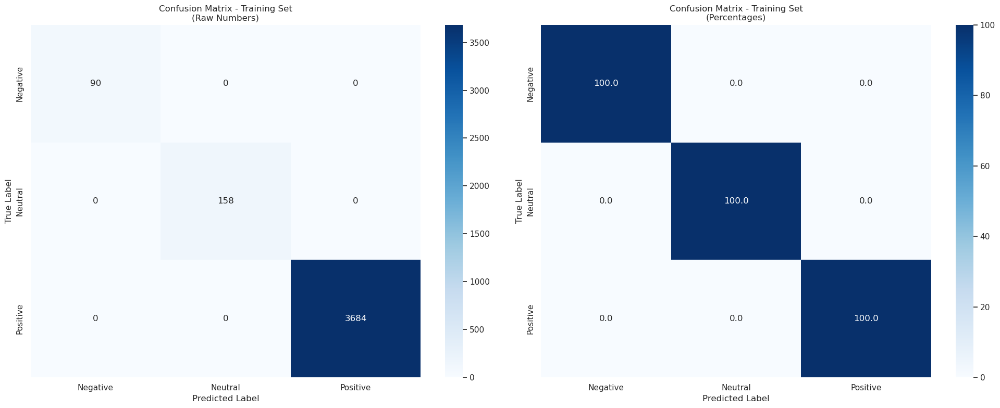


Classification Report - Training Set
              precision    recall  f1-score   support

    Negative       1.00      1.00      1.00        90
     Neutral       1.00      1.00      1.00       158
    Positive       1.00      1.00      1.00      3684

    accuracy                           1.00      3932
   macro avg       1.00      1.00      1.00      3932
weighted avg       1.00      1.00      1.00      3932

Creating test embeddings...


Batches:   0%|          | 0/32 [00:00<?, ?it/s]


Test Set Evaluation:
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


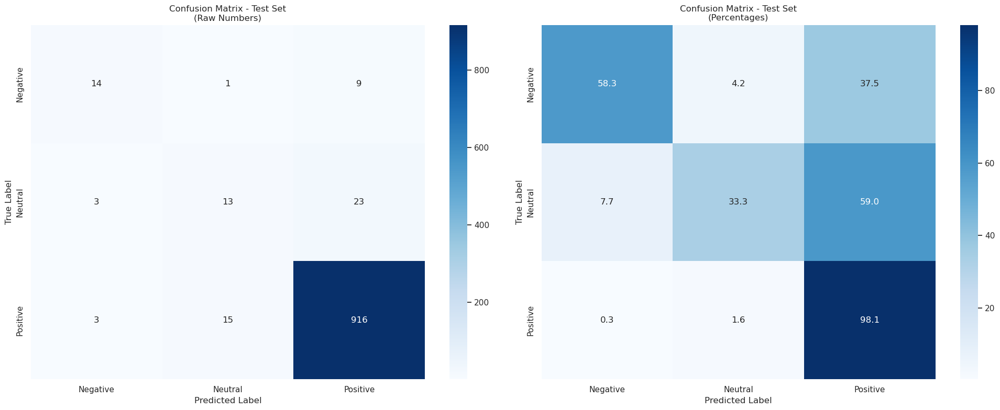


Classification Report - Test Set
              precision    recall  f1-score   support

    Negative       0.70      0.58      0.64        24
     Neutral       0.45      0.33      0.38        39
    Positive       0.97      0.98      0.97       934

    accuracy                           0.95       997
   macro avg       0.70      0.63      0.66       997
weighted avg       0.94      0.95      0.94       997


Test predictions have been added to df_test and saved as 'sentiment_test_model_1.csv'

Training Set Misclassifications:

Misclassified Examples:
Original Text | True Label | Predicted Label | Confidence
--------------------------------------------------------------------------------

Test Set Misclassifications:

Misclassified Examples:
Original Text | True Label | Predicted Label | Confidence
--------------------------------------------------------------------------------
great size nice size very clear but randomly shuts off cant remove unwanted apps from the home scree... | 

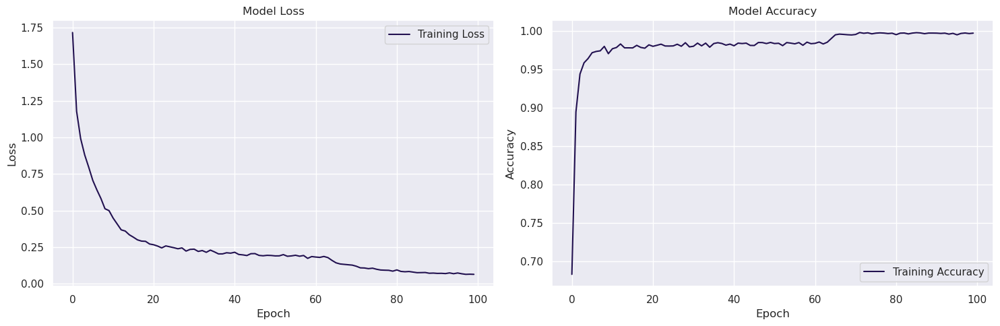


Performance Metrics:

Training Set Performance:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
total_inference_time: 0.2960 seconds
average_time_per_sample: 0.0001 seconds
samples_per_second: 13283.78
memory_usage_mb: 9.00 MB
batch_size: 32.00

Test Set Performance:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
total_inference_time: 0.1923 seconds
average_time_per_sample: 0.0002 seconds
samples_per_second: 5184.95
memory_usage_mb: 0.02 MB
batch_size: 32.00

Model Complexity Metrics:
trainable_parameters: 289,411
non_trainable_parameters: 1,664
total_parameters: 291,075
model_size_mb: 3.39 MB


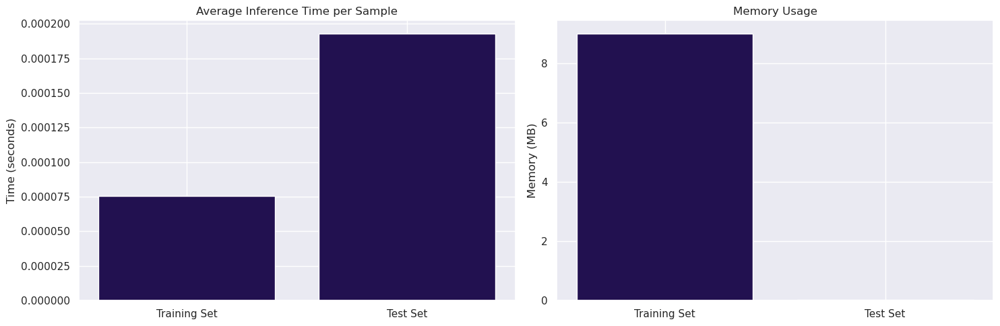

In [63]:
import numpy as np
import pandas as pd
from sentence_transformers import SentenceTransformer
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.regularizers import l2
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report
from imblearn.over_sampling import SMOTE
import seaborn as sns
import matplotlib.pyplot as plt
import time
import psutil
import os
from memory_profiler import profile

# 1. Data preparation
le = LabelEncoder()
y = le.fit_transform(df_train['sentiment'])

# 2. SBERT embeddings
model_sbert = SentenceTransformer('all-MiniLM-L6-v2')

print("Creating embeddings...")
X = model_sbert.encode(df_train['combined_review_cleaned'].tolist(), 
                       batch_size=32, 
                       show_progress_bar=True)

# 3. Apply SMOTE on entire training data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

print("Original dataset shape:", dict(zip(np.unique(y), np.bincount(y))))
print("Resampled dataset shape:", dict(zip(np.unique(y_resampled), np.bincount(y_resampled))))

# 4. Create model
l2_lambda = 0.001
model = Sequential([
    Dense(384, activation='relu', input_shape=(384,), kernel_regularizer=l2(l2_lambda)),
    BatchNormalization(),
    Dropout(0.5),
    
    Dense(256, activation='relu', kernel_regularizer=l2(l2_lambda)),
    BatchNormalization(),
    Dropout(0.5),
    
    Dense(128, activation='relu', kernel_regularizer=l2(l2_lambda)),
    BatchNormalization(),
    Dropout(0.4),
    
    Dense(64, activation='relu', kernel_regularizer=l2(l2_lambda)),
    BatchNormalization(),
    Dropout(0.3),
    
    Dense(3, activation='softmax')
])

# 5. Compile model
initial_learning_rate = 0.001
optimizer = tf.keras.optimizers.Adam(learning_rate=initial_learning_rate)

model.compile(
    optimizer=optimizer,
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# 6. Callbacks
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=10,
        restore_best_weights=True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='loss',
        factor=0.2,
        patience=5,
        min_lr=0.00001
    ),
    tf.keras.callbacks.ModelCheckpoint(
        'best_model.h5',
        monitor='loss',
        save_best_only=True
    )
]

# 7. Train on entire resampled data
history = model.fit(
    X_resampled,
    y_resampled,
    epochs=100,
    batch_size=64,
    callbacks=callbacks
)

# 8. Evaluation function
def create_confusion_matrix(X, y, dataset_name):
    predictions = model.predict(X)
    pred_classes = np.argmax(predictions, axis=1)
    
    # Calculate confusion matrices
    cm = confusion_matrix(y, pred_classes)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))
    
    # Plot raw numbers
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax1)
    ax1.set_title(f'Confusion Matrix - {dataset_name}\n(Raw Numbers)')
    ax1.set_ylabel('True Label')
    ax1.set_xlabel('Predicted Label')
    
    # Plot percentages
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax2)
    ax2.set_title(f'Confusion Matrix - {dataset_name}\n(Percentages)')
    ax2.set_ylabel('True Label')
    ax2.set_xlabel('Predicted Label')
    
    plt.tight_layout()
    plt.show()
    
    print(f"\nClassification Report - {dataset_name}")
    print(classification_report(y, pred_classes, 
                              target_names=le.classes_))
    
    return pred_classes, predictions

# 9. Training Set Evaluation
print("\nTraining Set Evaluation:")
train_pred_classes, train_pred_probs = create_confusion_matrix(
    X, y, "Training Set"
)

# 10. Test set evaluation
print("Creating test embeddings...")
X_test = model_sbert.encode(df_test['combined_review_cleaned'].tolist(), 
                            batch_size=32, 
                            show_progress_bar=True)
y_test = le.transform(df_test['sentiment'])

print("\nTest Set Evaluation:")
test_pred_classes, test_pred_probs = create_confusion_matrix(
    X_test, y_test, "Test Set"
)

df_test['predicted_sentiment_model_1'] = le.inverse_transform(test_pred_classes)
df_test.to_csv('sentiment_test_model_1.csv', index=False)
print("\nTest predictions have been added to df_test and saved as 'sentiment_test_model_1.csv'")

# 11. Misclassification analysis
def get_misclassified_examples(X_embeddings, y_true, texts, pred_classes, pred_probs, n=5):
    misclassified_idx = np.where(y_true != pred_classes)[0]
    
    print("\nMisclassified Examples:")
    print("Original Text | True Label | Predicted Label | Confidence")
    print("-" * 80)
    
    for idx in misclassified_idx[:n]:
        true_label = le.classes_[y_true[idx]]
        pred_label = le.classes_[pred_classes[idx]]
        confidence = np.max(pred_probs[idx]) * 100
        text = texts[idx][:100] + "..."
        print(f"{text} | {true_label} | {pred_label} | {confidence:.2f}%")

# Get misclassified examples
print("\nTraining Set Misclassifications:")
get_misclassified_examples(
    X, 
    y, 
    df_train['combined_review_cleaned'].tolist(),
    train_pred_classes,
    train_pred_probs
)

print("\nTest Set Misclassifications:")
get_misclassified_examples(
    X_test, 
    y_test, 
    df_test['combined_review_cleaned'].tolist(),
    test_pred_classes,
    test_pred_probs
)

# 12. Training history plots
plt.figure(figsize=(15,5))

plt.subplot(1,2,1)
plt.plot(history.history['loss'], label='Training Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# 13. Save the model
model.save('model1.h5')

# 14. Function to predict new texts
def predict_sentiment(texts):
    embeddings = model_sbert.encode(texts)
    predictions = model.predict(embeddings)
    pred_classes = np.argmax(predictions, axis=1)
    return [le.classes_[pred] for pred in pred_classes]

# 15. Inference Time and Computational Cost Evaluation
def measure_inference_metrics(model, X, batch_size=32):
    # Warm-up run
    _ = model.predict(X[:batch_size])
    
    # Memory usage before inference
    process = psutil.Process(os.getpid())
    memory_before = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Measure inference time
    start_time = time.time()
    predictions = model.predict(X, batch_size=batch_size)
    end_time = time.time()
    
    # Memory usage after inference
    memory_after = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Calculate metrics
    total_time = end_time - start_time
    samples = len(X)
    avg_time_per_sample = total_time / samples
    memory_used = memory_after - memory_before
    
    return {
        'total_inference_time': total_time,
        'average_time_per_sample': avg_time_per_sample,
        'samples_per_second': samples / total_time,
        'memory_usage_mb': memory_used,
        'batch_size': batch_size
    }

# Measure inference metrics for both training and test sets
print("\nPerformance Metrics:")
print("\nTraining Set Performance:")
train_metrics = measure_inference_metrics(model, X)
for metric, value in train_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nTest Set Performance:")
test_metrics = measure_inference_metrics(model, X_test)
for metric, value in test_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")


def get_model_complexity():
    trainable_params = np.sum([tf.keras.backend.count_params(w) for w in model.trainable_weights])
    non_trainable_params = np.sum([tf.keras.backend.count_params(w) for w in model.non_trainable_weights])
    
    return {
        'trainable_parameters': trainable_params,
        'non_trainable_parameters': non_trainable_params,
        'total_parameters': trainable_params + non_trainable_params,
        'model_size_mb': os.path.getsize('model1.h5') / (1024 * 1024)
    }


print("\nModel Complexity Metrics:")
complexity_metrics = get_model_complexity()
for metric, value in complexity_metrics.items():
    if 'size' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:,}")

# Visualization of inference metrics
plt.figure(figsize=(15,5))

plt.subplot(1,2,1)
metrics_data = [train_metrics['average_time_per_sample'], test_metrics['average_time_per_sample']]
plt.bar(['Training Set', 'Test Set'], metrics_data)
plt.title('Average Inference Time per Sample')
plt.ylabel('Time (seconds)')

plt.subplot(1,2,2)
memory_data = [train_metrics['memory_usage_mb'], test_metrics['memory_usage_mb']]
plt.bar(['Training Set', 'Test Set'], memory_data)
plt.title('Memory Usage')
plt.ylabel('Memory (MB)')

plt.tight_layout()
plt.show()

# Store metrics for comparison across models
performance_metrics = {
    'model1': {
        'train': train_metrics,
        'test': test_metrics,
        'complexity': complexity_metrics
    }
}

# Convert to DataFrame for easy comparison
metrics_df = pd.DataFrame(performance_metrics).T
metrics_df.to_csv('model_performance_metrics.csv')


## 2. SBERT + SMOTE-Tomek + Neural Network

Creating embeddings...


Batches:   0%|          | 0/123 [00:00<?, ?it/s]


Original dataset shape: {0: 90, 1: 158, 2: 3684}
Resampled dataset shape: {0: 3684, 1: 3684, 2: 3684}
Epoch 1/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.5799 - loss: 2.0016

173/173 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.5807 - loss: 1.9997 - learning_rate: 0.0010
Epoch 2/100
155/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8685 - loss: 1.2490

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8711 - loss: 1.2414 - learning_rate: 0.0010
Epoch 3/100
165/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9393 - loss: 1.0191

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9394 - loss: 1.0179 - learning_rate: 0.0010
Epoch 4/100
158/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9587 - loss: 0.9005

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9588 - loss: 0.8985 - learning_rate: 0.0010
Epoch 5/100
148/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9683 - loss: 0.7955

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9684 - loss: 0.7929 - learning_rate: 0.0010
Epoch 6/100
170/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9703 - loss: 0.7229

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9703 - loss: 0.7227 - learning_rate: 0.0010
Epoch 7/100
153/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9733 - loss: 0.6619

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9732 - loss: 0.6603 - learning_rate: 0.0010
Epoch 8/100
168/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9773 - loss: 0.5858

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9772 - loss: 0.5855 - learning_rate: 0.0010
Epoch 9/100
168/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9683 - loss: 0.5693

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9684 - loss: 0.5685 - learning_rate: 0.0010
Epoch 10/100
151/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9778 - loss: 0.4988

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9776 - loss: 0.4976 - learning_rate: 0.0010
Epoch 11/100
166/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9748 - loss: 0.4708

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9748 - loss: 0.4704 - learning_rate: 0.0010
Epoch 12/100
148/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9849 - loss: 0.4043

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9850 - loss: 0.4030 - learning_rate: 0.0010
Epoch 13/100
167/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9822 - loss: 0.3728

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9821 - loss: 0.3729 - learning_rate: 0.0010
Epoch 14/100
146/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9791 - loss: 0.3648

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9795 - loss: 0.3636 - learning_rate: 0.0010
Epoch 15/100
170/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9783 - loss: 0.3449

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9783 - loss: 0.3449 - learning_rate: 0.0010
Epoch 16/100
169/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9776 - loss: 0.3272

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9777 - loss: 0.3271 - learning_rate: 0.0010
Epoch 17/100
164/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9771 - loss: 0.3104

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9772 - loss: 0.3102 - learning_rate: 0.0010
Epoch 18/100
161/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9832 - loss: 0.2889

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9831 - loss: 0.2890 - learning_rate: 0.0010
Epoch 19/100
169/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9812 - loss: 0.2830

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9812 - loss: 0.2832 - learning_rate: 0.0010
Epoch 20/100
168/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9843 - loss: 0.2674

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9842 - loss: 0.2674 - learning_rate: 0.0010
Epoch 21/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9807 - loss: 0.2665 - learning_rate: 0.0010
Epoch 22/100
166/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9819 - loss: 0.2606

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9820 - loss: 0.2604 - learning_rate: 0.0010
Epoch 23/100
169/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9824 - loss: 0.2470

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9823 - loss: 0.2471 - learning_rate: 0.0010
Epoch 24/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9771 - loss: 0.2604 - learning_rate: 0.0010
Epoch 25/100
162/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9818 - loss: 0.2413

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9818 - loss: 0.2415 - learning_rate: 0.0010
Epoch 26/100
165/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9839 - loss: 0.2296

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9839 - loss: 0.2294 - learning_rate: 0.0010
Epoch 27/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9832 - loss: 0.2315 - learning_rate: 0.0010
Epoch 28/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9806 - loss: 0.2442 - learning_rate: 0.0010
Epoch 29/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9803 - loss: 0.2322 - learning_rate: 0.0010
Epoch 30/100
153/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9803 - loss: 0.2264

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9805 - loss: 0.2262 - learning_rate: 0.0010
Epoch 31/100
156/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9824 - loss: 0.2194

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9825 - loss: 0.2194 - learning_rate: 0.0010
Epoch 32/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9840 - loss: 0.2174 - learning_rate: 0.0010
Epoch 33/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9786 - loss: 0.2391 - learning_rate: 0.0010
Epoch 34/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9773 - loss: 0.2378 - learning_rate: 0.0010
Epoch 35/100
160/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9833 - loss: 0.2165

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9833 - loss: 0.2162 - learning_rate: 0.0010
Epoch 36/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9844 - loss: 0.2120 - learning_rate: 0.0010
Epoch 37/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9807 - loss: 0.2201 - learning_rate: 0.0010
Epoch 38/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9844 - loss: 0.2146 - learning_rate: 0.0010
Epoch 39/100
161/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9822 - loss: 0.2123

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9822 - loss: 0.2122 - learning_rate: 0.0010
Epoch 40/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9832 - loss: 0.2111 - learning_rate: 0.0010
Epoch 41/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9830 - loss: 0.2164 - learning_rate: 0.0010
Epoch 42/100
167/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9860 - loss: 0.2034

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9859 - loss: 0.2035 - learning_rate: 0.0010
Epoch 43/100
160/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9876 - loss: 0.1883

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9875 - loss: 0.1888 - learning_rate: 0.0010
Epoch 44/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9821 - loss: 0.2072 - learning_rate: 0.0010
Epoch 45/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9806 - loss: 0.2126 - learning_rate: 0.0010
Epoch 46/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9832 - loss: 0.1992 - learning_rate: 0.0010
Epoch 47/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9843 - loss: 0.2008 - learning_rate: 0.0010
Epoch 48/100
169/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9858 - loss: 0.1871

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9858 - loss: 0.1872 - learning_rate: 0.0010
Epoch 49/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9830 - loss: 0.2061 - learning_rate: 0.0010
Epoch 50/100
161/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9896 - loss: 0.1769

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9895 - loss: 0.1774 - learning_rate: 0.0010
Epoch 51/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9834 - loss: 0.1958 - learning_rate: 0.0010
Epoch 52/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9857 - loss: 0.1862 - learning_rate: 0.0010
Epoch 53/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9849 - loss: 0.1836 - learning_rate: 0.0010
Epoch 54/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9792 - loss: 0.2005 - learning_rate: 0.0010
Epoch 55/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9873 - loss: 0.1797 - learning_rate: 0.0010
Epoch 56/100
162/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9848 - loss: 0.1826

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9851 - loss: 0.1817 - learning_rate: 2.0000e-04
Epoch 57/100
158/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9927 - loss: 0.1559

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9927 - loss: 0.1560 - learning_rate: 2.0000e-04
Epoch 58/100
151/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9953 - loss: 0.1461

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9952 - loss: 0.1460 - learning_rate: 2.0000e-04
Epoch 59/100
153/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9972 - loss: 0.1385

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9972 - loss: 0.1384 - learning_rate: 2.0000e-04
Epoch 60/100
168/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9967 - loss: 0.1318

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9967 - loss: 0.1318 - learning_rate: 2.0000e-04
Epoch 61/100
151/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9953 - loss: 0.1325

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9955 - loss: 0.1318 - learning_rate: 2.0000e-04
Epoch 62/100
160/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9962 - loss: 0.1257

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9962 - loss: 0.1254 - learning_rate: 2.0000e-04
Epoch 63/100
159/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9946 - loss: 0.1242

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9947 - loss: 0.1239 - learning_rate: 2.0000e-04
Epoch 64/100
160/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9953 - loss: 0.1197

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9954 - loss: 0.1195 - learning_rate: 2.0000e-04
Epoch 65/100
152/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9984 - loss: 0.1116

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9984 - loss: 0.1112 - learning_rate: 2.0000e-04
Epoch 66/100
147/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9968 - loss: 0.1094

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9967 - loss: 0.1091 - learning_rate: 2.0000e-04
Epoch 67/100
160/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9963 - loss: 0.1058

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9963 - loss: 0.1058 - learning_rate: 2.0000e-04
Epoch 68/100
166/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9971 - loss: 0.1025

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9971 - loss: 0.1024 - learning_rate: 2.0000e-04
Epoch 69/100
165/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9978 - loss: 0.0962

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9978 - loss: 0.0962 - learning_rate: 2.0000e-04
Epoch 70/100
156/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9967 - loss: 0.0971

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9968 - loss: 0.0968 - learning_rate: 2.0000e-04
Epoch 71/100
160/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9975 - loss: 0.0920

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9975 - loss: 0.0920 - learning_rate: 2.0000e-04
Epoch 72/100
165/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9970 - loss: 0.0897

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9970 - loss: 0.0898 - learning_rate: 2.0000e-04
Epoch 73/100
170/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9966 - loss: 0.0892

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9966 - loss: 0.0892 - learning_rate: 2.0000e-04
Epoch 74/100
161/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9969 - loss: 0.0876

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9969 - loss: 0.0875 - learning_rate: 2.0000e-04
Epoch 75/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9962 - loss: 0.0869 - learning_rate: 2.0000e-04
Epoch 76/100
160/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9962 - loss: 0.0879

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9962 - loss: 0.0877 - learning_rate: 2.0000e-04
Epoch 77/100
154/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9984 - loss: 0.0778

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9983 - loss: 0.0780 - learning_rate: 2.0000e-04
Epoch 78/100
157/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9980 - loss: 0.0773

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9980 - loss: 0.0774 - learning_rate: 2.0000e-04
Epoch 79/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9966 - loss: 0.0799 - learning_rate: 2.0000e-04
Epoch 80/100
164/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9973 - loss: 0.0760

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9973 - loss: 0.0759 - learning_rate: 2.0000e-04
Epoch 81/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9975 - loss: 0.0748 - learning_rate: 2.0000e-04
Epoch 82/100
153/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9991 - loss: 0.0688

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9991 - loss: 0.0689 - learning_rate: 2.0000e-04
Epoch 83/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9953 - loss: 0.0779 - learning_rate: 2.0000e-04
Epoch 84/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9967 - loss: 0.0718 - learning_rate: 2.0000e-04
Epoch 85/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9976 - loss: 0.0705 - learning_rate: 2.0000e-04
Epoch 86/100
147/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9981 - loss: 0.0689

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9981 - loss: 0.0689 - learning_rate: 2.0000e-04
Epoch 87/100
167/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9978 - loss: 0.0669

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9978 - loss: 0.0669 - learning_rate: 2.0000e-04
Epoch 88/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9972 - loss: 0.0668 - learning_rate: 2.0000e-04
Epoch 89/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9982 - loss: 0.0660 - learning_rate: 2.0000e-04
Epoch 90/100
166/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9974 - loss: 0.0679

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9974 - loss: 0.0678 - learning_rate: 2.0000e-04
Epoch 91/100
168/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9972 - loss: 0.0650

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9973 - loss: 0.0649 - learning_rate: 2.0000e-04
Epoch 92/100
154/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9985 - loss: 0.0608

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9985 - loss: 0.0609 - learning_rate: 2.0000e-04
Epoch 93/100
161/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9988 - loss: 0.0602

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9988 - loss: 0.0603 - learning_rate: 2.0000e-04
Epoch 94/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9959 - loss: 0.0697 - learning_rate: 2.0000e-04
Epoch 95/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9941 - loss: 0.0692 - learning_rate: 2.0000e-04
Epoch 96/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9960 - loss: 0.0646 - learning_rate: 2.0000e-04
Epoch 97/100
161/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9963 - loss: 0.0637

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9964 - loss: 0.0634 - learning_rate: 2.0000e-04
Epoch 98/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9965 - loss: 0.0637 - learning_rate: 2.0000e-04
Epoch 99/100
149/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9985 - loss: 0.0583

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9985 - loss: 0.0582 - learning_rate: 2.0000e-04
Epoch 100/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9977 - loss: 0.0581 - learning_rate: 2.0000e-04

Training Set Evaluation:
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


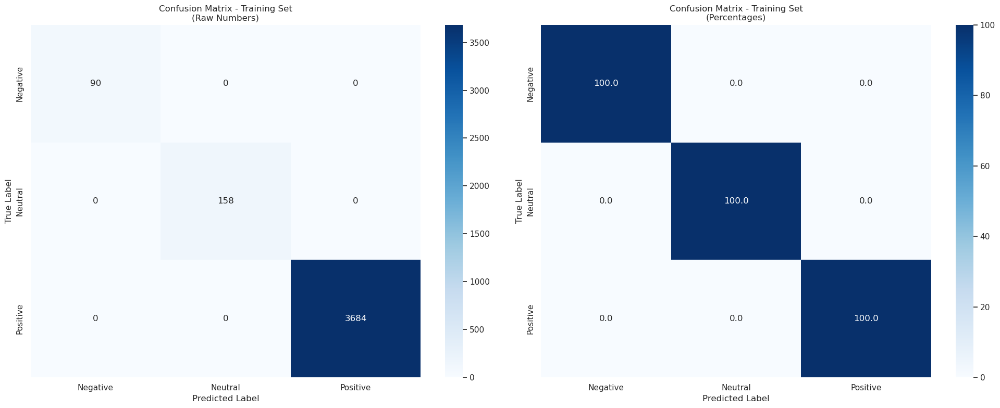


Classification Report - Training Set
              precision    recall  f1-score   support

    Negative       1.00      1.00      1.00        90
     Neutral       1.00      1.00      1.00       158
    Positive       1.00      1.00      1.00      3684

    accuracy                           1.00      3932
   macro avg       1.00      1.00      1.00      3932
weighted avg       1.00      1.00      1.00      3932


F1 Scores per class:
Class Negative: 1.0000
Class Neutral: 1.0000
Class Positive: 1.0000
Creating test embeddings...


Batches:   0%|          | 0/32 [00:00<?, ?it/s]


Test Set Evaluation:
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


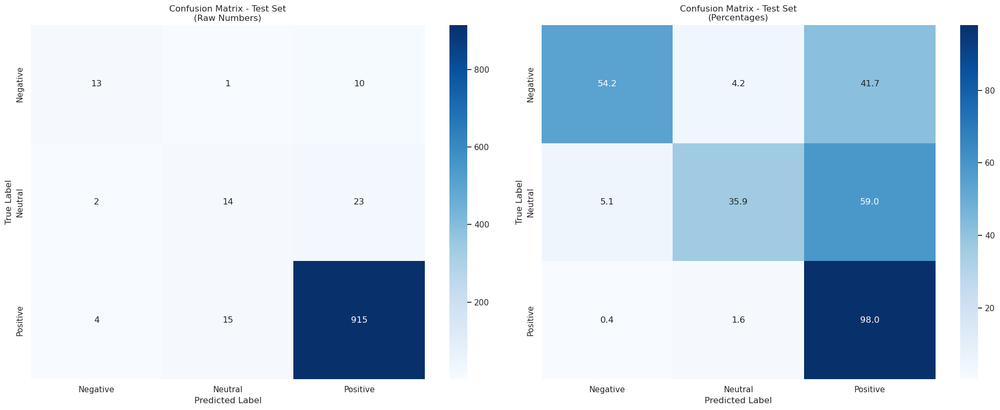


Classification Report - Test Set
              precision    recall  f1-score   support

    Negative       0.68      0.54      0.60        24
     Neutral       0.47      0.36      0.41        39
    Positive       0.97      0.98      0.97       934

    accuracy                           0.94       997
   macro avg       0.71      0.63      0.66       997
weighted avg       0.94      0.94      0.94       997


F1 Scores per class:
Class Negative: 0.6047
Class Neutral: 0.4058
Class Positive: 0.9724

Test predictions have been added to df_test and saved as 'sentiment_test_model_2.csv'

Training Set Misclassifications:

Misclassified Examples:
Original Text | True Label | Predicted Label | Confidence
--------------------------------------------------------------------------------

Test Set Misclassifications:

Misclassified Examples:
Original Text | True Label | Predicted Label | Confidence
--------------------------------------------------------------------------------
Switched from Sa

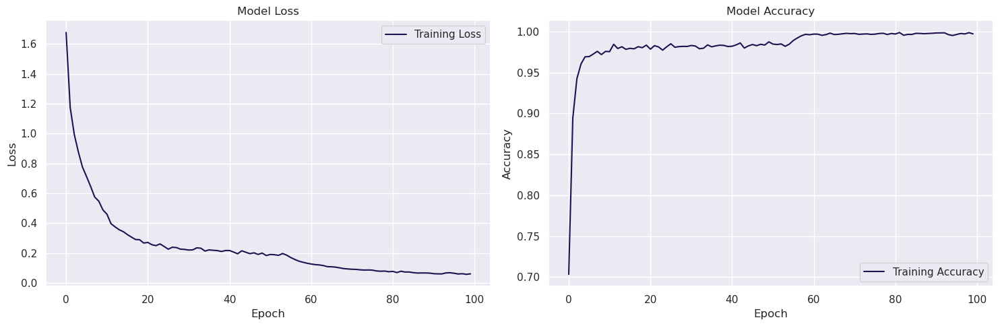


Performance Metrics:

Training Set Performance:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
total_inference_time: 0.2970 seconds
average_time_per_sample: 0.0001 seconds
samples_per_second: 13237.01
memory_usage_mb: 6.16 MB
batch_size: 32.00

Test Set Performance:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
total_inference_time: 0.1943 seconds
average_time_per_sample: 0.0002 seconds
samples_per_second: 5130.56
memory_usage_mb: 0.23 MB
batch_size: 32.00

Model Complexity Metrics:
trainable_parameters: 291,075
non_trainable_parameters: 1,664
total_parameters: 292,739
model_size_mb: 3.40 MB


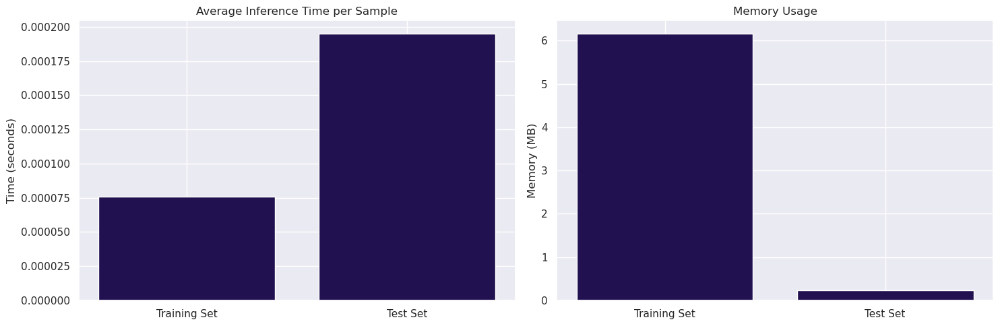


Performance metrics have been saved to 'model2_performance_metrics.csv'

Comprehensive Model Summary:
Model: Model 2 (SMOTE-Tomek)
Total Parameters: 292,739
Model Size: 3.40 MB
Average Inference Time: 0.0002 seconds per sample
Memory Usage: 0.23 MB
Final Training Accuracy: 0.9971
Total Training Epochs: 100


In [64]:
import numpy as np
import pandas as pd
from sentence_transformers import SentenceTransformer
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.regularizers import l2
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report, f1_score
from imblearn.combine import SMOTETomek
import seaborn as sns
import matplotlib.pyplot as plt

# Load previous test results
df_test = pd.read_csv('sentiment_test_model_1.csv')


# 1. Data preparation
le = LabelEncoder()
y = le.fit_transform(df_train['sentiment'])

# 2. SBERT embeddings
model_sbert = SentenceTransformer('all-MiniLM-L6-v2')

print("Creating embeddings...")
X = model_sbert.encode(df_train['combined_review_cleaned'].tolist(), 
                      batch_size=32, 
                      show_progress_bar=True)

# 3. Apply SMOTE-Tomek on entire training data
print("\nOriginal dataset shape:", dict(zip(np.unique(y), np.bincount(y))))

smote_tomek = SMOTETomek(random_state=42, n_jobs=-1)
X_resampled, y_resampled = smote_tomek.fit_resample(X, y)

print("Resampled dataset shape:", dict(zip(np.unique(y_resampled), np.bincount(y_resampled))))

# 4. Create model
l2_lambda = 0.001
model = Sequential([
    Dense(384, activation='relu', input_shape=(384,), kernel_regularizer=l2(l2_lambda)),
    BatchNormalization(),
    Dropout(0.5),
    
    Dense(256, activation='relu', kernel_regularizer=l2(l2_lambda)),
    BatchNormalization(),
    Dropout(0.5),
    
    Dense(128, activation='relu', kernel_regularizer=l2(l2_lambda)),
    BatchNormalization(),
    Dropout(0.4),
    
    Dense(64, activation='relu', kernel_regularizer=l2(l2_lambda)),
    BatchNormalization(),
    Dropout(0.3),
    
    Dense(3, activation='softmax')
])

# 5. Compile model
initial_learning_rate = 0.001
optimizer = tf.keras.optimizers.Adam(learning_rate=initial_learning_rate)

model.compile(
    optimizer=optimizer,
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# 6. Callbacks (modified to monitor training loss)
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=10,
        restore_best_weights=True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='loss',
        factor=0.2,
        patience=5,
        min_lr=0.00001
    ),
    tf.keras.callbacks.ModelCheckpoint(
        'best_model.h5',
        monitor='loss',
        save_best_only=True
    )
]

# 7. Train model on entire resampled data
history = model.fit(
    X_resampled,
    y_resampled,
    epochs=100,
    batch_size=64,
    callbacks=callbacks
)

# 8. Evaluation function
def create_confusion_matrix(X, y, dataset_name):
    predictions = model.predict(X)
    pred_classes = np.argmax(predictions, axis=1)
    
    # Calculate confusion matrices
    cm = confusion_matrix(y, pred_classes)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))
    
    # Plot raw numbers
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax1)
    ax1.set_title(f'Confusion Matrix - {dataset_name}\n(Raw Numbers)')
    ax1.set_ylabel('True Label')
    ax1.set_xlabel('Predicted Label')
    
    # Plot percentages
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax2)
    ax2.set_title(f'Confusion Matrix - {dataset_name}\n(Percentages)')
    ax2.set_ylabel('True Label')
    ax2.set_xlabel('Predicted Label')
    
    plt.tight_layout()
    plt.show()
    
    # Print classification report
    print(f"\nClassification Report - {dataset_name}")
    print(classification_report(y, pred_classes, 
                              target_names=le.classes_))
    
    # Print F1 scores
    f1_scores = f1_score(y, pred_classes, average=None)
    print("\nF1 Scores per class:")
    for i, score in enumerate(f1_scores):
        print(f"Class {le.classes_[i]}: {score:.4f}")
    
    return pred_classes, predictions

# 9. Training Set Evaluation
print("\nTraining Set Evaluation:")
train_pred_classes, train_pred_probs = create_confusion_matrix(
    X, y, "Training Set"
)

# 10. Test set evaluation
print("Creating test embeddings...")
X_test = model_sbert.encode(df_test['combined_review_cleaned'].tolist(), 
                           batch_size=32, 
                           show_progress_bar=True)
y_test = le.transform(df_test['sentiment'])

print("\nTest Set Evaluation:")
test_pred_classes, test_pred_probs = create_confusion_matrix(
    X_test, y_test, "Test Set"
)

# Store predictions in df_test
df_test['predicted_sentiment_model_2'] = le.inverse_transform(test_pred_classes)
df_test.to_csv('sentiment_test_model_2.csv', index=False)
print("\nTest predictions have been added to df_test and saved as 'sentiment_test_model_2.csv'")


# 11. Analyze misclassifications
def get_misclassified_examples(X_embeddings, y_true, texts, pred_classes, pred_probs, n=5):
    misclassified_idx = np.where(y_true != pred_classes)[0]
    
    print("\nMisclassified Examples:")
    print("Original Text | True Label | Predicted Label | Confidence")
    print("-" * 80)
    
    confidences = np.max(pred_probs, axis=1)[misclassified_idx]
    sorted_indices = misclassified_idx[np.argsort(confidences)]
    
    for idx in sorted_indices[:n]:
        true_label = le.classes_[y_true[idx]]
        pred_label = le.classes_[pred_classes[idx]]
        confidence = np.max(pred_probs[idx]) * 100
        text = texts[idx][:100] + "..."
        print(f"{text} | {true_label} | {pred_label} | {confidence:.2f}%")

# Get misclassified examples
print("\nTraining Set Misclassifications:")
get_misclassified_examples(
    X, 
    y, 
    df_train['combined_review_cleaned'].tolist(),
    train_pred_classes,
    train_pred_probs
)

print("\nTest Set Misclassifications:")
get_misclassified_examples(
    X_test, 
    y_test, 
    df_test['combined_review_cleaned'].tolist(),
    test_pred_classes,
    test_pred_probs
)

# 12. Plot training history
plt.figure(figsize=(15,5))

# Loss plot
plt.subplot(1,2,1)
plt.plot(history.history['loss'], label='Training Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Accuracy plot
plt.subplot(1,2,2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# 13. Save the model
model.save('model2.h5')

# 14. Function to predict new texts
def predict_sentiment(texts):
    embeddings = model_sbert.encode(texts)
    predictions = model.predict(embeddings)
    pred_classes = np.argmax(predictions, axis=1)
    confidences = np.max(predictions, axis=1)
    return [(le.classes_[pred], conf) for pred, conf in zip(pred_classes, confidences)]
# 15. Performance Metrics Evaluation
import time
import psutil
import os
from memory_profiler import profile

def measure_inference_metrics(model, X, batch_size=32):
    # Warm-up run
    _ = model.predict(X[:batch_size])
    
    # Memory usage before inference
    process = psutil.Process(os.getpid())
    memory_before = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Measure inference time
    start_time = time.time()
    predictions = model.predict(X, batch_size=batch_size)
    end_time = time.time()
    
    # Memory usage after inference
    memory_after = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Calculate metrics
    total_time = end_time - start_time
    samples = len(X)
    avg_time_per_sample = total_time / samples
    memory_used = memory_after - memory_before
    
    return {
        'total_inference_time': total_time,
        'average_time_per_sample': avg_time_per_sample,
        'samples_per_second': samples / total_time,
        'memory_usage_mb': memory_used,
        'batch_size': batch_size
    }

# Get model complexity metrics
def get_model_complexity():
    trainable_params = model.count_params()
    non_trainable_params = sum([tf.keras.backend.count_params(w) for w in model.non_trainable_weights])
    
    return {
        'trainable_parameters': trainable_params,
        'non_trainable_parameters': non_trainable_params,
        'total_parameters': trainable_params + non_trainable_params,
        'model_size_mb': os.path.getsize('model2.h5') / (1024 * 1024)
    }

# Measure and print performance metrics
print("\nPerformance Metrics:")
print("\nTraining Set Performance:")
train_metrics = measure_inference_metrics(model, X)
for metric, value in train_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nTest Set Performance:")
test_metrics = measure_inference_metrics(model, X_test)
for metric, value in test_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nModel Complexity Metrics:")
complexity_metrics = get_model_complexity()
for metric, value in complexity_metrics.items():
    if 'size' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:,}")

# Visualize performance metrics
plt.figure(figsize=(15,5))

# Inference time comparison
plt.subplot(1,2,1)
metrics_data = [train_metrics['average_time_per_sample'], test_metrics['average_time_per_sample']]
plt.bar(['Training Set', 'Test Set'], metrics_data)
plt.title('Average Inference Time per Sample')
plt.ylabel('Time (seconds)')

# Memory usage comparison
plt.subplot(1,2,2)
memory_data = [train_metrics['memory_usage_mb'], test_metrics['memory_usage_mb']]
plt.bar(['Training Set', 'Test Set'], memory_data)
plt.title('Memory Usage')
plt.ylabel('Memory (MB)')

plt.tight_layout()
plt.show()

# Store all metrics for model comparison
performance_metrics = {
    'model2': {  # Changed to model2 to match your code
        'train': train_metrics,
        'test': test_metrics,
        'complexity': complexity_metrics,
        'training_history': {
            'final_loss': history.history['loss'][-1],
            'final_accuracy': history.history['accuracy'][-1],
            'epochs_trained': len(history.history['loss'])
        }
    }
}

# Create detailed metrics DataFrame
def create_metrics_df(metrics_dict):
    data = {
        'Model': [],
        'Training Time per Sample (s)': [],
        'Test Time per Sample (s)': [],
        'Training Memory (MB)': [],
        'Test Memory (MB)': [],
        'Model Size (MB)': [],
        'Total Parameters': [],
        'Final Training Loss': [],
        'Final Training Accuracy': [],
        'Epochs Trained': []
    }
    
    for model_name, metrics in metrics_dict.items():
        data['Model'].append(model_name)
        data['Training Time per Sample (s)'].append(metrics['train']['average_time_per_sample'])
        data['Test Time per Sample (s)'].append(metrics['test']['average_time_per_sample'])
        data['Training Memory (MB)'].append(metrics['train']['memory_usage_mb'])
        data['Test Memory (MB)'].append(metrics['test']['memory_usage_mb'])
        data['Model Size (MB)'].append(metrics['complexity']['model_size_mb'])
        data['Total Parameters'].append(metrics['complexity']['total_parameters'])
        data['Final Training Loss'].append(metrics['training_history']['final_loss'])
        data['Final Training Accuracy'].append(metrics['training_history']['final_accuracy'])
        data['Epochs Trained'].append(metrics['training_history']['epochs_trained'])
    
    return pd.DataFrame(data)

# Create and save metrics DataFrame
metrics_df = create_metrics_df(performance_metrics)
metrics_df.to_csv('model2_performance_metrics.csv', index=False)
print("\nPerformance metrics have been saved to 'model2_performance_metrics.csv'")

# Print comprehensive summary
print("\nComprehensive Model Summary:")
print("=" * 50)
print(f"Model: Model 2 (SMOTE-Tomek)")
print(f"Total Parameters: {complexity_metrics['total_parameters']:,}")
print(f"Model Size: {complexity_metrics['model_size_mb']:.2f} MB")
print(f"Average Inference Time: {test_metrics['average_time_per_sample']:.4f} seconds per sample")
print(f"Memory Usage: {test_metrics['memory_usage_mb']:.2f} MB")
print(f"Final Training Accuracy: {history.history['accuracy'][-1]:.4f}")
print(f"Total Training Epochs: {len(history.history['loss'])}")


## 3. SBERT + SMOTE Tomek + LSTM

Creating embeddings...


Batches:   0%|          | 0/123 [00:00<?, ?it/s]


Original dataset shape: {0: 90, 1: 158, 2: 3684}
Resampled dataset shape: {0: 3684, 1: 3684, 2: 3684}
Epoch 1/100
342/346 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.7099 - loss: 2.2999

346/346 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - accuracy: 0.7113 - loss: 2.2904 - learning_rate: 0.0010
Epoch 2/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9145 - loss: 0.9839

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9145 - loss: 0.9834 - learning_rate: 0.0010
Epoch 3/100
343/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9311 - loss: 0.7480

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9312 - loss: 0.7476 - learning_rate: 0.0010
Epoch 4/100
343/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9398 - loss: 0.6134

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9398 - loss: 0.6132 - learning_rate: 0.0010
Epoch 5/100
342/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9490 - loss: 0.5222

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9490 - loss: 0.5221 - learning_rate: 0.0010
Epoch 6/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9482 - loss: 0.4780

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9482 - loss: 0.4780 - learning_rate: 0.0010
Epoch 7/100
345/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9453 - loss: 0.4617

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9454 - loss: 0.4616 - learning_rate: 0.0010
Epoch 8/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9510 - loss: 0.4251

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9510 - loss: 0.4250 - learning_rate: 0.0010
Epoch 9/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9450 - loss: 0.4298

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9450 - loss: 0.4297 - learning_rate: 0.0010
Epoch 10/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9536 - loss: 0.4038

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9536 - loss: 0.4037 - learning_rate: 0.0010
Epoch 11/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9534 - loss: 0.4071 - learning_rate: 0.0010
Epoch 12/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9556 - loss: 0.4002 - learning_rate: 0.0010
Epoch 13/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9550 - loss: 0.3928 - learning_rate: 0.0010
Epoch 14/100
342/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9586 - loss: 0.3822

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.9586 - loss: 0.3821 - learning_rate: 0.0010
Epoch 15/100
343/346 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.9597 - loss: 0.3708

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.9597 - loss: 0.3707 - learning_rate: 0.0010
Epoch 16/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9546 - loss: 0.3874 - learning_rate: 0.0010
Epoch 17/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9527 - loss: 0.4107 - learning_rate: 0.0010
Epoch 18/100
339/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9623 - loss: 0.3537

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9622 - loss: 0.3538 - learning_rate: 0.0010
Epoch 19/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9629 - loss: 0.3527 - learning_rate: 0.0010
Epoch 20/100
339/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9665 - loss: 0.3376

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9664 - loss: 0.3378 - learning_rate: 0.0010
Epoch 21/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9597 - loss: 0.3818 - learning_rate: 0.0010
Epoch 22/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9601 - loss: 0.3583 - learning_rate: 0.0010
Epoch 23/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9604 - loss: 0.3631 - learning_rate: 0.0010
Epoch 24/100
343/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9622 - loss: 0.3470

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.9622 - loss: 0.3469 - learning_rate: 0.0010
Epoch 25/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9545 - loss: 0.3722 - learning_rate: 0.0010
Epoch 26/100
340/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9635 - loss: 0.3371

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9635 - loss: 0.3370 - learning_rate: 0.0010
Epoch 27/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9632 - loss: 0.3354 - learning_rate: 0.0010
Epoch 28/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9625 - loss: 0.3331

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9625 - loss: 0.3330 - learning_rate: 0.0010
Epoch 29/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9664 - loss: 0.3088

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9664 - loss: 0.3088 - learning_rate: 0.0010
Epoch 30/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9637 - loss: 0.3337 - learning_rate: 0.0010
Epoch 31/100
341/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9729 - loss: 0.2958

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9728 - loss: 0.2961 - learning_rate: 0.0010
Epoch 32/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9650 - loss: 0.3332 - learning_rate: 0.0010
Epoch 33/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9667 - loss: 0.3045 - learning_rate: 0.0010
Epoch 34/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9646 - loss: 0.3167

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9647 - loss: 0.3167 - learning_rate: 0.0010
Epoch 35/100
345/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9689 - loss: 0.3052

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9689 - loss: 0.3052 - learning_rate: 0.0010
Epoch 36/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9611 - loss: 0.3097 - learning_rate: 0.0010
Epoch 37/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9688 - loss: 0.2932

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9688 - loss: 0.2932 - learning_rate: 0.0010
Epoch 38/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9700 - loss: 0.2891 - learning_rate: 0.0010
Epoch 39/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9656 - loss: 0.3071 - learning_rate: 0.0010
Epoch 40/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9671 - loss: 0.2904 - learning_rate: 0.0010
Epoch 41/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9644 - loss: 0.3082 - learning_rate: 0.0010
Epoch 42/100
343/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9695 - loss: 0.2885

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9695 - loss: 0.2884 - learning_rate: 0.0010
Epoch 43/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9698 - loss: 0.2734

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9698 - loss: 0.2734 - learning_rate: 0.0010
Epoch 44/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9684 - loss: 0.2821 - learning_rate: 0.0010
Epoch 45/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9671 - loss: 0.2908 - learning_rate: 0.0010
Epoch 46/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9685 - loss: 0.2865 - learning_rate: 0.0010
Epoch 47/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9661 - loss: 0.2906 - learning_rate: 0.0010
Epoch 48/100
342/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9724 - loss: 0.2597

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9724 - loss: 0.2598 - learning_rate: 0.0010
Epoch 49/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9728 - loss: 0.2736 - learning_rate: 0.0010
Epoch 50/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9682 - loss: 0.2761 - learning_rate: 0.0010
Epoch 51/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9702 - loss: 0.2609

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9702 - loss: 0.2609 - learning_rate: 0.0010
Epoch 52/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9683 - loss: 0.2817 - learning_rate: 0.0010
Epoch 53/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9693 - loss: 0.2848 - learning_rate: 0.0010
Epoch 54/100
343/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9756 - loss: 0.2483

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.9756 - loss: 0.2483 - learning_rate: 0.0010
Epoch 55/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.9677 - loss: 0.2693 - learning_rate: 0.0010
Epoch 56/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9729 - loss: 0.2419 - learning_rate: 0.0010
Epoch 57/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.9663 - loss: 0.2819 - learning_rate: 0.0010
Epoch 58/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9719 - loss: 0.2659 - learning_rate: 0.0010
Epoch 59/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9729 - loss: 0.2535 - learning_rate: 0.0010
Epoch 60/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9805 - loss: 0.2327

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9806 - loss: 0.2326 - learning_rate: 2.0000e-04
Epoch 61/100
342/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9878 - loss: 0.1970

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9878 - loss: 0.1969 - learning_rate: 2.0000e-04
Epoch 62/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9870 - loss: 0.1879

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9870 - loss: 0.1879 - learning_rate: 2.0000e-04
Epoch 63/100
345/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9887 - loss: 0.1775

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9887 - loss: 0.1775 - learning_rate: 2.0000e-04
Epoch 64/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9885 - loss: 0.1669

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9885 - loss: 0.1669 - learning_rate: 2.0000e-04
Epoch 65/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9870 - loss: 0.1656

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9870 - loss: 0.1656 - learning_rate: 2.0000e-04
Epoch 66/100
345/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9885 - loss: 0.1519

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9885 - loss: 0.1519 - learning_rate: 2.0000e-04
Epoch 67/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9905 - loss: 0.1432

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9905 - loss: 0.1432 - learning_rate: 2.0000e-04
Epoch 68/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9902 - loss: 0.1419

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9902 - loss: 0.1419 - learning_rate: 2.0000e-04
Epoch 69/100
340/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9898 - loss: 0.1375

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9899 - loss: 0.1375 - learning_rate: 2.0000e-04
Epoch 70/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9923 - loss: 0.1251

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9923 - loss: 0.1251 - learning_rate: 2.0000e-04
Epoch 71/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9910 - loss: 0.1267

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9910 - loss: 0.1267 - learning_rate: 2.0000e-04
Epoch 72/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9902 - loss: 0.1259 - learning_rate: 2.0000e-04
Epoch 73/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9911 - loss: 0.1247

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9911 - loss: 0.1247 - learning_rate: 2.0000e-04
Epoch 74/100
342/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9909 - loss: 0.1168

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9909 - loss: 0.1168 - learning_rate: 2.0000e-04
Epoch 75/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9918 - loss: 0.1157

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9918 - loss: 0.1156 - learning_rate: 2.0000e-04
Epoch 76/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9904 - loss: 0.1124

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9904 - loss: 0.1124 - learning_rate: 2.0000e-04
Epoch 77/100
341/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9905 - loss: 0.1153

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.9905 - loss: 0.1153 - learning_rate: 2.0000e-04
Epoch 78/100
343/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9904 - loss: 0.1107

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9904 - loss: 0.1107 - learning_rate: 2.0000e-04
Epoch 79/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9908 - loss: 0.1067

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9908 - loss: 0.1067 - learning_rate: 2.0000e-04
Epoch 80/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9908 - loss: 0.1073 - learning_rate: 2.0000e-04
Epoch 81/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9893 - loss: 0.1111 - learning_rate: 2.0000e-04
Epoch 82/100
343/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9918 - loss: 0.1027

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9918 - loss: 0.1027 - learning_rate: 2.0000e-04
Epoch 83/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9903 - loss: 0.1048

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9903 - loss: 0.1048 - learning_rate: 2.0000e-04
Epoch 84/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9927 - loss: 0.0970

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9927 - loss: 0.0970 - learning_rate: 2.0000e-04
Epoch 85/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9894 - loss: 0.1011 - learning_rate: 2.0000e-04
Epoch 86/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9884 - loss: 0.1077 - learning_rate: 2.0000e-04
Epoch 87/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9920 - loss: 0.0983 - learning_rate: 2.0000e-04
Epoch 88/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9899 - loss: 0.0988 - learning_rate: 2.0000e-04
Epoch 89/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9927 - loss: 0.0963

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9927 - loss: 0.0963 - learning_rate: 2.0000e-04
Epoch 90/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9875 - loss: 0.1060 - learning_rate: 2.0000e-04
Epoch 91/100
343/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9880 - loss: 0.1041

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9881 - loss: 0.1040 - learning_rate: 2.0000e-04
Epoch 92/100
339/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9928 - loss: 0.0897

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9928 - loss: 0.0898 - learning_rate: 2.0000e-04
Epoch 93/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9887 - loss: 0.0996 - learning_rate: 2.0000e-04
Epoch 94/100
345/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9942 - loss: 0.0863

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9942 - loss: 0.0863 - learning_rate: 2.0000e-04
Epoch 95/100
342/346 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9931 - loss: 0.0871

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9930 - loss: 0.0871 - learning_rate: 2.0000e-04
Epoch 96/100
343/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9951 - loss: 0.0825

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9951 - loss: 0.0825 - learning_rate: 2.0000e-04
Epoch 97/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9886 - loss: 0.0989 - learning_rate: 2.0000e-04
Epoch 98/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9938 - loss: 0.0852

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9938 - loss: 0.0852 - learning_rate: 2.0000e-04
Epoch 99/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9939 - loss: 0.0854 - learning_rate: 2.0000e-04
Epoch 100/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9920 - loss: 0.0873 - learning_rate: 2.0000e-04

Training Set Evaluation:
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


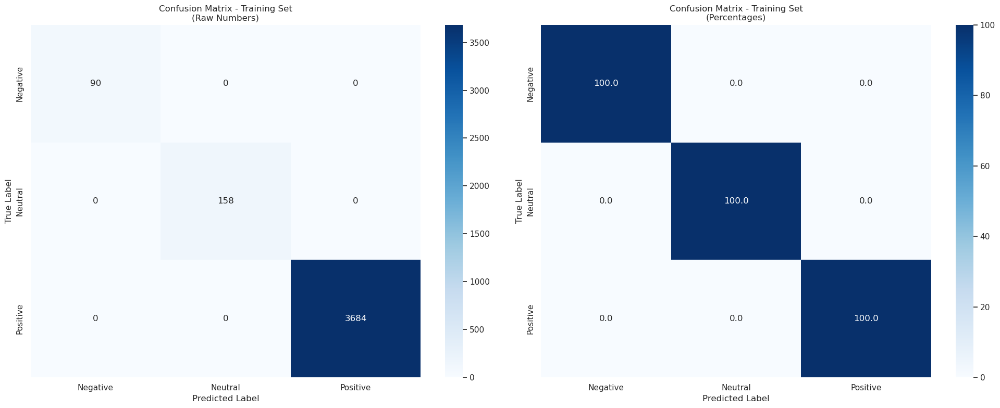


Classification Report - Training Set
              precision    recall  f1-score   support

    Negative       1.00      1.00      1.00        90
     Neutral       1.00      1.00      1.00       158
    Positive       1.00      1.00      1.00      3684

    accuracy                           1.00      3932
   macro avg       1.00      1.00      1.00      3932
weighted avg       1.00      1.00      1.00      3932


F1 Scores per class:
Class Negative: 1.0000
Class Neutral: 1.0000
Class Positive: 1.0000
Creating test embeddings...


Batches:   0%|          | 0/32 [00:00<?, ?it/s]


Test Set Evaluation:
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


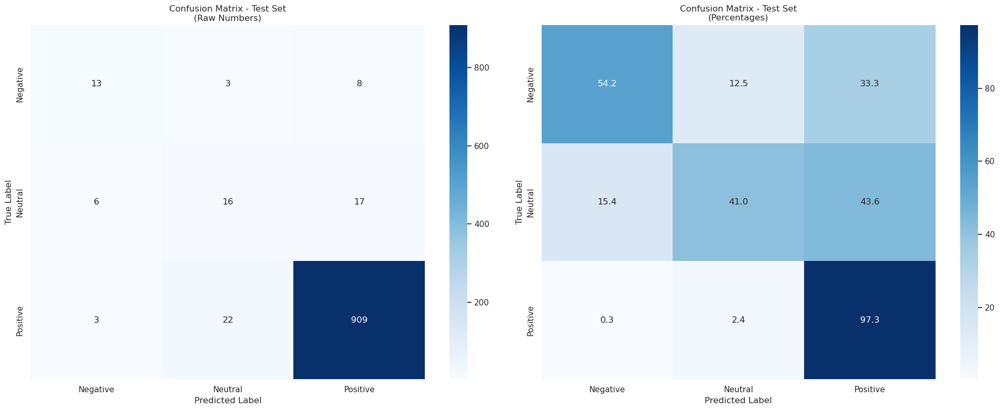


Classification Report - Test Set
              precision    recall  f1-score   support

    Negative       0.59      0.54      0.57        24
     Neutral       0.39      0.41      0.40        39
    Positive       0.97      0.97      0.97       934

    accuracy                           0.94       997
   macro avg       0.65      0.64      0.65       997
weighted avg       0.94      0.94      0.94       997


F1 Scores per class:
Class Negative: 0.5652
Class Neutral: 0.4000
Class Positive: 0.9732

Test predictions have been added to df_test and saved as 'sentiment_test_model_3.csv'

Training Set Misclassifications:

Misclassified Examples:
Original Text | True Label | Predicted Label | Confidence
--------------------------------------------------------------------------------

Test Set Misclassifications:

Misclassified Examples:
Original Text | True Label | Predicted Label | Confidence
--------------------------------------------------------------------------------
Superior voice r

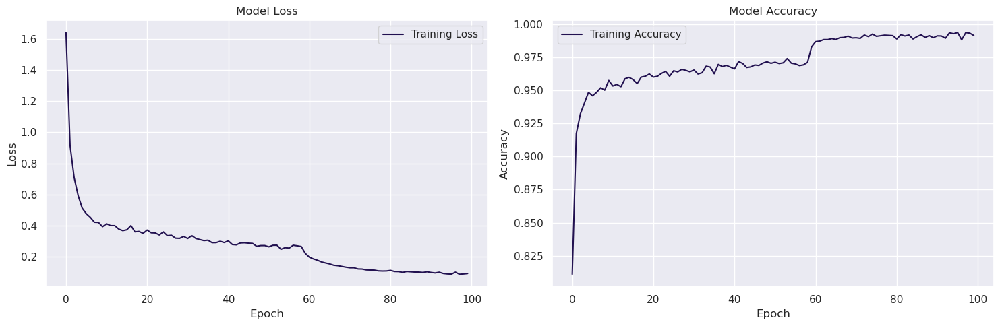


Performance Metrics:

Training Set Performance:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
total_inference_time: 0.4638 seconds
average_time_per_sample: 0.0001 seconds
samples_per_second: 8478.40
memory_usage_mb: 5.90 MB
batch_size: 32.00

Test Set Performance:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
total_inference_time: 0.2113 seconds
average_time_per_sample: 0.0002 seconds
samples_per_second: 4718.77
memory_usage_mb: 0.02 MB
batch_size: 32.00

Model Complexity Metrics:
trainable_parameters: 1,989,123
non_trainable_parameters: 1,664
total_parameters: 1,990,787
model_size_mb: 22.85 MB
model_type: Bidirectional LSTM


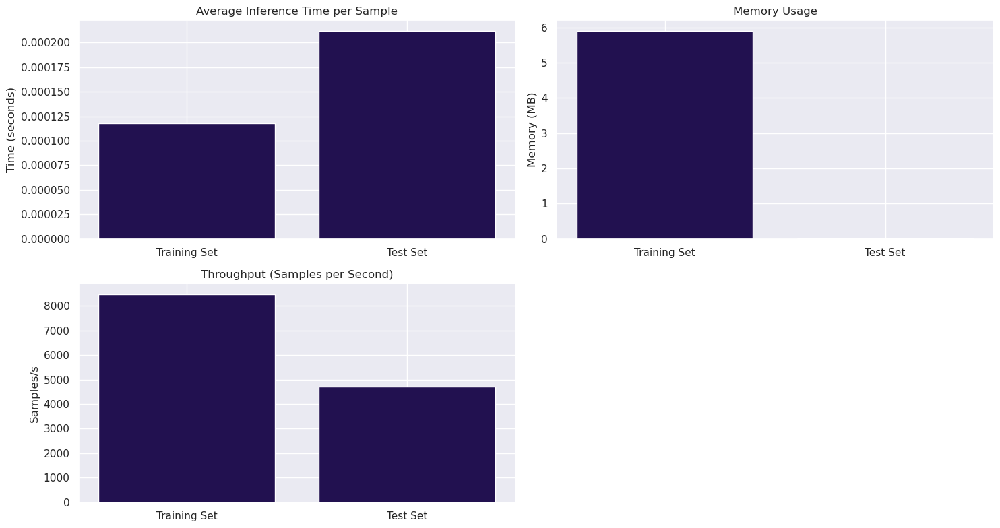


Performance metrics have been saved to 'model3_performance_metrics.csv'

Comprehensive Model Summary:
Model: Model 3 (Bidirectional LSTM)
Total Parameters: 1,990,787
Model Size: 22.85 MB
Average Inference Time: 0.0002 seconds per sample
Throughput: 4718.77 samples/second
Memory Usage: 0.02 MB
Final Training Accuracy: 0.9913
Total Training Epochs: 100


In [65]:
import numpy as np
import pandas as pd
from sentence_transformers import SentenceTransformer
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, LSTM, Bidirectional
from tensorflow.keras.regularizers import l2
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report, f1_score
from imblearn.combine import SMOTETomek
import seaborn as sns
import matplotlib.pyplot as plt

# Load previous test results
df_test = pd.read_csv('sentiment_test_model_2.csv')


# 1. Data preparation
le = LabelEncoder()
y = le.fit_transform(df_train['sentiment'])

# 2. SBERT embeddings
model_sbert = SentenceTransformer('all-MiniLM-L6-v2')

print("Creating embeddings...")
X = model_sbert.encode(df_train['combined_review_cleaned'].tolist(), 
                      batch_size=32, 
                      show_progress_bar=True)

# 3. Apply SMOTE-Tomek on entire training data
print("\nOriginal dataset shape:", dict(zip(np.unique(y), np.bincount(y))))

smote_tomek = SMOTETomek(random_state=42, n_jobs=-1)
X_resampled, y_resampled = smote_tomek.fit_resample(X, y)

print("Resampled dataset shape:", dict(zip(np.unique(y_resampled), np.bincount(y_resampled))))

# 4. Reshape data for LSTM
X_resampled = X_resampled.reshape(X_resampled.shape[0], 1, X_resampled.shape[1])
X = X.reshape(X.shape[0], 1, X.shape[1])

# 5. Create LSTM model
l2_lambda = 0.001

model = Sequential([
    # Bidirectional LSTM layers
    Bidirectional(LSTM(256, return_sequences=True, 
                      kernel_regularizer=l2(l2_lambda),
                      recurrent_regularizer=l2(l2_lambda))),
    BatchNormalization(),
    Dropout(0.5),
    
    Bidirectional(LSTM(128,
                      kernel_regularizer=l2(l2_lambda),
                      recurrent_regularizer=l2(l2_lambda))),
    BatchNormalization(),
    Dropout(0.5),
    
    Dense(64, activation='relu', kernel_regularizer=l2(l2_lambda)),
    BatchNormalization(),
    Dropout(0.3),
    
    Dense(3, activation='softmax')
])

# 6. Compile model
initial_learning_rate = 0.001
optimizer = tf.keras.optimizers.Adam(learning_rate=initial_learning_rate)

model.compile(
    optimizer=optimizer,
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# 7. Callbacks (modified to monitor training loss)
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=10,
        restore_best_weights=True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='loss',
        factor=0.2,
        patience=5,
        min_lr=0.00001
    ),
    tf.keras.callbacks.ModelCheckpoint(
        'best_model.h5',
        monitor='loss',
        save_best_only=True
    )
]

# 8. Train model on entire resampled data
history = model.fit(
    X_resampled,
    y_resampled,
    epochs=100,
    batch_size=32,
    callbacks=callbacks
)

# 9. Evaluation function
def create_confusion_matrix(X, y, dataset_name):
    # Reshape X if needed
    if len(X.shape) == 2:
        X = X.reshape(X.shape[0], 1, X.shape[1])
    
    predictions = model.predict(X)
    pred_classes = np.argmax(predictions, axis=1)
    
    # Calculate confusion matrices
    cm = confusion_matrix(y, pred_classes)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))
    
    # Plot raw numbers
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax1)
    ax1.set_title(f'Confusion Matrix - {dataset_name}\n(Raw Numbers)')
    ax1.set_ylabel('True Label')
    ax1.set_xlabel('Predicted Label')
    
    # Plot percentages
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax2)
    ax2.set_title(f'Confusion Matrix - {dataset_name}\n(Percentages)')
    ax2.set_ylabel('True Label')
    ax2.set_xlabel('Predicted Label')
    
    plt.tight_layout()
    plt.show()
    
    # Print classification report
    print(f"\nClassification Report - {dataset_name}")
    print(classification_report(y, pred_classes, 
                              target_names=le.classes_))
    
    # Print F1 scores
    f1_scores = f1_score(y, pred_classes, average=None)
    print("\nF1 Scores per class:")
    for i, score in enumerate(f1_scores):
        print(f"Class {le.classes_[i]}: {score:.4f}")
    
    return pred_classes, predictions

# 10. Training Set Evaluation
print("\nTraining Set Evaluation:")
train_pred_classes, train_pred_probs = create_confusion_matrix(
    X, y, "Training Set"
)

# 11. Test set evaluation
print("Creating test embeddings...")
X_test = model_sbert.encode(df_test['combined_review_cleaned'].tolist(), 
                           batch_size=32, 
                           show_progress_bar=True)
X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
y_test = le.transform(df_test['sentiment'])

print("\nTest Set Evaluation:")
test_pred_classes, test_pred_probs = create_confusion_matrix(
    X_test, y_test, "Test Set"
)

# Store predictions in df_test
df_test['predicted_sentiment_model_3'] = le.inverse_transform(test_pred_classes)
df_test.to_csv('sentiment_test_model_3.csv', index=False)
print("\nTest predictions have been added to df_test and saved as 'sentiment_test_model_3.csv'")


# 12. Analyze misclassifications
def get_misclassified_examples(X_embeddings, y_true, texts, pred_classes, pred_probs, n=5):
    misclassified_idx = np.where(y_true != pred_classes)[0]
    
    print("\nMisclassified Examples:")
    print("Original Text | True Label | Predicted Label | Confidence")
    print("-" * 80)
    
    confidences = np.max(pred_probs, axis=1)[misclassified_idx]
    sorted_indices = misclassified_idx[np.argsort(confidences)]
    
    for idx in sorted_indices[:n]:
        true_label = le.classes_[y_true[idx]]
        pred_label = le.classes_[pred_classes[idx]]
        confidence = np.max(pred_probs[idx]) * 100
        text = texts[idx][:100] + "..."
        print(f"{text} | {true_label} | {pred_label} | {confidence:.2f}%")

# Get misclassified examples
print("\nTraining Set Misclassifications:")
get_misclassified_examples(
    X, 
    y, 
    df_train['combined_review_cleaned'].tolist(),
    train_pred_classes,
    train_pred_probs
)

print("\nTest Set Misclassifications:")
get_misclassified_examples(
    X_test, 
    y_test, 
    df_test['combined_review_cleaned'].tolist(),
    test_pred_classes,
    test_pred_probs
)

# 13. Plot training history
plt.figure(figsize=(15,5))

# Loss plot
plt.subplot(1,2,1)
plt.plot(history.history['loss'], label='Training Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Accuracy plot
plt.subplot(1,2,2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# 14. Save the model
model.save('model3.h5')

# 15. Function to predict new texts
def predict_sentiment(texts):
    embeddings = model_sbert.encode(texts)
    embeddings = embeddings.reshape(embeddings.shape[0], 1, embeddings.shape[1])
    predictions = model.predict(embeddings)
    pred_classes = np.argmax(predictions, axis=1)
    confidences = np.max(predictions, axis=1)
    return [(le.classes_[pred], conf) for pred, conf in zip(pred_classes, confidences)]


# 16. Performance Metrics Evaluation
import time
import psutil
import os
from memory_profiler import profile

def measure_inference_metrics(model, X, batch_size=32):
    # Ensure proper shape for LSTM
    if len(X.shape) == 2:
        X = X.reshape(X.shape[0], 1, X.shape[1])
    
    # Warm-up run
    _ = model.predict(X[:batch_size])
    
    # Memory usage before inference
    process = psutil.Process(os.getpid())
    memory_before = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Measure inference time
    start_time = time.time()
    predictions = model.predict(X, batch_size=batch_size)
    end_time = time.time()
    
    # Memory usage after inference
    memory_after = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Calculate metrics
    total_time = end_time - start_time
    samples = len(X)
    avg_time_per_sample = total_time / samples
    memory_used = memory_after - memory_before
    
    return {
        'total_inference_time': total_time,
        'average_time_per_sample': avg_time_per_sample,
        'samples_per_second': samples / total_time,
        'memory_usage_mb': memory_used,
        'batch_size': batch_size
    }

# Get model complexity metrics
def get_model_complexity():
    trainable_params = model.count_params()
    non_trainable_params = sum([tf.keras.backend.count_params(w) for w in model.non_trainable_weights])
    
    return {
        'trainable_parameters': trainable_params,
        'non_trainable_parameters': non_trainable_params,
        'total_parameters': trainable_params + non_trainable_params,
        'model_size_mb': os.path.getsize('model3.h5') / (1024 * 1024),
        'model_type': 'Bidirectional LSTM'
    }

# Measure and print performance metrics
print("\nPerformance Metrics:")
print("\nTraining Set Performance:")
train_metrics = measure_inference_metrics(model, X)
for metric, value in train_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nTest Set Performance:")
test_metrics = measure_inference_metrics(model, X_test)
for metric, value in test_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nModel Complexity Metrics:")
complexity_metrics = get_model_complexity()
for metric, value in complexity_metrics.items():
    if isinstance(value, str):
        print(f"{metric}: {value}")
    elif 'size' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:,}")

# Visualize performance metrics
plt.figure(figsize=(15,8))

# Inference time comparison
plt.subplot(2,2,1)
metrics_data = [train_metrics['average_time_per_sample'], test_metrics['average_time_per_sample']]
plt.bar(['Training Set', 'Test Set'], metrics_data)
plt.title('Average Inference Time per Sample')
plt.ylabel('Time (seconds)')

# Memory usage comparison
plt.subplot(2,2,2)
memory_data = [train_metrics['memory_usage_mb'], test_metrics['memory_usage_mb']]
plt.bar(['Training Set', 'Test Set'], memory_data)
plt.title('Memory Usage')
plt.ylabel('Memory (MB)')

# Throughput comparison
plt.subplot(2,2,3)
throughput_data = [train_metrics['samples_per_second'], test_metrics['samples_per_second']]
plt.bar(['Training Set', 'Test Set'], throughput_data)
plt.title('Throughput (Samples per Second)')
plt.ylabel('Samples/s')

plt.tight_layout()
plt.show()

# Store all metrics for model comparison
performance_metrics = {
    'model3': {  # Changed to model3 to match your code
        'train': train_metrics,
        'test': test_metrics,
        'complexity': complexity_metrics,
        'training_history': {
            'final_loss': history.history['loss'][-1],
            'final_accuracy': history.history['accuracy'][-1],
            'epochs_trained': len(history.history['loss'])
        },
        'model_architecture': 'Bidirectional LSTM'
    }
}

# Create detailed metrics DataFrame
def create_metrics_df(metrics_dict):
    data = {
        'Model': [],
        'Architecture': [],
        'Training Time per Sample (s)': [],
        'Test Time per Sample (s)': [],
        'Training Memory (MB)': [],
        'Test Memory (MB)': [],
        'Model Size (MB)': [],
        'Total Parameters': [],
        'Final Training Loss': [],
        'Final Training Accuracy': [],
        'Epochs Trained': [],
        'Throughput (samples/s)': []
    }
    
    for model_name, metrics in metrics_dict.items():
        data['Model'].append(model_name)
        data['Architecture'].append(metrics['model_architecture'])
        data['Training Time per Sample (s)'].append(metrics['train']['average_time_per_sample'])
        data['Test Time per Sample (s)'].append(metrics['test']['average_time_per_sample'])
        data['Training Memory (MB)'].append(metrics['train']['memory_usage_mb'])
        data['Test Memory (MB)'].append(metrics['test']['memory_usage_mb'])
        data['Model Size (MB)'].append(metrics['complexity']['model_size_mb'])
        data['Total Parameters'].append(metrics['complexity']['total_parameters'])
        data['Final Training Loss'].append(metrics['training_history']['final_loss'])
        data['Final Training Accuracy'].append(metrics['training_history']['final_accuracy'])
        data['Epochs Trained'].append(metrics['training_history']['epochs_trained'])
        data['Throughput (samples/s)'].append(metrics['test']['samples_per_second'])
    
    return pd.DataFrame(data)

# Create and save metrics DataFrame
metrics_df = create_metrics_df(performance_metrics)
metrics_df.to_csv('model3_performance_metrics.csv', index=False)
print("\nPerformance metrics have been saved to 'model3_performance_metrics.csv'")

# Print comprehensive summary
print("\nComprehensive Model Summary:")
print("=" * 50)
print(f"Model: Model 3 (Bidirectional LSTM)")
print(f"Total Parameters: {complexity_metrics['total_parameters']:,}")
print(f"Model Size: {complexity_metrics['model_size_mb']:.2f} MB")
print(f"Average Inference Time: {test_metrics['average_time_per_sample']:.4f} seconds per sample")
print(f"Throughput: {test_metrics['samples_per_second']:.2f} samples/second")
print(f"Memory Usage: {test_metrics['memory_usage_mb']:.2f} MB")
print(f"Final Training Accuracy: {history.history['accuracy'][-1]:.4f}")
print(f"Total Training Epochs: {len(history.history['loss'])}")


## 4. SBERT + SMOTE Tomek + GRU

Creating embeddings...


Batches:   0%|          | 0/123 [00:00<?, ?it/s]


Original dataset shape: {0: 90, 1: 158, 2: 3684}
Resampled dataset shape: {0: 3684, 1: 3684, 2: 3684}
Epoch 1/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7107 - loss: 5.7213

346/346 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7109 - loss: 5.7151 - learning_rate: 0.0010
Epoch 2/100
342/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9029 - loss: 1.3915

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9029 - loss: 1.3882 - learning_rate: 0.0010
Epoch 3/100
342/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9055 - loss: 0.7505

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9056 - loss: 0.7495 - learning_rate: 0.0010
Epoch 4/100
336/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9179 - loss: 0.5434

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9178 - loss: 0.5433 - learning_rate: 0.0010
Epoch 5/100
342/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9212 - loss: 0.5030

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9211 - loss: 0.5031 - learning_rate: 0.0010
Epoch 6/100
342/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9175 - loss: 0.4972

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9175 - loss: 0.4971 - learning_rate: 0.0010
Epoch 7/100
342/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9268 - loss: 0.4572

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9267 - loss: 0.4574 - learning_rate: 0.0010
Epoch 8/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9281 - loss: 0.4654 - learning_rate: 0.0010
Epoch 9/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9195 - loss: 0.4875 - learning_rate: 0.0010
Epoch 10/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9190 - loss: 0.4699

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9191 - loss: 0.4699 - learning_rate: 0.0010
Epoch 11/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9212 - loss: 0.4646 - learning_rate: 0.0010
Epoch 12/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9305 - loss: 0.4543

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9304 - loss: 0.4543 - learning_rate: 0.0010
Epoch 13/100
339/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9237 - loss: 0.4615

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9237 - loss: 0.4613 - learning_rate: 0.0010
Epoch 14/100
341/346 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9276 - loss: 0.4399

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9276 - loss: 0.4400 - learning_rate: 0.0010
Epoch 15/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9218 - loss: 0.4637 - learning_rate: 0.0010
Epoch 16/100
335/346 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9316 - loss: 0.4434

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9317 - loss: 0.4427 - learning_rate: 0.0010
Epoch 17/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9281 - loss: 0.4314 - learning_rate: 0.0010
Epoch 18/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9244 - loss: 0.4473 - learning_rate: 0.0010
Epoch 19/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9321 - loss: 0.4181 - learning_rate: 0.0010
Epoch 20/100
337/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9352 - loss: 0.4237

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9352 - loss: 0.4234 - learning_rate: 0.0010
Epoch 21/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9280 - loss: 0.4206 - learning_rate: 0.0010
Epoch 22/100
336/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9307 - loss: 0.4144

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9307 - loss: 0.4142 - learning_rate: 0.0010
Epoch 23/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9338 - loss: 0.4032

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9338 - loss: 0.4032 - learning_rate: 0.0010
Epoch 24/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9270 - loss: 0.4206 - learning_rate: 0.0010
Epoch 25/100
339/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9298 - loss: 0.4104

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9299 - loss: 0.4100 - learning_rate: 0.0010
Epoch 26/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9282 - loss: 0.4077 - learning_rate: 0.0010
Epoch 27/100
340/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9403 - loss: 0.3684

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9402 - loss: 0.3686 - learning_rate: 0.0010
Epoch 28/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9367 - loss: 0.3822 - learning_rate: 0.0010
Epoch 29/100
345/346 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9333 - loss: 0.3793

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9333 - loss: 0.3793 - learning_rate: 0.0010
Epoch 30/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9320 - loss: 0.3692 - learning_rate: 0.0010
Epoch 31/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9251 - loss: 0.4045 - learning_rate: 0.0010
Epoch 32/100
338/346 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9368 - loss: 0.3655

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9368 - loss: 0.3656 - learning_rate: 0.0010
Epoch 33/100
345/346 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9367 - loss: 0.3571

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9367 - loss: 0.3571 - learning_rate: 0.0010
Epoch 34/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9397 - loss: 0.3513 - learning_rate: 0.0010
Epoch 35/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9338 - loss: 0.3695 - learning_rate: 0.0010
Epoch 36/100
337/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9421 - loss: 0.3459

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9420 - loss: 0.3462 - learning_rate: 0.0010
Epoch 37/100
345/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9400 - loss: 0.3585

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9400 - loss: 0.3584 - learning_rate: 0.0010
Epoch 38/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9289 - loss: 0.3720 - learning_rate: 0.0010
Epoch 39/100
339/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9402 - loss: 0.3379

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9401 - loss: 0.3382 - learning_rate: 0.0010
Epoch 40/100
343/346 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9429 - loss: 0.3347

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9429 - loss: 0.3347 - learning_rate: 0.0010
Epoch 41/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9443 - loss: 0.3332 - learning_rate: 0.0010
Epoch 42/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9387 - loss: 0.3366 - learning_rate: 0.0010
Epoch 43/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9408 - loss: 0.3404 - learning_rate: 0.0010
Epoch 44/100
337/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9428 - loss: 0.3329

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9428 - loss: 0.3328 - learning_rate: 0.0010
Epoch 45/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9438 - loss: 0.3374 - learning_rate: 0.0010
Epoch 46/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9424 - loss: 0.3431 - learning_rate: 0.0010
Epoch 47/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9387 - loss: 0.3295 - learning_rate: 0.0010
Epoch 48/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9414 - loss: 0.3241

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9414 - loss: 0.3240 - learning_rate: 0.0010
Epoch 49/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9406 - loss: 0.3255 - learning_rate: 0.0010
Epoch 50/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9394 - loss: 0.3331 - learning_rate: 0.0010
Epoch 51/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9472 - loss: 0.3062 - learning_rate: 0.0010
Epoch 52/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9399 - loss: 0.3301 - learning_rate: 0.0010
Epoch 53/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9459 - loss: 0.3149 - learning_rate: 0.0010
Epoch 54/100
338/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9567 - loss: 0.2683

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9568 - loss: 0.2680 - learning_rate: 2.0000e-04
Epoch 55/100
340/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9679 - loss: 0.2296

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9680 - loss: 0.2295 - learning_rate: 2.0000e-04
Epoch 56/100
342/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9717 - loss: 0.2118

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9717 - loss: 0.2117 - learning_rate: 2.0000e-04
Epoch 57/100
342/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9710 - loss: 0.1999

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9710 - loss: 0.1998 - learning_rate: 2.0000e-04
Epoch 58/100
343/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9717 - loss: 0.1919

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9717 - loss: 0.1918 - learning_rate: 2.0000e-04
Epoch 59/100
340/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9755 - loss: 0.1717

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9755 - loss: 0.1716 - learning_rate: 2.0000e-04
Epoch 60/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9751 - loss: 0.1641

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9751 - loss: 0.1641 - learning_rate: 2.0000e-04
Epoch 61/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9799 - loss: 0.1565

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9799 - loss: 0.1565 - learning_rate: 2.0000e-04
Epoch 62/100
337/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9801 - loss: 0.1501

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9800 - loss: 0.1502 - learning_rate: 2.0000e-04
Epoch 63/100
339/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9782 - loss: 0.1451

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9782 - loss: 0.1451 - learning_rate: 2.0000e-04
Epoch 64/100
345/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9785 - loss: 0.1478

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9785 - loss: 0.1478 - learning_rate: 2.0000e-04
Epoch 65/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9724 - loss: 0.1515 - learning_rate: 2.0000e-04
Epoch 66/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9796 - loss: 0.1418 - learning_rate: 2.0000e-04
Epoch 67/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9762 - loss: 0.1508 - learning_rate: 2.0000e-04
Epoch 68/100
342/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9747 - loss: 0.1439

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9747 - loss: 0.1438 - learning_rate: 2.0000e-04
Epoch 69/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9795 - loss: 0.1311 - learning_rate: 2.0000e-04
Epoch 70/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9770 - loss: 0.1372 - learning_rate: 2.0000e-04
Epoch 71/100
345/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9756 - loss: 0.1387

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9757 - loss: 0.1387 - learning_rate: 2.0000e-04
Epoch 72/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9762 - loss: 0.1310 - learning_rate: 2.0000e-04
Epoch 73/100
343/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9739 - loss: 0.1321

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9740 - loss: 0.1320 - learning_rate: 2.0000e-04
Epoch 74/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9807 - loss: 0.1231 - learning_rate: 2.0000e-04
Epoch 75/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9809 - loss: 0.1277 - learning_rate: 2.0000e-04
Epoch 76/100
340/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9816 - loss: 0.1195

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9816 - loss: 0.1195 - learning_rate: 2.0000e-04
Epoch 77/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9815 - loss: 0.1181 - learning_rate: 2.0000e-04
Epoch 78/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9752 - loss: 0.1314 - learning_rate: 2.0000e-04
Epoch 79/100
341/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9815 - loss: 0.1207

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9815 - loss: 0.1207 - learning_rate: 2.0000e-04
Epoch 80/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9819 - loss: 0.1170 - learning_rate: 2.0000e-04
Epoch 81/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9812 - loss: 0.1209 - learning_rate: 2.0000e-04
Epoch 82/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9792 - loss: 0.1231 - learning_rate: 2.0000e-04
Epoch 83/100
339/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9816 - loss: 0.1151

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9816 - loss: 0.1152 - learning_rate: 2.0000e-04
Epoch 84/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9792 - loss: 0.1194 - learning_rate: 2.0000e-04
Epoch 85/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9786 - loss: 0.1236 - learning_rate: 2.0000e-04
Epoch 86/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9785 - loss: 0.1276 - learning_rate: 2.0000e-04
Epoch 87/100
342/346 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9847 - loss: 0.1097

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9846 - loss: 0.1097 - learning_rate: 2.0000e-04
Epoch 88/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9781 - loss: 0.1200 - learning_rate: 2.0000e-04
Epoch 89/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9825 - loss: 0.1119 - learning_rate: 2.0000e-04
Epoch 90/100
335/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9835 - loss: 0.1111

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9835 - loss: 0.1111 - learning_rate: 2.0000e-04
Epoch 91/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9741 - loss: 0.1339 - learning_rate: 2.0000e-04
Epoch 92/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9791 - loss: 0.1194 - learning_rate: 2.0000e-04
Epoch 93/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9819 - loss: 0.1107

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9820 - loss: 0.1106 - learning_rate: 4.0000e-05
Epoch 94/100
343/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9864 - loss: 0.0968

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9864 - loss: 0.0968 - learning_rate: 4.0000e-05
Epoch 95/100
339/346 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9897 - loss: 0.0899

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9897 - loss: 0.0899 - learning_rate: 4.0000e-05
Epoch 96/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9889 - loss: 0.0924 - learning_rate: 4.0000e-05
Epoch 97/100
335/346 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9889 - loss: 0.0912

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9889 - loss: 0.0912 - learning_rate: 4.0000e-05
Epoch 98/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9915 - loss: 0.0877

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9915 - loss: 0.0877 - learning_rate: 4.0000e-05
Epoch 99/100
345/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9891 - loss: 0.0863

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9891 - loss: 0.0863 - learning_rate: 4.0000e-05
Epoch 100/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9918 - loss: 0.0798

346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9918 - loss: 0.0798 - learning_rate: 4.0000e-05

Training Set Evaluation:
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


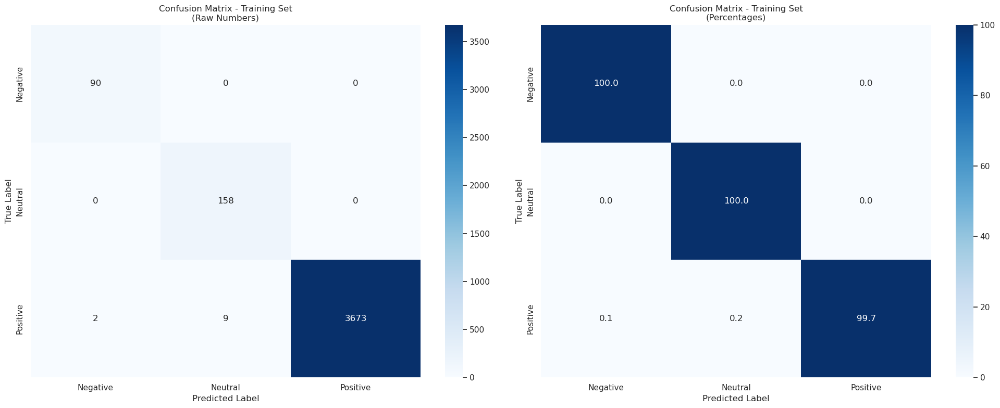


Classification Report - Training Set
              precision    recall  f1-score   support

    Negative       0.98      1.00      0.99        90
     Neutral       0.95      1.00      0.97       158
    Positive       1.00      1.00      1.00      3684

    accuracy                           1.00      3932
   macro avg       0.97      1.00      0.99      3932
weighted avg       1.00      1.00      1.00      3932


F1 Scores per class:
Class Negative: 0.9890
Class Neutral: 0.9723
Class Positive: 0.9985
Creating test embeddings...


Batches:   0%|          | 0/32 [00:00<?, ?it/s]


Test Set Evaluation:
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


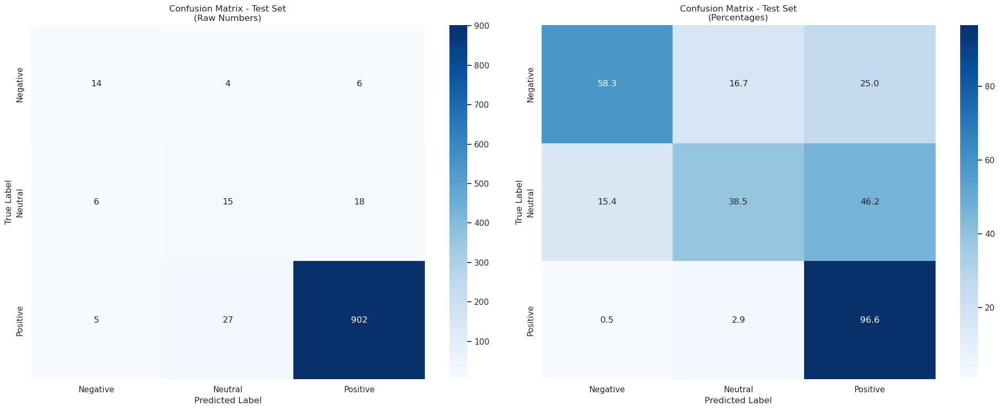


Classification Report - Test Set
              precision    recall  f1-score   support

    Negative       0.56      0.58      0.57        24
     Neutral       0.33      0.38      0.35        39
    Positive       0.97      0.97      0.97       934

    accuracy                           0.93       997
   macro avg       0.62      0.64      0.63       997
weighted avg       0.94      0.93      0.94       997


F1 Scores per class:
Class Negative: 0.5714
Class Neutral: 0.3529
Class Positive: 0.9699

Test predictions have been added to df_test and saved as 'sentiment_test_model_4.csv'

Training Set Misclassifications:

Misclassified Examples:
Original Text | True Label | Predicted Label | Confidence
--------------------------------------------------------------------------------
Nicehowever Thoughts of being able to have the Echo grow as I added to the list of tasks excited me ... | Positive | Neutral | 50.45%
My son likes it This was a present for my son but he seems to be enjoying it

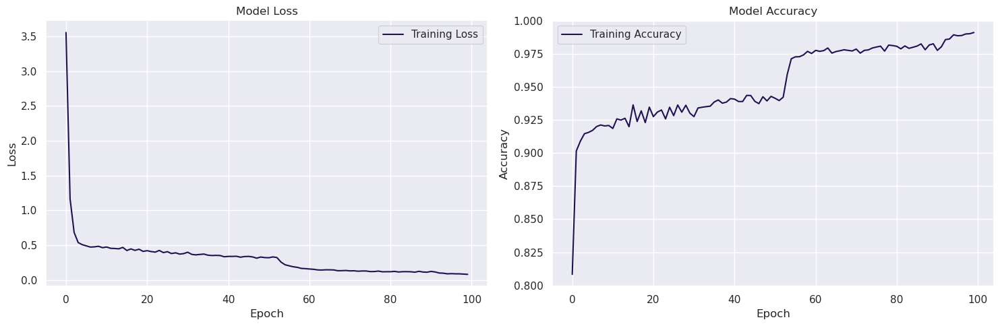


Performance Metrics:

Training Set Performance:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
total_inference_time: 0.3769 seconds
average_time_per_sample: 0.0001 seconds
samples_per_second: 10433.00
memory_usage_mb: 0.00 MB
batch_size: 32.00

Test Set Performance:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
total_inference_time: 0.1967 seconds
average_time_per_sample: 0.0002 seconds
samples_per_second: 5068.15
memory_usage_mb: 0.00 MB
batch_size: 32.00

Model Complexity Metrics:
trainable_parameters: 412,675
non_trainable_parameters: 640
total_parameters: 413,315
model_size_mb: 4.78 MB
model_type: Bidirectional GRU


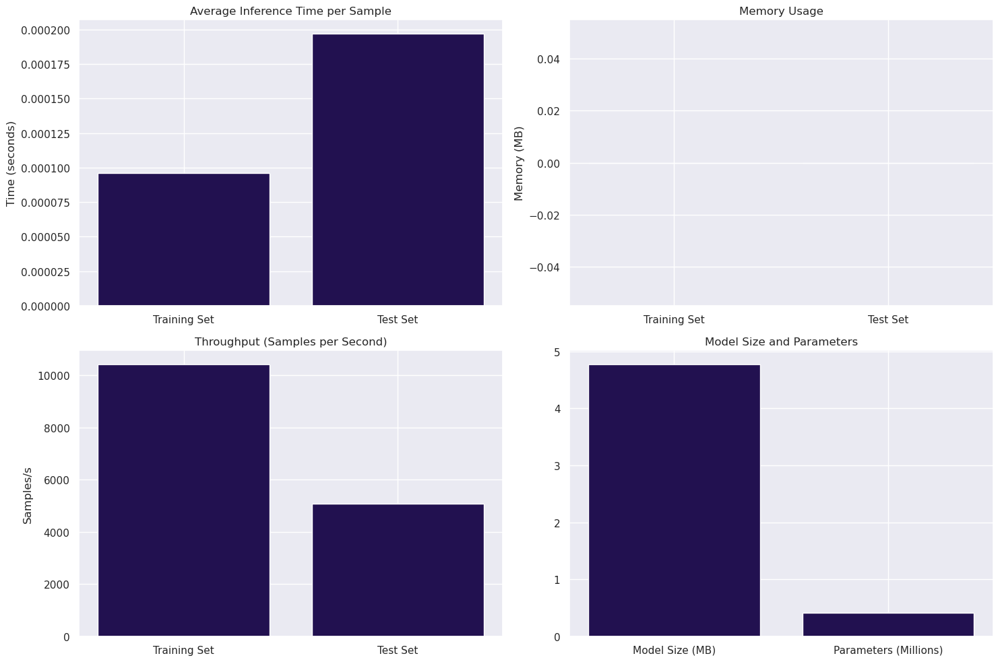


Performance metrics have been saved to 'model4_performance_metrics.csv'

Comprehensive Model Summary:
Model: Model 4 (Bidirectional GRU)
Total Parameters: 413,315
Model Size: 4.78 MB
Average Inference Time: 0.0002 seconds per sample
Throughput: 5068.15 samples/second
Memory Usage: 0.00 MB
Final Training Accuracy: 0.9910
Total Training Epochs: 100


In [66]:
import numpy as np
import pandas as pd
from sentence_transformers import SentenceTransformer
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, GRU, Bidirectional
from tensorflow.keras.regularizers import l2
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report, f1_score
from imblearn.combine import SMOTETomek
import seaborn as sns
import matplotlib.pyplot as plt

# Load previous test results
df_test = pd.read_csv('sentiment_test_model_3.csv')


# 1. Data preparation
le = LabelEncoder()
y = le.fit_transform(df_train['sentiment'])

# 2. SBERT embeddings
model_sbert = SentenceTransformer('all-MiniLM-L6-v2')

print("Creating embeddings...")
X = model_sbert.encode(df_train['combined_review_cleaned'].tolist(), 
                      batch_size=32, 
                      show_progress_bar=True)

# 3. Apply SMOTE-Tomek on entire training data
print("\nOriginal dataset shape:", dict(zip(np.unique(y), np.bincount(y))))

smote_tomek = SMOTETomek(random_state=42, n_jobs=-1)
X_resampled, y_resampled = smote_tomek.fit_resample(X, y)

print("Resampled dataset shape:", dict(zip(np.unique(y_resampled), np.bincount(y_resampled))))

# 4. Reshape data for GRU
X_resampled = X_resampled.reshape(X_resampled.shape[0], 1, X_resampled.shape[1])
X = X.reshape(X.shape[0], 1, X.shape[1])

# 5. Create GRU model
model = Sequential([
    Bidirectional(GRU(128, 
                     kernel_regularizer=l2(0.01),
                     recurrent_regularizer=l2(0.01))),
    BatchNormalization(),
    Dropout(0.5),
    
    Dense(64, activation='relu', kernel_regularizer=l2(0.01)),
    BatchNormalization(),
    Dropout(0.4),
    
    Dense(3, activation='softmax')
])

# 6. Compile model
initial_learning_rate = 0.001
optimizer = tf.keras.optimizers.Adam(learning_rate=initial_learning_rate)

model.compile(
    optimizer=optimizer,
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# 7. Callbacks (modified to monitor training loss)
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=10,
        restore_best_weights=True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='loss',
        factor=0.2,
        patience=5,
        min_lr=0.00001
    ),
    tf.keras.callbacks.ModelCheckpoint(
        'best_model.h5',
        monitor='loss',
        save_best_only=True
    )
]

# 8. Train model on entire resampled data
history = model.fit(
    X_resampled,
    y_resampled,
    epochs=100,
    batch_size=32,
    callbacks=callbacks
)

# 9. Evaluation function
def create_confusion_matrix(X, y, dataset_name):
    # Reshape X if needed
    if len(X.shape) == 2:
        X = X.reshape(X.shape[0], 1, X.shape[1])
    
    predictions = model.predict(X)
    pred_classes = np.argmax(predictions, axis=1)
    
    # Calculate confusion matrices
    cm = confusion_matrix(y, pred_classes)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))
    
    # Plot raw numbers
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax1)
    ax1.set_title(f'Confusion Matrix - {dataset_name}\n(Raw Numbers)')
    ax1.set_ylabel('True Label')
    ax1.set_xlabel('Predicted Label')
    
    # Plot percentages
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax2)
    ax2.set_title(f'Confusion Matrix - {dataset_name}\n(Percentages)')
    ax2.set_ylabel('True Label')
    ax2.set_xlabel('Predicted Label')
    
    plt.tight_layout()
    plt.show()
    
    # Print classification report
    print(f"\nClassification Report - {dataset_name}")
    print(classification_report(y, pred_classes, 
                              target_names=le.classes_))
    
    # Print F1 scores
    f1_scores = f1_score(y, pred_classes, average=None)
    print("\nF1 Scores per class:")
    for i, score in enumerate(f1_scores):
        print(f"Class {le.classes_[i]}: {score:.4f}")
    
    return pred_classes, predictions

# 10. Training Set Evaluation
print("\nTraining Set Evaluation:")
train_pred_classes, train_pred_probs = create_confusion_matrix(
    X, y, "Training Set"
)

# 11. Test set evaluation
print("Creating test embeddings...")
X_test = model_sbert.encode(df_test['combined_review_cleaned'].tolist(), 
                           batch_size=32, 
                           show_progress_bar=True)
X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
y_test = le.transform(df_test['sentiment'])

print("\nTest Set Evaluation:")
test_pred_classes, test_pred_probs = create_confusion_matrix(
    X_test, y_test, "Test Set"
)

# Store predictions in df_test
df_test['predicted_sentiment_model_4'] = le.inverse_transform(test_pred_classes)
df_test.to_csv('sentiment_test_model_4.csv', index=False)
print("\nTest predictions have been added to df_test and saved as 'sentiment_test_model_4.csv'")


# 12. Analyze misclassifications
def get_misclassified_examples(X_embeddings, y_true, texts, pred_classes, pred_probs, n=5):
    misclassified_idx = np.where(y_true != pred_classes)[0]
    
    print("\nMisclassified Examples:")
    print("Original Text | True Label | Predicted Label | Confidence")
    print("-" * 80)
    
    confidences = np.max(pred_probs, axis=1)[misclassified_idx]
    sorted_indices = misclassified_idx[np.argsort(confidences)]
    
    for idx in sorted_indices[:n]:
        true_label = le.classes_[y_true[idx]]
        pred_label = le.classes_[pred_classes[idx]]
        confidence = np.max(pred_probs[idx]) * 100
        text = texts[idx][:100] + "..."
        print(f"{text} | {true_label} | {pred_label} | {confidence:.2f}%")

# Get misclassified examples
print("\nTraining Set Misclassifications:")
get_misclassified_examples(
    X, 
    y, 
    df_train['combined_review_cleaned'].tolist(),
    train_pred_classes,
    train_pred_probs
)

print("\nTest Set Misclassifications:")
get_misclassified_examples(
    X_test, 
    y_test, 
    df_test['combined_review_cleaned'].tolist(),
    test_pred_classes,
    test_pred_probs
)

# 13. Plot training history
plt.figure(figsize=(15,5))

# Loss plot
plt.subplot(1,2,1)
plt.plot(history.history['loss'], label='Training Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Accuracy plot
plt.subplot(1,2,2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# 14. Save the model
model.save('model4.h5')

# 15. Function to predict new texts
def predict_sentiment(texts):
    embeddings = model_sbert.encode(texts)
    embeddings = embeddings.reshape(embeddings.shape[0], 1, embeddings.shape[1])
    predictions = model.predict(embeddings)
    pred_classes = np.argmax(predictions, axis=1)
    confidences = np.max(predictions, axis=1)
    return [(le.classes_[pred], conf) for pred, conf in zip(pred_classes, confidences)]
# 16. Performance Metrics Evaluation
import time
import psutil
import os
from memory_profiler import profile

def measure_inference_metrics(model, X, batch_size=32):
    # Ensure proper shape for GRU
    if len(X.shape) == 2:
        X = X.reshape(X.shape[0], 1, X.shape[1])
    
    # Warm-up run
    _ = model.predict(X[:batch_size])
    
    # Memory usage before inference
    process = psutil.Process(os.getpid())
    memory_before = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Measure inference time
    start_time = time.time()
    predictions = model.predict(X, batch_size=batch_size)
    end_time = time.time()
    
    # Memory usage after inference
    memory_after = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Calculate metrics
    total_time = end_time - start_time
    samples = len(X)
    avg_time_per_sample = total_time / samples
    memory_used = memory_after - memory_before
    
    return {
        'total_inference_time': total_time,
        'average_time_per_sample': avg_time_per_sample,
        'samples_per_second': samples / total_time,
        'memory_usage_mb': memory_used,
        'batch_size': batch_size
    }

# Get model complexity metrics
def get_model_complexity():
    trainable_params = model.count_params()
    non_trainable_params = sum([tf.keras.backend.count_params(w) for w in model.non_trainable_weights])
    
    return {
        'trainable_parameters': trainable_params,
        'non_trainable_parameters': non_trainable_params,
        'total_parameters': trainable_params + non_trainable_params,
        'model_size_mb': os.path.getsize('model4.h5') / (1024 * 1024),
        'model_type': 'Bidirectional GRU'
    }

# Measure and print performance metrics
print("\nPerformance Metrics:")
print("\nTraining Set Performance:")
train_metrics = measure_inference_metrics(model, X)
for metric, value in train_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nTest Set Performance:")
test_metrics = measure_inference_metrics(model, X_test)
for metric, value in test_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nModel Complexity Metrics:")
complexity_metrics = get_model_complexity()
for metric, value in complexity_metrics.items():
    if isinstance(value, str):
        print(f"{metric}: {value}")
    elif 'size' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:,}")

# Visualize performance metrics
plt.figure(figsize=(15,10))

# Inference time comparison
plt.subplot(2,2,1)
metrics_data = [train_metrics['average_time_per_sample'], test_metrics['average_time_per_sample']]
plt.bar(['Training Set', 'Test Set'], metrics_data)
plt.title('Average Inference Time per Sample')
plt.ylabel('Time (seconds)')

# Memory usage comparison
plt.subplot(2,2,2)
memory_data = [train_metrics['memory_usage_mb'], test_metrics['memory_usage_mb']]
plt.bar(['Training Set', 'Test Set'], memory_data)
plt.title('Memory Usage')
plt.ylabel('Memory (MB)')

# Throughput comparison
plt.subplot(2,2,3)
throughput_data = [train_metrics['samples_per_second'], test_metrics['samples_per_second']]
plt.bar(['Training Set', 'Test Set'], throughput_data)
plt.title('Throughput (Samples per Second)')
plt.ylabel('Samples/s')

# Model size and parameters
plt.subplot(2,2,4)
plt.bar(['Model Size (MB)', 'Parameters (Millions)'], 
        [complexity_metrics['model_size_mb'], complexity_metrics['total_parameters']/1e6])
plt.title('Model Size and Parameters')

plt.tight_layout()
plt.show()

# Store all metrics for model comparison
performance_metrics = {
    'model4': {  # Changed to model4 to match your code
        'train': train_metrics,
        'test': test_metrics,
        'complexity': complexity_metrics,
        'training_history': {
            'final_loss': history.history['loss'][-1],
            'final_accuracy': history.history['accuracy'][-1],
            'epochs_trained': len(history.history['loss'])
        },
        'model_architecture': 'Bidirectional GRU'
    }
}

# Create detailed metrics DataFrame
def create_metrics_df(metrics_dict):
    data = {
        'Model': [],
        'Architecture': [],
        'Training Time per Sample (s)': [],
        'Test Time per Sample (s)': [],
        'Training Memory (MB)': [],
        'Test Memory (MB)': [],
        'Model Size (MB)': [],
        'Total Parameters': [],
        'Final Training Loss': [],
        'Final Training Accuracy': [],
        'Epochs Trained': [],
        'Throughput (samples/s)': []
    }
    
    for model_name, metrics in metrics_dict.items():
        data['Model'].append(model_name)
        data['Architecture'].append(metrics['model_architecture'])
        data['Training Time per Sample (s)'].append(metrics['train']['average_time_per_sample'])
        data['Test Time per Sample (s)'].append(metrics['test']['average_time_per_sample'])
        data['Training Memory (MB)'].append(metrics['train']['memory_usage_mb'])
        data['Test Memory (MB)'].append(metrics['test']['memory_usage_mb'])
        data['Model Size (MB)'].append(metrics['complexity']['model_size_mb'])
        data['Total Parameters'].append(metrics['complexity']['total_parameters'])
        data['Final Training Loss'].append(metrics['training_history']['final_loss'])
        data['Final Training Accuracy'].append(metrics['training_history']['final_accuracy'])
        data['Epochs Trained'].append(metrics['training_history']['epochs_trained'])
        data['Throughput (samples/s)'].append(metrics['test']['samples_per_second'])
    
    return pd.DataFrame(data)

# Create and save metrics DataFrame
metrics_df = create_metrics_df(performance_metrics)
metrics_df.to_csv('model4_performance_metrics.csv', index=False)
print("\nPerformance metrics have been saved to 'model4_performance_metrics.csv'")

# Print comprehensive summary
print("\nComprehensive Model Summary:")
print("=" * 50)
print(f"Model: Model 4 (Bidirectional GRU)")
print(f"Total Parameters: {complexity_metrics['total_parameters']:,}")
print(f"Model Size: {complexity_metrics['model_size_mb']:.2f} MB")
print(f"Average Inference Time: {test_metrics['average_time_per_sample']:.4f} seconds per sample")
print(f"Throughput: {test_metrics['samples_per_second']:.2f} samples/second")
print(f"Memory Usage: {test_metrics['memory_usage_mb']:.2f} MB")
print(f"Final Training Accuracy: {history.history['accuracy'][-1]:.4f}")
print(f"Total Training Epochs: {len(history.history['loss'])}")


## 5. SBERT + SMOTE Tomek + Transformers

Creating embeddings...


Batches:   0%|          | 0/123 [00:00<?, ?it/s]


Original dataset shape: {0: 90, 1: 158, 2: 3684}
Resampled dataset shape: {0: 3684, 1: 3684, 2: 3684}
Epoch 1/100
 14/691 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.3234 - loss: 1.0986     

2025-05-04 03:01:31.607758: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_20', 8 bytes spill stores, 8 bytes spill loads



685/691 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4109 - loss: 1.0835

2025-05-04 03:01:37.285840: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_40', 100 bytes spill stores, 100 bytes spill loads

2025-05-04 03:01:37.311462: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_28', 100 bytes spill stores, 100 bytes spill loads



691/691 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.4116 - loss: 1.0831

691/691 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - accuracy: 0.4117 - loss: 1.0830 - learning_rate: 1.0000e-04
Epoch 2/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5927 - loss: 0.7990

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.5927 - loss: 0.7990 - learning_rate: 1.0000e-04
Epoch 3/100
678/691 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6340 - loss: 0.6304

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.6342 - loss: 0.6300 - learning_rate: 1.0000e-04
Epoch 4/100
680/691 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6748 - loss: 0.5524

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.6749 - loss: 0.5523 - learning_rate: 1.0000e-04
Epoch 5/100
689/691 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7011 - loss: 0.5284

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.7012 - loss: 0.5284 - learning_rate: 1.0000e-04
Epoch 6/100
690/691 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8030 - loss: 0.4689

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.8031 - loss: 0.4688 - learning_rate: 1.0000e-04
Epoch 7/100
683/691 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8654 - loss: 0.3818

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.8654 - loss: 0.3815 - learning_rate: 1.0000e-04
Epoch 8/100
690/691 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8741 - loss: 0.3568

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.8741 - loss: 0.3567 - learning_rate: 1.0000e-04
Epoch 9/100
688/691 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8954 - loss: 0.2957

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8954 - loss: 0.2957 - learning_rate: 1.0000e-04
Epoch 10/100
678/691 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9049 - loss: 0.2731

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9049 - loss: 0.2732 - learning_rate: 1.0000e-04
Epoch 11/100
678/691 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9007 - loss: 0.3112

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9008 - loss: 0.3104 - learning_rate: 1.0000e-04
Epoch 12/100
677/691 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9078 - loss: 0.2645

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9079 - loss: 0.2643 - learning_rate: 1.0000e-04
Epoch 13/100
683/691 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9184 - loss: 0.2384

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9184 - loss: 0.2383 - learning_rate: 1.0000e-04
Epoch 14/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9212 - loss: 0.2311

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9212 - loss: 0.2311 - learning_rate: 1.0000e-04
Epoch 15/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9081 - loss: 0.2903 - learning_rate: 1.0000e-04
Epoch 16/100
683/691 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9224 - loss: 0.2319

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9224 - loss: 0.2318 - learning_rate: 1.0000e-04
Epoch 17/100
688/691 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9259 - loss: 0.2187

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9259 - loss: 0.2187 - learning_rate: 1.0000e-04
Epoch 18/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9322 - loss: 0.2038

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9322 - loss: 0.2038 - learning_rate: 1.0000e-04
Epoch 19/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9256 - loss: 0.2245 - learning_rate: 1.0000e-04
Epoch 20/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9352 - loss: 0.1938 - learning_rate: 1.0000e-04
Epoch 21/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9311 - loss: 0.2068 - learning_rate: 1.0000e-04
Epoch 22/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9250 - loss: 0.2145 - learning_rate: 1.0000e-04
Epoch 23/100
690/691 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9366 - loss: 0.1876

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9366 - loss: 0.1876 - learning_rate: 1.0000e-04
Epoch 24/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9315 - loss: 0.2005 - learning_rate: 1.0000e-04
Epoch 25/100
682/691 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9334 - loss: 0.1979

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9335 - loss: 0.1977 - learning_rate: 1.0000e-04
Epoch 26/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9390 - loss: 0.1796 - learning_rate: 1.0000e-04
Epoch 27/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9381 - loss: 0.1874 - learning_rate: 1.0000e-04
Epoch 28/100
679/691 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9331 - loss: 0.1953

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9332 - loss: 0.1951 - learning_rate: 1.0000e-04
Epoch 29/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9411 - loss: 0.1866 - learning_rate: 1.0000e-04
Epoch 30/100
680/691 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9458 - loss: 0.1680

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9458 - loss: 0.1680 - learning_rate: 1.0000e-04
Epoch 31/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9217 - loss: 0.2376 - learning_rate: 1.0000e-04
Epoch 32/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9455 - loss: 0.1707 - learning_rate: 1.0000e-04
Epoch 33/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9517 - loss: 0.1564 - learning_rate: 1.0000e-04
Epoch 34/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9324 - loss: 0.2049 - learning_rate: 1.0000e-04
Epoch 35/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9312 - loss: 0.2039 - learning_rate: 1.0000e-04
Epoch 36/100
680/691 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9506 - loss: 0.1559

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9505 - loss: 0.1559 - learning_rate: 5.0000e-05
Epoch 37/100
684/691 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9532 - loss: 0.1514

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9532 - loss: 0.1514 - learning_rate: 5.0000e-05
Epoch 38/100
678/691 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9516 - loss: 0.1607

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9517 - loss: 0.1605 - learning_rate: 5.0000e-05
Epoch 39/100
679/691 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9599 - loss: 0.1281

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9598 - loss: 0.1282 - learning_rate: 5.0000e-05
Epoch 40/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9560 - loss: 0.1421 - learning_rate: 5.0000e-05
Epoch 41/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9570 - loss: 0.1417 - learning_rate: 5.0000e-05
Epoch 42/100
677/691 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9604 - loss: 0.1330

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9604 - loss: 0.1331 - learning_rate: 5.0000e-05
Epoch 43/100
681/691 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9566 - loss: 0.1362

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9566 - loss: 0.1362 - learning_rate: 5.0000e-05
Epoch 44/100
690/691 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9640 - loss: 0.1240

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9640 - loss: 0.1240 - learning_rate: 5.0000e-05
Epoch 45/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9564 - loss: 0.1380 - learning_rate: 5.0000e-05
Epoch 46/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9599 - loss: 0.1354 - learning_rate: 5.0000e-05
Epoch 47/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9587 - loss: 0.1335 - learning_rate: 5.0000e-05
Epoch 48/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9579 - loss: 0.1437 - learning_rate: 5.0000e-05
Epoch 49/100
690/691 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9655 - loss: 0.1200

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9655 - loss: 0.1201 - learning_rate: 5.0000e-05
Epoch 50/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9582 - loss: 0.1388 - learning_rate: 5.0000e-05
Epoch 51/100
686/691 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9648 - loss: 0.1215

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9648 - loss: 0.1215 - learning_rate: 5.0000e-05
Epoch 52/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9610 - loss: 0.1306 - learning_rate: 5.0000e-05
Epoch 53/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9627 - loss: 0.1268 - learning_rate: 5.0000e-05
Epoch 54/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9570 - loss: 0.1384 - learning_rate: 5.0000e-05
Epoch 55/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9640 - loss: 0.1261 - learning_rate: 5.0000e-05
Epoch 56/100
685/691 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9675 - loss: 0.1136

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9675 - loss: 0.1136 - learning_rate: 5.0000e-05
Epoch 57/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9611 - loss: 0.1271 - learning_rate: 5.0000e-05
Epoch 58/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9614 - loss: 0.1271 - learning_rate: 5.0000e-05
Epoch 59/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9659 - loss: 0.1167 - learning_rate: 5.0000e-05
Epoch 60/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9645 - loss: 0.1172 - learning_rate: 5.0000e-05
Epoch 61/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9640 - loss: 0.1192 - learning_rate: 5.0000e-05
Epoch 62/100
686/691 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9687 - loss: 0.1093

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9687 - loss: 0.1093 - learning_rate: 2.5000e-05
Epoch 63/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9692 - loss: 0.1084

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9692 - loss: 0.1084 - learning_rate: 2.5000e-05
Epoch 64/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9707 - loss: 0.1090 - learning_rate: 2.5000e-05
Epoch 65/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9684 - loss: 0.1119 - learning_rate: 2.5000e-05
Epoch 66/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9724 - loss: 0.0980 - learning_rate: 2.5000e-05
Epoch 67/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9715 - loss: 0.1069 - learning_rate: 2.5000e-05
Epoch 68/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9707 - loss: 0.1038 - learning_rate: 2.5000e-05
Epoch 69/100
686/691 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9691 - loss: 0.1089

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9691 - loss: 0.1088 - learning_rate: 1.2500e-05
Epoch 70/100
680/691 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9695 - loss: 0.1039

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9696 - loss: 0.1038 - learning_rate: 1.2500e-05
Epoch 71/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9728 - loss: 0.0995 - learning_rate: 1.2500e-05
Epoch 72/100
689/691 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9747 - loss: 0.0924

691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9747 - loss: 0.0924 - learning_rate: 1.2500e-05
Epoch 73/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9748 - loss: 0.0941 - learning_rate: 1.2500e-05
Epoch 74/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9736 - loss: 0.0941 - learning_rate: 1.2500e-05
Epoch 75/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9726 - loss: 0.1007 - learning_rate: 1.2500e-05
Epoch 76/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9719 - loss: 0.0942 - learning_rate: 1.2500e-05
Epoch 77/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9732 - loss: 0.0952 - learning_rate: 1.2500e-05
Epoch 78/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9776 - loss: 0.0849 - learning_rate: 1.0000e-05
Epoch 79/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9750 - loss: 0.0900 - learning_rate: 1.0000e-05
Epoch 80/100
691/691 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9721 - loss: 0.10

2025-05-04 03:05:26.868090: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_41', 20 bytes spill stores, 20 bytes spill loads



123/123 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step


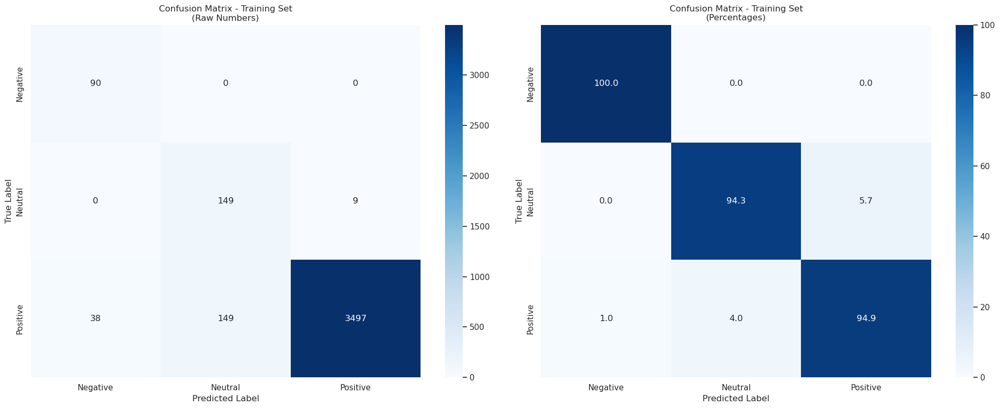


Classification Report - Training Set
              precision    recall  f1-score   support

    Negative       0.70      1.00      0.83        90
     Neutral       0.50      0.94      0.65       158
    Positive       1.00      0.95      0.97      3684

    accuracy                           0.95      3932
   macro avg       0.73      0.96      0.82      3932
weighted avg       0.97      0.95      0.96      3932


F1 Scores per class:
Class Negative: 0.8257
Class Neutral: 0.6535
Class Positive: 0.9727
Creating test embeddings...


Batches:   0%|          | 0/32 [00:00<?, ?it/s]


Test Set Evaluation:
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step


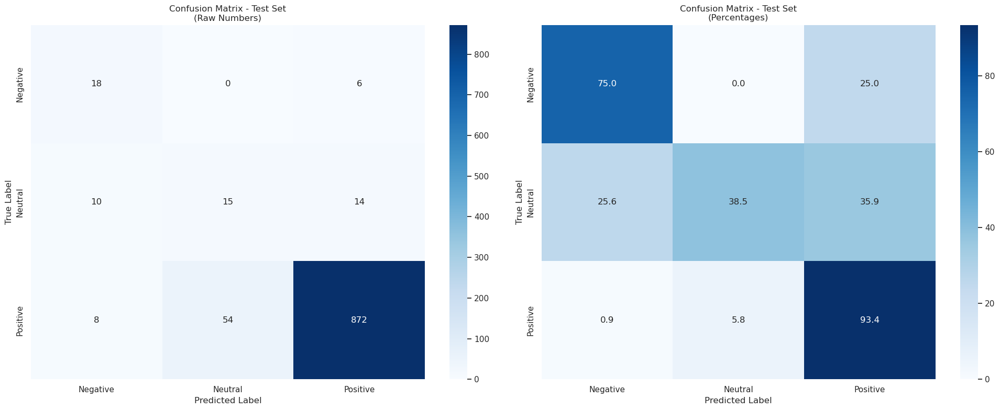


Classification Report - Test Set
              precision    recall  f1-score   support

    Negative       0.50      0.75      0.60        24
     Neutral       0.22      0.38      0.28        39
    Positive       0.98      0.93      0.96       934

    accuracy                           0.91       997
   macro avg       0.56      0.69      0.61       997
weighted avg       0.94      0.91      0.92       997


F1 Scores per class:
Class Negative: 0.6000
Class Neutral: 0.2778
Class Positive: 0.9551

Test predictions have been added to df_test and saved as 'sentiment_test_model_5.csv'

Training Set Misclassifications:

Misclassified Examples:
Original Text | True Label | Predicted Label | Confidence
--------------------------------------------------------------------------------
So much fun for traveling I have an Alexa but wanted a speaker for traveling You can use this withou... | Positive | Negative | 43.62%
Great cheap tablet I love this tablet Works great for my needs Ebooks Faceb

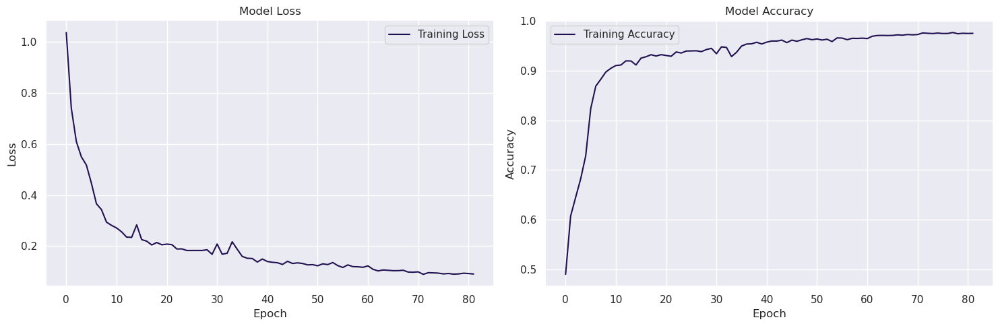


Performance Metrics:

Training Set Performance:
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
246/246 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
total_inference_time: 2.0137 seconds
average_time_per_sample: 0.0005 seconds
samples_per_second: 1952.67
memory_usage_mb: 1.36 MB
batch_size: 16.00

Test Set Performance:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
total_inference_time: 0.2757 seconds
average_time_per_sample: 0.0003 seconds
samples_per_second: 3616.64
memory_usage_mb: 0.00 MB
batch_size: 16.00

Model Complexity Metrics:
trainable_parameters: 6,333,971
non_trainable_parameters: 0
total_parameters: 6,333,971
model_size_mb: 72.73 MB
model_type: Transformer


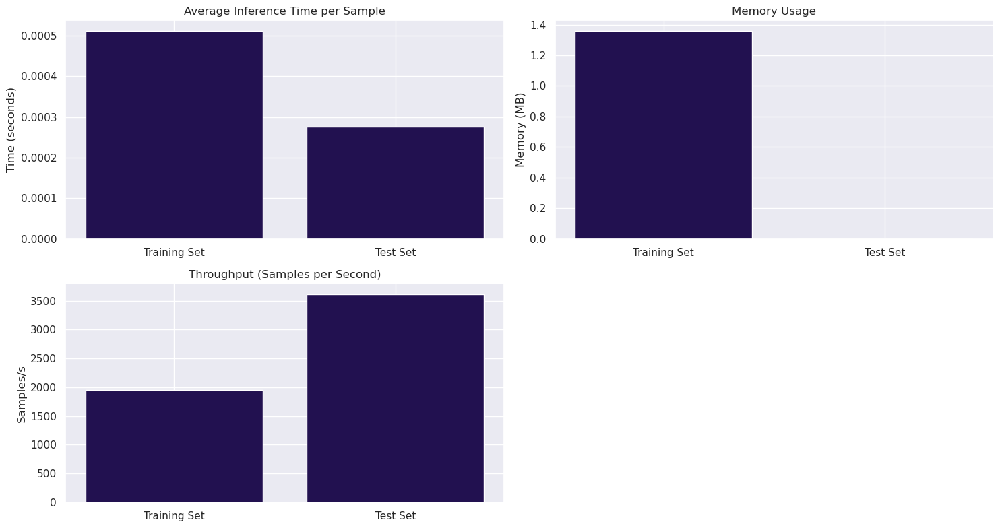


Performance metrics have been saved to 'model5_performance_metrics.csv'

Comprehensive Model Summary:
Model: Model 5 (Transformer)
Total Parameters: 6,333,971
Model Size: 72.73 MB
Average Inference Time: 0.0003 seconds per sample
Throughput: 3616.64 samples/second
Memory Usage: 0.00 MB
Final Training Accuracy: 0.9745
Total Training Epochs: 82


In [67]:
import numpy as np
import pandas as pd
from sentence_transformers import SentenceTransformer
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Input, MultiHeadAttention, LayerNormalization, Add
from tensorflow.keras.regularizers import l2
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report, f1_score
from imblearn.combine import SMOTETomek
import seaborn as sns
import matplotlib.pyplot as plt

# Load previous test results
df_test = pd.read_csv('sentiment_test_model_4.csv')


# 1. Data preparation
le = LabelEncoder()
y = le.fit_transform(df_train['sentiment'])

# 2. SBERT embeddings
model_sbert = SentenceTransformer('all-MiniLM-L6-v2')

print("Creating embeddings...")
X = model_sbert.encode(df_train['combined_review_cleaned'].tolist(), 
                      batch_size=32, 
                      show_progress_bar=True)

# 3. Apply SMOTE-Tomek on entire training data
print("\nOriginal dataset shape:", dict(zip(np.unique(y), np.bincount(y))))

smote_tomek = SMOTETomek(random_state=42, n_jobs=-1)
X_resampled, y_resampled = smote_tomek.fit_resample(X, y)

print("Resampled dataset shape:", dict(zip(np.unique(y_resampled), np.bincount(y_resampled))))

# 4. Reshape data for Transformer
X_resampled = X_resampled.reshape(X_resampled.shape[0], 1, X_resampled.shape[1])
X = X.reshape(X.shape[0], 1, X.shape[1])

# 5. Create Transformer model functions
def transformer_encoder(inputs, head_size, num_heads, ff_dim, dropout=0):
    # Multi-head attention
    x = MultiHeadAttention(
        key_dim=head_size, num_heads=num_heads, dropout=dropout
    )(inputs, inputs)
    x = Dropout(dropout)(x)
    res = Add()([inputs, x])
    x = LayerNormalization(epsilon=1e-6)(res)
    
    # Feed-forward network
    x = Dense(ff_dim, activation='relu')(x)
    x = Dropout(dropout)(x)
    x = Dense(inputs.shape[-1])(x)
    x = Dropout(dropout)(x)
    
    res = Add()([res, x])
    return LayerNormalization(epsilon=1e-6)(res)

def build_transformer_model(
    input_shape,
    head_size=256,
    num_heads=4,
    ff_dim=4,
    num_transformer_blocks=4,
    mlp_units=[128],
    dropout=0.4,
    mlp_dropout=0.3,
):
    inputs = Input(shape=input_shape)
    x = inputs
    
    # Transformer blocks
    for _ in range(num_transformer_blocks):
        x = transformer_encoder(x, head_size, num_heads, ff_dim, dropout)

    # Global average pooling
    x = tf.keras.layers.GlobalAveragePooling1D(data_format="channels_first")(x)
    
    # MLP layers
    for dim in mlp_units:
        x = Dense(dim, activation="relu")(x)
        x = Dropout(mlp_dropout)(x)
    
    # Output layer
    outputs = Dense(3, activation="softmax")(x)
    
    return Model(inputs, outputs)

# 6. Create model
input_shape = (1, 384)  # Adjust based on your embedding dimension
model = build_transformer_model(
    input_shape,
    head_size=256,
    num_heads=4,
    ff_dim=4,
    num_transformer_blocks=4,
    mlp_units=[128, 64],
    dropout=0.4,
    mlp_dropout=0.3,
)

# 7. Compile model
initial_learning_rate = 0.0001
optimizer = tf.keras.optimizers.Adam(
    learning_rate=initial_learning_rate,
    beta_1=0.9,
    beta_2=0.999,
    epsilon=1e-7
)

model.compile(
    optimizer=optimizer,
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# 8. Callbacks (modified to monitor training loss)
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=10,
        restore_best_weights=True,
        min_delta=0.001
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='loss',
        factor=0.5,
        patience=5,
        min_lr=0.00001
    ),
    tf.keras.callbacks.ModelCheckpoint(
        'best_transformer_model.h5',
        monitor='loss',
        save_best_only=True
    )
]

# 9. Train model on entire resampled data
# Modify the training part
batch_size = 16  # Reduced from 32

# Option 1: Simple batch size reduction
history = model.fit(
    X_resampled,
    y_resampled,
    epochs=100,
    batch_size=batch_size,  # Smaller batch size
    callbacks=callbacks
)

# 10. Evaluation function
def create_confusion_matrix(X, y, dataset_name):
    if len(X.shape) == 2:
        X = X.reshape(X.shape[0], 1, X.shape[1])
    
    predictions = model.predict(X)
    pred_classes = np.argmax(predictions, axis=1)
    
    # Calculate confusion matrices
    cm = confusion_matrix(y, pred_classes)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))
    
    # Plot raw numbers
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax1)
    ax1.set_title(f'Confusion Matrix - {dataset_name}\n(Raw Numbers)')
    ax1.set_ylabel('True Label')
    ax1.set_xlabel('Predicted Label')
    
    # Plot percentages
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax2)
    ax2.set_title(f'Confusion Matrix - {dataset_name}\n(Percentages)')
    ax2.set_ylabel('True Label')
    ax2.set_xlabel('Predicted Label')
    
    plt.tight_layout()
    plt.show()
    
    # Print classification report
    print(f"\nClassification Report - {dataset_name}")
    print(classification_report(y, pred_classes, 
                              target_names=le.classes_))
    
    # Print F1 scores
    f1_scores = f1_score(y, pred_classes, average=None)
    print("\nF1 Scores per class:")
    for i, score in enumerate(f1_scores):
        print(f"Class {le.classes_[i]}: {score:.4f}")
    
    return pred_classes, predictions

# 11. Training Set Evaluation
print("\nTraining Set Evaluation:")
train_pred_classes, train_pred_probs = create_confusion_matrix(
    X, y, "Training Set"
)

# 12. Test set evaluation
print("Creating test embeddings...")
X_test = model_sbert.encode(df_test['combined_review_cleaned'].tolist(), 
                           batch_size=32, 
                           show_progress_bar=True)
X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
y_test = le.transform(df_test['sentiment'])

print("\nTest Set Evaluation:")
test_pred_classes, test_pred_probs = create_confusion_matrix(
    X_test, y_test, "Test Set"
)

# Store predictions in df_test
df_test['predicted_sentiment_model_5'] = le.inverse_transform(test_pred_classes)
df_test.to_csv('sentiment_test_model_5.csv', index=False)
print("\nTest predictions have been added to df_test and saved as 'sentiment_test_model_5.csv'")


# 13. Analyze misclassifications
def get_misclassified_examples(X_embeddings, y_true, texts, pred_classes, pred_probs, n=5):
    misclassified_idx = np.where(y_true != pred_classes)[0]
    
    print("\nMisclassified Examples:")
    print("Original Text | True Label | Predicted Label | Confidence")
    print("-" * 80)
    
    confidences = np.max(pred_probs, axis=1)[misclassified_idx]
    sorted_indices = misclassified_idx[np.argsort(confidences)]
    
    for idx in sorted_indices[:n]:
        true_label = le.classes_[y_true[idx]]
        pred_label = le.classes_[pred_classes[idx]]
        confidence = np.max(pred_probs[idx]) * 100
        text = texts[idx][:100] + "..."
        print(f"{text} | {true_label} | {pred_label} | {confidence:.2f}%")

# Get misclassified examples
print("\nTraining Set Misclassifications:")
get_misclassified_examples(
    X, 
    y, 
    df_train['combined_review_cleaned'].tolist(),
    train_pred_classes,
    train_pred_probs
)

print("\nTest Set Misclassifications:")
get_misclassified_examples(
    X_test, 
    y_test, 
    df_test['combined_review_cleaned'].tolist(),
    test_pred_classes,
    test_pred_probs
)

# 14. Plot training history
plt.figure(figsize=(15,5))

# Loss plot
plt.subplot(1,2,1)
plt.plot(history.history['loss'], label='Training Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Accuracy plot
plt.subplot(1,2,2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# 15. Save the model
model.save('model5.h5')

# 16. Function to predict new texts
def predict_sentiment(texts):
    embeddings = model_sbert.encode(texts)
    embeddings = embeddings.reshape(embeddings.shape[0], 1, embeddings.shape[1])
    predictions = model.predict(embeddings)
    pred_classes = np.argmax(predictions, axis=1)
    confidences = np.max(predictions, axis=1)
    return [(le.classes_[pred], conf) for pred, conf in zip(pred_classes, confidences)]
# 17. Performance Metrics Evaluation
import time
import psutil
import os
from memory_profiler import profile

def measure_inference_metrics(model, X, batch_size=16):  # Updated batch_size to match training
    # Ensure proper shape for Transformer
    if len(X.shape) == 2:
        X = X.reshape(X.shape[0], 1, X.shape[1])
    
    # Warm-up run
    _ = model.predict(X[:batch_size])
    
    # Memory usage before inference
    process = psutil.Process(os.getpid())
    memory_before = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Measure inference time
    start_time = time.time()
    predictions = model.predict(X, batch_size=batch_size)
    end_time = time.time()
    
    # Memory usage after inference
    memory_after = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Calculate metrics
    total_time = end_time - start_time
    samples = len(X)
    avg_time_per_sample = total_time / samples
    memory_used = memory_after - memory_before
    
    return {
        'total_inference_time': total_time,
        'average_time_per_sample': avg_time_per_sample,
        'samples_per_second': samples / total_time,
        'memory_usage_mb': memory_used,
        'batch_size': batch_size
    }

# Get model complexity metrics
def get_model_complexity():
    trainable_params = model.count_params()
    non_trainable_params = sum([tf.keras.backend.count_params(w) for w in model.non_trainable_weights])
    
    return {
        'trainable_parameters': trainable_params,
        'non_trainable_parameters': non_trainable_params,
        'total_parameters': trainable_params + non_trainable_params,
        'model_size_mb': os.path.getsize('model5.h5') / (1024 * 1024),
        'model_type': 'Transformer'
    }

# Measure and print performance metrics
print("\nPerformance Metrics:")
print("\nTraining Set Performance:")
train_metrics = measure_inference_metrics(model, X)
for metric, value in train_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nTest Set Performance:")
test_metrics = measure_inference_metrics(model, X_test)
for metric, value in test_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nModel Complexity Metrics:")
complexity_metrics = get_model_complexity()
for metric, value in complexity_metrics.items():
    if isinstance(value, str):
        print(f"{metric}: {value}")
    elif 'size' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:,}")

# Visualize performance metrics
plt.figure(figsize=(15,8))

# Inference time comparison
plt.subplot(2,2,1)
metrics_data = [train_metrics['average_time_per_sample'], test_metrics['average_time_per_sample']]
plt.bar(['Training Set', 'Test Set'], metrics_data)
plt.title('Average Inference Time per Sample')
plt.ylabel('Time (seconds)')

# Memory usage comparison
plt.subplot(2,2,2)
memory_data = [train_metrics['memory_usage_mb'], test_metrics['memory_usage_mb']]
plt.bar(['Training Set', 'Test Set'], memory_data)
plt.title('Memory Usage')
plt.ylabel('Memory (MB)')

# Throughput comparison
plt.subplot(2,2,3)
throughput_data = [train_metrics['samples_per_second'], test_metrics['samples_per_second']]
plt.bar(['Training Set', 'Test Set'], throughput_data)
plt.title('Throughput (Samples per Second)')
plt.ylabel('Samples/s')

plt.tight_layout()
plt.show()

# Store all metrics for model comparison
performance_metrics = {
    'model5': {  # Changed to model5 to match your code
        'train': train_metrics,
        'test': test_metrics,
        'complexity': complexity_metrics,
        'training_history': {
            'final_loss': history.history['loss'][-1],
            'final_accuracy': history.history['accuracy'][-1],
            'epochs_trained': len(history.history['loss'])
        },
        'model_architecture': 'Transformer'
    }
}

# Create detailed metrics DataFrame
def create_metrics_df(metrics_dict):
    data = {
        'Model': [],
        'Architecture': [],
        'Training Time per Sample (s)': [],
        'Test Time per Sample (s)': [],
        'Training Memory (MB)': [],
        'Test Memory (MB)': [],
        'Model Size (MB)': [],
        'Total Parameters': [],
        'Final Training Loss': [],
        'Final Training Accuracy': [],
        'Epochs Trained': [],
        'Throughput (samples/s)': []
    }
    
    for model_name, metrics in metrics_dict.items():
        data['Model'].append(model_name)
        data['Architecture'].append(metrics['model_architecture'])
        data['Training Time per Sample (s)'].append(metrics['train']['average_time_per_sample'])
        data['Test Time per Sample (s)'].append(metrics['test']['average_time_per_sample'])
        data['Training Memory (MB)'].append(metrics['train']['memory_usage_mb'])
        data['Test Memory (MB)'].append(metrics['test']['memory_usage_mb'])
        data['Model Size (MB)'].append(metrics['complexity']['model_size_mb'])
        data['Total Parameters'].append(metrics['complexity']['total_parameters'])
        data['Final Training Loss'].append(metrics['training_history']['final_loss'])
        data['Final Training Accuracy'].append(metrics['training_history']['final_accuracy'])
        data['Epochs Trained'].append(metrics['training_history']['epochs_trained'])
        data['Throughput (samples/s)'].append(metrics['test']['samples_per_second'])
    
    return pd.DataFrame(data)

# Create and save metrics DataFrame
metrics_df = create_metrics_df(performance_metrics)
metrics_df.to_csv('model5_performance_metrics.csv', index=False)
print("\nPerformance metrics have been saved to 'model5_performance_metrics.csv'")

# Print comprehensive summary
print("\nComprehensive Model Summary:")
print("=" * 50)
print(f"Model: Model 5 (Transformer)")
print(f"Total Parameters: {complexity_metrics['total_parameters']:,}")
print(f"Model Size: {complexity_metrics['model_size_mb']:.2f} MB")
print(f"Average Inference Time: {test_metrics['average_time_per_sample']:.4f} seconds per sample")
print(f"Throughput: {test_metrics['samples_per_second']:.2f} samples/second")
print(f"Memory Usage: {test_metrics['memory_usage_mb']:.2f} MB")
print(f"Final Training Accuracy: {history.history['accuracy'][-1]:.4f}")
print(f"Total Training Epochs: {len(history.history['loss'])}")


## 6. SBERT + SMOTE Tomek + Transformers + Class Weighing

Preparing data...
Class mapping:
Negative: 0
Neutral: 1
Positive: 2

Creating embeddings...


Batches:   0%|          | 0/123 [00:00<?, ?it/s]


Original dataset shape: {0: 90, 1: 158, 2: 3684}
Resampled dataset shape: {0: 3684, 1: 3684, 2: 3684}

Class weights: {0: 1.0, 1: 2.0, 2: 1.0}

Creating and compiling model...

Training model...
Epoch 1/100


2025-05-04 03:05:55.278735: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_64', 164 bytes spill stores, 164 bytes spill loads

2025-05-04 03:05:55.327503: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_40', 164 bytes spill stores, 164 bytes spill loads



  1/346 ━━━━━━━━━━━━━━━━━━━━ 2:52:20 30s/step - accuracy: 0.4688 - loss: 1.8925

2025-05-04 03:06:10.857735: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'copy_fusion_3', 44 bytes spill stores, 44 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'copy_fusion_2', 8 bytes spill stores, 24 bytes spill loads



343/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.3376 - loss: 1.9182

2025-05-04 03:06:17.080465: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_64', 76 bytes spill stores, 76 bytes spill loads

2025-05-04 03:06:17.088238: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_40', 76 bytes spill stores, 76 bytes spill loads



346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - accuracy: 0.3376 - loss: 1.9178

2025-05-04 03:06:31.191227: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_21', 8 bytes spill stores, 8 bytes spill loads



346/346 ━━━━━━━━━━━━━━━━━━━━ 51s 60ms/step - accuracy: 0.3376 - loss: 1.9176 - learning_rate: 1.0000e-04
Epoch 2/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.4183 - loss: 1.6216

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.4186 - loss: 1.6213 - learning_rate: 1.0000e-04
Epoch 3/100
345/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6113 - loss: 1.2637

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.6113 - loss: 1.2634 - learning_rate: 1.0000e-04
Epoch 4/100
342/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6327 - loss: 1.1329

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.6328 - loss: 1.1324 - learning_rate: 1.0000e-04
Epoch 5/100
343/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6568 - loss: 1.0323

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.6567 - loss: 1.0323 - learning_rate: 1.0000e-04
Epoch 6/100
341/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6458 - loss: 1.0112

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.6458 - loss: 1.0114 - learning_rate: 1.0000e-04
Epoch 7/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6460 - loss: 0.9727

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.6460 - loss: 0.9726 - learning_rate: 1.0000e-04
Epoch 8/100
340/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6584 - loss: 0.9100

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6586 - loss: 0.9092 - learning_rate: 1.0000e-04
Epoch 9/100
345/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7747 - loss: 0.7767

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.7749 - loss: 0.7765 - learning_rate: 1.0000e-04
Epoch 10/100
345/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8655 - loss: 0.6548

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.8656 - loss: 0.6545 - learning_rate: 1.0000e-04
Epoch 11/100
342/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8916 - loss: 0.5501

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.8916 - loss: 0.5501 - learning_rate: 1.0000e-04
Epoch 12/100
338/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9010 - loss: 0.4966

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9009 - loss: 0.4969 - learning_rate: 1.0000e-04
Epoch 13/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9030 - loss: 0.4954

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9030 - loss: 0.4951 - learning_rate: 1.0000e-04
Epoch 14/100
342/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9079 - loss: 0.4375

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9078 - loss: 0.4377 - learning_rate: 1.0000e-04
Epoch 15/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9123 - loss: 0.4347

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9123 - loss: 0.4347 - learning_rate: 1.0000e-04
Epoch 16/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9151 - loss: 0.4213

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9151 - loss: 0.4213 - learning_rate: 1.0000e-04
Epoch 17/100
345/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9188 - loss: 0.3866

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.9188 - loss: 0.3867 - learning_rate: 1.0000e-04
Epoch 18/100
342/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9112 - loss: 0.4125

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9112 - loss: 0.4123 - learning_rate: 1.0000e-04
Epoch 19/100
339/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9279 - loss: 0.3549

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9279 - loss: 0.3547 - learning_rate: 1.0000e-04
Epoch 20/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9214 - loss: 0.3872 - learning_rate: 1.0000e-04
Epoch 21/100
342/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9329 - loss: 0.3245

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9329 - loss: 0.3246 - learning_rate: 1.0000e-04
Epoch 22/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9348 - loss: 0.3290 - learning_rate: 1.0000e-04
Epoch 23/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9219 - loss: 0.3841 - learning_rate: 1.0000e-04
Epoch 24/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9217 - loss: 0.3768 - learning_rate: 1.0000e-04
Epoch 25/100
338/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9385 - loss: 0.3140

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9385 - loss: 0.3137 - learning_rate: 1.0000e-04
Epoch 26/100
343/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9396 - loss: 0.3033

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9396 - loss: 0.3032 - learning_rate: 1.0000e-04
Epoch 27/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9379 - loss: 0.3050 - learning_rate: 1.0000e-04
Epoch 28/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9434 - loss: 0.2834 - learning_rate: 1.0000e-04
Epoch 29/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.9227 - loss: 0.3640 - learning_rate: 1.0000e-04
Epoch 30/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.9394 - loss: 0.3007 - learning_rate: 1.0000e-04
Epoch 31/100
343/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9375 - loss: 0.3104

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9376 - loss: 0.3102 - learning_rate: 1.0000e-04
Epoch 32/100
344/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9419 - loss: 0.2945

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9420 - loss: 0.2943 - learning_rate: 1.0000e-04
Epoch 33/100
343/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9467 - loss: 0.2704

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9466 - loss: 0.2704 - learning_rate: 1.0000e-04
Epoch 34/100
338/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9470 - loss: 0.2776

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9470 - loss: 0.2775 - learning_rate: 1.0000e-04
Epoch 35/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9486 - loss: 0.2676 - learning_rate: 1.0000e-04
Epoch 36/100
343/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9482 - loss: 0.2675

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9482 - loss: 0.2676 - learning_rate: 1.0000e-04
Epoch 37/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9256 - loss: 0.3834 - learning_rate: 1.0000e-04
Epoch 38/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9149 - loss: 0.4456 - learning_rate: 1.0000e-04
Epoch 39/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.9432 - loss: 0.3134 - learning_rate: 1.0000e-04
Epoch 40/100
340/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9507 - loss: 0.2618

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9508 - loss: 0.2615 - learning_rate: 1.0000e-04
Epoch 41/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9533 - loss: 0.2549 - learning_rate: 1.0000e-04
Epoch 42/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9518 - loss: 0.2601 - learning_rate: 1.0000e-04
Epoch 43/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9523 - loss: 0.2604 - learning_rate: 1.0000e-04
Epoch 44/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9500 - loss: 0.2539 - learning_rate: 1.0000e-04
Epoch 45/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9485 - loss: 0.2862 - learning_rate: 1.0000e-04
Epoch 46/100
343/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9500 - loss: 0.2568

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9500 - loss: 0.2567 - learning_rate: 5.0000e-05
Epoch 47/100
345/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9595 - loss: 0.2117

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9595 - loss: 0.2118 - learning_rate: 5.0000e-05
Epoch 48/100
338/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9619 - loss: 0.2153

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9619 - loss: 0.2152 - learning_rate: 5.0000e-05
Epoch 49/100
343/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9636 - loss: 0.2030

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9636 - loss: 0.2030 - learning_rate: 5.0000e-05
Epoch 50/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9634 - loss: 0.2042 - learning_rate: 5.0000e-05
Epoch 51/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9616 - loss: 0.2104 - learning_rate: 5.0000e-05
Epoch 52/100
342/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9643 - loss: 0.1921

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9642 - loss: 0.1923 - learning_rate: 5.0000e-05
Epoch 53/100
341/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9635 - loss: 0.1992

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9635 - loss: 0.1993 - learning_rate: 5.0000e-05
Epoch 54/100
343/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9650 - loss: 0.1929

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9650 - loss: 0.1929 - learning_rate: 5.0000e-05
Epoch 55/100
339/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9663 - loss: 0.1914

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9663 - loss: 0.1912 - learning_rate: 5.0000e-05
Epoch 56/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9713 - loss: 0.1661 - learning_rate: 5.0000e-05
Epoch 57/100
343/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9688 - loss: 0.1703

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9688 - loss: 0.1703 - learning_rate: 5.0000e-05
Epoch 58/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9676 - loss: 0.1852 - learning_rate: 5.0000e-05
Epoch 59/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9677 - loss: 0.1880 - learning_rate: 5.0000e-05
Epoch 60/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9650 - loss: 0.1871 - learning_rate: 5.0000e-05
Epoch 61/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9622 - loss: 0.2009 - learning_rate: 5.0000e-05
Epoch 62/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9656 - loss: 0.1887 - learning_rate: 5.0000e-05
Epoch 63/100
338/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9679 - loss: 0.1823

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9679 - loss: 0.1820 - learning_rate: 2.5000e-05
Epoch 64/100
342/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9692 - loss: 0.1712

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9692 - loss: 0.1710 - learning_rate: 2.5000e-05
Epoch 65/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9676 - loss: 0.1759 - learning_rate: 2.5000e-05
Epoch 66/100
338/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9716 - loss: 0.1651

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9717 - loss: 0.1649 - learning_rate: 2.5000e-05
Epoch 67/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9706 - loss: 0.1598 - learning_rate: 2.5000e-05
Epoch 68/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9677 - loss: 0.1860 - learning_rate: 2.5000e-05
Epoch 69/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9709 - loss: 0.1675 - learning_rate: 2.5000e-05
Epoch 70/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9758 - loss: 0.1449 - learning_rate: 2.5000e-05
Epoch 71/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9734 - loss: 0.1650 - learning_rate: 2.5000e-05
Epoch 72/100
343/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9741 - loss: 0.1476

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.9741 - loss: 0.1476 - learning_rate: 1.2500e-05
Epoch 73/100
342/346 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9767 - loss: 0.1373

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.9767 - loss: 0.1374 - learning_rate: 1.2500e-05
Epoch 74/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9750 - loss: 0.1442 - learning_rate: 1.2500e-05
Epoch 75/100
340/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9750 - loss: 0.1432

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9750 - loss: 0.1431 - learning_rate: 1.2500e-05
Epoch 76/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9725 - loss: 0.1632 - learning_rate: 1.2500e-05
Epoch 77/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9763 - loss: 0.1386 - learning_rate: 1.2500e-05
Epoch 78/100
343/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9777 - loss: 0.1356

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9777 - loss: 0.1356 - learning_rate: 1.2500e-05
Epoch 79/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9765 - loss: 0.1384 - learning_rate: 1.2500e-05
Epoch 80/100
340/346 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9820 - loss: 0.1123

346/346 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9819 - loss: 0.1126 - learning_rate: 1.2500e-05
Epoch 81/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9767 - loss: 0.1508 - learning_rate: 1.2500e-05
Epoch 82/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9787 - loss: 0.1302 - learning_rate: 1.2500e-05
Epoch 83/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9750 - loss: 0.1393 - learning_rate: 1.2500e-05
Epoch 84/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9773 - loss: 0.1310 - learning_rate: 1.2500e-05
Epoch 85/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9787 - loss: 0.1254 - learning_rate: 1.2500e-05
Epoch 86/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9766 - loss: 0.1354 - learning_rate: 1.0000e-05
Epoch 87/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9781 - loss: 0.1311 - learning_rate: 1.0000e-05
Epoch 88/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.9768 - loss: 0.14

2025-05-04 03:10:17.071682: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_59', 20 bytes spill stores, 20 bytes spill loads



123/123 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step


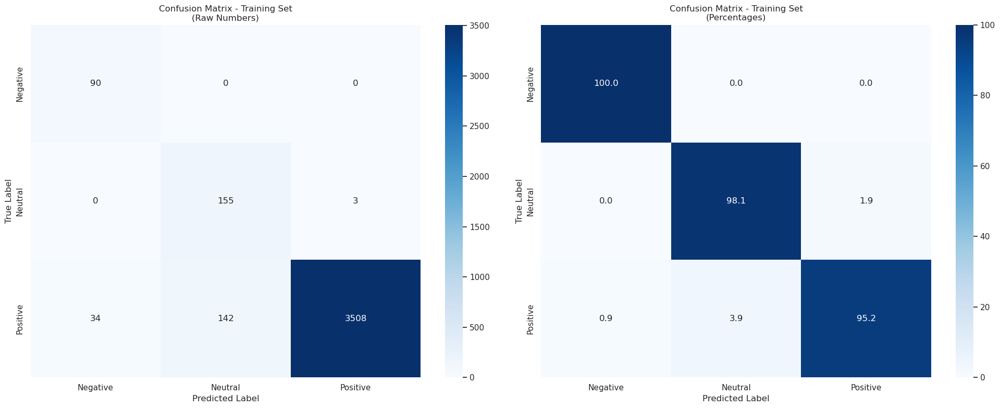


Classification Report - Training Set
              precision    recall  f1-score   support

    Negative       0.73      1.00      0.84        90
     Neutral       0.52      0.98      0.68       158
    Positive       1.00      0.95      0.98      3684

    accuracy                           0.95      3932
   macro avg       0.75      0.98      0.83      3932
weighted avg       0.97      0.95      0.96      3932


F1 Scores per class:
Class Negative: 0.8411
Class Neutral: 0.6813
Class Positive: 0.9751

Neutral Class Metrics:
Precision: 0.5219
Recall: 0.9810

Creating test embeddings...


Batches:   0%|          | 0/32 [00:00<?, ?it/s]


Test Set Evaluation:
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step


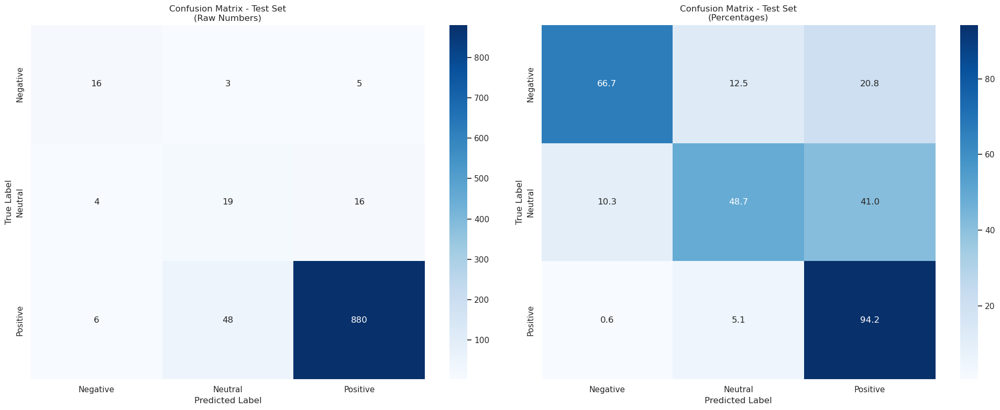


Classification Report - Test Set
              precision    recall  f1-score   support

    Negative       0.62      0.67      0.64        24
     Neutral       0.27      0.49      0.35        39
    Positive       0.98      0.94      0.96       934

    accuracy                           0.92       997
   macro avg       0.62      0.70      0.65       997
weighted avg       0.94      0.92      0.93       997


F1 Scores per class:
Class Negative: 0.6400
Class Neutral: 0.3486
Class Positive: 0.9591

Neutral Class Metrics:
Precision: 0.2714
Recall: 0.4872

Test predictions have been added to df_test and saved as 'sentiment_test_model_6.csv'

Analyzing misclassifications...

Misclassified Examples:
Original Text | True Label | Predicted Label | Confidence
--------------------------------------------------------------------------------
Fine Its a fine tablet for the price the only problem I have with theach kids mode its not what I wa... | Positive | Neutral | 41.18%
Easily down loaded H

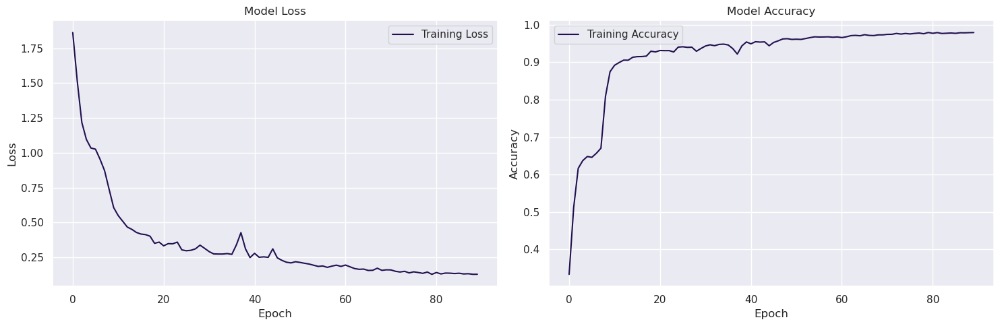


Saving model and components...

Model 8 Training Complete!
Models and results saved in ./model8/ directory
Files saved:
- final_model.h5
- best_transformer_model.h5
- confusion_matrix_training_set.png
- confusion_matrix_test_set.png
- classification_report_training_set.txt
- classification_report_test_set.txt
- training_history.png
- training_history.npy
- misclassified_examples.csv
- label_encoder_classes.npy

Performance Metrics:

Training Set Performance:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
total_inference_time: 0.6492 seconds
average_time_per_sample: 0.0002 seconds
samples_per_second: 6056.93
memory_usage_mb: 0.00 MB
batch_size: 32.00

Test Set Performance:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
total_inference_time: 0.2263 seconds
average_time_per_sample: 0.0002 seconds
samples_per_second: 4406.32
memory_usage_mb: 0.00 MB
batch_size: 32.00

Model Complexity Metrics:
trainable_parameters: 14,249,499

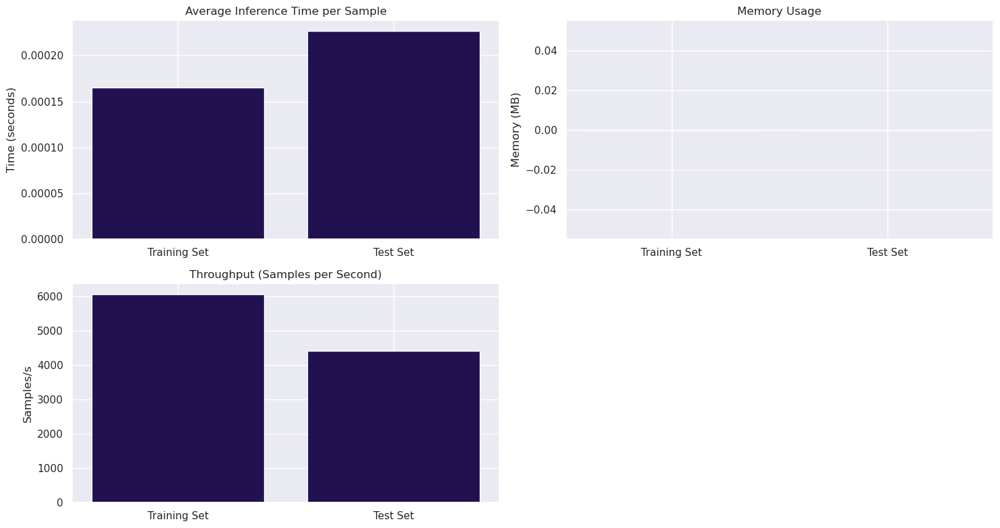


Performance metrics have been saved to './model8/model_performance_metrics.csv'

Comprehensive Model Summary:
Model: Model 6 (Transformer with Class Weighting)
Total Parameters: 14,249,499
Model Size: 163.40 MB
Average Inference Time: 0.0002 seconds per sample
Throughput: 4406.32 samples/second
Memory Usage: 0.00 MB
Final Training Accuracy: 0.9788
Total Training Epochs: 90
Class Weights Used: {0: 1.0, 1: 2.0, 2: 1.0}


In [68]:
import numpy as np
import pandas as pd
from sentence_transformers import SentenceTransformer
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Input, MultiHeadAttention, LayerNormalization, Add
from tensorflow.keras.regularizers import l2
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report, f1_score
from sklearn.utils.class_weight import compute_class_weight
from imblearn.combine import SMOTETomek
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Load previous test results
df_test = pd.read_csv('sentiment_test_model_5.csv')


# Create directory for model outputs
os.makedirs('./model8', exist_ok=True)


# Transformer encoder function
def transformer_encoder(inputs, head_size, num_heads, ff_dim, dropout=0):
    x = MultiHeadAttention(
        key_dim=head_size, num_heads=num_heads, dropout=dropout
    )(inputs, inputs)
    x = Dropout(dropout)(x)
    res = Add()([inputs, x])
    x = LayerNormalization(epsilon=1e-6)(res)
    
    x = Dense(ff_dim, activation='relu')(x)
    x = Dropout(dropout)(x)
    x = Dense(inputs.shape[-1])(x)
    x = Dropout(dropout)(x)
    
    res = Add()([res, x])
    return LayerNormalization(epsilon=1e-6)(res)

def build_transformer_model(
    input_shape,
    head_size=256,
    num_heads=6,
    ff_dim=4,
    num_transformer_blocks=6,
    mlp_units=[256, 128],
    dropout=0.4,
    mlp_dropout=0.3,
):
    inputs = Input(shape=input_shape)
    x = inputs
    
    for _ in range(num_transformer_blocks):
        x = transformer_encoder(x, head_size, num_heads, ff_dim, dropout)

    x = tf.keras.layers.GlobalAveragePooling1D(data_format="channels_first")(x)
    
    for dim in mlp_units:
        x = Dense(dim, activation="relu")(x)
        x = Dropout(mlp_dropout)(x)
    
    outputs = Dense(3, activation="softmax")(x)
    
    return Model(inputs, outputs)
# 1. Data preparation
print("Preparing data...")
le = LabelEncoder()
y = le.fit_transform(df_train['sentiment'])

# Print class mapping
print("Class mapping:")
for i, label in enumerate(le.classes_):
    print(f"{label}: {i}")

# 2. SBERT embeddings
print("\nCreating embeddings...")
model_sbert = SentenceTransformer('all-MiniLM-L6-v2')
X = model_sbert.encode(df_train['combined_review_cleaned'].tolist(), 
                      batch_size=32, 
                      show_progress_bar=True)

# 3. Apply SMOTE-Tomek on entire dataset
print("\nOriginal dataset shape:", dict(zip(np.unique(y), np.bincount(y))))

smote_tomek = SMOTETomek(random_state=42, n_jobs=-1)
X_resampled, y_resampled = smote_tomek.fit_resample(X, y)

print("Resampled dataset shape:", dict(zip(np.unique(y_resampled), np.bincount(y_resampled))))

# Calculate class weights and increase weight for Neutral class
class_weights = compute_class_weight('balanced', 
                                   classes=np.unique(y_resampled), 
                                   y=y_resampled)

# Find neutral class index
neutral_idx = np.where(le.classes_ == 'Neutral')[0][0]

# Increase weight for neutral class (multiply by 2)
class_weights[neutral_idx] *= 2.0

class_weight_dict = dict(zip(np.unique(y_resampled), class_weights))
print("\nClass weights:", class_weight_dict)

# 4. Reshape data for Transformer
X_resampled = X_resampled.reshape(X_resampled.shape[0], 1, X_resampled.shape[1])

# 5. Custom loss function with class weighting
def weighted_categorical_crossentropy(class_weights):
    def loss(y_true, y_pred):
        y_true = tf.cast(y_true, tf.int32)
        weights = tf.gather(tf.constant(list(class_weights.values()), dtype=tf.float32), y_true)
        unweighted_loss = tf.keras.losses.sparse_categorical_crossentropy(y_true, y_pred)
        weighted_loss = unweighted_loss * weights
        return tf.reduce_mean(weighted_loss)
    return loss

# 6. Create and compile model
print("\nCreating and compiling model...")
input_shape = (1, 384)
model = build_transformer_model(input_shape)

initial_learning_rate = 0.0001
optimizer = tf.keras.optimizers.Adam(
    learning_rate=initial_learning_rate,
    beta_1=0.9,
    beta_2=0.999,
    epsilon=1e-7
)

model.compile(
    optimizer=optimizer,
    loss=weighted_categorical_crossentropy(class_weight_dict),
    metrics=['accuracy']
)
# 7. Training callbacks
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=10,
        restore_best_weights=True,
        min_delta=0.001
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='loss',
        factor=0.5,
        patience=5,
        min_lr=0.00001
    ),
    tf.keras.callbacks.ModelCheckpoint(
        './model8/best_transformer_model.h5',
        monitor='loss',
        save_best_only=True
    )
]

# 8. Train model
print("\nTraining model...")
history = model.fit(
    X_resampled,
    y_resampled,
    epochs=100,
    batch_size=32,
    callbacks=callbacks,
    class_weight=class_weight_dict
)

# 9. Evaluation function
def create_confusion_matrix(X, y, dataset_name):
    if len(X.shape) == 2:
        X = X.reshape(X.shape[0], 1, X.shape[1])
    
    predictions = model.predict(X)
    pred_classes = np.argmax(predictions, axis=1)
    
    # Calculate confusion matrices
    cm = confusion_matrix(y, pred_classes)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))
    
    # Plot raw numbers
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax1)
    ax1.set_title(f'Confusion Matrix - {dataset_name}\n(Raw Numbers)')
    ax1.set_ylabel('True Label')
    ax1.set_xlabel('Predicted Label')
    
    # Plot percentages
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax2)
    ax2.set_title(f'Confusion Matrix - {dataset_name}\n(Percentages)')
    ax2.set_ylabel('True Label')
    ax2.set_xlabel('Predicted Label')
    
    plt.tight_layout()
    plt.savefig(f'./model8/confusion_matrix_{dataset_name.lower().replace(" ", "_")}.png')
    plt.show()
    
    # Print classification report and metrics
    print(f"\nClassification Report - {dataset_name}")
    report = classification_report(y, pred_classes, target_names=le.classes_)
    print(report)
    
    # Save classification report
    with open(f'./model8/classification_report_{dataset_name.lower().replace(" ", "_")}.txt', 'w') as f:
        f.write(report)
    
    f1_scores = f1_score(y, pred_classes, average=None)
    print("\nF1 Scores per class:")
    for i, score in enumerate(f1_scores):
        print(f"Class {le.classes_[i]}: {score:.4f}")
        
    # Print neutral class specific metrics
    neutral_mask = (y == neutral_idx)
    if np.any(neutral_mask):
        neutral_pred_mask = (pred_classes == neutral_idx)
        neutral_precision = np.mean(y[neutral_pred_mask] == neutral_idx) if np.any(neutral_pred_mask) else 0
        neutral_recall = np.mean(pred_classes[neutral_mask] == neutral_idx)
        print(f"\nNeutral Class Metrics:")
        print(f"Precision: {neutral_precision:.4f}")
        print(f"Recall: {neutral_recall:.4f}")
    
    return pred_classes, predictions
# 10. Evaluate on training set
print("\nTraining Set Evaluation:")
train_pred_classes, train_pred_probs = create_confusion_matrix(
    X, y, "Training Set"
)

# 11. Test set evaluation
print("\nCreating test embeddings...")
X_test = model_sbert.encode(df_test['combined_review_cleaned'].tolist(), 
                           batch_size=32, 
                           show_progress_bar=True)
X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
y_test = le.transform(df_test['sentiment'])

print("\nTest Set Evaluation:")
test_pred_classes, test_pred_probs = create_confusion_matrix(
    X_test, y_test, "Test Set"
)


# Store predictions in df_test
df_test['predicted_sentiment_model_6'] = le.inverse_transform(test_pred_classes)
df_test.to_csv('sentiment_test_model_6.csv', index=False)
print("\nTest predictions have been added to df_test and saved as 'sentiment_test_model_6.csv'")


# 12. Analyze misclassifications
def get_misclassified_examples(X_embeddings, y_true, texts, pred_classes, pred_probs, n=5):
    misclassified_idx = np.where(y_true != pred_classes)[0]
    
    print("\nMisclassified Examples:")
    print("Original Text | True Label | Predicted Label | Confidence")
    print("-" * 80)
    
    confidences = np.max(pred_probs, axis=1)[misclassified_idx]
    sorted_indices = misclassified_idx[np.argsort(confidences)]
    
    misclassified_examples = []
    for idx in sorted_indices[:n]:
        true_label = le.classes_[y_true[idx]]
        pred_label = le.classes_[pred_classes[idx]]
        confidence = np.max(pred_probs[idx]) * 100
        text = texts[idx][:100] + "..."
        print(f"{text} | {true_label} | {pred_label} | {confidence:.2f}%")
        
        misclassified_examples.append({
            'text': texts[idx],
            'true_label': true_label,
            'predicted_label': pred_label,
            'confidence': confidence
        })
    
    # Save misclassified examples to CSV
    pd.DataFrame(misclassified_examples).to_csv(
        f'./model8/misclassified_examples.csv', index=False
    )
    
    return misclassified_examples

# Get misclassified examples
print("\nAnalyzing misclassifications...")
train_misclassified = get_misclassified_examples(
    X, 
    y, 
    df_train['combined_review_cleaned'].tolist(),
    train_pred_classes,
    train_pred_probs
)

test_misclassified = get_misclassified_examples(
    X_test, 
    y_test, 
    df_test['combined_review_cleaned'].tolist(),
    test_pred_classes,
    test_pred_probs
)

# 13. Plot and save training history
plt.figure(figsize=(15,5))

plt.subplot(1,2,1)
plt.plot(history.history['loss'], label='Training Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.savefig('./model8/training_history.png')
plt.show()

# 14. Save training history
history_dict = {
    'loss': history.history['loss'],
    'accuracy': history.history['accuracy']
}
np.save('./model8/training_history.npy', history_dict)

# 15. Function to predict new texts
def predict_sentiment(texts):
    embeddings = model_sbert.encode(texts)
    embeddings = embeddings.reshape(embeddings.shape[0], 1, embeddings.shape[1])
    predictions = model.predict(embeddings)
    pred_classes = np.argmax(predictions, axis=1)
    confidences = np.max(predictions, axis=1)
    return [(le.classes_[pred], conf) for pred, conf in zip(pred_classes, confidences)]

# 16. Save model and important components
print("\nSaving model and components...")
model.save('./model8/final_model.h5')
np.save('./model8/label_encoder_classes.npy', le.classes_)

# Print final summary
print("\nModel 8 Training Complete!")
print("Models and results saved in ./model8/ directory")
print("Files saved:")
print("- final_model.h5")
print("- best_transformer_model.h5")
print("- confusion_matrix_training_set.png")
print("- confusion_matrix_test_set.png")
print("- classification_report_training_set.txt")
print("- classification_report_test_set.txt")
print("- training_history.png")
print("- training_history.npy")
print("- misclassified_examples.csv")
print("- label_encoder_classes.npy")

if __name__ == "__main__":
    # Set random seeds for reproducibility
    np.random.seed(42)
    tf.random.set_seed(42)
    
    # Make sure required data is loaded
    if 'df_train' not in globals():
        raise ValueError("Please load your training data into df_train before running")
    if 'df_test' not in globals():
        raise ValueError("Please load your test data into df_test before running")
# 17. Performance Metrics Evaluation
import time
import psutil
from memory_profiler import profile

def measure_inference_metrics(model, X, batch_size=32):
    # Ensure proper shape for Transformer
    if len(X.shape) == 2:
        X = X.reshape(X.shape[0], 1, X.shape[1])
    
    # Warm-up run
    _ = model.predict(X[:batch_size])
    
    # Memory usage before inference
    process = psutil.Process(os.getpid())
    memory_before = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Measure inference time
    start_time = time.time()
    predictions = model.predict(X, batch_size=batch_size)
    end_time = time.time()
    
    # Memory usage after inference
    memory_after = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Calculate metrics
    total_time = end_time - start_time
    samples = len(X)
    avg_time_per_sample = total_time / samples
    memory_used = memory_after - memory_before
    
    return {
        'total_inference_time': total_time,
        'average_time_per_sample': avg_time_per_sample,
        'samples_per_second': samples / total_time,
        'memory_usage_mb': memory_used,
        'batch_size': batch_size
    }

# Get model complexity metrics
def get_model_complexity():
    trainable_params = model.count_params()
    non_trainable_params = sum([tf.keras.backend.count_params(w) for w in model.non_trainable_weights])
    
    return {
        'trainable_parameters': trainable_params,
        'non_trainable_parameters': non_trainable_params,
        'total_parameters': trainable_params + non_trainable_params,
        'model_size_mb': os.path.getsize('./model8/final_model.h5') / (1024 * 1024),
        'model_type': 'Transformer with Class Weighting'
    }

# Measure and print performance metrics
print("\nPerformance Metrics:")
print("\nTraining Set Performance:")
train_metrics = measure_inference_metrics(model, X)
for metric, value in train_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nTest Set Performance:")
test_metrics = measure_inference_metrics(model, X_test)
for metric, value in test_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nModel Complexity Metrics:")
complexity_metrics = get_model_complexity()
for metric, value in complexity_metrics.items():
    if isinstance(value, str):
        print(f"{metric}: {value}")
    elif 'size' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:,}")

# Visualize performance metrics
plt.figure(figsize=(15,8))

# Inference time comparison
plt.subplot(2,2,1)
metrics_data = [train_metrics['average_time_per_sample'], test_metrics['average_time_per_sample']]
plt.bar(['Training Set', 'Test Set'], metrics_data)
plt.title('Average Inference Time per Sample')
plt.ylabel('Time (seconds)')

# Memory usage comparison
plt.subplot(2,2,2)
memory_data = [train_metrics['memory_usage_mb'], test_metrics['memory_usage_mb']]
plt.bar(['Training Set', 'Test Set'], memory_data)
plt.title('Memory Usage')
plt.ylabel('Memory (MB)')

# Throughput comparison
plt.subplot(2,2,3)
throughput_data = [train_metrics['samples_per_second'], test_metrics['samples_per_second']]
plt.bar(['Training Set', 'Test Set'], throughput_data)
plt.title('Throughput (Samples per Second)')
plt.ylabel('Samples/s')

plt.tight_layout()
plt.savefig('./model8/performance_metrics.png')
plt.show()

# Store all metrics
performance_metrics = {
    'model6': {
        'train': train_metrics,
        'test': test_metrics,
        'complexity': complexity_metrics,
        'training_history': {
            'final_loss': history.history['loss'][-1],
            'final_accuracy': history.history['accuracy'][-1],
            'epochs_trained': len(history.history['loss'])
        },
        'model_architecture': 'Transformer with Class Weighting',
        'class_weights': class_weight_dict
    }
}

# Create detailed metrics DataFrame
def create_metrics_df(metrics_dict):
    data = {
        'Model': [],
        'Architecture': [],
        'Training Time per Sample (s)': [],
        'Test Time per Sample (s)': [],
        'Training Memory (MB)': [],
        'Test Memory (MB)': [],
        'Model Size (MB)': [],
        'Total Parameters': [],
        'Final Training Loss': [],
        'Final Training Accuracy': [],
        'Epochs Trained': [],
        'Throughput (samples/s)': []
    }
    
    for model_name, metrics in metrics_dict.items():
        data['Model'].append(model_name)
        data['Architecture'].append(metrics['model_architecture'])
        data['Training Time per Sample (s)'].append(metrics['train']['average_time_per_sample'])
        data['Test Time per Sample (s)'].append(metrics['test']['average_time_per_sample'])
        data['Training Memory (MB)'].append(metrics['train']['memory_usage_mb'])
        data['Test Memory (MB)'].append(metrics['test']['memory_usage_mb'])
        data['Model Size (MB)'].append(metrics['complexity']['model_size_mb'])
        data['Total Parameters'].append(metrics['complexity']['total_parameters'])
        data['Final Training Loss'].append(metrics['training_history']['final_loss'])
        data['Final Training Accuracy'].append(metrics['training_history']['final_accuracy'])
        data['Epochs Trained'].append(metrics['training_history']['epochs_trained'])
        data['Throughput (samples/s)'].append(metrics['test']['samples_per_second'])
    
    return pd.DataFrame(data)

# Create and save metrics DataFrame
metrics_df = create_metrics_df(performance_metrics)
metrics_df.to_csv('./model8/model_performance_metrics.csv', index=False)
print("\nPerformance metrics have been saved to './model8/model_performance_metrics.csv'")

# Print comprehensive summary
print("\nComprehensive Model Summary:")
print("=" * 50)
print(f"Model: Model 6 (Transformer with Class Weighting)")
print(f"Total Parameters: {complexity_metrics['total_parameters']:,}")
print(f"Model Size: {complexity_metrics['model_size_mb']:.2f} MB")
print(f"Average Inference Time: {test_metrics['average_time_per_sample']:.4f} seconds per sample")
print(f"Throughput: {test_metrics['samples_per_second']:.2f} samples/second")
print(f"Memory Usage: {test_metrics['memory_usage_mb']:.2f} MB")
print(f"Final Training Accuracy: {history.history['accuracy'][-1]:.4f}")
print(f"Total Training Epochs: {len(history.history['loss'])}")
print(f"Class Weights Used: {class_weight_dict}")


## 7. SBERT + SMOTE Tomek + Transformers + Class Weighing + Pipeline

Loading and preparing data...
Creating SBERT embeddings...


Batches:   0%|          | 0/123 [00:00<?, ?it/s]


Applying SMOTE-Tomek for Model 1...

Training Model 1 (Positive vs Rest)...
Epoch 1/100


2025-05-04 03:10:40.976883: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_28', 4 bytes spill stores, 4 bytes spill loads

2025-05-04 03:10:40.993191: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_40', 4 bytes spill stores, 4 bytes spill loads

2025-05-04 03:10:41.529900: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_28', 180 bytes spill stores, 180 bytes spill loads

2025-05-04 03:10:41.580813: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_40', 180 bytes spill stores, 180 bytes spill loads



 11/231 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5467 - loss: 0.6931     

2025-05-04 03:10:52.628060: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_16', 8 bytes spill stores, 8 bytes spill loads



225/231 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5696 - loss: 0.6923

2025-05-04 03:10:56.388379: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_149', 8 bytes spill stores, 8 bytes spill loads

2025-05-04 03:10:56.437095: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_157', 8 bytes spill stores, 8 bytes spill loads



231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.5728 - loss: 0.6922

2025-05-04 03:11:06.498002: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_20', 8 bytes spill stores, 8 bytes spill loads



231/231 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - accuracy: 0.5733 - loss: 0.6922 - learning_rate: 1.0000e-04
Epoch 2/100
231/231 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8594 - loss: 0.6720 - learning_rate: 1.0000e-04
Epoch 3/100
231/231 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8432 - loss: 0.6274 - learning_rate: 1.0000e-04
Epoch 4/100
231/231 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8700 - loss: 0.5479 - learning_rate: 1.0000e-04
Epoch 5/100
231/231 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8895 - loss: 0.4560 - learning_rate: 1.0000e-04
Epoch 6/100
231/231 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.8915 - loss: 0.3879 - learning_rate: 1.0000e-04
Epoch 7/100
231/231 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8986 - loss: 0.3376 - learning_rate: 1.0000e-04
Epoch 8/100
231/231 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9152 - loss: 0.2951 - learning_rate: 1.0000e-04
Epoch 9/100
231/231 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9177 - loss: 0.2766 - l

2025-05-04 03:13:07.965349: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_16', 8 bytes spill stores, 8 bytes spill loads



22/22 ━━━━━━━━━━━━━━━━━━━━ 19s 9ms/step - accuracy: 0.4950 - loss: 0.6932 - learning_rate: 1.0000e-04
Epoch 2/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5109 - loss: 0.6931 - learning_rate: 1.0000e-04
Epoch 3/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5312 - loss: 0.6931 - learning_rate: 1.0000e-04
Epoch 4/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6520 - loss: 0.6929 - learning_rate: 1.0000e-04
Epoch 5/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7797 - loss: 0.6922 - learning_rate: 1.0000e-04
Epoch 6/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8139 - loss: 0.6911 - learning_rate: 1.0000e-04
Epoch 7/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8067 - loss: 0.6897 - learning_rate: 1.0000e-04
Epoch 8/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8414 - loss: 0.6877 - learning_rate: 1.0000e-04
Epoch 9/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8526 - loss: 0.6855 - learning_rate: 1.000


Saving models...



Final Model Evaluations:

Training Set Final Evaluation:
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━

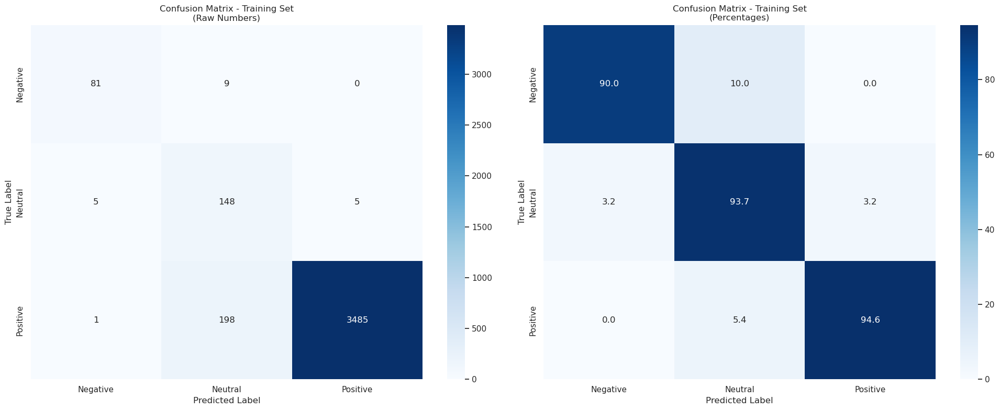


Classification Report - Training Set
              precision    recall  f1-score   support

    Negative       0.93      0.90      0.92        90
     Neutral       0.42      0.94      0.58       158
    Positive       1.00      0.95      0.97      3684

    accuracy                           0.94      3932
   macro avg       0.78      0.93      0.82      3932
weighted avg       0.97      0.94      0.95      3932


F1 Scores per class:
Class Negative: 0.9153
Class Neutral: 0.5770
Class Positive: 0.9716

Test Set Final Evaluation:


Batches:   0%|          | 0/32 [00:00<?, ?it/s]

32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━

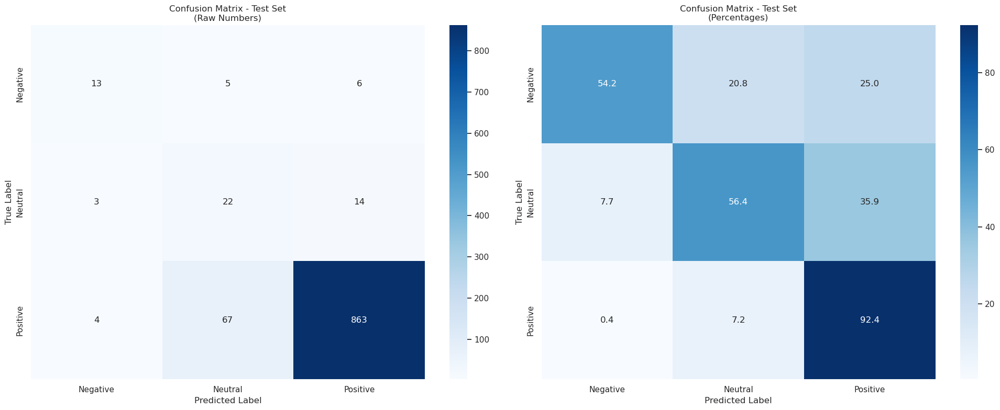


Classification Report - Test Set
              precision    recall  f1-score   support

    Negative       0.65      0.54      0.59        24
     Neutral       0.23      0.56      0.33        39
    Positive       0.98      0.92      0.95       934

    accuracy                           0.90       997
   macro avg       0.62      0.68      0.62       997
weighted avg       0.94      0.90      0.92       997


F1 Scores per class:
Class Negative: 0.5909
Class Neutral: 0.3308
Class Positive: 0.9499


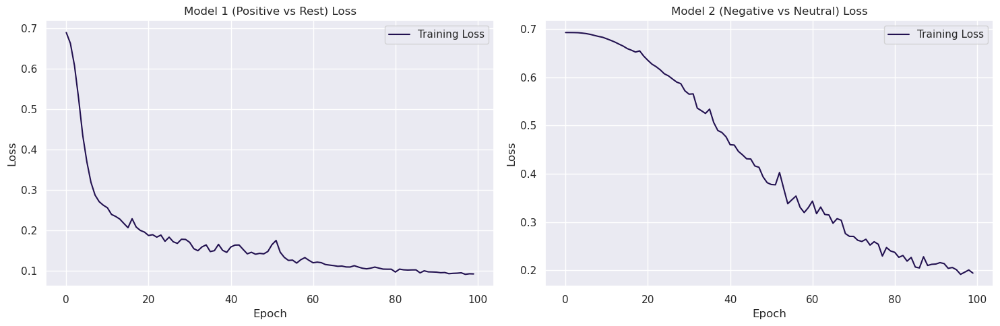


Model 7 Training Complete!
Models and results saved in ./model7/ directory
Files saved:
- model1_positive_vs_rest.h5
- model2_negative_vs_neutral.h5
- confusion_matrix_training_set.png
- confusion_matrix_test_set.png
- classification_report_training_set.txt
- classification_report_test_set.txt
- training_history.png
- training_history.npy

Test predictions have been added to df_test and saved as 'sentiment_test_model_7.csv'

Performance Metrics:

Training Set Performance:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━

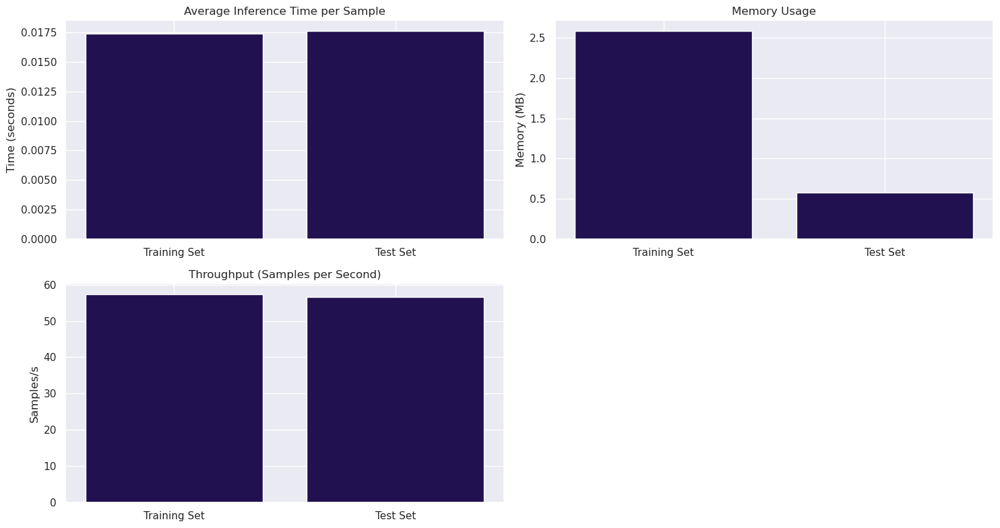


Performance metrics have been saved to './model7/model_performance_metrics.csv'

Comprehensive Model Summary:
Model: Model 7 (Hierarchical Transformer)
Total Parameters: 12,651,556
Model Size: 145.26 MB
Average Inference Time: 0.0176 seconds per sample
Throughput: 56.70 samples/second
Memory Usage: 0.58 MB

Model 1 (Positive vs Rest):
Final Accuracy: 0.9601
Total Epochs: 100

Model 2 (Negative vs Neutral):
Final Accuracy: 0.9503
Total Epochs: 100


In [69]:
import numpy as np
import pandas as pd
from sentence_transformers import SentenceTransformer
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Input, MultiHeadAttention, LayerNormalization, Add
from tensorflow.keras.regularizers import l2
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report, f1_score
from sklearn.utils.class_weight import compute_class_weight
from imblearn.combine import SMOTETomek
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Load the test set with previous models' predictions
df_test = pd.read_csv('sentiment_test_model_6.csv')


# Create directory for model 7
os.makedirs('./model7', exist_ok=True)

# Utility functions
def transformer_encoder(inputs, head_size, num_heads, ff_dim, dropout=0):
    x = MultiHeadAttention(
        key_dim=head_size, num_heads=num_heads, dropout=dropout
    )(inputs, inputs)
    x = Dropout(dropout)(x)
    res = Add()([inputs, x])
    x = LayerNormalization(epsilon=1e-6)(res)
    
    x = Dense(ff_dim, activation='relu')(x)
    x = Dropout(dropout)(x)
    x = Dense(inputs.shape[-1])(x)
    x = Dropout(dropout)(x)
    
    res = Add()([res, x])
    return LayerNormalization(epsilon=1e-6)(res)

def build_transformer_model(
    input_shape,
    num_classes,
    head_size=256,
    num_heads=4,
    ff_dim=4,
    num_transformer_blocks=4,
    mlp_units=[128],
    dropout=0.4,
    mlp_dropout=0.3,
):
    inputs = Input(shape=input_shape)
    x = inputs
    
    for _ in range(num_transformer_blocks):
        x = transformer_encoder(x, head_size, num_heads, ff_dim, dropout)

    x = tf.keras.layers.GlobalAveragePooling1D(data_format="channels_first")(x)
    
    for dim in mlp_units:
        x = Dense(dim, activation="relu")(x)
        x = Dropout(mlp_dropout)(x)
    
    outputs = Dense(num_classes, activation="softmax")(x)
    
    return Model(inputs, outputs)

def display_confusion_matrices(y_true, y_pred, set_name, labels):
    # Calculate confusion matrices
    cm = confusion_matrix(y_true, y_pred)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))
    
    # Plot raw numbers
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=labels,
                yticklabels=labels,
                ax=ax1)
    ax1.set_title(f'Confusion Matrix - {set_name}\n(Raw Numbers)')
    ax1.set_ylabel('True Label')
    ax1.set_xlabel('Predicted Label')
    
    # Plot percentages
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=labels,
                yticklabels=labels,
                ax=ax2)
    ax2.set_title(f'Confusion Matrix - {set_name}\n(Percentages)')
    ax2.set_ylabel('True Label')
    ax2.set_xlabel('Predicted Label')
    
    plt.tight_layout()
    plt.savefig(f'./model7/confusion_matrix_{set_name.lower().replace(" ", "_")}.png')
    plt.show()
    
    # Print classification report
    print(f"\nClassification Report - {set_name}")
    report = classification_report(y_true, y_pred, target_names=labels)
    print(report)
    
    # Save classification report
    with open(f'./model7/classification_report_{set_name.lower().replace(" ", "_")}.txt', 'w') as f:
        f.write(report)
    
    # Calculate and print F1 scores per class
    f1_scores = f1_score(y_true, y_pred, average=None)
    print("\nF1 Scores per class:")
    for i, score in enumerate(f1_scores):
        print(f"Class {labels[i]}: {score:.4f}")

# 1. Data preparation
print("Loading and preparing data...")
le = LabelEncoder()
original_labels = df_train['sentiment'].copy()
y = le.fit_transform(original_labels)

# Create binary labels for first model (Positive vs Rest)
y_binary = (original_labels == 'Positive').astype(int)

# 2. SBERT embeddings
print("Creating SBERT embeddings...")
model_sbert = SentenceTransformer('all-MiniLM-L6-v2')
X = model_sbert.encode(df_train['combined_review_cleaned'].tolist(), 
                      batch_size=32, 
                      show_progress_bar=True)

# 3. Apply SMOTE-Tomek for Model 1
print("\nApplying SMOTE-Tomek for Model 1...")
smote_tomek = SMOTETomek(random_state=42, n_jobs=-1)
X_resampled_1, y_resampled_1 = smote_tomek.fit_resample(X, y_binary)

# Calculate class weights for Model 1
class_weights_1 = compute_class_weight('balanced',
                                     classes=np.unique(y_resampled_1),
                                     y=y_resampled_1)
class_weight_dict_1 = dict(zip(np.unique(y_resampled_1), class_weights_1))

# Reshape data for transformer
X_resampled_1 = X_resampled_1.reshape(X_resampled_1.shape[0], 1, X_resampled_1.shape[1])

# 4. Build and train Model 1 (Positive vs Rest)
print("\nTraining Model 1 (Positive vs Rest)...")
model1 = build_transformer_model(
    input_shape=(1, 384),
    num_classes=2,
    head_size=256,
    num_heads=4,
    ff_dim=4,
    num_transformer_blocks=4,
    mlp_units=[128],
    dropout=0.4,
    mlp_dropout=0.3,
)

model1.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

history1 = model1.fit(
    X_resampled_1,
    y_resampled_1,
    epochs=100,
    batch_size=32,
    class_weight=class_weight_dict_1,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='loss',
            patience=10,
            restore_best_weights=True
        ),
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='loss',
            factor=0.5,
            patience=5,
            min_lr=0.00001
        )
    ]
)

# 5. Prepare data for Model 2 (Negative vs Neutral)
print("\nPreparing data for Model 2...")
# Get predictions from Model 1
predictions_1 = model1.predict(X.reshape(-1, 1, 384))
rest_mask = (np.argmax(predictions_1, axis=1) == 0)  # Where model 1 predicted "Rest"

# Filter data for Negative vs Neutral classification
X_rest = X[rest_mask]
y_rest = original_labels[rest_mask]
y_rest_binary = (y_rest == 'Negative').astype(int)

# Apply SMOTE-Tomek for Model 2
print("\nApplying SMOTE-Tomek for Model 2...")
X_resampled_2, y_resampled_2 = smote_tomek.fit_resample(X_rest, y_rest_binary)

# Calculate class weights for Model 2
class_weights_2 = compute_class_weight('balanced',
                                     classes=np.unique(y_resampled_2),
                                     y=y_resampled_2)
class_weight_dict_2 = dict(zip(np.unique(y_resampled_2), class_weights_2))

# Reshape data for transformer
X_resampled_2 = X_resampled_2.reshape(X_resampled_2.shape[0], 1, X_resampled_2.shape[1])

# 6. Build and train Model 2 (Negative vs Neutral)
print("\nTraining Model 2 (Negative vs Neutral)...")
model2 = build_transformer_model(
    input_shape=(1, 384),
    num_classes=2,
    head_size=256,
    num_heads=4,
    ff_dim=4,
    num_transformer_blocks=4,
    mlp_units=[128],
    dropout=0.4,
    mlp_dropout=0.3,
)

model2.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

history2 = model2.fit(
    X_resampled_2,
    y_resampled_2,
    epochs=100,
    batch_size=32,
    class_weight=class_weight_dict_2,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='loss',
            patience=10,
            restore_best_weights=True
        ),
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='loss',
            factor=0.5,
            patience=5,
            min_lr=0.00001
        )
    ]
)

# Function to get combined predictions
def get_combined_predictions(X, model1, model2):
    X_reshaped = X.reshape(-1, 1, 384)
    pred_1 = model1.predict(X_reshaped)
    is_positive = np.argmax(pred_1, axis=1) == 1
    
    final_predictions = []
    for i, pos in enumerate(is_positive):
        if pos:
            final_predictions.append('Positive')
        else:
            pred_2 = model2.predict(X_reshaped[i:i+1])
            if np.argmax(pred_2) == 1:
                final_predictions.append('Negative')
            else:
                final_predictions.append('Neutral')
    return final_predictions
# Save models
print("\nSaving models...")
model1.save('./model7/model1_positive_vs_rest.h5')
model2.save('./model7/model2_negative_vs_neutral.h5')

# Final evaluations
print("\nFinal Model Evaluations:")

# Training set evaluation
print("\nTraining Set Final Evaluation:")
y_train_final = get_combined_predictions(X, model1, model2)
display_confusion_matrices(original_labels, y_train_final, 
                         "Training Set", ['Negative', 'Neutral', 'Positive'])

# Test set evaluation
print("\nTest Set Final Evaluation:")
X_test = model_sbert.encode(df_test['combined_review_cleaned'].tolist(), 
                           batch_size=32, 
                           show_progress_bar=True)
y_test_true = df_test['sentiment'].values
y_test_final = get_combined_predictions(X_test, model1, model2)
display_confusion_matrices(y_test_true, y_test_final, 
                         "Test Set", ['Negative', 'Neutral', 'Positive'])

# Plot and save training histories
plt.figure(figsize=(15,5))

# Model 1 history
plt.subplot(1,2,1)
plt.plot(history1.history['loss'], label='Training Loss')
plt.title('Model 1 (Positive vs Rest) Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Model 2 history
plt.subplot(1,2,2)
plt.plot(history2.history['loss'], label='Training Loss')
plt.title('Model 2 (Negative vs Neutral) Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.savefig('./model7/training_history.png')
plt.show()

# Save training history
history_dict = {
    'model1_loss': history1.history['loss'],
    'model2_loss': history2.history['loss']
}
np.save('./model7/training_history.npy', history_dict)

# Print final summary
print("\nModel 7 Training Complete!")
print("Models and results saved in ./model7/ directory")
print("Files saved:")
print("- model1_positive_vs_rest.h5")
print("- model2_negative_vs_neutral.h5")
print("- confusion_matrix_training_set.png")
print("- confusion_matrix_test_set.png")
print("- classification_report_training_set.txt")
print("- classification_report_test_set.txt")
print("- training_history.png")
print("- training_history.npy")

# Store predictions in df_test
df_test['predicted_sentiment_model_7'] = y_test_final
df_test.to_csv('sentiment_test_model_7.csv', index=False)
print("\nTest predictions have been added to df_test and saved as 'sentiment_test_model_7.csv'")


# Save test predictions
test_results = pd.DataFrame({
    'true_label': y_test_true,
    'predicted_label': y_test_final
})
test_results.to_csv('./model7/test_predictions.csv', index=False)

if __name__ == "__main__":
    # Set random seeds for reproducibility
    np.random.seed(42)
    tf.random.set_seed(42)
    
    # Make sure df_train and df_test are loaded
    if 'df_train' not in globals():
        raise ValueError("Please load your training data into df_train before running")
    if 'df_test' not in globals():
        raise ValueError("Please load your test data into df_test before running")

# Performance Metrics Evaluation
import time
import psutil
from memory_profiler import profile

def measure_inference_metrics(models, X, batch_size=32):
    # Ensure proper shape for Transformer
    if len(X.shape) == 2:
        X = X.reshape(X.shape[0], 1, X.shape[1])
    
    # Warm-up run
    _ = get_combined_predictions(X[:batch_size], models[0], models[1])
    
    # Memory usage before inference
    process = psutil.Process(os.getpid())
    memory_before = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Measure inference time
    start_time = time.time()
    predictions = get_combined_predictions(X, models[0], models[1])
    end_time = time.time()
    
    # Memory usage after inference
    memory_after = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Calculate metrics
    total_time = end_time - start_time
    samples = len(X)
    avg_time_per_sample = total_time / samples
    memory_used = memory_after - memory_before
    
    return {
        'total_inference_time': total_time,
        'average_time_per_sample': avg_time_per_sample,
        'samples_per_second': samples / total_time,
        'memory_usage_mb': memory_used,
        'batch_size': batch_size
    }

# Get model complexity metrics
def get_models_complexity():
    # Combine metrics for both models
    trainable_params_1 = model1.count_params()
    trainable_params_2 = model2.count_params()
    non_trainable_params_1 = sum([tf.keras.backend.count_params(w) for w in model1.non_trainable_weights])
    non_trainable_params_2 = sum([tf.keras.backend.count_params(w) for w in model2.non_trainable_weights])
    
    model1_size = os.path.getsize('./model7/model1_positive_vs_rest.h5') / (1024 * 1024)
    model2_size = os.path.getsize('./model7/model2_negative_vs_neutral.h5') / (1024 * 1024)
    
    return {
        'trainable_parameters': trainable_params_1 + trainable_params_2,
        'non_trainable_parameters': non_trainable_params_1 + non_trainable_params_2,
        'total_parameters': trainable_params_1 + trainable_params_2 + non_trainable_params_1 + non_trainable_params_2,
        'model_size_mb': model1_size + model2_size,
        'model_type': 'Hierarchical Transformer'
    }

# Measure and print performance metrics
print("\nPerformance Metrics:")
print("\nTraining Set Performance:")
train_metrics = measure_inference_metrics([model1, model2], X)
for metric, value in train_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nTest Set Performance:")
test_metrics = measure_inference_metrics([model1, model2], X_test)
for metric, value in test_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nModel Complexity Metrics:")
complexity_metrics = get_models_complexity()
for metric, value in complexity_metrics.items():
    if isinstance(value, str):
        print(f"{metric}: {value}")
    elif 'size' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:,}")

# Visualize performance metrics
plt.figure(figsize=(15,8))

# Inference time comparison
plt.subplot(2,2,1)
metrics_data = [train_metrics['average_time_per_sample'], test_metrics['average_time_per_sample']]
plt.bar(['Training Set', 'Test Set'], metrics_data)
plt.title('Average Inference Time per Sample')
plt.ylabel('Time (seconds)')

# Memory usage comparison
plt.subplot(2,2,2)
memory_data = [train_metrics['memory_usage_mb'], test_metrics['memory_usage_mb']]
plt.bar(['Training Set', 'Test Set'], memory_data)
plt.title('Memory Usage')
plt.ylabel('Memory (MB)')

# Throughput comparison
plt.subplot(2,2,3)
throughput_data = [train_metrics['samples_per_second'], test_metrics['samples_per_second']]
plt.bar(['Training Set', 'Test Set'], throughput_data)
plt.title('Throughput (Samples per Second)')
plt.ylabel('Samples/s')

plt.tight_layout()
plt.savefig('./model7/performance_metrics.png')
plt.show()

# Store all metrics
performance_metrics = {
    'model7': {
        'train': train_metrics,
        'test': test_metrics,
        'complexity': complexity_metrics,
        'training_history': {
            'model1_final_loss': history1.history['loss'][-1],
            'model2_final_loss': history2.history['loss'][-1],
            'model1_final_accuracy': history1.history['accuracy'][-1],
            'model2_final_accuracy': history2.history['accuracy'][-1],
            'model1_epochs': len(history1.history['loss']),
            'model2_epochs': len(history2.history['loss'])
        },
        'model_architecture': 'Hierarchical Transformer',
        'class_weights': {
            'model1': class_weight_dict_1,
            'model2': class_weight_dict_2
        }
    }
}

# Create detailed metrics DataFrame
def create_metrics_df(metrics_dict):
    data = {
        'Model': [],
        'Architecture': [],
        'Training Time per Sample (s)': [],
        'Test Time per Sample (s)': [],
        'Training Memory (MB)': [],
        'Test Memory (MB)': [],
        'Model Size (MB)': [],
        'Total Parameters': [],
        'Model 1 Final Loss': [],
        'Model 2 Final Loss': [],
        'Model 1 Final Accuracy': [],
        'Model 2 Final Accuracy': [],
        'Model 1 Epochs': [],
        'Model 2 Epochs': [],
        'Throughput (samples/s)': []
    }
    
    for model_name, metrics in metrics_dict.items():
        data['Model'].append(model_name)
        data['Architecture'].append(metrics['model_architecture'])
        data['Training Time per Sample (s)'].append(metrics['train']['average_time_per_sample'])
        data['Test Time per Sample (s)'].append(metrics['test']['average_time_per_sample'])
        data['Training Memory (MB)'].append(metrics['train']['memory_usage_mb'])
        data['Test Memory (MB)'].append(metrics['test']['memory_usage_mb'])
        data['Model Size (MB)'].append(metrics['complexity']['model_size_mb'])
        data['Total Parameters'].append(metrics['complexity']['total_parameters'])
        data['Model 1 Final Loss'].append(metrics['training_history']['model1_final_loss'])
        data['Model 2 Final Loss'].append(metrics['training_history']['model2_final_loss'])
        data['Model 1 Final Accuracy'].append(metrics['training_history']['model1_final_accuracy'])
        data['Model 2 Final Accuracy'].append(metrics['training_history']['model2_final_accuracy'])
        data['Model 1 Epochs'].append(metrics['training_history']['model1_epochs'])
        data['Model 2 Epochs'].append(metrics['training_history']['model2_epochs'])
        data['Throughput (samples/s)'].append(metrics['test']['samples_per_second'])
    
    return pd.DataFrame(data)

# Create and save metrics DataFrame
metrics_df = create_metrics_df(performance_metrics)
metrics_df.to_csv('./model7/model_performance_metrics.csv', index=False)
print("\nPerformance metrics have been saved to './model7/model_performance_metrics.csv'")

# Print comprehensive summary
print("\nComprehensive Model Summary:")
print("=" * 50)
print(f"Model: Model 7 (Hierarchical Transformer)")
print(f"Total Parameters: {complexity_metrics['total_parameters']:,}")
print(f"Model Size: {complexity_metrics['model_size_mb']:.2f} MB")
print(f"Average Inference Time: {test_metrics['average_time_per_sample']:.4f} seconds per sample")
print(f"Throughput: {test_metrics['samples_per_second']:.2f} samples/second")
print(f"Memory Usage: {test_metrics['memory_usage_mb']:.2f} MB")
print("\nModel 1 (Positive vs Rest):")
print(f"Final Accuracy: {history1.history['accuracy'][-1]:.4f}")
print(f"Total Epochs: {len(history1.history['loss'])}")
print("\nModel 2 (Negative vs Neutral):")
print(f"Final Accuracy: {history2.history['accuracy'][-1]:.4f}")
print(f"Total Epochs: {len(history2.history['loss'])}")


## 8. SBERT + SMOTE Tomek + Transformer + Class Weighing + Pipeline + Autoencoder

123/123 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step

Applying SMOTE-Tomek for Model 2...

Training Model 2 (Negative vs Neutral)...
Epoch 1/100
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5324 - loss: 0.6932  

2025-05-04 03:19:26.747205: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_28', 8 bytes spill stores, 8 bytes spill loads

2025-05-04 03:19:26.875313: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_40', 8 bytes spill stores, 8 bytes spill loads

2025-05-04 03:19:27.005061: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_78', 24 bytes spill stores, 24 bytes spill loads

2025-05-04 03:19:27.005673: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_102', 24 bytes spill stores, 24 bytes spill loads



18/18 ━━━━━━━━━━━━━━━━━━━━ 32s 745ms/step - accuracy: 0.5253 - loss: 0.6932 - learning_rate: 1.0000e-04
Epoch 2/100
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5253 - loss: 0.6931 - learning_rate: 1.0000e-04
Epoch 3/100
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5253 - loss: 0.6930 - learning_rate: 1.0000e-04
Epoch 4/100
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5253 - loss: 0.6929 - learning_rate: 1.0000e-04
Epoch 5/100
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5256 - loss: 0.6927 - learning_rate: 1.0000e-04
Epoch 6/100
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6315 - loss: 0.6920 - learning_rate: 1.0000e-04
Epoch 7/100
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7430 - loss: 0.6908 - learning_rate: 1.0000e-04
Epoch 8/100
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7380 - loss: 0.6896 - learning_rate: 1.0000e-04
Epoch 9/100
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7952 - loss: 0.6878 - learning_rate: 1.0

Batches:   0%|          | 0/32 [00:00<?, ?it/s]

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s

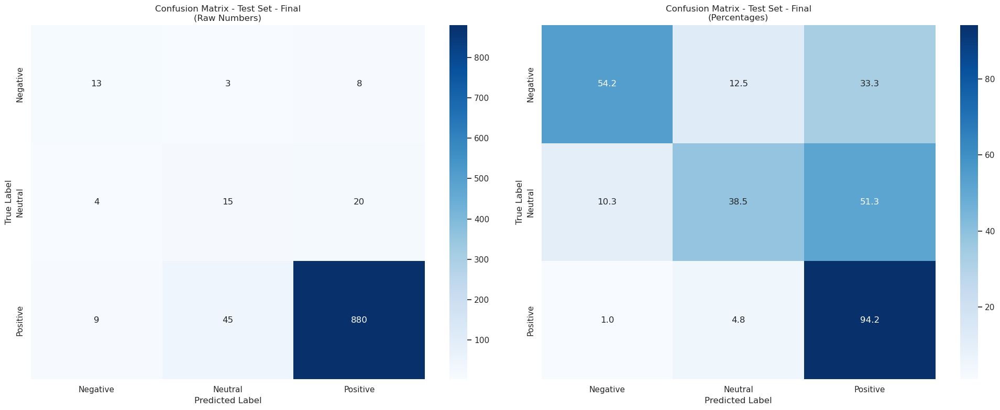


Classification Report - Test Set - Final
              precision    recall  f1-score   support

    Negative       0.50      0.54      0.52        24
     Neutral       0.24      0.38      0.29        39
    Positive       0.97      0.94      0.96       934

    accuracy                           0.91       997
   macro avg       0.57      0.62      0.59       997
weighted avg       0.93      0.91      0.92       997


F1 Scores per class:
Class Negative: 0.5200
Class Neutral: 0.2941
Class Positive: 0.9555

Test predictions have been added to df_test and saved as 'sentiment_test_model_8.csv'


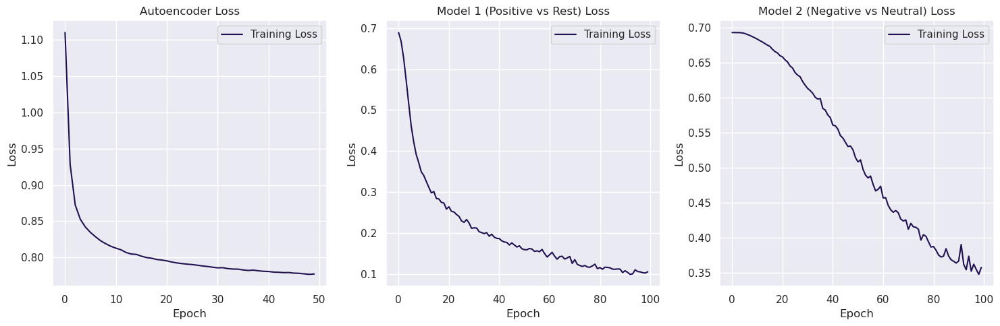


Performance Metrics:

Training Set Performance:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━

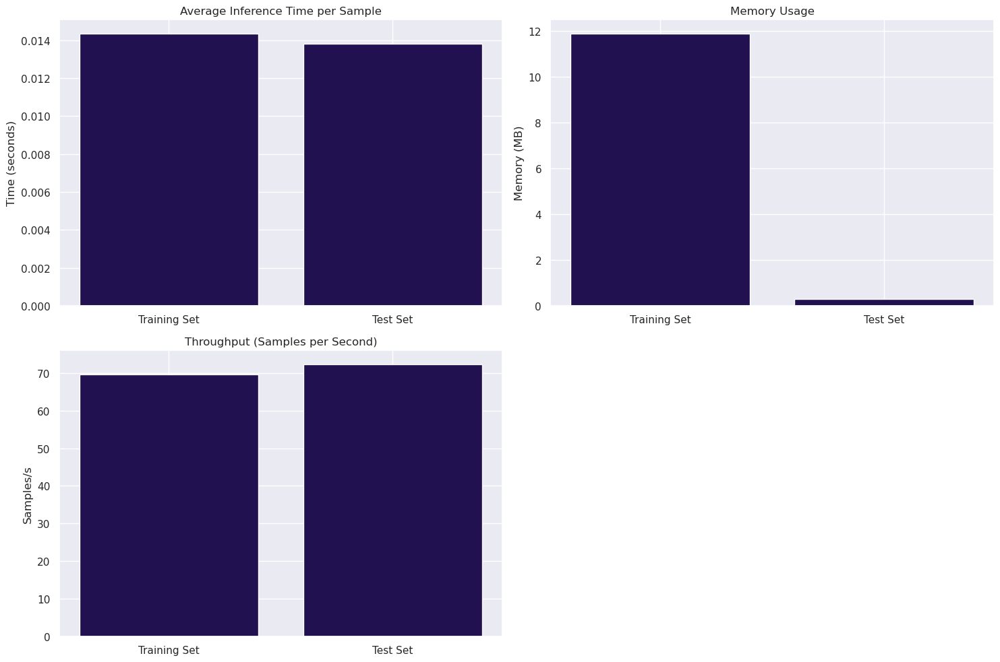


Performance metrics have been saved to 'model8_performance_metrics.csv'

Comprehensive Model Summary:
Model: Model 8 (Autoencoder-Enhanced Hierarchical Transformer)
Total Parameters: 1,219,876
Encoding Dimension: 128
Average Inference Time: 0.0138 seconds per sample
Throughput: 72.39 samples/second
Memory Usage: 0.29 MB

Autoencoder:
Final Loss: 0.7774
Total Epochs: 50

Model 1 (Positive vs Rest):
Final Accuracy: 0.9650
Total Epochs: 100

Model 2 (Negative vs Neutral):
Final Accuracy: 0.8887
Total Epochs: 100


In [ ]:
import numpy as np
import pandas as pd
from sentence_transformers import SentenceTransformer
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Input, MultiHeadAttention
from tensorflow.keras.layers import LayerNormalization, Add, Reshape, Conv1D, UpSampling1D
from tensorflow.keras.regularizers import l2
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import confusion_matrix, classification_report, f1_score
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from imblearn.combine import SMOTETomek
import seaborn as sns
import matplotlib.pyplot as plt

# Load previous test results
df_test = pd.read_csv('sentiment_test_model_7.csv')


def transformer_encoder(inputs, head_size, num_heads, ff_dim, dropout=0):
    x = MultiHeadAttention(
        key_dim=head_size, num_heads=num_heads, dropout=dropout
    )(inputs, inputs)
    x = Dropout(dropout)(x)
    res = Add()([inputs, x])
    x = LayerNormalization(epsilon=1e-6)(res)

    x = Dense(ff_dim, activation='relu')(x)
    x = Dropout(dropout)(x)
    x = Dense(inputs.shape[-1])(x)
    x = Dropout(dropout)(x)

    res = Add()([res, x])
    return LayerNormalization(epsilon=1e-6)(res)

def build_transformer_model(
    input_shape,
    num_classes,
    head_size=256,
    num_heads=4,
    ff_dim=4,
    num_transformer_blocks=4,
    mlp_units=[128],
    dropout=0.4,
    mlp_dropout=0.3,
):
    inputs = Input(shape=input_shape)
    x = inputs

    for _ in range(num_transformer_blocks):
        x = transformer_encoder(x, head_size, num_heads, ff_dim, dropout)

    x = tf.keras.layers.GlobalAveragePooling1D(data_format="channels_first")(x)

    for dim in mlp_units:
        x = Dense(dim, activation="relu")(x)
        x = Dropout(mlp_dropout)(x)

    outputs = Dense(num_classes, activation="softmax")(x)

    return Model(inputs, outputs)

def display_confusion_matrices(y_true, y_pred, set_name, labels):
    # Calculate confusion matrices
    cm = confusion_matrix(y_true, y_pred)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100

    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))

    # Plot raw numbers
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=labels,
                yticklabels=labels,
                ax=ax1)
    ax1.set_title(f'Confusion Matrix - {set_name}\n(Raw Numbers)')
    ax1.set_ylabel('True Label')
    ax1.set_xlabel('Predicted Label')

    # Plot percentages
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=labels,
                yticklabels=labels,
                ax=ax2)
    ax2.set_title(f'Confusion Matrix - {set_name}\n(Percentages)')
    ax2.set_ylabel('True Label')
    ax2.set_xlabel('Predicted Label')

    plt.tight_layout()
    plt.show()

    # Print classification report
    print(f"\nClassification Report - {set_name}")
    print(classification_report(y_true, y_pred, target_names=labels))

    # Calculate and print F1 scores per class
    f1_scores = f1_score(y_true, y_pred, average=None)
    print("\nF1 Scores per class:")
    for i, score in enumerate(f1_scores):
        print(f"Class {labels[i]}: {score:.4f}")
def build_autoencoder(input_dim, encoding_dim):
    # Encoder
    input_layer = Input(shape=(input_dim,))

    # Encoder layers
    encoded = Dense(256, activation='relu')(input_layer)
    encoded = BatchNormalization()(encoded)
    encoded = Dropout(0.3)(encoded)

    encoded = Dense(128, activation='relu')(encoded)
    encoded = BatchNormalization()(encoded)
    encoded = Dropout(0.3)(encoded)

    encoded = Dense(encoding_dim, activation='relu')(encoded)

    # Decoder layers
    decoded = Dense(128, activation='relu')(encoded)
    decoded = BatchNormalization()(decoded)
    decoded = Dropout(0.3)(decoded)

    decoded = Dense(256, activation='relu')(decoded)
    decoded = BatchNormalization()(decoded)
    decoded = Dropout(0.3)(decoded)

    decoded = Dense(input_dim, activation='sigmoid')(decoded)

    # Create autoencoder model
    autoencoder = Model(input_layer, decoded)

    # Create encoder model
    encoder = Model(input_layer, encoded)

    return autoencoder, encoder

# 1. Data preparation
print("Loading and preparing data...")
le = LabelEncoder()
original_labels = df_train['sentiment'].copy()
y = le.fit_transform(original_labels)

# Create binary labels for first model (Positive vs Rest)
y_binary = (original_labels == 'Positive').astype(int)

# 2. SBERT embeddings
print("Creating SBERT embeddings...")
model_sbert = SentenceTransformer('all-MiniLM-L6-v2')
X = model_sbert.encode(df_train['combined_review_cleaned'].tolist(),
                      batch_size=32,
                      show_progress_bar=True)

# 3. Scale the data for autoencoder
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 4. Build and train autoencoder
print("\nTraining Autoencoder...")
input_dim = X_scaled.shape[1]
encoding_dim = 128

autoencoder, encoder = build_autoencoder(input_dim, encoding_dim)
autoencoder.compile(optimizer='adam', loss='mse')

# Train autoencoder
autoencoder_history = autoencoder.fit(
    X_scaled,
    X_scaled,
    epochs=50,
    batch_size=32,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='loss',
            patience=5,
            restore_best_weights=True
        )
    ]
)

# Get encoded features
X_encoded = encoder.predict(X_scaled)

# 5. Prepare data for Model 1 (Positive vs Rest)
print("\nApplying SMOTE-Tomek for Model 1...")
smote_tomek = SMOTETomek(random_state=42, n_jobs=-1)
X_resampled_1, y_resampled_1 = smote_tomek.fit_resample(X_encoded, y_binary)

# Calculate class weights for Model 1
class_weights_1 = compute_class_weight('balanced',
                                     classes=np.unique(y_resampled_1),
                                     y=y_resampled_1)
class_weight_dict_1 = dict(zip(np.unique(y_resampled_1), class_weights_1))

# Reshape data for transformer
X_resampled_1 = X_resampled_1.reshape(X_resampled_1.shape[0], 1, X_resampled_1.shape[1])
# 6. Build and train Model 1 (Positive vs Rest)
print("\nTraining Model 1 (Positive vs Rest)...")
model1 = build_transformer_model(
    input_shape=(1, encoding_dim),
    num_classes=2,
    head_size=64,
    num_heads=4,
    ff_dim=4,
    num_transformer_blocks=4,
    mlp_units=[64],
    dropout=0.4,
    mlp_dropout=0.3,
)

model1.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

history1 = model1.fit(
    X_resampled_1,
    y_resampled_1,
    epochs=100,
    batch_size=32,
    class_weight=class_weight_dict_1,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='loss',
            patience=10,
            restore_best_weights=True
        ),
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='loss',
            factor=0.5,
            patience=5,
            min_lr=0.00001
        )
    ]
)

# 7. Prepare data for Model 2 (Negative vs Neutral)
print("\nPreparing data for Model 2...")
# Get predictions from Model 1
X_encoded_reshaped = X_encoded.reshape(-1, 1, encoding_dim)
predictions_1 = model1.predict(X_encoded_reshaped)
rest_mask = (np.argmax(predictions_1, axis=1) == 0)

# Filter data for Negative vs Neutral classification
X_rest = X_encoded[rest_mask]
y_rest = original_labels[rest_mask]
y_rest_binary = (y_rest == 'Negative').astype(int)

# Apply SMOTE-Tomek for Model 2
print("\nApplying SMOTE-Tomek for Model 2...")
X_resampled_2, y_resampled_2 = smote_tomek.fit_resample(X_rest, y_rest_binary)

# Calculate class weights for Model 2
class_weights_2 = compute_class_weight('balanced',
                                     classes=np.unique(y_resampled_2),
                                     y=y_resampled_2)
class_weight_dict_2 = dict(zip(np.unique(y_resampled_2), class_weights_2))

# Reshape data for transformer
X_resampled_2 = X_resampled_2.reshape(X_resampled_2.shape[0], 1, X_resampled_2.shape[1])

# 8. Build and train Model 2 (Negative vs Neutral)
print("\nTraining Model 2 (Negative vs Neutral)...")
model2 = build_transformer_model(
    input_shape=(1, encoding_dim),
    num_classes=2,
    head_size=64,
    num_heads=4,
    ff_dim=4,
    num_transformer_blocks=4,
    mlp_units=[64],
    dropout=0.4,
    mlp_dropout=0.3,
)

model2.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

history2 = model2.fit(
    X_resampled_2,
    y_resampled_2,
    epochs=100,
    batch_size=32,
    class_weight=class_weight_dict_2,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='loss',
            patience=10,
            restore_best_weights=True
        ),
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='loss',
            factor=0.5,
            patience=5,
            min_lr=0.00001
        )
    ]
)
# 9. Function to get combined predictions with autoencoder
def get_combined_predictions(X, scaler, encoder, model1, model2):
    # Scale and encode the input
    X_scaled = scaler.transform(X)
    X_encoded = encoder.predict(X_scaled)
    X_reshaped = X_encoded.reshape(-1, 1, encoding_dim)

    # Model 1 predictions
    pred_1 = model1.predict(X_reshaped)
    is_positive = np.argmax(pred_1, axis=1) == 1

    final_predictions = []
    for i, pos in enumerate(is_positive):
        if pos:
            final_predictions.append('Positive')
        else:
            pred_2 = model2.predict(X_reshaped[i:i+1])
            if np.argmax(pred_2) == 1:
                final_predictions.append('Negative')
            else:
                final_predictions.append('Neutral')
    return final_predictions

# 10. Test set evaluation
print("\nTest Set Evaluation:")
X_test = model_sbert.encode(df_test['combined_review_cleaned'].tolist(),
                           batch_size=32,
                           show_progress_bar=True)
y_test_true = df_test['sentiment'].values
y_test_pred = get_combined_predictions(X_test, scaler, encoder, model1, model2)
display_confusion_matrices(y_test_true, y_test_pred,
                         "Test Set - Final", ['Negative', 'Neutral', 'Positive'])

# Store predictions in df_test
df_test['predicted_sentiment_model_8'] = y_test_pred
df_test.to_csv('sentiment_test_model_8.csv', index=False)
print("\nTest predictions have been added to df_test and saved as 'sentiment_test_model_8.csv'")


# 11. Plot training histories
plt.figure(figsize=(15,5))

# Autoencoder history
plt.subplot(1,3,1)
plt.plot(autoencoder_history.history['loss'], label='Training Loss')
plt.title('Autoencoder Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Model 1 history
plt.subplot(1,3,2)
plt.plot(history1.history['loss'], label='Training Loss')
plt.title('Model 1 (Positive vs Rest) Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Model 2 history
plt.subplot(1,3,3)
plt.plot(history2.history['loss'], label='Training Loss')
plt.title('Model 2 (Negative vs Neutral) Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# 12. Save models (optional)
"""
model1.save('model1_positive_vs_rest.h5')
model2.save('model2_negative_vs_neutral.h5')
encoder.save('encoder_model.h5')

# Save scaler
import joblib
joblib.dump(scaler, 'scaler.save')
"""
# 13. Performance Metrics Evaluation
import time
import psutil
import os
from memory_profiler import profile

def measure_inference_metrics(X, batch_size=32):
    # Warm-up run
    _ = get_combined_predictions(X[:batch_size], scaler, encoder, model1, model2)
    
    # Memory usage before inference
    process = psutil.Process(os.getpid())
    memory_before = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Measure inference time
    start_time = time.time()
    predictions = get_combined_predictions(X, scaler, encoder, model1, model2)
    end_time = time.time()
    
    # Memory usage after inference
    memory_after = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Calculate metrics
    total_time = end_time - start_time
    samples = len(X)
    avg_time_per_sample = total_time / samples
    memory_used = memory_after - memory_before
    
    return {
        'total_inference_time': total_time,
        'average_time_per_sample': avg_time_per_sample,
        'samples_per_second': samples / total_time,
        'memory_usage_mb': memory_used,
        'batch_size': batch_size
    }

# Get model complexity metrics
def get_models_complexity():
    # Combine metrics for all models
    trainable_params_ae = encoder.count_params()
    trainable_params_1 = model1.count_params()
    trainable_params_2 = model2.count_params()
    
    non_trainable_params_ae = sum([tf.keras.backend.count_params(w) for w in encoder.non_trainable_weights])
    non_trainable_params_1 = sum([tf.keras.backend.count_params(w) for w in model1.non_trainable_weights])
    non_trainable_params_2 = sum([tf.keras.backend.count_params(w) for w in model2.non_trainable_weights])
    
    return {
        'trainable_parameters': trainable_params_ae + trainable_params_1 + trainable_params_2,
        'non_trainable_parameters': non_trainable_params_ae + non_trainable_params_1 + non_trainable_params_2,
        'total_parameters': (trainable_params_ae + trainable_params_1 + trainable_params_2 + 
                           non_trainable_params_ae + non_trainable_params_1 + non_trainable_params_2),
        'encoding_dimension': encoding_dim,
        'model_type': 'Autoencoder-Enhanced Hierarchical Transformer'
    }

# Measure and print performance metrics
print("\nPerformance Metrics:")
print("\nTraining Set Performance:")
train_metrics = measure_inference_metrics(X)
for metric, value in train_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nTest Set Performance:")
test_metrics = measure_inference_metrics(X_test)
for metric, value in test_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nModel Complexity Metrics:")
complexity_metrics = get_models_complexity()
for metric, value in complexity_metrics.items():
    if isinstance(value, str):
        print(f"{metric}: {value}")
    elif 'dimension' in metric:
        print(f"{metric}: {value}")
    else:
        print(f"{metric}: {value:,}")

# Visualize performance metrics
plt.figure(figsize=(15,10))

# Inference time comparison
plt.subplot(2,2,1)
metrics_data = [train_metrics['average_time_per_sample'], test_metrics['average_time_per_sample']]
plt.bar(['Training Set', 'Test Set'], metrics_data)
plt.title('Average Inference Time per Sample')
plt.ylabel('Time (seconds)')

# Memory usage comparison
plt.subplot(2,2,2)
memory_data = [train_metrics['memory_usage_mb'], test_metrics['memory_usage_mb']]
plt.bar(['Training Set', 'Test Set'], memory_data)
plt.title('Memory Usage')
plt.ylabel('Memory (MB)')

# Throughput comparison
plt.subplot(2,2,3)
throughput_data = [train_metrics['samples_per_second'], test_metrics['samples_per_second']]
plt.bar(['Training Set', 'Test Set'], throughput_data)
plt.title('Throughput (Samples per Second)')
plt.ylabel('Samples/s')

plt.tight_layout()
plt.show()

# Store all metrics
performance_metrics = {
    'model8': {
        'train': train_metrics,
        'test': test_metrics,
        'complexity': complexity_metrics,
        'training_history': {
            'autoencoder_final_loss': autoencoder_history.history['loss'][-1],
            'model1_final_loss': history1.history['loss'][-1],
            'model2_final_loss': history2.history['loss'][-1],
            'model1_final_accuracy': history1.history['accuracy'][-1],
            'model2_final_accuracy': history2.history['accuracy'][-1],
            'autoencoder_epochs': len(autoencoder_history.history['loss']),
            'model1_epochs': len(history1.history['loss']),
            'model2_epochs': len(history2.history['loss'])
        },
        'model_architecture': 'Autoencoder-Enhanced Hierarchical Transformer',
        'class_weights': {
            'model1': class_weight_dict_1,
            'model2': class_weight_dict_2
        }
    }
}

# Create detailed metrics DataFrame
def create_metrics_df(metrics_dict):
    data = {
        'Model': [],
        'Architecture': [],
        'Training Time per Sample (s)': [],
        'Test Time per Sample (s)': [],
        'Training Memory (MB)': [],
        'Test Memory (MB)': [],
        'Total Parameters': [],
        'Encoding Dimension': [],
        'Autoencoder Final Loss': [],
        'Model 1 Final Loss': [],
        'Model 2 Final Loss': [],
        'Model 1 Final Accuracy': [],
        'Model 2 Final Accuracy': [],
        'Autoencoder Epochs': [],
        'Model 1 Epochs': [],
        'Model 2 Epochs': [],
        'Throughput (samples/s)': []
    }
    
    for model_name, metrics in metrics_dict.items():
        data['Model'].append(model_name)
        data['Architecture'].append(metrics['model_architecture'])
        data['Training Time per Sample (s)'].append(metrics['train']['average_time_per_sample'])
        data['Test Time per Sample (s)'].append(metrics['test']['average_time_per_sample'])
        data['Training Memory (MB)'].append(metrics['train']['memory_usage_mb'])
        data['Test Memory (MB)'].append(metrics['test']['memory_usage_mb'])
        data['Total Parameters'].append(metrics['complexity']['total_parameters'])
        data['Encoding Dimension'].append(metrics['complexity']['encoding_dimension'])
        data['Autoencoder Final Loss'].append(metrics['training_history']['autoencoder_final_loss'])
        data['Model 1 Final Loss'].append(metrics['training_history']['model1_final_loss'])
        data['Model 2 Final Loss'].append(metrics['training_history']['model2_final_loss'])
        data['Model 1 Final Accuracy'].append(metrics['training_history']['model1_final_accuracy'])
        data['Model 2 Final Accuracy'].append(metrics['training_history']['model2_final_accuracy'])
        data['Autoencoder Epochs'].append(metrics['training_history']['autoencoder_epochs'])
        data['Model 1 Epochs'].append(metrics['training_history']['model1_epochs'])
        data['Model 2 Epochs'].append(metrics['training_history']['model2_epochs'])
        data['Throughput (samples/s)'].append(metrics['test']['samples_per_second'])
    
    return pd.DataFrame(data)

# Create and save metrics DataFrame
metrics_df = create_metrics_df(performance_metrics)
metrics_df.to_csv('model8_performance_metrics.csv', index=False)
print("\nPerformance metrics have been saved to 'model8_performance_metrics.csv'")

# Print comprehensive summary
print("\nComprehensive Model Summary:")
print("=" * 50)
print(f"Model: Model 8 (Autoencoder-Enhanced Hierarchical Transformer)")
print(f"Total Parameters: {complexity_metrics['total_parameters']:,}")
print(f"Encoding Dimension: {complexity_metrics['encoding_dimension']}")
print(f"Average Inference Time: {test_metrics['average_time_per_sample']:.4f} seconds per sample")
print(f"Throughput: {test_metrics['samples_per_second']:.2f} samples/second")
print(f"Memory Usage: {test_metrics['memory_usage_mb']:.2f} MB")
print("\nAutoencoder:")
print(f"Final Loss: {autoencoder_history.history['loss'][-1]:.4f}")
print(f"Total Epochs: {len(autoencoder_history.history['loss'])}")
print("\nModel 1 (Positive vs Rest):")
print(f"Final Accuracy: {history1.history['accuracy'][-1]:.4f}")
print(f"Total Epochs: {len(history1.history['loss'])}")
print("\nModel 2 (Negative vs Neutral):")
print(f"Final Accuracy: {history2.history['accuracy'][-1]:.4f}")
print(f"Total Epochs: {len(history2.history['loss'])}")


## 9. SBERT + Embeddings Scaling + Autoencoder + Simple Neural Network with 2 stage classification

=== Stage 1: Positive vs Rest Classification ===
Starting Stage 1: Positive vs Rest...
Generating embeddings for positive reviews...


Batches:   0%|          | 0/116 [00:00<?, ?it/s]

Generating embeddings for rest reviews...


Batches:   0%|          | 0/8 [00:00<?, ?it/s]


Training autoencoder on positive samples...


Epoch 1/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [1/30], Average Loss: 0.7500


Epoch 2/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [2/30], Average Loss: 0.5612


Epoch 3/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [3/30], Average Loss: 0.4892


Epoch 4/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [4/30], Average Loss: 0.4430


Epoch 5/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [5/30], Average Loss: 0.4121


Epoch 6/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [6/30], Average Loss: 0.3864


Epoch 7/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [7/30], Average Loss: 0.3678


Epoch 8/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [8/30], Average Loss: 0.3518


Epoch 9/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [9/30], Average Loss: 0.3374


Epoch 10/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [10/30], Average Loss: 0.3266


Epoch 11/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [11/30], Average Loss: 0.3167


Epoch 12/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [12/30], Average Loss: 0.3069


Epoch 13/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [13/30], Average Loss: 0.2997


Epoch 14/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [14/30], Average Loss: 0.2927


Epoch 15/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [15/30], Average Loss: 0.2865


Epoch 16/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [16/30], Average Loss: 0.2821


Epoch 17/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [17/30], Average Loss: 0.2760


Epoch 18/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [18/30], Average Loss: 0.2706


Epoch 19/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [19/30], Average Loss: 0.2669


Epoch 20/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [20/30], Average Loss: 0.2631


Epoch 21/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [21/30], Average Loss: 0.2583


Epoch 22/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [22/30], Average Loss: 0.2552


Epoch 23/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [23/30], Average Loss: 0.2520


Epoch 24/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [24/30], Average Loss: 0.2485


Epoch 25/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [25/30], Average Loss: 0.2442


Epoch 26/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [26/30], Average Loss: 0.2419


Epoch 27/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [27/30], Average Loss: 0.2406


Epoch 28/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [28/30], Average Loss: 0.2376


Epoch 29/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [29/30], Average Loss: 0.2349


Epoch 30/30:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [30/30], Average Loss: 0.2340

Generating encoded representations...


Epoch 1/20:   0%|          | 0/123 [00:00<?, ?it/s]


Epoch 1 Results:
Training Loss: 0.2268

Training Metrics:
              precision    recall  f1-score   support

           0       0.14      0.01      0.02       248
           1       0.94      0.99      0.97      3684

    accuracy                           0.93      3932
   macro avg       0.54      0.50      0.49      3932
weighted avg       0.89      0.93      0.91      3932



Epoch 2/20:   0%|          | 0/123 [00:00<?, ?it/s]


Epoch 2 Results:
Training Loss: 0.1652

Training Metrics:
              precision    recall  f1-score   support

           0       0.74      0.17      0.28       248
           1       0.95      1.00      0.97      3684

    accuracy                           0.94      3932
   macro avg       0.84      0.58      0.62      3932
weighted avg       0.93      0.94      0.93      3932



Epoch 3/20:   0%|          | 0/123 [00:00<?, ?it/s]


Epoch 3 Results:
Training Loss: 0.1473

Training Metrics:
              precision    recall  f1-score   support

           0       0.74      0.30      0.43       248
           1       0.95      0.99      0.97      3684

    accuracy                           0.95      3932
   macro avg       0.85      0.65      0.70      3932
weighted avg       0.94      0.95      0.94      3932



Epoch 4/20:   0%|          | 0/123 [00:00<?, ?it/s]


Epoch 4 Results:
Training Loss: 0.1294

Training Metrics:
              precision    recall  f1-score   support

           0       0.75      0.40      0.52       248
           1       0.96      0.99      0.98      3684

    accuracy                           0.95      3932
   macro avg       0.86      0.69      0.75      3932
weighted avg       0.95      0.95      0.95      3932



Epoch 5/20:   0%|          | 0/123 [00:00<?, ?it/s]


Epoch 5 Results:
Training Loss: 0.1247

Training Metrics:
              precision    recall  f1-score   support

           0       0.73      0.38      0.50       248
           1       0.96      0.99      0.97      3684

    accuracy                           0.95      3932
   macro avg       0.85      0.68      0.74      3932
weighted avg       0.95      0.95      0.94      3932



Epoch 6/20:   0%|          | 0/123 [00:00<?, ?it/s]


Epoch 6 Results:
Training Loss: 0.1138

Training Metrics:
              precision    recall  f1-score   support

           0       0.80      0.48      0.60       248
           1       0.97      0.99      0.98      3684

    accuracy                           0.96      3932
   macro avg       0.88      0.74      0.79      3932
weighted avg       0.96      0.96      0.96      3932



Epoch 7/20:   0%|          | 0/123 [00:00<?, ?it/s]


Epoch 7 Results:
Training Loss: 0.1046

Training Metrics:
              precision    recall  f1-score   support

           0       0.84      0.50      0.62       248
           1       0.97      0.99      0.98      3684

    accuracy                           0.96      3932
   macro avg       0.90      0.74      0.80      3932
weighted avg       0.96      0.96      0.96      3932



Epoch 8/20:   0%|          | 0/123 [00:00<?, ?it/s]


Epoch 8 Results:
Training Loss: 0.0930

Training Metrics:
              precision    recall  f1-score   support

           0       0.84      0.56      0.67       248
           1       0.97      0.99      0.98      3684

    accuracy                           0.97      3932
   macro avg       0.91      0.77      0.83      3932
weighted avg       0.96      0.97      0.96      3932



Epoch 9/20:   0%|          | 0/123 [00:00<?, ?it/s]


Epoch 9 Results:
Training Loss: 0.0844

Training Metrics:
              precision    recall  f1-score   support

           0       0.83      0.63      0.72       248
           1       0.98      0.99      0.98      3684

    accuracy                           0.97      3932
   macro avg       0.90      0.81      0.85      3932
weighted avg       0.97      0.97      0.97      3932



Epoch 10/20:   0%|          | 0/123 [00:00<?, ?it/s]


Epoch 10 Results:
Training Loss: 0.0747

Training Metrics:
              precision    recall  f1-score   support

           0       0.88      0.68      0.76       248
           1       0.98      0.99      0.99      3684

    accuracy                           0.97      3932
   macro avg       0.93      0.84      0.87      3932
weighted avg       0.97      0.97      0.97      3932



Epoch 11/20:   0%|          | 0/123 [00:00<?, ?it/s]


Epoch 11 Results:
Training Loss: 0.0725

Training Metrics:
              precision    recall  f1-score   support

           0       0.83      0.71      0.77       248
           1       0.98      0.99      0.99      3684

    accuracy                           0.97      3932
   macro avg       0.91      0.85      0.88      3932
weighted avg       0.97      0.97      0.97      3932



Epoch 12/20:   0%|          | 0/123 [00:00<?, ?it/s]


Epoch 12 Results:
Training Loss: 0.0600

Training Metrics:
              precision    recall  f1-score   support

           0       0.88      0.70      0.78       248
           1       0.98      0.99      0.99      3684

    accuracy                           0.97      3932
   macro avg       0.93      0.85      0.88      3932
weighted avg       0.97      0.97      0.97      3932



Epoch 13/20:   0%|          | 0/123 [00:00<?, ?it/s]


Epoch 13 Results:
Training Loss: 0.0563

Training Metrics:
              precision    recall  f1-score   support

           0       0.89      0.78      0.83       248
           1       0.99      0.99      0.99      3684

    accuracy                           0.98      3932
   macro avg       0.94      0.89      0.91      3932
weighted avg       0.98      0.98      0.98      3932



Epoch 14/20:   0%|          | 0/123 [00:00<?, ?it/s]


Epoch 14 Results:
Training Loss: 0.0516

Training Metrics:
              precision    recall  f1-score   support

           0       0.89      0.76      0.82       248
           1       0.98      0.99      0.99      3684

    accuracy                           0.98      3932
   macro avg       0.94      0.88      0.90      3932
weighted avg       0.98      0.98      0.98      3932



Epoch 15/20:   0%|          | 0/123 [00:00<?, ?it/s]


Epoch 15 Results:
Training Loss: 0.0420

Training Metrics:
              precision    recall  f1-score   support

           0       0.91      0.82      0.86       248
           1       0.99      0.99      0.99      3684

    accuracy                           0.98      3932
   macro avg       0.95      0.91      0.93      3932
weighted avg       0.98      0.98      0.98      3932



Epoch 16/20:   0%|          | 0/123 [00:00<?, ?it/s]


Epoch 16 Results:
Training Loss: 0.0380

Training Metrics:
              precision    recall  f1-score   support

           0       0.92      0.86      0.89       248
           1       0.99      1.00      0.99      3684

    accuracy                           0.99      3932
   macro avg       0.96      0.93      0.94      3932
weighted avg       0.99      0.99      0.99      3932



Epoch 17/20:   0%|          | 0/123 [00:00<?, ?it/s]


Epoch 17 Results:
Training Loss: 0.0330

Training Metrics:
              precision    recall  f1-score   support

           0       0.93      0.85      0.89       248
           1       0.99      1.00      0.99      3684

    accuracy                           0.99      3932
   macro avg       0.96      0.93      0.94      3932
weighted avg       0.99      0.99      0.99      3932



Epoch 18/20:   0%|          | 0/123 [00:00<?, ?it/s]


Epoch 18 Results:
Training Loss: 0.0336

Training Metrics:
              precision    recall  f1-score   support

           0       0.92      0.87      0.89       248
           1       0.99      0.99      0.99      3684

    accuracy                           0.99      3932
   macro avg       0.96      0.93      0.94      3932
weighted avg       0.99      0.99      0.99      3932



Epoch 19/20:   0%|          | 0/123 [00:00<?, ?it/s]


Epoch 19 Results:
Training Loss: 0.0356

Training Metrics:
              precision    recall  f1-score   support

           0       0.92      0.87      0.89       248
           1       0.99      0.99      0.99      3684

    accuracy                           0.99      3932
   macro avg       0.95      0.93      0.94      3932
weighted avg       0.99      0.99      0.99      3932



Epoch 20/20:   0%|          | 0/123 [00:00<?, ?it/s]


Epoch 20 Results:
Training Loss: 0.0266

Training Metrics:
              precision    recall  f1-score   support

           0       0.95      0.93      0.94       248
           1       1.00      1.00      1.00      3684

    accuracy                           0.99      3932
   macro avg       0.97      0.96      0.97      3932
weighted avg       0.99      0.99      0.99      3932

Generating embeddings for prediction...


Batches:   0%|          | 0/123 [00:00<?, ?it/s]


=== Stage 2: Neutral vs Negative Classification ===
Starting Stage 2: Neutral vs Negative...
Generating embeddings for neutral reviews...


Batches:   0%|          | 0/5 [00:00<?, ?it/s]

Generating embeddings for negative reviews...


Batches:   0%|          | 0/3 [00:00<?, ?it/s]


Training autoencoder on neutral samples...


Epoch 1/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [1/30], Average Loss: 1.0022


Epoch 2/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [2/30], Average Loss: 0.9879


Epoch 3/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [3/30], Average Loss: 0.9487


Epoch 4/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [4/30], Average Loss: 0.9044


Epoch 5/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [5/30], Average Loss: 0.8547


Epoch 6/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [6/30], Average Loss: 0.8151


Epoch 7/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [7/30], Average Loss: 0.7800


Epoch 8/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [8/30], Average Loss: 0.7476


Epoch 9/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [9/30], Average Loss: 0.7163


Epoch 10/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [10/30], Average Loss: 0.6854


Epoch 11/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [11/30], Average Loss: 0.6573


Epoch 12/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [12/30], Average Loss: 0.6286


Epoch 13/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [13/30], Average Loss: 0.6037


Epoch 14/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [14/30], Average Loss: 0.5779


Epoch 15/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [15/30], Average Loss: 0.5567


Epoch 16/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [16/30], Average Loss: 0.5378


Epoch 17/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [17/30], Average Loss: 0.5164


Epoch 18/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [18/30], Average Loss: 0.4971


Epoch 19/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [19/30], Average Loss: 0.4784


Epoch 20/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [20/30], Average Loss: 0.4598


Epoch 21/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [21/30], Average Loss: 0.4409


Epoch 22/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [22/30], Average Loss: 0.4245


Epoch 23/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [23/30], Average Loss: 0.4045


Epoch 24/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [24/30], Average Loss: 0.3897


Epoch 25/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [25/30], Average Loss: 0.3723


Epoch 26/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [26/30], Average Loss: 0.3556


Epoch 27/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [27/30], Average Loss: 0.3416


Epoch 28/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [28/30], Average Loss: 0.3271


Epoch 29/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [29/30], Average Loss: 0.3139


Epoch 30/30:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [30/30], Average Loss: 0.2987

Generating encoded representations...


Epoch 1/20:   0%|          | 0/8 [00:00<?, ?it/s]


Epoch 1 Results:
Training Loss: 0.6971

Training Metrics:
              precision    recall  f1-score   support

           0       0.41      0.41      0.41        92
           1       0.65      0.65      0.65       156

    accuracy                           0.56       248
   macro avg       0.53      0.53      0.53       248
weighted avg       0.56      0.56      0.56       248



Epoch 2/20:   0%|          | 0/8 [00:00<?, ?it/s]


Epoch 2 Results:
Training Loss: 0.6174

Training Metrics:
              precision    recall  f1-score   support

           0       0.64      0.08      0.14        92
           1       0.64      0.97      0.77       156

    accuracy                           0.64       248
   macro avg       0.64      0.53      0.45       248
weighted avg       0.64      0.64      0.54       248



Epoch 3/20:   0%|          | 0/8 [00:00<?, ?it/s]


Epoch 3 Results:
Training Loss: 0.5747

Training Metrics:
              precision    recall  f1-score   support

           0       0.69      0.37      0.48        92
           1       0.71      0.90      0.79       156

    accuracy                           0.71       248
   macro avg       0.70      0.64      0.64       248
weighted avg       0.70      0.71      0.68       248



Epoch 4/20:   0%|          | 0/8 [00:00<?, ?it/s]


Epoch 4 Results:
Training Loss: 0.5594

Training Metrics:
              precision    recall  f1-score   support

           0       0.64      0.53      0.58        92
           1       0.75      0.83      0.79       156

    accuracy                           0.72       248
   macro avg       0.70      0.68      0.68       248
weighted avg       0.71      0.72      0.71       248



Epoch 5/20:   0%|          | 0/8 [00:00<?, ?it/s]


Epoch 5 Results:
Training Loss: 0.5188

Training Metrics:
              precision    recall  f1-score   support

           0       0.72      0.50      0.59        92
           1       0.75      0.88      0.81       156

    accuracy                           0.74       248
   macro avg       0.73      0.69      0.70       248
weighted avg       0.74      0.74      0.73       248



Epoch 6/20:   0%|          | 0/8 [00:00<?, ?it/s]


Epoch 6 Results:
Training Loss: 0.4870

Training Metrics:
              precision    recall  f1-score   support

           0       0.76      0.51      0.61        92
           1       0.76      0.90      0.82       156

    accuracy                           0.76       248
   macro avg       0.76      0.71      0.72       248
weighted avg       0.76      0.76      0.75       248



Epoch 7/20:   0%|          | 0/8 [00:00<?, ?it/s]


Epoch 7 Results:
Training Loss: 0.4821

Training Metrics:
              precision    recall  f1-score   support

           0       0.75      0.60      0.67        92
           1       0.79      0.88      0.83       156

    accuracy                           0.78       248
   macro avg       0.77      0.74      0.75       248
weighted avg       0.78      0.78      0.77       248



Epoch 8/20:   0%|          | 0/8 [00:00<?, ?it/s]


Epoch 8 Results:
Training Loss: 0.4747

Training Metrics:
              precision    recall  f1-score   support

           0       0.74      0.57      0.64        92
           1       0.78      0.88      0.83       156

    accuracy                           0.77       248
   macro avg       0.76      0.72      0.73       248
weighted avg       0.76      0.77      0.76       248



Epoch 9/20:   0%|          | 0/8 [00:00<?, ?it/s]


Epoch 9 Results:
Training Loss: 0.4585

Training Metrics:
              precision    recall  f1-score   support

           0       0.78      0.64      0.70        92
           1       0.81      0.89      0.85       156

    accuracy                           0.80       248
   macro avg       0.79      0.77      0.77       248
weighted avg       0.80      0.80      0.79       248



Epoch 10/20:   0%|          | 0/8 [00:00<?, ?it/s]


Epoch 10 Results:
Training Loss: 0.4242

Training Metrics:
              precision    recall  f1-score   support

           0       0.80      0.64      0.71        92
           1       0.81      0.90      0.85       156

    accuracy                           0.81       248
   macro avg       0.80      0.77      0.78       248
weighted avg       0.81      0.81      0.80       248



Epoch 11/20:   0%|          | 0/8 [00:00<?, ?it/s]


Epoch 11 Results:
Training Loss: 0.4214

Training Metrics:
              precision    recall  f1-score   support

           0       0.82      0.71      0.76        92
           1       0.84      0.91      0.87       156

    accuracy                           0.83       248
   macro avg       0.83      0.81      0.82       248
weighted avg       0.83      0.83      0.83       248



Epoch 12/20:   0%|          | 0/8 [00:00<?, ?it/s]


Epoch 12 Results:
Training Loss: 0.3969

Training Metrics:
              precision    recall  f1-score   support

           0       0.81      0.76      0.79        92
           1       0.86      0.90      0.88       156

    accuracy                           0.85       248
   macro avg       0.84      0.83      0.83       248
weighted avg       0.85      0.85      0.85       248



Epoch 13/20:   0%|          | 0/8 [00:00<?, ?it/s]


Epoch 13 Results:
Training Loss: 0.3972

Training Metrics:
              precision    recall  f1-score   support

           0       0.77      0.70      0.73        92
           1       0.83      0.88      0.85       156

    accuracy                           0.81       248
   macro avg       0.80      0.79      0.79       248
weighted avg       0.81      0.81      0.81       248



Epoch 14/20:   0%|          | 0/8 [00:00<?, ?it/s]


Epoch 14 Results:
Training Loss: 0.3843

Training Metrics:
              precision    recall  f1-score   support

           0       0.83      0.67      0.74        92
           1       0.83      0.92      0.87       156

    accuracy                           0.83       248
   macro avg       0.83      0.80      0.81       248
weighted avg       0.83      0.83      0.82       248



Epoch 15/20:   0%|          | 0/8 [00:00<?, ?it/s]


Epoch 15 Results:
Training Loss: 0.3715

Training Metrics:
              precision    recall  f1-score   support

           0       0.82      0.73      0.77        92
           1       0.85      0.90      0.88       156

    accuracy                           0.84       248
   macro avg       0.83      0.82      0.82       248
weighted avg       0.84      0.84      0.84       248



Epoch 16/20:   0%|          | 0/8 [00:00<?, ?it/s]


Epoch 16 Results:
Training Loss: 0.3213

Training Metrics:
              precision    recall  f1-score   support

           0       0.90      0.83      0.86        92
           1       0.90      0.95      0.93       156

    accuracy                           0.90       248
   macro avg       0.90      0.89      0.89       248
weighted avg       0.90      0.90      0.90       248



Epoch 17/20:   0%|          | 0/8 [00:00<?, ?it/s]


Epoch 17 Results:
Training Loss: 0.3400

Training Metrics:
              precision    recall  f1-score   support

           0       0.86      0.67      0.76        92
           1       0.83      0.94      0.88       156

    accuracy                           0.84       248
   macro avg       0.85      0.80      0.82       248
weighted avg       0.84      0.84      0.83       248



Epoch 18/20:   0%|          | 0/8 [00:00<?, ?it/s]


Epoch 18 Results:
Training Loss: 0.3114

Training Metrics:
              precision    recall  f1-score   support

           0       0.82      0.86      0.84        92
           1       0.91      0.89      0.90       156

    accuracy                           0.88       248
   macro avg       0.87      0.87      0.87       248
weighted avg       0.88      0.88      0.88       248



Epoch 19/20:   0%|          | 0/8 [00:00<?, ?it/s]


Epoch 19 Results:
Training Loss: 0.2906

Training Metrics:
              precision    recall  f1-score   support

           0       0.90      0.78      0.84        92
           1       0.88      0.95      0.91       156

    accuracy                           0.89       248
   macro avg       0.89      0.87      0.88       248
weighted avg       0.89      0.89      0.89       248



Epoch 20/20:   0%|          | 0/8 [00:00<?, ?it/s]


Epoch 20 Results:
Training Loss: 0.2536

Training Metrics:
              precision    recall  f1-score   support

           0       0.87      0.87      0.87        92
           1       0.92      0.92      0.92       156

    accuracy                           0.90       248
   macro avg       0.90      0.90      0.90       248
weighted avg       0.90      0.90      0.90       248

Starting pipeline evaluation...
Total test samples: 997

Running Stage 1 predictions...
Generating embeddings for prediction...


Batches:   0%|          | 0/32 [00:00<?, ?it/s]


Running Stage 2 predictions...
Processed 100/997 samples
Processed 200/997 samples
Processed 300/997 samples
Processed 400/997 samples
Processed 500/997 samples
Processed 600/997 samples
Processed 700/997 samples
Processed 800/997 samples
Processed 900/997 samples

Test predictions have been added to df_test and saved as 'sentiment_test_model_9.csv'

Prediction counts:
Positive    945
Neutral      28
Negative     24
Name: count, dtype: int64

True label counts:
Positive    934
Neutral      39
Negative     24
Name: count, dtype: int64

Final Classification Report:
              precision    recall  f1-score   support

    Negative       0.54      0.54      0.54        24
     Neutral       0.50      0.36      0.42        39
    Positive       0.97      0.98      0.98       934

    accuracy                           0.95       997
   macro avg       0.67      0.63      0.65       997
weighted avg       0.94      0.95      0.94       997


=== Analyzing Misclassifications ===
Total samp

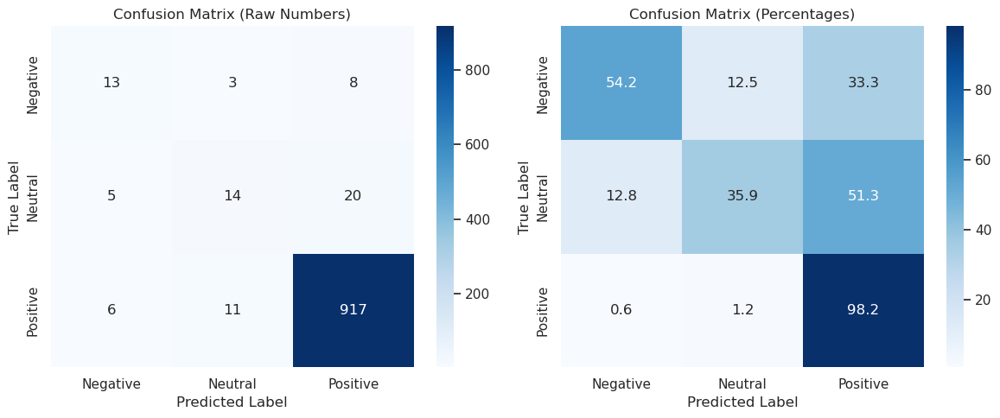


Measuring Performance Metrics...

Training Set Performance:
Starting pipeline evaluation...
Total test samples: 3932

Running Stage 1 predictions...
Generating embeddings for prediction...


Batches:   0%|          | 0/123 [00:00<?, ?it/s]


Running Stage 2 predictions...
Processed 100/3932 samples
Processed 200/3932 samples
Processed 300/3932 samples
Processed 400/3932 samples
Processed 500/3932 samples
Processed 600/3932 samples
Processed 700/3932 samples
Processed 800/3932 samples
Processed 900/3932 samples
Processed 1000/3932 samples
Processed 1100/3932 samples
Processed 1200/3932 samples
Processed 1300/3932 samples
Processed 1400/3932 samples
Processed 1500/3932 samples
Processed 1600/3932 samples
Processed 1700/3932 samples
Processed 1800/3932 samples
Processed 1900/3932 samples
Processed 2000/3932 samples
Processed 2100/3932 samples
Processed 2200/3932 samples
Processed 2300/3932 samples
Processed 2400/3932 samples
Processed 2500/3932 samples
Processed 2600/3932 samples
Processed 2700/3932 samples
Processed 2800/3932 samples
Processed 2900/3932 samples
Processed 3000/3932 samples
Processed 3100/3932 samples
Processed 3200/3932 samples
Processed 3300/3932 samples
Processed 3400/3932 samples
Processed 3500/3932 sampl

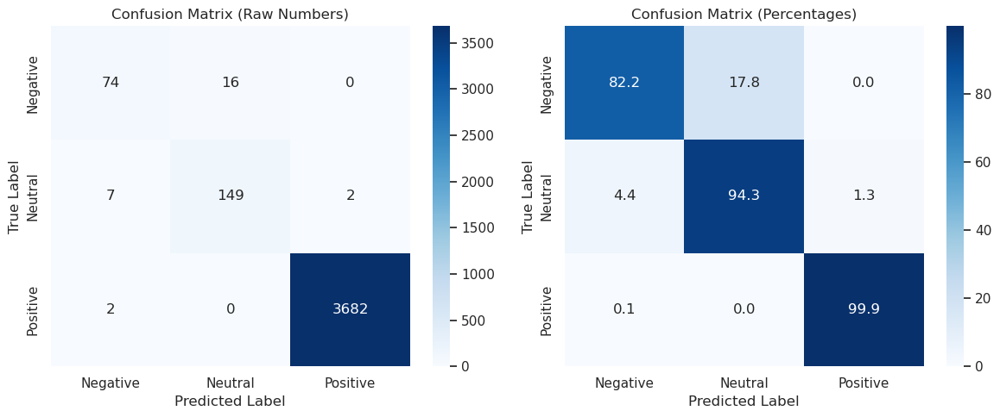

total_inference_time: 2.8082 seconds
average_time_per_sample: 0.0007 seconds
samples_per_second: 1400.16
memory_usage_mb: 16.23 MB
batch_size: 32.00

Test Set Performance:
Starting pipeline evaluation...
Total test samples: 997

Running Stage 1 predictions...
Generating embeddings for prediction...


Batches:   0%|          | 0/32 [00:00<?, ?it/s]


Running Stage 2 predictions...
Processed 100/997 samples
Processed 200/997 samples
Processed 300/997 samples
Processed 400/997 samples
Processed 500/997 samples
Processed 600/997 samples
Processed 700/997 samples
Processed 800/997 samples
Processed 900/997 samples

Test predictions have been added to df_test and saved as 'sentiment_test_model_9.csv'

Prediction counts:
Positive    945
Neutral      33
Negative     19
Name: count, dtype: int64

True label counts:
Positive    934
Neutral      39
Negative     24
Name: count, dtype: int64

Final Classification Report:
              precision    recall  f1-score   support

    Negative       0.53      0.42      0.47        24
     Neutral       0.45      0.38      0.42        39
    Positive       0.97      0.98      0.98       934

    accuracy                           0.94       997
   macro avg       0.65      0.59      0.62       997
weighted avg       0.94      0.94      0.94       997


=== Analyzing Misclassifications ===
Total samp

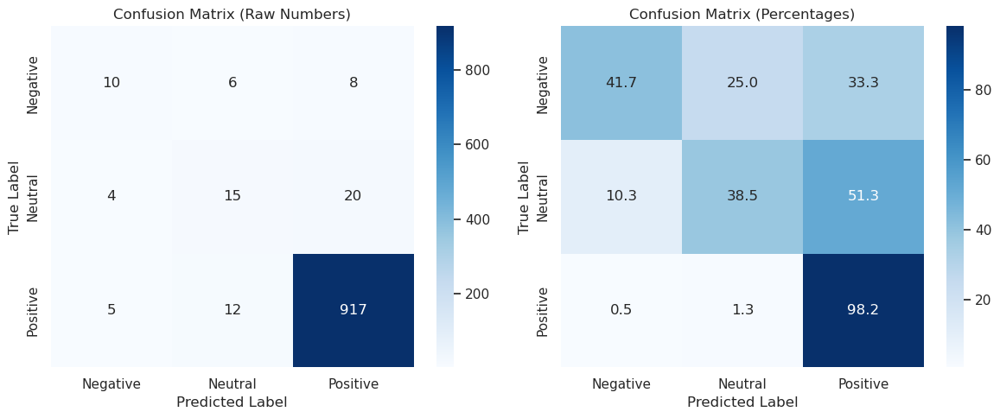

total_inference_time: 0.8551 seconds
average_time_per_sample: 0.0009 seconds
samples_per_second: 1165.91
memory_usage_mb: 0.77 MB
batch_size: 32.00

Model Complexity Metrics:
trainable_parameters: 592,900
total_parameters: 592,900
model_size_mb: 2.30 MB
model_type: Dual Autoencoder with Hierarchical Classification


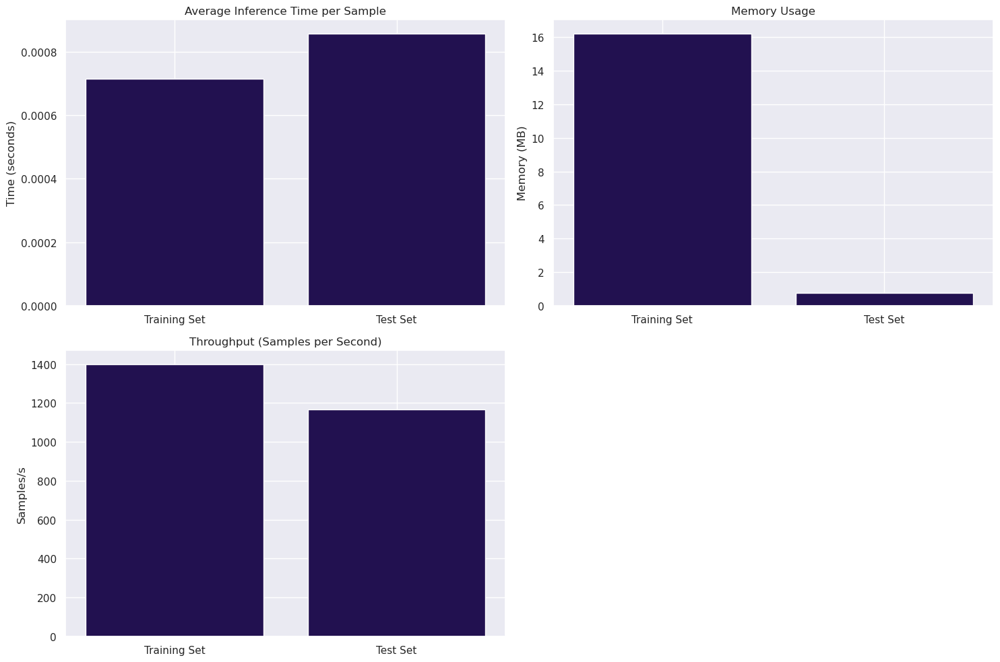


Performance metrics have been saved to 'model9_performance_metrics.csv'

Comprehensive Model Summary:
Model: Model 9 (Dual Autoencoder with Hierarchical Classification)
Total Parameters: 592,900
Trainable Parameters: 592,900
Model Size: 2.30 MB
Average Inference Time: 0.0009 seconds per sample
Throughput: 1165.91 samples/second
Memory Usage: 0.77 MB


In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sentence_transformers import SentenceTransformer
from tqdm.auto import tqdm
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the test set with previous models' predictions
df_test = pd.read_csv('sentiment_test_model_8.csv')


class CustomDataset(Dataset):
    def __init__(self, embeddings):
        self.embeddings = torch.FloatTensor(embeddings)
    
    def __len__(self):
        return len(self.embeddings)
    
    def __getitem__(self, idx):
        return self.embeddings[idx]

class SentimentDataset(Dataset):
    def __init__(self, features, labels):
        self.features = torch.FloatTensor(features)
        self.labels = torch.LongTensor(labels)
    
    def __len__(self):
        return len(self.labels)
    
    def __getitem__(self, idx):
        return {
            'features': self.features[idx],
            'labels': self.labels[idx]
        }

class Autoencoder(nn.Module):
    def __init__(self, input_dim, encoding_dim=64):
        super(Autoencoder, self).__init__()
        
        # Encoder
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 256),
            nn.ReLU(),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Linear(128, encoding_dim),
        )
        
        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(encoding_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 256),
            nn.ReLU(),
            nn.Linear(256, input_dim),
        )
    
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded
    
    def encode(self, x):
        return self.encoder(x)
# Stage 1: Binary Classification (Positive vs Rest)
class BinaryClassifier(nn.Module):
    def __init__(self, input_size, hidden_size=128):
        super(BinaryClassifier, self).__init__()
        
        self.model = nn.Sequential(
            nn.Linear(input_size, hidden_size),
            nn.ReLU(),
            nn.Dropout(0.3),
            
            nn.Linear(hidden_size, hidden_size//2),
            nn.ReLU(),
            nn.Dropout(0.3),
            
            nn.Linear(hidden_size//2, 2)
        )
    
    def forward(self, x):
        return self.model(x)

# Stage 2: Secondary Classification (Negative vs Neutral)
class SecondaryClassifier(nn.Module):
    def __init__(self, input_size, hidden_size=128):
        super(SecondaryClassifier, self).__init__()
        
        self.model = nn.Sequential(
            nn.Linear(input_size, hidden_size),
            nn.ReLU(),
            nn.Dropout(0.3),
            
            nn.Linear(hidden_size, hidden_size//2),
            nn.ReLU(),
            nn.Dropout(0.3),
            
            nn.Linear(hidden_size//2, 2)
        )
    
    def forward(self, x):
        return self.model(x)

def train_autoencoder(model, train_loader, num_epochs, device):
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    
    model.train()
    for epoch in range(num_epochs):
        total_loss = 0
        progress_bar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}')
        for batch in progress_bar:
            batch = batch.to(device)
            
            outputs = model(batch)
            loss = criterion(outputs, batch)
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            total_loss += loss.item()
            progress_bar.set_postfix({'loss': f'{loss.item():.4f}'})
        
        avg_loss = total_loss / len(train_loader)
        print(f'Epoch [{epoch+1}/{num_epochs}], Average Loss: {avg_loss:.4f}')

def train_classifier(model, features, labels, num_epochs=20):
    """
    Modified training function to train on entire dataset without validation split
    """
    # Convert data to PyTorch dataset
    dataset = SentimentDataset(features, labels)
    dataloader = DataLoader(dataset, batch_size=32, shuffle=True)
    
    # Loss and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.AdamW(model.parameters(), lr=0.001)
    
    # Training loop
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0
        all_preds = []
        all_labels = []
        
        for batch in tqdm(dataloader, desc=f'Epoch {epoch+1}/{num_epochs}'):
            features = batch['features'].to(device)
            labels = batch['labels'].to(device)
            
            optimizer.zero_grad()
            outputs = model(features)
            loss = criterion(outputs, labels)
            
            loss.backward()
            optimizer.step()
            
            total_loss += loss.item()
            
            _, predictions = torch.max(outputs, 1)
            all_preds.extend(predictions.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
        
        # Print epoch results
        print(f"\nEpoch {epoch+1} Results:")
        print(f"Training Loss: {total_loss/len(dataloader):.4f}")
        print("\nTraining Metrics:")
        print(classification_report(all_labels, all_preds))

    return model
def train_stage_1(df_train):
    """
    Stage 1: Positive-focused Autoencoder + Binary Classifier
    """
    print("Starting Stage 1: Positive vs Rest...")
    
    # Separate Positive and Rest samples
    positive_mask = df_train['sentiment'] == 'Positive'
    positive_texts = df_train[positive_mask]['combined_review_cleaned'].values
    rest_texts = df_train[~positive_mask]['combined_review_cleaned'].values
    
    # Initialize SBERT
    sbert_model = SentenceTransformer('all-MiniLM-L6-v2')
    
    # Generate embeddings
    print("Generating embeddings for positive reviews...")
    positive_embeddings = sbert_model.encode(positive_texts, show_progress_bar=True)
    print("Generating embeddings for rest reviews...")
    rest_embeddings = sbert_model.encode(rest_texts, show_progress_bar=True)
    
    # Standardize embeddings
    scaler = StandardScaler()
    positive_embeddings_scaled = scaler.fit_transform(positive_embeddings)
    rest_embeddings_scaled = scaler.transform(rest_embeddings)
    
    # Create dataset and dataloader for positive samples
    positive_dataset = CustomDataset(positive_embeddings_scaled)
    positive_loader = DataLoader(positive_dataset, batch_size=32, shuffle=True)
    
    # Initialize and train autoencoder
    input_dim = positive_embeddings.shape[1]
    autoencoder = Autoencoder(input_dim).to(device)
    print("\nTraining autoencoder on positive samples...")
    train_autoencoder(autoencoder, positive_loader, num_epochs=30, device=device)
    
    # Generate encoded representations
    print("\nGenerating encoded representations...")
    autoencoder.eval()
    with torch.no_grad():
        # Encode all samples
        all_embeddings = np.vstack([positive_embeddings_scaled, rest_embeddings_scaled])
        all_embeddings_tensor = torch.FloatTensor(all_embeddings).to(device)
        all_encoded = autoencoder.encode(all_embeddings_tensor).cpu().numpy()
    
    # Prepare binary labels
    binary_labels = np.concatenate([
        np.ones(len(positive_texts)),  # Positive class = 1
        np.zeros(len(rest_texts))      # Rest class = 0
    ])
    
    return all_encoded, binary_labels, autoencoder, sbert_model, scaler

def train_stage_2(df_train, stage1_predictions):
    """
    Stage 2: Neutral-focused Autoencoder + Binary Classifier
    """
    print("Starting Stage 2: Neutral vs Negative...")
    
    # Get samples predicted as 'Rest' from Stage 1
    rest_mask = stage1_predictions == 0
    df_rest = df_train[rest_mask]
    
    # Separate Neutral and Negative samples
    neutral_mask = df_rest['sentiment'] == 'Neutral'
    neutral_texts = df_rest[neutral_mask]['combined_review_cleaned'].values
    negative_texts = df_rest[~neutral_mask]['combined_review_cleaned'].values
    
    # Initialize SBERT
    sbert_model = SentenceTransformer('all-MiniLM-L6-v2')
    
    # Generate embeddings
    print("Generating embeddings for neutral reviews...")
    neutral_embeddings = sbert_model.encode(neutral_texts, show_progress_bar=True)
    print("Generating embeddings for negative reviews...")
    negative_embeddings = sbert_model.encode(negative_texts, show_progress_bar=True)
    
    # Standardize embeddings
    scaler = StandardScaler()
    neutral_embeddings_scaled = scaler.fit_transform(neutral_embeddings)
    negative_embeddings_scaled = scaler.transform(negative_embeddings)
    
    # Create dataset and dataloader for neutral samples
    neutral_dataset = CustomDataset(neutral_embeddings_scaled)
    neutral_loader = DataLoader(neutral_dataset, batch_size=32, shuffle=True)
    
    # Initialize and train autoencoder
    input_dim = neutral_embeddings.shape[1]
    autoencoder = Autoencoder(input_dim).to(device)
    print("\nTraining autoencoder on neutral samples...")
    train_autoencoder(autoencoder, neutral_loader, num_epochs=30, device=device)
    
    # Generate encoded representations
    print("\nGenerating encoded representations...")
    autoencoder.eval()
    with torch.no_grad():
        all_embeddings = np.vstack([neutral_embeddings_scaled, negative_embeddings_scaled])
        all_embeddings_tensor = torch.FloatTensor(all_embeddings).to(device)
        all_encoded = autoencoder.encode(all_embeddings_tensor).cpu().numpy()
    
    # Prepare binary labels
    binary_labels = np.concatenate([
        np.ones(len(neutral_texts)),    # Neutral class = 1
        np.zeros(len(negative_texts))   # Negative class = 0
    ])
    
    return all_encoded, binary_labels, autoencoder, sbert_model, scaler

def predict_stage1(classifier, autoencoder, sbert, scaler, data):
    """Make prediction for stage 1"""
    try:
        if isinstance(data, pd.DataFrame):
            texts = data['combined_review_cleaned'].values
        else:
            texts = data if isinstance(data, list) else [data]
        
        # Generate embeddings
        print("Generating embeddings for prediction...")
        embeddings = sbert.encode(texts, show_progress_bar=True)
        
        # Scale embeddings
        embeddings_scaled = scaler.transform(embeddings)
        
        # Convert to tensor
        embeddings_tensor = torch.FloatTensor(embeddings_scaled).to(device)
        
        # Get encoded representation and predictions
        classifier.eval()
        with torch.no_grad():
            encoded = autoencoder.encode(embeddings_tensor)
            outputs = classifier(encoded)
            _, predicted = torch.max(outputs, 1)
        
        return predicted.cpu().numpy()
    
    except Exception as e:
        print(f"Error in stage 1 prediction: {str(e)}")
        print(f"Input shape: {texts.shape if hasattr(texts, 'shape') else len(texts)}")
        raise
def analyze_misclassifications(true_labels, predicted_labels, texts, n_samples=10):
    """
    Analyze and display misclassifications with examples
    """
    results_df = pd.DataFrame({
        'text': texts,
        'true_label': true_labels,
        'predicted_label': predicted_labels
    })
    
    misclassified = results_df[results_df['true_label'] != results_df['predicted_label']]
    
    print(f"Total samples: {len(results_df)}")
    print(f"Total misclassifications: {len(misclassified)}")
    print(f"Accuracy: {(1 - len(misclassified)/len(results_df))*100:.2f}%\n")
    
    for true_label in ['Positive', 'Negative', 'Neutral']:
        print(f"\n=== Misclassified {true_label} Reviews ===")
        true_label_misc = misclassified[misclassified['true_label'] == true_label]
        print(f"Total misclassified {true_label} reviews: {len(true_label_misc)}")
        
        if len(true_label_misc) > 0:
            print(f"\nShowing {min(n_samples, len(true_label_misc))} examples:")
            for idx, row in true_label_misc.head(n_samples).iterrows():
                print("\nReview:", row['text'][:200], "..." if len(row['text']) > 200 else "")
                print(f"True Label: {row['true_label']}")
                print(f"Predicted Label: {row['predicted_label']}")
                print("-" * 80)
    
    # Plot confusion matrices
    cm = confusion_matrix(true_labels, predicted_labels)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100
    
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Negative', 'Neutral', 'Positive'],
                yticklabels=['Negative', 'Neutral', 'Positive'])
    plt.title('Confusion Matrix (Raw Numbers)')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    
    plt.subplot(1, 2, 2)
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=['Negative', 'Neutral', 'Positive'],
                yticklabels=['Negative', 'Neutral', 'Positive'])
    plt.title('Confusion Matrix (Percentages)')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    
    plt.tight_layout()
    plt.show()
    
    return misclassified

def evaluate_pipeline(df_test, 
                     stage1_classifier, stage2_classifier,
                     autoencoder1, autoencoder2,
                     sbert1, sbert2,
                     scaler1, scaler2):
    """Evaluate the complete pipeline"""
    try:
        print("Starting pipeline evaluation...")
        predictions = []
        texts = df_test['combined_review_cleaned'].values
        true_labels = df_test['sentiment'].values
        
        print(f"Total test samples: {len(texts)}")
        
        # Stage 1: Predict Positive vs Rest
        print("\nRunning Stage 1 predictions...")
        stage1_preds = predict_stage1(stage1_classifier, autoencoder1, sbert1, scaler1, df_test)
        
        # Stage 2: Process non-positive predictions
        print("\nRunning Stage 2 predictions...")
        for i, (text, stage1_pred) in enumerate(zip(texts, stage1_preds)):
            if stage1_pred == 1:
                predictions.append("Positive")
            else:
                # Create embedding for single text
                embedding = sbert2.encode([text])
                embedding_scaled = scaler2.transform(embedding)
                embedding_tensor = torch.FloatTensor(embedding_scaled).to(device)
                
                # Get stage 2 prediction
                with torch.no_grad():
                    encoded = autoencoder2.encode(embedding_tensor)
                    outputs = stage2_classifier(encoded)
                    _, predicted = torch.max(outputs, 1)
                    stage2_pred = predicted.cpu().numpy()[0]
                
                predictions.append("Neutral" if stage2_pred == 1 else "Negative")
            
            if (i + 1) % 100 == 0:
                print(f"Processed {i + 1}/{len(texts)} samples")
        
        predictions = np.array(predictions)

        # Add new predictions to df_test and save
        df_test['predicted_sentiment_model_9'] = predictions
        df_test.to_csv('sentiment_test_model_9.csv', index=False)
        print("\nTest predictions have been added to df_test and saved as 'sentiment_test_model_9.csv'")
        
        print("\nPrediction counts:")
        print(pd.Series(predictions).value_counts())
        
        print("\nTrue label counts:")
        print(pd.Series(true_labels).value_counts())
        
        print("\nFinal Classification Report:")
        print(classification_report(true_labels, predictions))
    
        print("\n=== Analyzing Misclassifications ===")
        misclassified = analyze_misclassifications(
            true_labels,
            predictions,
            texts,
            n_samples=10
        )
        
        misclassified.to_csv('misclassifications.csv', index=False)
        return predictions
        
    except Exception as e:
        print(f"Error in pipeline evaluation: {str(e)}")
        print(f"Predictions length: {len(predictions) if 'predictions' in locals() else 'not created'}")
        print(f"True labels length: {len(true_labels)}")
        raise


def main():
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    # Stage 1: Positive vs Rest
    print("=== Stage 1: Positive vs Rest Classification ===")
    encoded_stage1, labels_stage1, autoencoder1, sbert1, scaler1 = train_stage_1(df_train)
    
    # Train Stage 1 classifier on full dataset
    stage1_classifier = BinaryClassifier(input_size=encoded_stage1.shape[1]).to(device)
    train_classifier(stage1_classifier, encoded_stage1, labels_stage1)
    
    # Get predictions for Stage 2
    stage1_preds = predict_stage1(stage1_classifier, autoencoder1, sbert1, scaler1, df_train)
    
    # Stage 2: Neutral vs Negative
    print("\n=== Stage 2: Neutral vs Negative Classification ===")
    encoded_stage2, labels_stage2, autoencoder2, sbert2, scaler2 = train_stage_2(df_train, stage1_preds)
    
    # Train Stage 2 classifier on full dataset
    stage2_classifier = BinaryClassifier(input_size=encoded_stage2.shape[1]).to(device)
    train_classifier(stage2_classifier, encoded_stage2, labels_stage2)
    
    # Evaluate on test set
    if 'df_test' in globals():
        evaluate_pipeline(df_test, 
                        stage1_classifier, stage2_classifier,
                        autoencoder1, autoencoder2,
                        sbert1, sbert2,
                        scaler1, scaler2)

    # Performance Metrics Evaluation
    print("\nMeasuring Performance Metrics...")
    
    # Prepare pipeline components
    pipeline_components = (
        stage1_classifier, stage2_classifier,
        autoencoder1, autoencoder2,
        sbert1, sbert2,
        scaler1, scaler2
    )
    
    models = (stage1_classifier, stage2_classifier, autoencoder1, autoencoder2)
    
    # Define metrics measurement functions
    def measure_inference_metrics(pipeline_components, data, batch_size=32):
        """
        Measure inference metrics for the complete pipeline
        """
        stage1_classifier, stage2_classifier, autoencoder1, autoencoder2, sbert1, sbert2, scaler1, scaler2 = pipeline_components
        
        # Memory usage before inference
        process = psutil.Process(os.getpid())
        memory_before = process.memory_info().rss / 1024 / 1024  # Convert to MB
        
        # Measure inference time
        start_time = time.time()
        predictions = evaluate_pipeline(data, 
                                     stage1_classifier, stage2_classifier,
                                     autoencoder1, autoencoder2,
                                     sbert1, sbert2,
                                     scaler1, scaler2)
        end_time = time.time()
        
        # Memory usage after inference
        memory_after = process.memory_info().rss / 1024 / 1024  # Convert to MB
        
        # Calculate metrics
        total_time = end_time - start_time
        samples = len(data)
        avg_time_per_sample = total_time / samples
        memory_used = memory_after - memory_before
        
        return {
            'total_inference_time': total_time,
            'average_time_per_sample': avg_time_per_sample,
            'samples_per_second': samples / total_time,
            'memory_usage_mb': memory_used,
            'batch_size': batch_size
        }

    def get_model_complexity(models):
        """
        Get complexity metrics for all models in the pipeline
        """
        stage1_classifier, stage2_classifier, autoencoder1, autoencoder2 = models
        
        def count_parameters(model):
            return sum(p.numel() for p in model.parameters())
        
        def count_trainable_parameters(model):
            return sum(p.numel() for p in model.parameters() if p.requires_grad)
        
        total_params = (count_parameters(stage1_classifier) + 
                       count_parameters(stage2_classifier) + 
                       count_parameters(autoencoder1) + 
                       count_parameters(autoencoder2))
        
        trainable_params = (count_trainable_parameters(stage1_classifier) + 
                           count_trainable_parameters(stage2_classifier) + 
                           count_trainable_parameters(autoencoder1) + 
                           count_trainable_parameters(autoencoder2))
        
        # Save models first to get model size
        torch.save({
            'stage1_classifier': stage1_classifier.state_dict(),
            'stage2_classifier': stage2_classifier.state_dict(),
            'autoencoder1': autoencoder1.state_dict(),
            'autoencoder2': autoencoder2.state_dict(),
            'scaler1': scaler1,
            'scaler2': scaler2
        }, 'sentiment_pipeline_model9.pt')
        
        model_size = os.path.getsize('sentiment_pipeline_model9.pt') / (1024 * 1024)  # Convert to MB
        
        return {
            'trainable_parameters': trainable_params,
            'total_parameters': total_params,
            'model_size_mb': model_size,
            'model_type': 'Dual Autoencoder with Hierarchical Classification'
        }

    # Measure training set performance
    print("\nTraining Set Performance:")
    train_metrics = measure_inference_metrics(pipeline_components, df_train)
    for metric, value in train_metrics.items():
        if 'time' in metric:
            print(f"{metric}: {value:.4f} seconds")
        elif 'memory' in metric:
            print(f"{metric}: {value:.2f} MB")
        else:
            print(f"{metric}: {value:.2f}")

    # Measure test set performance
    print("\nTest Set Performance:")
    test_metrics = measure_inference_metrics(pipeline_components, df_test)
    for metric, value in test_metrics.items():
        if 'time' in metric:
            print(f"{metric}: {value:.4f} seconds")
        elif 'memory' in metric:
            print(f"{metric}: {value:.2f} MB")
        else:
            print(f"{metric}: {value:.2f}")

    # Get model complexity metrics
    print("\nModel Complexity Metrics:")
    complexity_metrics = get_model_complexity(models)
    for metric, value in complexity_metrics.items():
        if isinstance(value, str):
            print(f"{metric}: {value}")
        elif 'size' in metric:
            print(f"{metric}: {value:.2f} MB")
        else:
            print(f"{metric}: {value:,}")

    # Visualize performance metrics
    plt.figure(figsize=(15,10))

    # Inference time comparison
    plt.subplot(2,2,1)
    metrics_data = [train_metrics['average_time_per_sample'], test_metrics['average_time_per_sample']]
    plt.bar(['Training Set', 'Test Set'], metrics_data)
    plt.title('Average Inference Time per Sample')
    plt.ylabel('Time (seconds)')

    # Memory usage comparison
    plt.subplot(2,2,2)
    memory_data = [train_metrics['memory_usage_mb'], test_metrics['memory_usage_mb']]
    plt.bar(['Training Set', 'Test Set'], memory_data)
    plt.title('Memory Usage')
    plt.ylabel('Memory (MB)')

    # Throughput comparison
    plt.subplot(2,2,3)
    throughput_data = [train_metrics['samples_per_second'], test_metrics['samples_per_second']]
    plt.bar(['Training Set', 'Test Set'], throughput_data)
    plt.title('Throughput (Samples per Second)')
    plt.ylabel('Samples/s')

    plt.tight_layout()
    plt.savefig('model9_performance_metrics.png')
    plt.show()

    # Store all metrics
    performance_metrics = {
        'model9': {
            'train': train_metrics,
            'test': test_metrics,
            'complexity': complexity_metrics,
            'model_architecture': 'Dual Autoencoder with Hierarchical Classification',
        }
    }

    # Create metrics DataFrame
    metrics_df = pd.DataFrame({
        'Model': ['model9'],
        'Architecture': [performance_metrics['model9']['model_architecture']],
        'Training Time per Sample (s)': [train_metrics['average_time_per_sample']],
        'Test Time per Sample (s)': [test_metrics['average_time_per_sample']],
        'Training Memory (MB)': [train_metrics['memory_usage_mb']],
        'Test Memory (MB)': [test_metrics['memory_usage_mb']],
        'Model Size (MB)': [complexity_metrics['model_size_mb']],
        'Total Parameters': [complexity_metrics['total_parameters']],
        'Trainable Parameters': [complexity_metrics['trainable_parameters']],
        'Throughput (samples/s)': [test_metrics['samples_per_second']]
    })

    # Save metrics
    metrics_df.to_csv('model9_performance_metrics.csv', index=False)
    print("\nPerformance metrics have been saved to 'model9_performance_metrics.csv'")

    # Print comprehensive summary
    print("\nComprehensive Model Summary:")
    print("=" * 50)
    print(f"Model: Model 9 (Dual Autoencoder with Hierarchical Classification)")
    print(f"Total Parameters: {complexity_metrics['total_parameters']:,}")
    print(f"Trainable Parameters: {complexity_metrics['trainable_parameters']:,}")
    print(f"Model Size: {complexity_metrics['model_size_mb']:.2f} MB")
    print(f"Average Inference Time: {test_metrics['average_time_per_sample']:.4f} seconds per sample")
    print(f"Throughput: {test_metrics['samples_per_second']:.2f} samples/second")
    print(f"Memory Usage: {test_metrics['memory_usage_mb']:.2f} MB")

if __name__ == "__main__":
    torch.manual_seed(42)
    np.random.seed(42)
    
    if 'df_train' not in globals():
        raise ValueError("Please load your training data into df_train before running")
    
    main()




# def main():
#     device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
#     # Stage 1: Positive vs Rest
#     print("=== Stage 1: Positive vs Rest Classification ===")
#     encoded_stage1, labels_stage1, autoencoder1, sbert1, scaler1 = train_stage_1(df_train)
    
#     # Train Stage 1 classifier on full dataset
#     stage1_classifier = BinaryClassifier(input_size=encoded_stage1.shape[1]).to(device)
#     train_classifier(stage1_classifier, encoded_stage1, labels_stage1)
    
#     # Get predictions for Stage 2
#     stage1_preds = predict_stage1(stage1_classifier, autoencoder1, sbert1, scaler1, df_train)
    
#     # Stage 2: Neutral vs Negative
#     print("\n=== Stage 2: Neutral vs Negative Classification ===")
#     encoded_stage2, labels_stage2, autoencoder2, sbert2, scaler2 = train_stage_2(df_train, stage1_preds)
    
#     # Train Stage 2 classifier on full dataset
#     stage2_classifier = BinaryClassifier(input_size=encoded_stage2.shape[1]).to(device)
#     train_classifier(stage2_classifier, encoded_stage2, labels_stage2)
    
#     # Save models and components
#     torch.save({
#         'stage1_classifier': stage1_classifier.state_dict(),
#         'stage2_classifier': stage2_classifier.state_dict(),
#         'autoencoder1': autoencoder1.state_dict(),
#         'autoencoder2': autoencoder2.state_dict(),
#         'scaler1': scaler1,
#         'scaler2': scaler2
#     }, 'sentiment_pipeline_model9.pt')
    
#     # Evaluate on test set
#     if 'df_test' in globals():
#         evaluate_pipeline(df_test, 
#                         stage1_classifier, stage2_classifier,
#                         autoencoder1, autoencoder2,
#                         sbert1, sbert2,
#                         scaler1, scaler2)

# if __name__ == "__main__":
#     torch.manual_seed(42)
#     np.random.seed(42)
    
#     if 'df_train' not in globals():
#         raise ValueError("Please load your training data into df_train before running")
    
#     main()
# Performance Metrics Evaluation
# import time
# import psutil
# import os
# from memory_profiler import profile

# def measure_inference_metrics(pipeline_components, data, batch_size=32):
#     """
#     Measure inference metrics for the complete pipeline
#     """
#     stage1_classifier, stage2_classifier, autoencoder1, autoencoder2, sbert1, sbert2, scaler1, scaler2 = pipeline_components
    
#     # Memory usage before inference
#     process = psutil.Process(os.getpid())
#     memory_before = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
#     # Warm-up run
#     _ = evaluate_pipeline(data[:batch_size], 
#                          stage1_classifier, stage2_classifier,
#                          autoencoder1, autoencoder2,
#                          sbert1, sbert2,
#                          scaler1, scaler2)
    
#     # Measure inference time
#     start_time = time.time()
#     predictions = evaluate_pipeline(data, 
#                                  stage1_classifier, stage2_classifier,
#                                  autoencoder1, autoencoder2,
#                                  sbert1, sbert2,
#                                  scaler1, scaler2)
#     end_time = time.time()
    
#     # Memory usage after inference
#     memory_after = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
#     # Calculate metrics
#     total_time = end_time - start_time
#     samples = len(data)
#     avg_time_per_sample = total_time / samples
#     memory_used = memory_after - memory_before
    
#     return {
#         'total_inference_time': total_time,
#         'average_time_per_sample': avg_time_per_sample,
#         'samples_per_second': samples / total_time,
#         'memory_usage_mb': memory_used,
#         'batch_size': batch_size
#     }

# def get_model_complexity(models):
#     """
#     Get complexity metrics for all models in the pipeline
#     """
#     stage1_classifier, stage2_classifier, autoencoder1, autoencoder2 = models
    
#     def count_parameters(model):
#         return sum(p.numel() for p in model.parameters())
    
#     def count_trainable_parameters(model):
#         return sum(p.numel() for p in model.parameters() if p.requires_grad)
    
#     total_params = (count_parameters(stage1_classifier) + 
#                    count_parameters(stage2_classifier) + 
#                    count_parameters(autoencoder1) + 
#                    count_parameters(autoencoder2))
    
#     trainable_params = (count_trainable_parameters(stage1_classifier) + 
#                        count_trainable_parameters(stage2_classifier) + 
#                        count_trainable_parameters(autoencoder1) + 
#                        count_trainable_parameters(autoencoder2))
    
#     model_size = os.path.getsize('sentiment_pipeline_model9.pt') / (1024 * 1024)  # Convert to MB
    
#     return {
#         'trainable_parameters': trainable_params,
#         'total_parameters': total_params,
#         'model_size_mb': model_size,
#         'model_type': 'Dual Autoencoder with Hierarchical Classification'
#     }

# # Add this to your main() function or after model training
# print("\nMeasuring Performance Metrics...")

# # Prepare pipeline components
# pipeline_components = (
#     stage1_classifier, stage2_classifier,
#     autoencoder1, autoencoder2,
#     sbert1, sbert2,
#     scaler1, scaler2
# )

# models = (stage1_classifier, stage2_classifier, autoencoder1, autoencoder2)

# # Measure training set performance
# print("\nTraining Set Performance:")
# train_metrics = measure_inference_metrics(pipeline_components, df_train)
# for metric, value in train_metrics.items():
#     if 'time' in metric:
#         print(f"{metric}: {value:.4f} seconds")
#     elif 'memory' in metric:
#         print(f"{metric}: {value:.2f} MB")
#     else:
#         print(f"{metric}: {value:.2f}")

# # Measure test set performance
# print("\nTest Set Performance:")
# test_metrics = measure_inference_metrics(pipeline_components, df_test)
# for metric, value in test_metrics.items():
#     if 'time' in metric:
#         print(f"{metric}: {value:.4f} seconds")
#     elif 'memory' in metric:
#         print(f"{metric}: {value:.2f} MB")
#     else:
#         print(f"{metric}: {value:.2f}")

# # Get model complexity metrics
# print("\nModel Complexity Metrics:")
# complexity_metrics = get_model_complexity(models)
# for metric, value in complexity_metrics.items():
#     if isinstance(value, str):
#         print(f"{metric}: {value}")
#     elif 'size' in metric:
#         print(f"{metric}: {value:.2f} MB")
#     else:
#         print(f"{metric}: {value:,}")

# # Visualize performance metrics
# plt.figure(figsize=(15,10))

# # Inference time comparison
# plt.subplot(2,2,1)
# metrics_data = [train_metrics['average_time_per_sample'], test_metrics['average_time_per_sample']]
# plt.bar(['Training Set', 'Test Set'], metrics_data)
# plt.title('Average Inference Time per Sample')
# plt.ylabel('Time (seconds)')

# # Memory usage comparison
# plt.subplot(2,2,2)
# memory_data = [train_metrics['memory_usage_mb'], test_metrics['memory_usage_mb']]
# plt.bar(['Training Set', 'Test Set'], memory_data)
# plt.title('Memory Usage')
# plt.ylabel('Memory (MB)')

# # Throughput comparison
# plt.subplot(2,2,3)
# throughput_data = [train_metrics['samples_per_second'], test_metrics['samples_per_second']]
# plt.bar(['Training Set', 'Test Set'], throughput_data)
# plt.title('Throughput (Samples per Second)')
# plt.ylabel('Samples/s')

# plt.tight_layout()
# plt.savefig('model9_performance_metrics.png')
# plt.show()

# # Store all metrics
# performance_metrics = {
#     'model9': {
#         'train': train_metrics,
#         'test': test_metrics,
#         'complexity': complexity_metrics,
#         'model_architecture': 'Dual Autoencoder with Hierarchical Classification',
#     }
# }

# # Create detailed metrics DataFrame
# def create_metrics_df(metrics_dict):
#     data = {
#         'Model': [],
#         'Architecture': [],
#         'Training Time per Sample (s)': [],
#         'Test Time per Sample (s)': [],
#         'Training Memory (MB)': [],
#         'Test Memory (MB)': [],
#         'Model Size (MB)': [],
#         'Total Parameters': [],
#         'Trainable Parameters': [],
#         'Throughput (samples/s)': []
#     }
    
#     for model_name, metrics in metrics_dict.items():
#         data['Model'].append(model_name)
#         data['Architecture'].append(metrics['model_architecture'])
#         data['Training Time per Sample (s)'].append(metrics['train']['average_time_per_sample'])
#         data['Test Time per Sample (s)'].append(metrics['test']['average_time_per_sample'])
#         data['Training Memory (MB)'].append(metrics['train']['memory_usage_mb'])
#         data['Test Memory (MB)'].append(metrics['test']['memory_usage_mb'])
#         data['Model Size (MB)'].append(metrics['complexity']['model_size_mb'])
#         data['Total Parameters'].append(metrics['complexity']['total_parameters'])
#         data['Trainable Parameters'].append(metrics['complexity']['trainable_parameters'])
#         data['Throughput (samples/s)'].append(metrics['test']['samples_per_second'])
    
#     return pd.DataFrame(data)

# # Create and save metrics DataFrame
# metrics_df = create_metrics_df(performance_metrics)
# metrics_df.to_csv('model9_performance_metrics.csv', index=False)
# print("\nPerformance metrics have been saved to 'model9_performance_metrics.csv'")

# # Print comprehensive summary
# print("\nComprehensive Model Summary:")
# print("=" * 50)
# print(f"Model: Model 9 (Dual Autoencoder with Hierarchical Classification)")
# print(f"Total Parameters: {complexity_metrics['total_parameters']:,}")
# print(f"Trainable Parameters: {complexity_metrics['trainable_parameters']:,}")
# print(f"Model Size: {complexity_metrics['model_size_mb']:.2f} MB")
# print(f"Average Inference Time: {test_metrics['average_time_per_sample']:.4f} seconds per sample")
# print(f"Throughput: {test_metrics['samples_per_second']:.2f} samples/second")
# print(f"Memory Usage: {test_metrics['memory_usage_mb']:.2f} MB")


## 10. SBERT + Embeddings Scaling + Autoencoder + SMOTE + Simple Neural Network with 2 stage classification

Loading and preparing data...
=== Stage 1: Positive vs Rest Classification ===
Starting Stage 1: Positive vs Rest...
Generating embeddings for positive reviews...


Batches:   0%|          | 0/116 [00:00<?, ?it/s]

Generating embeddings for rest reviews...


Batches:   0%|          | 0/8 [00:00<?, ?it/s]


Training autoencoder on positive samples...


Epoch 1/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [1/80], Average Loss: 0.7500


Epoch 2/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [2/80], Average Loss: 0.5612


Epoch 3/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [3/80], Average Loss: 0.4892


Epoch 4/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [4/80], Average Loss: 0.4430


Epoch 5/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [5/80], Average Loss: 0.4121


Epoch 6/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [6/80], Average Loss: 0.3864


Epoch 7/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [7/80], Average Loss: 0.3678


Epoch 8/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [8/80], Average Loss: 0.3518


Epoch 9/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [9/80], Average Loss: 0.3374


Epoch 10/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [10/80], Average Loss: 0.3266


Epoch 11/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [11/80], Average Loss: 0.3167


Epoch 12/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [12/80], Average Loss: 0.3069


Epoch 13/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [13/80], Average Loss: 0.2997


Epoch 14/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [14/80], Average Loss: 0.2927


Epoch 15/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [15/80], Average Loss: 0.2865


Epoch 16/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [16/80], Average Loss: 0.2821


Epoch 17/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [17/80], Average Loss: 0.2760


Epoch 18/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [18/80], Average Loss: 0.2706


Epoch 19/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [19/80], Average Loss: 0.2669


Epoch 20/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [20/80], Average Loss: 0.2631


Epoch 21/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [21/80], Average Loss: 0.2583


Epoch 22/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [22/80], Average Loss: 0.2552


Epoch 23/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [23/80], Average Loss: 0.2520


Epoch 24/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [24/80], Average Loss: 0.2485


Epoch 25/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [25/80], Average Loss: 0.2442


Epoch 26/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [26/80], Average Loss: 0.2419


Epoch 27/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [27/80], Average Loss: 0.2406


Epoch 28/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [28/80], Average Loss: 0.2376


Epoch 29/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [29/80], Average Loss: 0.2349


Epoch 30/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [30/80], Average Loss: 0.2340


Epoch 31/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [31/80], Average Loss: 0.2304


Epoch 32/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [32/80], Average Loss: 0.2279


Epoch 33/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [33/80], Average Loss: 0.2260


Epoch 34/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [34/80], Average Loss: 0.2248


Epoch 35/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [35/80], Average Loss: 0.2252


Epoch 36/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [36/80], Average Loss: 0.2230


Epoch 37/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [37/80], Average Loss: 0.2206


Epoch 38/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [38/80], Average Loss: 0.2189


Epoch 39/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [39/80], Average Loss: 0.2181


Epoch 40/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [40/80], Average Loss: 0.2169


Epoch 41/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [41/80], Average Loss: 0.2165


Epoch 42/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [42/80], Average Loss: 0.2138


Epoch 43/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [43/80], Average Loss: 0.2125


Epoch 44/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [44/80], Average Loss: 0.2120


Epoch 45/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [45/80], Average Loss: 0.2104


Epoch 46/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [46/80], Average Loss: 0.2101


Epoch 47/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [47/80], Average Loss: 0.2083


Epoch 48/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [48/80], Average Loss: 0.2092


Epoch 49/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [49/80], Average Loss: 0.2066


Epoch 50/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [50/80], Average Loss: 0.2055


Epoch 51/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [51/80], Average Loss: 0.2050


Epoch 52/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [52/80], Average Loss: 0.2027


Epoch 53/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [53/80], Average Loss: 0.2010


Epoch 54/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [54/80], Average Loss: 0.2013


Epoch 55/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [55/80], Average Loss: 0.2017


Epoch 56/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [56/80], Average Loss: 0.1999


Epoch 57/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [57/80], Average Loss: 0.2005


Epoch 58/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [58/80], Average Loss: 0.2002


Epoch 59/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [59/80], Average Loss: 0.1996


Epoch 60/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [60/80], Average Loss: 0.1983


Epoch 61/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [61/80], Average Loss: 0.1970


Epoch 62/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [62/80], Average Loss: 0.1967


Epoch 63/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [63/80], Average Loss: 0.1949


Epoch 64/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [64/80], Average Loss: 0.1950


Epoch 65/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [65/80], Average Loss: 0.1947


Epoch 66/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [66/80], Average Loss: 0.1932


Epoch 67/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [67/80], Average Loss: 0.1928


Epoch 68/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [68/80], Average Loss: 0.1930


Epoch 69/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [69/80], Average Loss: 0.1922


Epoch 70/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [70/80], Average Loss: 0.1916


Epoch 71/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [71/80], Average Loss: 0.1920


Epoch 72/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [72/80], Average Loss: 0.1905


Epoch 73/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [73/80], Average Loss: 0.1900


Epoch 74/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [74/80], Average Loss: 0.1891


Epoch 75/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [75/80], Average Loss: 0.1878


Epoch 76/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [76/80], Average Loss: 0.1876


Epoch 77/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [77/80], Average Loss: 0.1880


Epoch 78/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [78/80], Average Loss: 0.1872


Epoch 79/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [79/80], Average Loss: 0.1892


Epoch 80/80:   0%|          | 0/116 [00:00<?, ?it/s]

Epoch [80/80], Average Loss: 0.1878

Generating encoded representations...
Original class distribution: {0: 248, 1: 3684}

Applying SMOTE to balance classes...
Class distribution after SMOTE: {0: 3684, 1: 3684}
Original data distribution: {0: 3684, 1: 3684}

Applying SMOTE to balance classes...
Class distribution after SMOTE: {0: 3684, 1: 3684}


Epoch 1/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 1 Results:
Training Loss: 0.3441

Training metrics:
              precision    recall  f1-score   support

           0       0.84      0.86      0.85      3684
           1       0.86      0.84      0.85      3684

    accuracy                           0.85      7368
   macro avg       0.85      0.85      0.85      7368
weighted avg       0.85      0.85      0.85      7368



Epoch 2/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 2 Results:
Training Loss: 0.1758

Training metrics:
              precision    recall  f1-score   support

           0       0.93      0.96      0.94      3684
           1       0.95      0.93      0.94      3684

    accuracy                           0.94      7368
   macro avg       0.94      0.94      0.94      7368
weighted avg       0.94      0.94      0.94      7368



Epoch 3/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 3 Results:
Training Loss: 0.1088

Training metrics:
              precision    recall  f1-score   support

           0       0.96      0.97      0.96      3684
           1       0.97      0.95      0.96      3684

    accuracy                           0.96      7368
   macro avg       0.96      0.96      0.96      7368
weighted avg       0.96      0.96      0.96      7368



Epoch 4/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 4 Results:
Training Loss: 0.0759

Training metrics:
              precision    recall  f1-score   support

           0       0.97      0.98      0.98      3684
           1       0.98      0.97      0.98      3684

    accuracy                           0.98      7368
   macro avg       0.98      0.98      0.98      7368
weighted avg       0.98      0.98      0.98      7368



Epoch 5/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 5 Results:
Training Loss: 0.0482

Training metrics:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      3684
           1       0.99      0.98      0.99      3684

    accuracy                           0.99      7368
   macro avg       0.99      0.99      0.99      7368
weighted avg       0.99      0.99      0.99      7368



Epoch 6/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 6 Results:
Training Loss: 0.0407

Training metrics:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      3684
           1       0.99      0.98      0.99      3684

    accuracy                           0.99      7368
   macro avg       0.99      0.99      0.99      7368
weighted avg       0.99      0.99      0.99      7368



Epoch 7/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 7 Results:
Training Loss: 0.0250

Training metrics:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      3684
           1       1.00      0.99      0.99      3684

    accuracy                           0.99      7368
   macro avg       0.99      0.99      0.99      7368
weighted avg       0.99      0.99      0.99      7368



Epoch 8/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 8 Results:
Training Loss: 0.0217

Training metrics:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      3684
           1       1.00      0.99      0.99      3684

    accuracy                           0.99      7368
   macro avg       0.99      0.99      0.99      7368
weighted avg       0.99      0.99      0.99      7368



Epoch 9/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 9 Results:
Training Loss: 0.0221

Training metrics:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      3684
           1       1.00      0.99      0.99      3684

    accuracy                           0.99      7368
   macro avg       0.99      0.99      0.99      7368
weighted avg       0.99      0.99      0.99      7368



Epoch 10/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 10 Results:
Training Loss: 0.0216

Training metrics:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      3684
           1       1.00      0.99      0.99      3684

    accuracy                           0.99      7368
   macro avg       0.99      0.99      0.99      7368
weighted avg       0.99      0.99      0.99      7368



Epoch 11/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 11 Results:
Training Loss: 0.0183

Training metrics:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      3684
           1       0.99      0.99      0.99      3684

    accuracy                           0.99      7368
   macro avg       0.99      0.99      0.99      7368
weighted avg       0.99      0.99      0.99      7368



Epoch 12/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 12 Results:
Training Loss: 0.0134

Training metrics:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      3684
           1       1.00      0.99      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 13/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 13 Results:
Training Loss: 0.0093

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 14/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 14 Results:
Training Loss: 0.0078

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 15/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 15 Results:
Training Loss: 0.0150

Training metrics:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      3684
           1       1.00      0.99      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 16/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 16 Results:
Training Loss: 0.0130

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 17/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 17 Results:
Training Loss: 0.0152

Training metrics:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      3684
           1       1.00      0.99      0.99      3684

    accuracy                           0.99      7368
   macro avg       0.99      0.99      0.99      7368
weighted avg       0.99      0.99      0.99      7368



Epoch 18/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 18 Results:
Training Loss: 0.0144

Training metrics:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      3684
           1       1.00      0.99      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 19/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 19 Results:
Training Loss: 0.0094

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 20/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 20 Results:
Training Loss: 0.0120

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 21/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 21 Results:
Training Loss: 0.0104

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 22/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 22 Results:
Training Loss: 0.0076

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 23/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 23 Results:
Training Loss: 0.0063

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 24/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 24 Results:
Training Loss: 0.0083

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 25/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 25 Results:
Training Loss: 0.0079

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 26/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 26 Results:
Training Loss: 0.0094

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 27/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 27 Results:
Training Loss: 0.0089

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 28/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 28 Results:
Training Loss: 0.0055

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 29/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 29 Results:
Training Loss: 0.0074

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 30/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 30 Results:
Training Loss: 0.0075

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 31/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 31 Results:
Training Loss: 0.0076

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 32/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 32 Results:
Training Loss: 0.0047

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 33/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 33 Results:
Training Loss: 0.0085

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 34/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 34 Results:
Training Loss: 0.0076

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 35/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 35 Results:
Training Loss: 0.0054

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 36/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 36 Results:
Training Loss: 0.0105

Training metrics:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      3684
           1       1.00      0.99      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 37/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 37 Results:
Training Loss: 0.0074

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 38/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 38 Results:
Training Loss: 0.0048

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 39/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 39 Results:
Training Loss: 0.0041

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 40/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 40 Results:
Training Loss: 0.0056

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 41/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 41 Results:
Training Loss: 0.0022

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 42/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 42 Results:
Training Loss: 0.0037

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 43/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 43 Results:
Training Loss: 0.0044

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 44/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 44 Results:
Training Loss: 0.0087

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 45/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 45 Results:
Training Loss: 0.0070

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 46/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 46 Results:
Training Loss: 0.0097

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 47/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 47 Results:
Training Loss: 0.0041

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 48/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 48 Results:
Training Loss: 0.0083

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 49/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 49 Results:
Training Loss: 0.0063

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 50/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 50 Results:
Training Loss: 0.0034

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 51/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 51 Results:
Training Loss: 0.0029

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 52/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 52 Results:
Training Loss: 0.0061

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 53/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 53 Results:
Training Loss: 0.0040

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 54/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 54 Results:
Training Loss: 0.0047

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 55/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 55 Results:
Training Loss: 0.0066

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 56/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 56 Results:
Training Loss: 0.0047

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 57/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 57 Results:
Training Loss: 0.0039

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 58/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 58 Results:
Training Loss: 0.0077

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 59/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 59 Results:
Training Loss: 0.0044

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 60/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 60 Results:
Training Loss: 0.0060

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 61/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 61 Results:
Training Loss: 0.0047

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 62/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 62 Results:
Training Loss: 0.0034

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 63/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 63 Results:
Training Loss: 0.0056

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 64/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 64 Results:
Training Loss: 0.0074

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 65/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 65 Results:
Training Loss: 0.0050

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 66/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 66 Results:
Training Loss: 0.0036

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 67/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 67 Results:
Training Loss: 0.0036

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 68/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 68 Results:
Training Loss: 0.0042

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 69/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 69 Results:
Training Loss: 0.0084

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 70/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 70 Results:
Training Loss: 0.0047

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 71/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 71 Results:
Training Loss: 0.0047

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 72/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 72 Results:
Training Loss: 0.0067

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 73/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 73 Results:
Training Loss: 0.0040

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 74/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 74 Results:
Training Loss: 0.0033

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 75/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 75 Results:
Training Loss: 0.0032

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 76/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 76 Results:
Training Loss: 0.0071

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 77/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 77 Results:
Training Loss: 0.0038

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 78/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 78 Results:
Training Loss: 0.0047

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 79/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 79 Results:
Training Loss: 0.0045

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368



Epoch 80/80:   0%|          | 0/231 [00:00<?, ?it/s]


Epoch 80 Results:
Training Loss: 0.0070

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3684
           1       1.00      1.00      1.00      3684

    accuracy                           1.00      7368
   macro avg       1.00      1.00      1.00      7368
weighted avg       1.00      1.00      1.00      7368

Generating embeddings for prediction...


Batches:   0%|          | 0/123 [00:00<?, ?it/s]


=== Stage 2: Neutral vs Negative Classification ===
Starting Stage 2: Neutral vs Negative...
Generating embeddings for neutral reviews...


Batches:   0%|          | 0/5 [00:00<?, ?it/s]

Generating embeddings for negative reviews...


Batches:   0%|          | 0/3 [00:00<?, ?it/s]


Training autoencoder on neutral samples...


Epoch 1/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [1/80], Average Loss: 1.0009


Epoch 2/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [2/80], Average Loss: 0.9903


Epoch 3/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [3/80], Average Loss: 0.9523


Epoch 4/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [4/80], Average Loss: 0.9040


Epoch 5/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [5/80], Average Loss: 0.8623


Epoch 6/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [6/80], Average Loss: 0.8220


Epoch 7/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [7/80], Average Loss: 0.7825


Epoch 8/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [8/80], Average Loss: 0.7515


Epoch 9/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [9/80], Average Loss: 0.7237


Epoch 10/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [10/80], Average Loss: 0.6980


Epoch 11/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [11/80], Average Loss: 0.6683


Epoch 12/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [12/80], Average Loss: 0.6397


Epoch 13/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [13/80], Average Loss: 0.6092


Epoch 14/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [14/80], Average Loss: 0.5806


Epoch 15/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [15/80], Average Loss: 0.5526


Epoch 16/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [16/80], Average Loss: 0.5262


Epoch 17/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [17/80], Average Loss: 0.5038


Epoch 18/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [18/80], Average Loss: 0.4813


Epoch 19/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [19/80], Average Loss: 0.4618


Epoch 20/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [20/80], Average Loss: 0.4422


Epoch 21/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [21/80], Average Loss: 0.4221


Epoch 22/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [22/80], Average Loss: 0.4034


Epoch 23/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [23/80], Average Loss: 0.3839


Epoch 24/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [24/80], Average Loss: 0.3668


Epoch 25/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [25/80], Average Loss: 0.3499


Epoch 26/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [26/80], Average Loss: 0.3340


Epoch 27/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [27/80], Average Loss: 0.3188


Epoch 28/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [28/80], Average Loss: 0.3038


Epoch 29/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [29/80], Average Loss: 0.2900


Epoch 30/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [30/80], Average Loss: 0.2759


Epoch 31/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [31/80], Average Loss: 0.2641


Epoch 32/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [32/80], Average Loss: 0.2521


Epoch 33/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [33/80], Average Loss: 0.2408


Epoch 34/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [34/80], Average Loss: 0.2305


Epoch 35/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [35/80], Average Loss: 0.2191


Epoch 36/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [36/80], Average Loss: 0.2090


Epoch 37/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [37/80], Average Loss: 0.2023


Epoch 38/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [38/80], Average Loss: 0.1922


Epoch 39/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [39/80], Average Loss: 0.1835


Epoch 40/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [40/80], Average Loss: 0.1765


Epoch 41/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [41/80], Average Loss: 0.1680


Epoch 42/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [42/80], Average Loss: 0.1618


Epoch 43/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [43/80], Average Loss: 0.1540


Epoch 44/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [44/80], Average Loss: 0.1470


Epoch 45/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [45/80], Average Loss: 0.1412


Epoch 46/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [46/80], Average Loss: 0.1355


Epoch 47/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [47/80], Average Loss: 0.1291


Epoch 48/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [48/80], Average Loss: 0.1243


Epoch 49/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [49/80], Average Loss: 0.1191


Epoch 50/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [50/80], Average Loss: 0.1134


Epoch 51/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [51/80], Average Loss: 0.1082


Epoch 52/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [52/80], Average Loss: 0.1029


Epoch 53/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [53/80], Average Loss: 0.0987


Epoch 54/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [54/80], Average Loss: 0.0945


Epoch 55/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [55/80], Average Loss: 0.0910


Epoch 56/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [56/80], Average Loss: 0.0863


Epoch 57/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [57/80], Average Loss: 0.0829


Epoch 58/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [58/80], Average Loss: 0.0796


Epoch 59/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [59/80], Average Loss: 0.0768


Epoch 60/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [60/80], Average Loss: 0.0734


Epoch 61/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [61/80], Average Loss: 0.0711


Epoch 62/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [62/80], Average Loss: 0.0683


Epoch 63/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [63/80], Average Loss: 0.0651


Epoch 64/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [64/80], Average Loss: 0.0627


Epoch 65/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [65/80], Average Loss: 0.0607


Epoch 66/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [66/80], Average Loss: 0.0585


Epoch 67/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [67/80], Average Loss: 0.0568


Epoch 68/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [68/80], Average Loss: 0.0547


Epoch 69/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [69/80], Average Loss: 0.0536


Epoch 70/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [70/80], Average Loss: 0.0512


Epoch 71/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [71/80], Average Loss: 0.0500


Epoch 72/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [72/80], Average Loss: 0.0488


Epoch 73/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [73/80], Average Loss: 0.0473


Epoch 74/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [74/80], Average Loss: 0.0457


Epoch 75/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [75/80], Average Loss: 0.0440


Epoch 76/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [76/80], Average Loss: 0.0425


Epoch 77/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [77/80], Average Loss: 0.0408


Epoch 78/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [78/80], Average Loss: 0.0399


Epoch 79/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [79/80], Average Loss: 0.0388


Epoch 80/80:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [80/80], Average Loss: 0.0370

Generating encoded representations...
Original class distribution: {0: 90, 1: 158}

Applying SMOTE to balance classes...
Class distribution after SMOTE: {0: 158, 1: 158}
Original data distribution: {0: 158, 1: 158}

Applying SMOTE to balance classes...
Class distribution after SMOTE: {0: 158, 1: 158}


Epoch 1/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 1 Results:
Training Loss: 0.7282

Training metrics:
              precision    recall  f1-score   support

           0       0.56      0.54      0.55       158
           1       0.56      0.57      0.56       158

    accuracy                           0.56       316
   macro avg       0.56      0.56      0.56       316
weighted avg       0.56      0.56      0.56       316



Epoch 2/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 2 Results:
Training Loss: 0.6001

Training metrics:
              precision    recall  f1-score   support

           0       0.73      0.54      0.62       158
           1       0.63      0.80      0.71       158

    accuracy                           0.67       316
   macro avg       0.68      0.67      0.66       316
weighted avg       0.68      0.67      0.66       316



Epoch 3/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 3 Results:
Training Loss: 0.5473

Training metrics:
              precision    recall  f1-score   support

           0       0.75      0.73      0.74       158
           1       0.74      0.76      0.75       158

    accuracy                           0.74       316
   macro avg       0.74      0.74      0.74       316
weighted avg       0.74      0.74      0.74       316



Epoch 4/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 4 Results:
Training Loss: 0.4935

Training metrics:
              precision    recall  f1-score   support

           0       0.78      0.73      0.76       158
           1       0.75      0.79      0.77       158

    accuracy                           0.76       316
   macro avg       0.76      0.76      0.76       316
weighted avg       0.76      0.76      0.76       316



Epoch 5/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 5 Results:
Training Loss: 0.4623

Training metrics:
              precision    recall  f1-score   support

           0       0.83      0.72      0.77       158
           1       0.75      0.85      0.80       158

    accuracy                           0.79       316
   macro avg       0.79      0.79      0.79       316
weighted avg       0.79      0.79      0.79       316



Epoch 6/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 6 Results:
Training Loss: 0.4320

Training metrics:
              precision    recall  f1-score   support

           0       0.83      0.77      0.80       158
           1       0.79      0.84      0.81       158

    accuracy                           0.81       316
   macro avg       0.81      0.81      0.81       316
weighted avg       0.81      0.81      0.81       316



Epoch 7/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 7 Results:
Training Loss: 0.4405

Training metrics:
              precision    recall  f1-score   support

           0       0.84      0.72      0.78       158
           1       0.76      0.87      0.81       158

    accuracy                           0.79       316
   macro avg       0.80      0.79      0.79       316
weighted avg       0.80      0.79      0.79       316



Epoch 8/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 8 Results:
Training Loss: 0.3844

Training metrics:
              precision    recall  f1-score   support

           0       0.87      0.80      0.84       158
           1       0.82      0.88      0.85       158

    accuracy                           0.84       316
   macro avg       0.84      0.84      0.84       316
weighted avg       0.84      0.84      0.84       316



Epoch 9/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 9 Results:
Training Loss: 0.3807

Training metrics:
              precision    recall  f1-score   support

           0       0.83      0.86      0.84       158
           1       0.86      0.82      0.84       158

    accuracy                           0.84       316
   macro avg       0.84      0.84      0.84       316
weighted avg       0.84      0.84      0.84       316



Epoch 10/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 10 Results:
Training Loss: 0.3578

Training metrics:
              precision    recall  f1-score   support

           0       0.85      0.85      0.85       158
           1       0.85      0.85      0.85       158

    accuracy                           0.85       316
   macro avg       0.85      0.85      0.85       316
weighted avg       0.85      0.85      0.85       316



Epoch 11/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 11 Results:
Training Loss: 0.3079

Training metrics:
              precision    recall  f1-score   support

           0       0.89      0.85      0.87       158
           1       0.86      0.90      0.88       158

    accuracy                           0.88       316
   macro avg       0.88      0.88      0.88       316
weighted avg       0.88      0.88      0.88       316



Epoch 12/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 12 Results:
Training Loss: 0.2781

Training metrics:
              precision    recall  f1-score   support

           0       0.91      0.89      0.90       158
           1       0.89      0.91      0.90       158

    accuracy                           0.90       316
   macro avg       0.90      0.90      0.90       316
weighted avg       0.90      0.90      0.90       316



Epoch 13/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 13 Results:
Training Loss: 0.2614

Training metrics:
              precision    recall  f1-score   support

           0       0.89      0.88      0.88       158
           1       0.88      0.89      0.88       158

    accuracy                           0.88       316
   macro avg       0.88      0.88      0.88       316
weighted avg       0.88      0.88      0.88       316



Epoch 14/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 14 Results:
Training Loss: 0.2218

Training metrics:
              precision    recall  f1-score   support

           0       0.93      0.94      0.93       158
           1       0.94      0.93      0.93       158

    accuracy                           0.93       316
   macro avg       0.93      0.93      0.93       316
weighted avg       0.93      0.93      0.93       316



Epoch 15/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 15 Results:
Training Loss: 0.2162

Training metrics:
              precision    recall  f1-score   support

           0       0.91      0.96      0.93       158
           1       0.95      0.91      0.93       158

    accuracy                           0.93       316
   macro avg       0.93      0.93      0.93       316
weighted avg       0.93      0.93      0.93       316



Epoch 16/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 16 Results:
Training Loss: 0.1800

Training metrics:
              precision    recall  f1-score   support

           0       0.95      0.94      0.95       158
           1       0.94      0.95      0.95       158

    accuracy                           0.95       316
   macro avg       0.95      0.95      0.95       316
weighted avg       0.95      0.95      0.95       316



Epoch 17/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 17 Results:
Training Loss: 0.1810

Training metrics:
              precision    recall  f1-score   support

           0       0.93      0.95      0.94       158
           1       0.95      0.93      0.94       158

    accuracy                           0.94       316
   macro avg       0.94      0.94      0.94       316
weighted avg       0.94      0.94      0.94       316



Epoch 18/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 18 Results:
Training Loss: 0.1638

Training metrics:
              precision    recall  f1-score   support

           0       0.93      0.96      0.94       158
           1       0.95      0.92      0.94       158

    accuracy                           0.94       316
   macro avg       0.94      0.94      0.94       316
weighted avg       0.94      0.94      0.94       316



Epoch 19/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 19 Results:
Training Loss: 0.1243

Training metrics:
              precision    recall  f1-score   support

           0       0.96      0.97      0.97       158
           1       0.97      0.96      0.97       158

    accuracy                           0.97       316
   macro avg       0.97      0.97      0.97       316
weighted avg       0.97      0.97      0.97       316



Epoch 20/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 20 Results:
Training Loss: 0.1102

Training metrics:
              precision    recall  f1-score   support

           0       0.96      0.98      0.97       158
           1       0.98      0.96      0.97       158

    accuracy                           0.97       316
   macro avg       0.97      0.97      0.97       316
weighted avg       0.97      0.97      0.97       316



Epoch 21/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 21 Results:
Training Loss: 0.1413

Training metrics:
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       158
           1       0.95      0.95      0.95       158

    accuracy                           0.95       316
   macro avg       0.95      0.95      0.95       316
weighted avg       0.95      0.95      0.95       316



Epoch 22/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 22 Results:
Training Loss: 0.1212

Training metrics:
              precision    recall  f1-score   support

           0       0.94      0.94      0.94       158
           1       0.94      0.94      0.94       158

    accuracy                           0.94       316
   macro avg       0.94      0.94      0.94       316
weighted avg       0.94      0.94      0.94       316



Epoch 23/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 23 Results:
Training Loss: 0.0858

Training metrics:
              precision    recall  f1-score   support

           0       0.97      0.97      0.97       158
           1       0.97      0.97      0.97       158

    accuracy                           0.97       316
   macro avg       0.97      0.97      0.97       316
weighted avg       0.97      0.97      0.97       316



Epoch 24/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 24 Results:
Training Loss: 0.0856

Training metrics:
              precision    recall  f1-score   support

           0       0.96      0.97      0.96       158
           1       0.97      0.96      0.96       158

    accuracy                           0.96       316
   macro avg       0.96      0.96      0.96       316
weighted avg       0.96      0.96      0.96       316



Epoch 25/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 25 Results:
Training Loss: 0.1377

Training metrics:
              precision    recall  f1-score   support

           0       0.93      0.96      0.94       158
           1       0.96      0.92      0.94       158

    accuracy                           0.94       316
   macro avg       0.94      0.94      0.94       316
weighted avg       0.94      0.94      0.94       316



Epoch 26/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 26 Results:
Training Loss: 0.0994

Training metrics:
              precision    recall  f1-score   support

           0       0.98      0.96      0.97       158
           1       0.96      0.98      0.97       158

    accuracy                           0.97       316
   macro avg       0.97      0.97      0.97       316
weighted avg       0.97      0.97      0.97       316



Epoch 27/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 27 Results:
Training Loss: 0.0717

Training metrics:
              precision    recall  f1-score   support

           0       0.97      0.98      0.97       158
           1       0.98      0.97      0.97       158

    accuracy                           0.97       316
   macro avg       0.97      0.97      0.97       316
weighted avg       0.97      0.97      0.97       316



Epoch 28/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 28 Results:
Training Loss: 0.0770

Training metrics:
              precision    recall  f1-score   support

           0       0.98      0.95      0.96       158
           1       0.95      0.98      0.97       158

    accuracy                           0.97       316
   macro avg       0.97      0.97      0.97       316
weighted avg       0.97      0.97      0.97       316



Epoch 29/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 29 Results:
Training Loss: 0.0999

Training metrics:
              precision    recall  f1-score   support

           0       0.96      1.00      0.98       158
           1       1.00      0.96      0.98       158

    accuracy                           0.98       316
   macro avg       0.98      0.98      0.98       316
weighted avg       0.98      0.98      0.98       316



Epoch 30/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 30 Results:
Training Loss: 0.0733

Training metrics:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       158
           1       0.98      0.98      0.98       158

    accuracy                           0.98       316
   macro avg       0.98      0.98      0.98       316
weighted avg       0.98      0.98      0.98       316



Epoch 31/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 31 Results:
Training Loss: 0.0737

Training metrics:
              precision    recall  f1-score   support

           0       0.96      0.99      0.97       158
           1       0.99      0.96      0.97       158

    accuracy                           0.97       316
   macro avg       0.97      0.97      0.97       316
weighted avg       0.97      0.97      0.97       316



Epoch 32/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 32 Results:
Training Loss: 0.0609

Training metrics:
              precision    recall  f1-score   support

           0       0.99      0.97      0.98       158
           1       0.97      0.99      0.98       158

    accuracy                           0.98       316
   macro avg       0.98      0.98      0.98       316
weighted avg       0.98      0.98      0.98       316



Epoch 33/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 33 Results:
Training Loss: 0.0771

Training metrics:
              precision    recall  f1-score   support

           0       0.96      0.98      0.97       158
           1       0.98      0.96      0.97       158

    accuracy                           0.97       316
   macro avg       0.97      0.97      0.97       316
weighted avg       0.97      0.97      0.97       316



Epoch 34/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 34 Results:
Training Loss: 0.0652

Training metrics:
              precision    recall  f1-score   support

           0       0.98      0.97      0.98       158
           1       0.97      0.98      0.98       158

    accuracy                           0.98       316
   macro avg       0.98      0.98      0.98       316
weighted avg       0.98      0.98      0.98       316



Epoch 35/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 35 Results:
Training Loss: 0.0491

Training metrics:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       158
           1       0.99      0.99      0.99       158

    accuracy                           0.99       316
   macro avg       0.99      0.99      0.99       316
weighted avg       0.99      0.99      0.99       316



Epoch 36/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 36 Results:
Training Loss: 0.0554

Training metrics:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99       158
           1       1.00      0.97      0.99       158

    accuracy                           0.99       316
   macro avg       0.99      0.99      0.99       316
weighted avg       0.99      0.99      0.99       316



Epoch 37/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 37 Results:
Training Loss: 0.0379

Training metrics:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99       158
           1       0.99      1.00      0.99       158

    accuracy                           0.99       316
   macro avg       0.99      0.99      0.99       316
weighted avg       0.99      0.99      0.99       316



Epoch 38/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 38 Results:
Training Loss: 0.0478

Training metrics:
              precision    recall  f1-score   support

           0       0.97      0.97      0.97       158
           1       0.97      0.97      0.97       158

    accuracy                           0.97       316
   macro avg       0.97      0.97      0.97       316
weighted avg       0.97      0.97      0.97       316



Epoch 39/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 39 Results:
Training Loss: 0.0546

Training metrics:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99       158
           1       1.00      0.99      0.99       158

    accuracy                           0.99       316
   macro avg       0.99      0.99      0.99       316
weighted avg       0.99      0.99      0.99       316



Epoch 40/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 40 Results:
Training Loss: 0.0594

Training metrics:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       158
           1       0.99      0.99      0.99       158

    accuracy                           0.99       316
   macro avg       0.99      0.99      0.99       316
weighted avg       0.99      0.99      0.99       316



Epoch 41/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 41 Results:
Training Loss: 0.0366

Training metrics:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       158
           1       0.99      0.99      0.99       158

    accuracy                           0.99       316
   macro avg       0.99      0.99      0.99       316
weighted avg       0.99      0.99      0.99       316



Epoch 42/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 42 Results:
Training Loss: 0.0278

Training metrics:
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       158
           1       0.99      1.00      1.00       158

    accuracy                           1.00       316
   macro avg       1.00      1.00      1.00       316
weighted avg       1.00      1.00      1.00       316



Epoch 43/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 43 Results:
Training Loss: 0.0405

Training metrics:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       158
           1       0.99      0.99      0.99       158

    accuracy                           0.99       316
   macro avg       0.99      0.99      0.99       316
weighted avg       0.99      0.99      0.99       316



Epoch 44/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 44 Results:
Training Loss: 0.0284

Training metrics:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99       158
           1       0.99      1.00      0.99       158

    accuracy                           0.99       316
   macro avg       0.99      0.99      0.99       316
weighted avg       0.99      0.99      0.99       316



Epoch 45/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 45 Results:
Training Loss: 0.0160

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       158
           1       1.00      1.00      1.00       158

    accuracy                           1.00       316
   macro avg       1.00      1.00      1.00       316
weighted avg       1.00      1.00      1.00       316



Epoch 46/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 46 Results:
Training Loss: 0.0347

Training metrics:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       158
           1       0.99      0.98      0.99       158

    accuracy                           0.99       316
   macro avg       0.99      0.99      0.99       316
weighted avg       0.99      0.99      0.99       316



Epoch 47/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 47 Results:
Training Loss: 0.0268

Training metrics:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00       158
           1       1.00      0.99      1.00       158

    accuracy                           1.00       316
   macro avg       1.00      1.00      1.00       316
weighted avg       1.00      1.00      1.00       316



Epoch 48/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 48 Results:
Training Loss: 0.0297

Training metrics:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99       158
           1       1.00      0.99      0.99       158

    accuracy                           0.99       316
   macro avg       0.99      0.99      0.99       316
weighted avg       0.99      0.99      0.99       316



Epoch 49/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 49 Results:
Training Loss: 0.0191

Training metrics:
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       158
           1       0.99      1.00      1.00       158

    accuracy                           1.00       316
   macro avg       1.00      1.00      1.00       316
weighted avg       1.00      1.00      1.00       316



Epoch 50/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 50 Results:
Training Loss: 0.0179

Training metrics:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       158
           1       0.99      0.99      0.99       158

    accuracy                           0.99       316
   macro avg       0.99      0.99      0.99       316
weighted avg       0.99      0.99      0.99       316



Epoch 51/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 51 Results:
Training Loss: 0.0342

Training metrics:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       158
           1       0.99      0.99      0.99       158

    accuracy                           0.99       316
   macro avg       0.99      0.99      0.99       316
weighted avg       0.99      0.99      0.99       316



Epoch 52/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 52 Results:
Training Loss: 0.0382

Training metrics:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       158
           1       0.99      0.97      0.98       158

    accuracy                           0.98       316
   macro avg       0.98      0.98      0.98       316
weighted avg       0.98      0.98      0.98       316



Epoch 53/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 53 Results:
Training Loss: 0.0300

Training metrics:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00       158
           1       1.00      0.99      1.00       158

    accuracy                           1.00       316
   macro avg       1.00      1.00      1.00       316
weighted avg       1.00      1.00      1.00       316



Epoch 54/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 54 Results:
Training Loss: 0.0210

Training metrics:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00       158
           1       1.00      0.99      1.00       158

    accuracy                           1.00       316
   macro avg       1.00      1.00      1.00       316
weighted avg       1.00      1.00      1.00       316



Epoch 55/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 55 Results:
Training Loss: 0.0303

Training metrics:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       158
           1       0.99      0.99      0.99       158

    accuracy                           0.99       316
   macro avg       0.99      0.99      0.99       316
weighted avg       0.99      0.99      0.99       316



Epoch 56/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 56 Results:
Training Loss: 0.0118

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       158
           1       1.00      1.00      1.00       158

    accuracy                           1.00       316
   macro avg       1.00      1.00      1.00       316
weighted avg       1.00      1.00      1.00       316



Epoch 57/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 57 Results:
Training Loss: 0.0186

Training metrics:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99       158
           1       1.00      0.99      0.99       158

    accuracy                           0.99       316
   macro avg       0.99      0.99      0.99       316
weighted avg       0.99      0.99      0.99       316



Epoch 58/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 58 Results:
Training Loss: 0.0277

Training metrics:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99       158
           1       1.00      0.99      0.99       158

    accuracy                           0.99       316
   macro avg       0.99      0.99      0.99       316
weighted avg       0.99      0.99      0.99       316



Epoch 59/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 59 Results:
Training Loss: 0.0241

Training metrics:
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       158
           1       0.99      1.00      1.00       158

    accuracy                           1.00       316
   macro avg       1.00      1.00      1.00       316
weighted avg       1.00      1.00      1.00       316



Epoch 60/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 60 Results:
Training Loss: 0.0239

Training metrics:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       158
           1       0.99      0.98      0.99       158

    accuracy                           0.99       316
   macro avg       0.99      0.99      0.99       316
weighted avg       0.99      0.99      0.99       316



Epoch 61/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 61 Results:
Training Loss: 0.0129

Training metrics:
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       158
           1       0.99      1.00      1.00       158

    accuracy                           1.00       316
   macro avg       1.00      1.00      1.00       316
weighted avg       1.00      1.00      1.00       316



Epoch 62/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 62 Results:
Training Loss: 0.0125

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       158
           1       1.00      1.00      1.00       158

    accuracy                           1.00       316
   macro avg       1.00      1.00      1.00       316
weighted avg       1.00      1.00      1.00       316



Epoch 63/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 63 Results:
Training Loss: 0.0108

Training metrics:
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       158
           1       0.99      1.00      1.00       158

    accuracy                           1.00       316
   macro avg       1.00      1.00      1.00       316
weighted avg       1.00      1.00      1.00       316



Epoch 64/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 64 Results:
Training Loss: 0.0149

Training metrics:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00       158
           1       1.00      0.99      1.00       158

    accuracy                           1.00       316
   macro avg       1.00      1.00      1.00       316
weighted avg       1.00      1.00      1.00       316



Epoch 65/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 65 Results:
Training Loss: 0.0231

Training metrics:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       158
           1       0.99      0.99      0.99       158

    accuracy                           0.99       316
   macro avg       0.99      0.99      0.99       316
weighted avg       0.99      0.99      0.99       316



Epoch 66/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 66 Results:
Training Loss: 0.0093

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       158
           1       1.00      1.00      1.00       158

    accuracy                           1.00       316
   macro avg       1.00      1.00      1.00       316
weighted avg       1.00      1.00      1.00       316



Epoch 67/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 67 Results:
Training Loss: 0.0267

Training metrics:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       158
           1       0.99      0.98      0.99       158

    accuracy                           0.99       316
   macro avg       0.99      0.99      0.99       316
weighted avg       0.99      0.99      0.99       316



Epoch 68/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 68 Results:
Training Loss: 0.0133

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       158
           1       1.00      1.00      1.00       158

    accuracy                           1.00       316
   macro avg       1.00      1.00      1.00       316
weighted avg       1.00      1.00      1.00       316



Epoch 69/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 69 Results:
Training Loss: 0.0146

Training metrics:
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       158
           1       0.99      1.00      1.00       158

    accuracy                           1.00       316
   macro avg       1.00      1.00      1.00       316
weighted avg       1.00      1.00      1.00       316



Epoch 70/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 70 Results:
Training Loss: 0.0060

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       158
           1       1.00      1.00      1.00       158

    accuracy                           1.00       316
   macro avg       1.00      1.00      1.00       316
weighted avg       1.00      1.00      1.00       316



Epoch 71/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 71 Results:
Training Loss: 0.0055

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       158
           1       1.00      1.00      1.00       158

    accuracy                           1.00       316
   macro avg       1.00      1.00      1.00       316
weighted avg       1.00      1.00      1.00       316



Epoch 72/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 72 Results:
Training Loss: 0.0227

Training metrics:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       158
           1       0.99      0.99      0.99       158

    accuracy                           0.99       316
   macro avg       0.99      0.99      0.99       316
weighted avg       0.99      0.99      0.99       316



Epoch 73/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 73 Results:
Training Loss: 0.0153

Training metrics:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       158
           1       0.99      0.99      0.99       158

    accuracy                           0.99       316
   macro avg       0.99      0.99      0.99       316
weighted avg       0.99      0.99      0.99       316



Epoch 74/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 74 Results:
Training Loss: 0.0192

Training metrics:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99       158
           1       1.00      0.99      0.99       158

    accuracy                           0.99       316
   macro avg       0.99      0.99      0.99       316
weighted avg       0.99      0.99      0.99       316



Epoch 75/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 75 Results:
Training Loss: 0.0194

Training metrics:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00       158
           1       1.00      0.99      1.00       158

    accuracy                           1.00       316
   macro avg       1.00      1.00      1.00       316
weighted avg       1.00      1.00      1.00       316



Epoch 76/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 76 Results:
Training Loss: 0.0278

Training metrics:
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       158
           1       0.99      1.00      1.00       158

    accuracy                           1.00       316
   macro avg       1.00      1.00      1.00       316
weighted avg       1.00      1.00      1.00       316



Epoch 77/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 77 Results:
Training Loss: 0.0427

Training metrics:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99       158
           1       1.00      0.98      0.99       158

    accuracy                           0.99       316
   macro avg       0.99      0.99      0.99       316
weighted avg       0.99      0.99      0.99       316



Epoch 78/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 78 Results:
Training Loss: 0.0157

Training metrics:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00       158
           1       1.00      0.99      1.00       158

    accuracy                           1.00       316
   macro avg       1.00      1.00      1.00       316
weighted avg       1.00      1.00      1.00       316



Epoch 79/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 79 Results:
Training Loss: 0.0184

Training metrics:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       158
           1       1.00      1.00      1.00       158

    accuracy                           1.00       316
   macro avg       1.00      1.00      1.00       316
weighted avg       1.00      1.00      1.00       316



Epoch 80/80:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 80 Results:
Training Loss: 0.0093

Training metrics:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00       158
           1       1.00      0.99      1.00       158

    accuracy                           1.00       316
   macro avg       1.00      1.00      1.00       316
weighted avg       1.00      1.00      1.00       316


Measuring Performance Metrics...

Measuring training set performance...
Starting pipeline evaluation...
Total test samples: 3932

Running Stage 1 predictions...
Generating embeddings for prediction...


Batches:   0%|          | 0/123 [00:00<?, ?it/s]


Running Stage 2 predictions...
Processed 100/3932 samples
Processed 200/3932 samples
Processed 300/3932 samples
Processed 400/3932 samples
Processed 500/3932 samples
Processed 600/3932 samples
Processed 700/3932 samples
Processed 800/3932 samples
Processed 900/3932 samples
Processed 1000/3932 samples
Processed 1100/3932 samples
Processed 1200/3932 samples
Processed 1300/3932 samples
Processed 1400/3932 samples
Processed 1500/3932 samples
Processed 1600/3932 samples
Processed 1700/3932 samples
Processed 1800/3932 samples
Processed 1900/3932 samples
Processed 2000/3932 samples
Processed 2100/3932 samples
Processed 2200/3932 samples
Processed 2300/3932 samples
Processed 2400/3932 samples
Processed 2500/3932 samples
Processed 2600/3932 samples
Processed 2700/3932 samples
Processed 2800/3932 samples
Processed 2900/3932 samples
Processed 3000/3932 samples
Processed 3100/3932 samples
Processed 3200/3932 samples
Processed 3300/3932 samples
Processed 3400/3932 samples
Processed 3500/3932 sampl

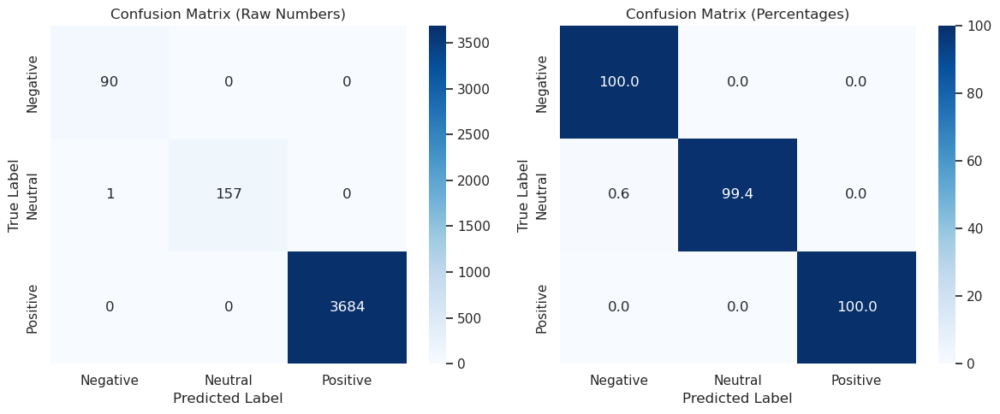


Measuring test set performance...
Starting pipeline evaluation...
Total test samples: 997

Running Stage 1 predictions...
Generating embeddings for prediction...


Batches:   0%|          | 0/32 [00:00<?, ?it/s]


Running Stage 2 predictions...
Processed 100/997 samples
Processed 200/997 samples
Processed 300/997 samples
Processed 400/997 samples
Processed 500/997 samples
Processed 600/997 samples
Processed 700/997 samples
Processed 800/997 samples
Processed 900/997 samples

Test predictions have been added to df_test and saved as 'sentiment_test_model_10.csv'

Prediction counts:
Positive    949
Negative     24
Neutral      24
Name: count, dtype: int64

True label counts:
Positive    934
Neutral      39
Negative     24
Name: count, dtype: int64

Final Classification Report:
              precision    recall  f1-score   support

    Negative       0.50      0.50      0.50        24
     Neutral       0.50      0.31      0.38        39
    Positive       0.97      0.98      0.98       934

    accuracy                           0.94       997
   macro avg       0.66      0.60      0.62       997
weighted avg       0.94      0.94      0.94       997


=== Analyzing Misclassifications ===
Total sam

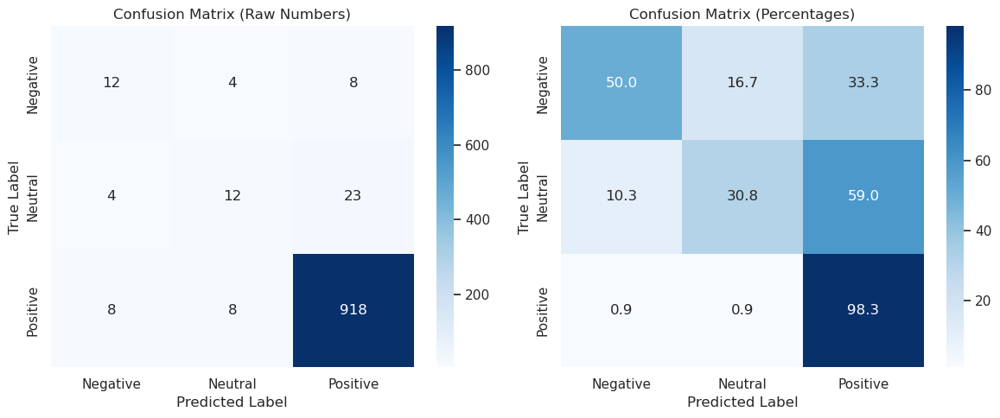


Model Performance Metrics:

Training Set Metrics:
total_inference_time: 2.8157 seconds
average_time_per_sample: 0.0007 seconds
samples_per_second: 1396.45
memory_usage_mb: 1.80 MB
batch_size: 32.00

Test Set Metrics:
total_inference_time: 0.8288 seconds
average_time_per_sample: 0.0008 seconds
samples_per_second: 1202.90
memory_usage_mb: 1.03 MB
batch_size: 32.00

Model Complexity Metrics:
trainable_parameters: 592,900
total_parameters: 592,900
model_size_mb: 2.30 MB
model_type: SMOTE-Enhanced Dual Autoencoder with Hierarchical Classification


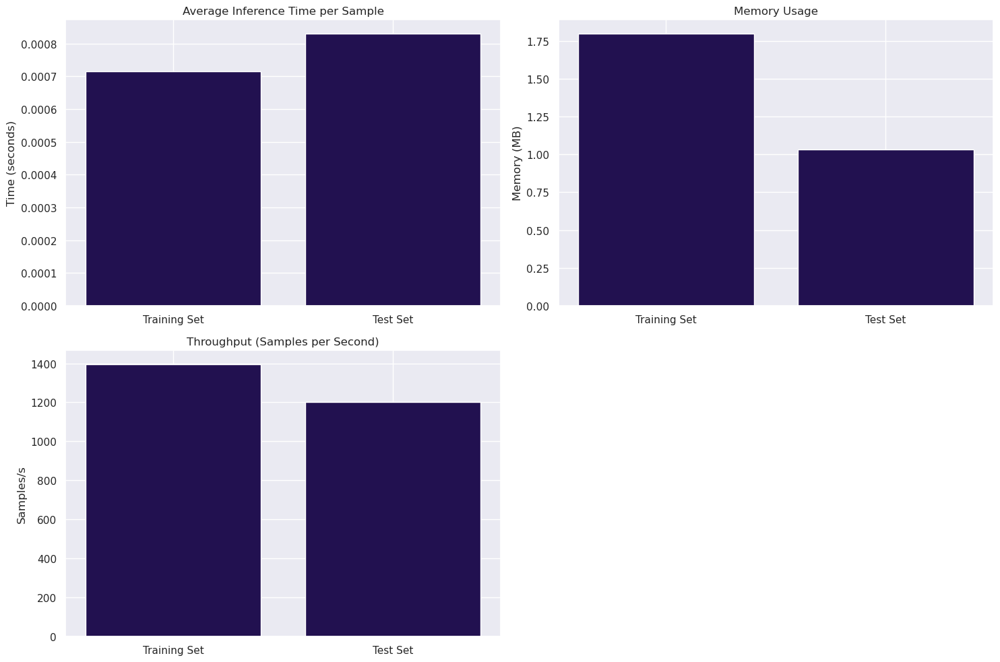


Performance metrics have been saved to './model10/performance_metrics.csv'

Comprehensive Model Summary:
Model: Model 10 (SMOTE-Enhanced Dual Autoencoder with Hierarchical Classification)
Total Parameters: 592,900
Trainable Parameters: 592,900
Model Size: 2.30 MB
Average Inference Time: 0.0008 seconds per sample
Throughput: 1202.90 samples/second
Memory Usage: 1.03 MB


In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sentence_transformers import SentenceTransformer
from tqdm.auto import tqdm
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from imblearn.over_sampling import SMOTE
import os
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


# Load the test set with previous models' predictions
df_test = pd.read_csv('sentiment_test_model_9.csv')


class CustomDataset(Dataset):
    def __init__(self, embeddings):
        self.embeddings = torch.FloatTensor(embeddings)
    
    def __len__(self):
        return len(self.embeddings)
    
    def __getitem__(self, idx):
        return self.embeddings[idx]

class Autoencoder(nn.Module):
    def __init__(self, input_dim, encoding_dim=64):
        super(Autoencoder, self).__init__()
        
        # Encoder
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 256),
            nn.ReLU(),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Linear(128, encoding_dim),
        )
        
        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(encoding_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 256),
            nn.ReLU(),
            nn.Linear(256, input_dim),
        )
    
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded
    
    def encode(self, x):
        return self.encoder(x)

class BinaryClassifier(nn.Module):
    def __init__(self, input_size, hidden_size=128):
        super(BinaryClassifier, self).__init__()
        
        self.model = nn.Sequential(
            nn.Linear(input_size, hidden_size),
            nn.ReLU(),
            nn.Dropout(0.3),
            
            nn.Linear(hidden_size, hidden_size//2),
            nn.ReLU(),
            nn.Dropout(0.3),
            
            nn.Linear(hidden_size//2, 2)  # 2 classes
        )
    
    def forward(self, x):
        return self.model(x)

class SentimentDataset(Dataset):
    def __init__(self, features, labels):
        self.features = torch.FloatTensor(features)
        self.labels = torch.LongTensor(labels)
    
    def __len__(self):
        return len(self.labels)
    
    def __getitem__(self, idx):
        return {
            'features': self.features[idx],
            'labels': self.labels[idx]
        }

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
def train_autoencoder(model, train_loader, num_epochs, device):
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    
    model.train()
    for epoch in range(num_epochs):
        total_loss = 0
        progress_bar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}')
        for batch in progress_bar:
            batch = batch.to(device)
            
            outputs = model(batch)
            loss = criterion(outputs, batch)
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            total_loss += loss.item()
            progress_bar.set_postfix({'loss': f'{loss.item():.4f}'})
        
        avg_loss = total_loss / len(train_loader)
        print(f'Epoch [{epoch+1}/{num_epochs}], Average Loss: {avg_loss:.4f}')

def train_stage_1(df_train):
    """
    Stage 1: Positive-focused Autoencoder + Binary Classifier
    """
    print("Starting Stage 1: Positive vs Rest...")
    
    # Separate Positive and Rest samples
    positive_mask = df_train['sentiment'] == 'Positive'
    positive_texts = df_train[positive_mask]['combined_review_cleaned'].values
    rest_texts = df_train[~positive_mask]['combined_review_cleaned'].values
    
    # Initialize SBERT
    sbert_model = SentenceTransformer('all-MiniLM-L6-v2')
    
    # Generate embeddings
    print("Generating embeddings for positive reviews...")
    positive_embeddings = sbert_model.encode(positive_texts, show_progress_bar=True)
    print("Generating embeddings for rest reviews...")
    rest_embeddings = sbert_model.encode(rest_texts, show_progress_bar=True)
    
    # Standardize embeddings
    scaler = StandardScaler()
    positive_embeddings_scaled = scaler.fit_transform(positive_embeddings)
    rest_embeddings_scaled = scaler.transform(rest_embeddings)
    
    # Create dataset and dataloader for positive samples
    positive_dataset = CustomDataset(positive_embeddings_scaled)
    positive_loader = DataLoader(positive_dataset, batch_size=32, shuffle=True)
    
    # Initialize and train autoencoder
    input_dim = positive_embeddings.shape[1]
    autoencoder = Autoencoder(input_dim).to(device)
    print("\nTraining autoencoder on positive samples...")
    train_autoencoder(autoencoder, positive_loader, num_epochs=80, device=device)
    
    # Generate encoded representations
    print("\nGenerating encoded representations...")
    autoencoder.eval()
    with torch.no_grad():
        all_embeddings = np.vstack([positive_embeddings_scaled, rest_embeddings_scaled])
        all_embeddings_tensor = torch.FloatTensor(all_embeddings).to(device)
        all_encoded = autoencoder.encode(all_embeddings_tensor).cpu().numpy()
    
    # Prepare binary labels
    binary_labels = np.concatenate([
        np.ones(len(positive_texts), dtype=int),
        np.zeros(len(rest_texts), dtype=int)
    ])
    
    # Print original distribution
    print("Original class distribution:", dict(zip(*np.unique(binary_labels, return_counts=True))))
    
    # Apply SMOTE to balance classes
    print("\nApplying SMOTE to balance classes...")
    smote = SMOTE(random_state=42)
    all_encoded_balanced, binary_labels_balanced = smote.fit_resample(all_encoded, binary_labels)
    
    # Print balanced distribution
    print("Class distribution after SMOTE:", dict(zip(*np.unique(binary_labels_balanced, return_counts=True))))
    
    return all_encoded_balanced, binary_labels_balanced, autoencoder, sbert_model, scaler
def train_stage_2(df_train, stage1_predictions):
    """
    Stage 2: Neutral-focused Autoencoder + Binary Classifier
    """
    print("Starting Stage 2: Neutral vs Negative...")
    
    # Get samples predicted as 'Rest' from Stage 1
    rest_mask = stage1_predictions == 0
    df_rest = df_train[rest_mask]
    
    # Separate Neutral and Negative samples
    neutral_mask = df_rest['sentiment'] == 'Neutral'
    neutral_texts = df_rest[neutral_mask]['combined_review_cleaned'].values
    negative_texts = df_rest[~neutral_mask]['combined_review_cleaned'].values
    
    # Initialize SBERT
    sbert_model = SentenceTransformer('all-MiniLM-L6-v2')
    
    # Generate embeddings
    print("Generating embeddings for neutral reviews...")
    neutral_embeddings = sbert_model.encode(neutral_texts, show_progress_bar=True)
    print("Generating embeddings for negative reviews...")
    negative_embeddings = sbert_model.encode(negative_texts, show_progress_bar=True)
    
    # Standardize embeddings
    scaler = StandardScaler()
    neutral_embeddings_scaled = scaler.fit_transform(neutral_embeddings)
    negative_embeddings_scaled = scaler.transform(negative_embeddings)
    
    # Create dataset and dataloader for neutral samples
    neutral_dataset = CustomDataset(neutral_embeddings_scaled)
    neutral_loader = DataLoader(neutral_dataset, batch_size=32, shuffle=True)
    
    # Initialize and train autoencoder
    input_dim = neutral_embeddings.shape[1]
    autoencoder = Autoencoder(input_dim).to(device)
    print("\nTraining autoencoder on neutral samples...")
    train_autoencoder(autoencoder, neutral_loader, num_epochs=80, device=device)
    
    # Generate encoded representations
    print("\nGenerating encoded representations...")
    autoencoder.eval()
    with torch.no_grad():
        all_embeddings = np.vstack([neutral_embeddings_scaled, negative_embeddings_scaled])
        all_embeddings_tensor = torch.FloatTensor(all_embeddings).to(device)
        all_encoded = autoencoder.encode(all_embeddings_tensor).cpu().numpy()
    
    # Prepare binary labels
    binary_labels = np.concatenate([
        np.ones(len(neutral_texts), dtype=int),
        np.zeros(len(negative_texts), dtype=int)
    ])
    
    # Print original distribution
    print("Original class distribution:", dict(zip(*np.unique(binary_labels, return_counts=True))))
    
    # Apply SMOTE to balance classes
    print("\nApplying SMOTE to balance classes...")
    smote = SMOTE(random_state=42)
    all_encoded_balanced, binary_labels_balanced = smote.fit_resample(all_encoded, binary_labels)
    
    # Print balanced distribution
    print("Class distribution after SMOTE:", dict(zip(*np.unique(binary_labels_balanced, return_counts=True))))
    
    return all_encoded_balanced, binary_labels_balanced, autoencoder, sbert_model, scaler

def train_classifier(model, features, labels, num_epochs=80):
    """
    Train a binary classifier on entire dataset with SMOTE
    """
    # Ensure labels are integers
    labels = labels.astype(int)
    
    # Print original distribution
    print("Original data distribution:", dict(zip(*np.unique(labels, return_counts=True))))
    
    # Apply SMOTE to balance classes
    print("\nApplying SMOTE to balance classes...")
    smote = SMOTE(random_state=42)
    features_balanced, labels_balanced = smote.fit_resample(features, labels)
    
    # Print balanced distribution
    print("Class distribution after SMOTE:", dict(zip(*np.unique(labels_balanced, return_counts=True))))
    
    # Convert data to PyTorch dataset
    train_dataset = SentimentDataset(features_balanced, labels_balanced)
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
    
    # Loss and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.AdamW(model.parameters(), lr=0.001)
    
    # Training loop
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0
        all_preds = []
        all_labels = []
        
        for batch in tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}'):
            features = batch['features'].to(device)
            labels = batch['labels'].to(device)
            
            optimizer.zero_grad()
            outputs = model(features)
            loss = criterion(outputs, labels)
            
            loss.backward()
            optimizer.step()
            
            total_loss += loss.item()
            
            _, predictions = torch.max(outputs, 1)
            all_preds.extend(predictions.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
        
        # Print training metrics
        print(f"\nEpoch {epoch+1} Results:")
        print(f"Training Loss: {total_loss/len(train_loader):.4f}")
        print("\nTraining metrics:")
        print(classification_report(all_labels, all_preds))
    
    return model
def predict_stage1(classifier, autoencoder, sbert, scaler, data):
    """Make prediction for stage 1"""
    try:
        if isinstance(data, pd.DataFrame):
            texts = data['combined_review_cleaned'].values
        else:
            texts = data if isinstance(data, list) else [data]
        
        # Generate embeddings
        print("Generating embeddings for prediction...")
        embeddings = sbert.encode(texts, show_progress_bar=True)
        
        # Scale embeddings
        embeddings_scaled = scaler.transform(embeddings)
        
        # Convert to tensor
        embeddings_tensor = torch.FloatTensor(embeddings_scaled).to(device)
        
        # Get encoded representation and predictions
        classifier.eval()
        with torch.no_grad():
            encoded = autoencoder.encode(embeddings_tensor)
            outputs = classifier(encoded)
            _, predicted = torch.max(outputs, 1)
        
        return predicted.cpu().numpy()
    
    except Exception as e:
        print(f"Error in stage 1 prediction: {str(e)}")
        print(f"Input shape: {texts.shape if hasattr(texts, 'shape') else len(texts)}")
        raise

def save_pipeline(stage1_classifier, stage2_classifier, 
                 autoencoder1, autoencoder2,
                 sbert1, sbert2,
                 scaler1, scaler2):
    """Save all components of the pipeline"""
    
    # Create directory if it doesn't exist
    os.makedirs('./model10', exist_ok=True)
    
    # Save models and components
    torch.save({
        'stage1_classifier': stage1_classifier.state_dict(),
        'stage2_classifier': stage2_classifier.state_dict(),
        'autoencoder1': autoencoder1.state_dict(),
        'autoencoder2': autoencoder2.state_dict(),
        'scaler1': scaler1,
        'scaler2': scaler2
    }, './model10/sentiment_pipeline_model10.pt')

def analyze_misclassifications(true_labels, predicted_labels, texts, n_samples=10):
    """Analyze and display misclassifications with examples"""
    results_df = pd.DataFrame({
        'text': texts,
        'true_label': true_labels,
        'predicted_label': predicted_labels
    })
    
    misclassified = results_df[results_df['true_label'] != results_df['predicted_label']]
    
    print(f"Total samples: {len(results_df)}")
    print(f"Total misclassifications: {len(misclassified)}")
    print(f"Accuracy: {(1 - len(misclassified)/len(results_df))*100:.2f}%\n")
    
    for true_label in ['Positive', 'Negative', 'Neutral']:
        print(f"\n=== Misclassified {true_label} Reviews ===")
        true_label_misc = misclassified[misclassified['true_label'] == true_label]
        print(f"Total misclassified {true_label} reviews: {len(true_label_misc)}")
        
        if len(true_label_misc) > 0:
            print(f"\nShowing {min(n_samples, len(true_label_misc))} examples:")
            for idx, row in true_label_misc.head(n_samples).iterrows():
                print("\nReview:", row['text'][:200], "..." if len(row['text']) > 200 else "")
                print(f"True Label: {row['true_label']}")
                print(f"Predicted Label: {row['predicted_label']}")
                print("-" * 80)
    
    # Plot confusion matrices
    cm = confusion_matrix(true_labels, predicted_labels)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100
    
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Negative', 'Neutral', 'Positive'],
                yticklabels=['Negative', 'Neutral', 'Positive'])
    plt.title('Confusion Matrix (Raw Numbers)')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    
    plt.subplot(1, 2, 2)
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=['Negative', 'Neutral', 'Positive'],
                yticklabels=['Negative', 'Neutral', 'Positive'])
    plt.title('Confusion Matrix (Percentages)')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    
    plt.tight_layout()
    plt.show()
    
    return misclassified
def evaluate_pipeline(df_test, 
                     stage1_classifier, stage2_classifier,
                     autoencoder1, autoencoder2,
                     sbert1, sbert2,
                     scaler1, scaler2):
    """Evaluate the complete pipeline"""
    try:
        print("Starting pipeline evaluation...")
        predictions = []
        texts = df_test['combined_review_cleaned'].values
        true_labels = df_test['sentiment'].values
        
        print(f"Total test samples: {len(texts)}")
        
        # Stage 1: Predict Positive vs Rest
        print("\nRunning Stage 1 predictions...")
        stage1_preds = predict_stage1(stage1_classifier, autoencoder1, sbert1, scaler1, df_test)
        
        # Stage 2: Process non-positive predictions
        print("\nRunning Stage 2 predictions...")
        for i, (text, stage1_pred) in enumerate(zip(texts, stage1_preds)):
            if stage1_pred == 1:
                predictions.append("Positive")
            else:
                # Create embedding for single text
                embedding = sbert2.encode([text])
                embedding_scaled = scaler2.transform(embedding)
                embedding_tensor = torch.FloatTensor(embedding_scaled).to(device)
                
                # Get stage 2 prediction
                with torch.no_grad():
                    encoded = autoencoder2.encode(embedding_tensor)
                    outputs = stage2_classifier(encoded)
                    _, predicted = torch.max(outputs, 1)
                    stage2_pred = predicted.cpu().numpy()[0]
                
                predictions.append("Neutral" if stage2_pred == 1 else "Negative")
            
            if (i + 1) % 100 == 0:
                print(f"Processed {i + 1}/{len(texts)} samples")
        
        predictions = np.array(predictions)

        # Add new predictions to df_test and save
        df_test['predicted_sentiment_model_10'] = predictions
        df_test.to_csv('sentiment_test_model_10.csv', index=False)
        print("\nTest predictions have been added to df_test and saved as 'sentiment_test_model_10.csv'")
        
        print("\nPrediction counts:")
        print(pd.Series(predictions).value_counts())
        
        print("\nTrue label counts:")
        print(pd.Series(true_labels).value_counts())
        
        print("\nFinal Classification Report:")
        print(classification_report(true_labels, predictions))
    
        print("\n=== Analyzing Misclassifications ===")
        misclassified = analyze_misclassifications(
            true_labels,
            predictions,
            texts,
            n_samples=10
        )
        
        # Save misclassifications to CSV in model10 directory
        misclassified.to_csv('./model10/misclassifications_model10.csv', index=False)
        
        return predictions
        
    except Exception as e:
        print(f"Error in pipeline evaluation: {str(e)}")
        print(f"Predictions length: {len(predictions) if 'predictions' in locals() else 'not created'}")
        print(f"True labels length: {len(true_labels)}")
        raise

def main():
    print("Loading and preparing data...")
    
    # Stage 1: Positive vs Rest
    print("=== Stage 1: Positive vs Rest Classification ===")
    encoded_stage1, labels_stage1, autoencoder1, sbert1, scaler1 = train_stage_1(df_train)
    
    # Train Stage 1 classifier on entire dataset
    stage1_classifier = BinaryClassifier(input_size=encoded_stage1.shape[1]).to(device)
    stage1_classifier = train_classifier(stage1_classifier, encoded_stage1, labels_stage1)
    
    # Get predictions for Stage 2
    stage1_preds = predict_stage1(stage1_classifier, autoencoder1, sbert1, scaler1, df_train)
    
    # Stage 2: Neutral vs Negative
    print("\n=== Stage 2: Neutral vs Negative Classification ===")
    encoded_stage2, labels_stage2, autoencoder2, sbert2, scaler2 = train_stage_2(df_train, stage1_preds)
    
    # Train Stage 2 classifier on entire dataset
    stage2_classifier = BinaryClassifier(input_size=encoded_stage2.shape[1]).to(device)
    stage2_classifier = train_classifier(stage2_classifier, encoded_stage2, labels_stage2)
    
    # Save models and components
    save_pipeline(stage1_classifier, stage2_classifier, 
                 autoencoder1, autoencoder2,
                 sbert1, sbert2,
                 scaler1, scaler2)
    
    # Performance Metrics Evaluation
    print("\nMeasuring Performance Metrics...")
    
    def measure_inference_metrics(data, batch_size=32):
        # Memory usage before inference
        process = psutil.Process(os.getpid())
        memory_before = process.memory_info().rss / 1024 / 1024
        
        # Measure inference time
        start_time = time.time()
        
        # Run complete pipeline inference
        predictions = evaluate_pipeline(data, 
                                     stage1_classifier, stage2_classifier,
                                     autoencoder1, autoencoder2,
                                     sbert1, sbert2,
                                     scaler1, scaler2)
        
        end_time = time.time()
        
        # Memory usage after inference
        memory_after = process.memory_info().rss / 1024 / 1024
        
        # Calculate metrics
        total_time = end_time - start_time
        samples = len(data)
        avg_time_per_sample = total_time / samples
        memory_used = memory_after - memory_before
        
        return {
            'total_inference_time': total_time,
            'average_time_per_sample': avg_time_per_sample,
            'samples_per_second': samples / total_time,
            'memory_usage_mb': memory_used,
            'batch_size': batch_size
        }

    def get_model_complexity():
        def count_parameters(model):
            return sum(p.numel() for p in model.parameters())
        
        models = [stage1_classifier, stage2_classifier, autoencoder1, autoencoder2]
        total_params = sum(count_parameters(model) for model in models)
        trainable_params = sum(sum(p.numel() for p in model.parameters() if p.requires_grad) 
                             for model in models)
        
        model_size = os.path.getsize('./model10/sentiment_pipeline_model10.pt') / (1024 * 1024)
        
        return {
            'trainable_parameters': trainable_params,
            'total_parameters': total_params,
            'model_size_mb': model_size,
            'model_type': 'SMOTE-Enhanced Dual Autoencoder with Hierarchical Classification'
        }

    # Measure performance on training and test sets
    print("\nMeasuring training set performance...")
    train_metrics = measure_inference_metrics(df_train)
    
    print("\nMeasuring test set performance...")
    test_metrics = measure_inference_metrics(df_test)
    
    # Get model complexity metrics
    complexity_metrics = get_model_complexity()
    
    # Print performance metrics
    print("\nModel Performance Metrics:")
    print("\nTraining Set Metrics:")
    for metric, value in train_metrics.items():
        if 'time' in metric:
            print(f"{metric}: {value:.4f} seconds")
        elif 'memory' in metric:
            print(f"{metric}: {value:.2f} MB")
        else:
            print(f"{metric}: {value:.2f}")

    print("\nTest Set Metrics:")
    for metric, value in test_metrics.items():
        if 'time' in metric:
            print(f"{metric}: {value:.4f} seconds")
        elif 'memory' in metric:
            print(f"{metric}: {value:.2f} MB")
        else:
            print(f"{metric}: {value:.2f}")

    print("\nModel Complexity Metrics:")
    for metric, value in complexity_metrics.items():
        if isinstance(value, str):
            print(f"{metric}: {value}")
        elif 'size' in metric:
            print(f"{metric}: {value:.2f} MB")
        else:
            print(f"{metric}: {value:,}")

    # Visualize performance metrics
    plt.figure(figsize=(15,10))
    
    # Inference time comparison
    plt.subplot(2,2,1)
    metrics_data = [train_metrics['average_time_per_sample'], test_metrics['average_time_per_sample']]
    plt.bar(['Training Set', 'Test Set'], metrics_data)
    plt.title('Average Inference Time per Sample')
    plt.ylabel('Time (seconds)')
    
    # Memory usage comparison
    plt.subplot(2,2,2)
    memory_data = [train_metrics['memory_usage_mb'], test_metrics['memory_usage_mb']]
    plt.bar(['Training Set', 'Test Set'], memory_data)
    plt.title('Memory Usage')
    plt.ylabel('Memory (MB)')
    
    # Throughput comparison
    plt.subplot(2,2,3)
    throughput_data = [train_metrics['samples_per_second'], test_metrics['samples_per_second']]
    plt.bar(['Training Set', 'Test Set'], throughput_data)
    plt.title('Throughput (Samples per Second)')
    plt.ylabel('Samples/s')
    
    plt.tight_layout()
    plt.savefig('./model10/performance_metrics.png')
    plt.show()

    # Store metrics in DataFrame
    performance_metrics = pd.DataFrame({
        'Metric': [
            'Training Time per Sample (s)',
            'Test Time per Sample (s)',
            'Training Memory (MB)',
            'Test Memory (MB)',
            'Model Size (MB)',
            'Total Parameters',
            'Trainable Parameters',
            'Training Throughput (samples/s)',
            'Test Throughput (samples/s)'
        ],
        'Value': [
            train_metrics['average_time_per_sample'],
            test_metrics['average_time_per_sample'],
            train_metrics['memory_usage_mb'],
            test_metrics['memory_usage_mb'],
            complexity_metrics['model_size_mb'],
            complexity_metrics['total_parameters'],
            complexity_metrics['trainable_parameters'],
            train_metrics['samples_per_second'],
            test_metrics['samples_per_second']
        ]
    })
    
    # Save metrics
    performance_metrics.to_csv('./model10/performance_metrics.csv', index=False)
    print("\nPerformance metrics have been saved to './model10/performance_metrics.csv'")

    # Print comprehensive summary
    print("\nComprehensive Model Summary:")
    print("=" * 50)
    print(f"Model: Model 10 (SMOTE-Enhanced Dual Autoencoder with Hierarchical Classification)")
    print(f"Total Parameters: {complexity_metrics['total_parameters']:,}")
    print(f"Trainable Parameters: {complexity_metrics['trainable_parameters']:,}")
    print(f"Model Size: {complexity_metrics['model_size_mb']:.2f} MB")
    print(f"Average Inference Time: {test_metrics['average_time_per_sample']:.4f} seconds per sample")
    print(f"Throughput: {test_metrics['samples_per_second']:.2f} samples/second")
    print(f"Memory Usage: {test_metrics['memory_usage_mb']:.2f} MB")



# def main():
#     print("Loading and preparing data...")
    
#     # Stage 1: Positive vs Rest
#     print("=== Stage 1: Positive vs Rest Classification ===")
#     encoded_stage1, labels_stage1, autoencoder1, sbert1, scaler1 = train_stage_1(df_train)
    
#     # Train Stage 1 classifier on entire dataset
#     stage1_classifier = BinaryClassifier(input_size=encoded_stage1.shape[1]).to(device)
#     stage1_classifier = train_classifier(stage1_classifier, encoded_stage1, labels_stage1)
    
#     # Get predictions for Stage 2
#     stage1_preds = predict_stage1(stage1_classifier, autoencoder1, sbert1, scaler1, df_train)
    
#     # Stage 2: Neutral vs Negative
#     print("\n=== Stage 2: Neutral vs Negative Classification ===")
#     encoded_stage2, labels_stage2, autoencoder2, sbert2, scaler2 = train_stage_2(df_train, stage1_preds)
    
#     # Train Stage 2 classifier on entire dataset
#     stage2_classifier = BinaryClassifier(input_size=encoded_stage2.shape[1]).to(device)
#     stage2_classifier = train_classifier(stage2_classifier, encoded_stage2, labels_stage2)
    
#     # Save models and components
#     save_pipeline(stage1_classifier, stage2_classifier, 
#                  autoencoder1, autoencoder2,
#                  sbert1, sbert2,
#                  scaler1, scaler2)
    
#     # If df_test is available, evaluate on test set
#     if 'df_test' in globals():
#         print("\nEvaluating on test set...")
#         evaluate_pipeline(df_test, 
#                         stage1_classifier, stage2_classifier,
#                         autoencoder1, autoencoder2,
#                         sbert1, sbert2,
#                         scaler1, scaler2)

if __name__ == "__main__":
    # Set random seeds for reproducibility
    torch.manual_seed(42)
    np.random.seed(42)
    
    # Make sure df_train is loaded
    if 'df_train' not in globals():
        raise ValueError("Please load your training data into df_train before running")
    
    main()


# Results of multiple Neural Networks Trained from Scratch

## Ensembling

In [ ]:
import pandas as pd
from collections import Counter

# Read the final model predictions
df = pd.read_csv('sentiment_test_model_10.csv')

# Get all prediction columns
pred_columns = [col for col in df.columns if col.startswith('predicted_sentiment_model_')]

def resolve_tie(counts):
    """
    Resolve ties based on given rules:
    Positive VS Neutral: assign Neutral
    Positive VS Negative: assign Negative
    Negative VS Neutral: Assign Neutral
    """
    # If there's only one class in counts, return it
    if len(counts) == 1:
        return list(counts.keys())[0]
    
    # Get all predictions sorted by count
    sorted_preds = counts.most_common()
    
    # If the top prediction has more votes, return it
    if len(sorted_preds) > 1 and sorted_preds[0][1] > sorted_preds[1][1]:
        return sorted_preds[0][0]
    
    # Handle ties
    top_classes = {pred for pred, count in sorted_preds if count == sorted_preds[0][1]}
    
    # If there's a tie between Positive and Neutral, return Neutral
    if 'Positive' in top_classes and 'Neutral' in top_classes:
        return 'Neutral'
    # If there's a tie between Positive and Negative, return Negative
    elif 'Positive' in top_classes and 'Negative' in top_classes:
        return 'Negative'
    # If there's a tie between Negative and Neutral, return Neutral
    elif 'Negative' in top_classes and 'Neutral' in top_classes:
        return 'Neutral'
    
    # If we get here, return the first class alphabetically from the tied classes
    return sorted(top_classes)[0]

# Perform majority voting with tie breaking
final_predictions = []

for idx, row in df.iterrows():
    # Get all predictions for this instance
    predictions = [row[col] for col in pred_columns]
    
    # Count occurrences of each class
    counts = Counter(predictions)
    
    # Get final prediction using tie-breaking rules
    final_pred = resolve_tie(counts)
    final_predictions.append(final_pred)
    
    # Print some debug information for the first few rows
    if idx < 5:
        print(f"\nRow {idx}:")
        print("Predictions:", predictions)
        print("Counts:", dict(counts))
        print("Final prediction:", final_pred)

# Add final predictions to dataframe
df['sentiment_final'] = final_predictions

# Print summary of final predictions
print("\nFinal Prediction Distribution:")
print(df['sentiment_final'].value_counts())

# Compare with true sentiment
print("\nComparison with True Sentiment:")
print("\nConfusion Matrix:")
confusion = pd.crosstab(df['sentiment'], df['sentiment_final'])
print(confusion)

print("\nAccuracy:", (df['sentiment'] == df['sentiment_final']).mean())

# Save final results
df.to_csv('sentiment_final_prediction.csv', index=False)
print("\nFinal predictions saved to 'sentiment_final_prediction.csv'")

# Show some examples
print("\nExample Cases:")
sample_cases = df.head()
for _, row in sample_cases.iterrows():
    print(f"\nText: {row['combined_review_cleaned'][:200]}...")
    print(f"True Sentiment: {row['sentiment']}")
    print(f"Final Prediction: {row['sentiment_final']}")
    print("Individual Model Predictions:")
    for col in pred_columns:
        print(f"{col}: {row[col]}")
    print("-" * 80)



Row 0:
Predictions: ['Positive', 'Positive', 'Positive', 'Positive', 'Positive', 'Positive', 'Positive', 'Positive', 'Positive', 'Positive']
Counts: {'Positive': 10}
Final prediction: Positive

Row 1:
Predictions: ['Positive', 'Positive', 'Positive', 'Positive', 'Neutral', 'Positive', 'Positive', 'Positive', 'Positive', 'Positive']
Counts: {'Positive': 9, 'Neutral': 1}
Final prediction: Positive

Row 2:
Predictions: ['Positive', 'Positive', 'Positive', 'Positive', 'Positive', 'Positive', 'Positive', 'Positive', 'Positive', 'Positive']
Counts: {'Positive': 10}
Final prediction: Positive

Row 3:
Predictions: ['Positive', 'Positive', 'Positive', 'Positive', 'Positive', 'Positive', 'Positive', 'Positive', 'Positive', 'Positive']
Counts: {'Positive': 10}
Final prediction: Positive

Row 4:
Predictions: ['Positive', 'Positive', 'Positive', 'Positive', 'Positive', 'Positive', 'Positive', 'Positive', 'Positive', 'Positive']
Counts: {'Positive': 10}
Final prediction: Positive

Final Prediction 

## Final Predictions

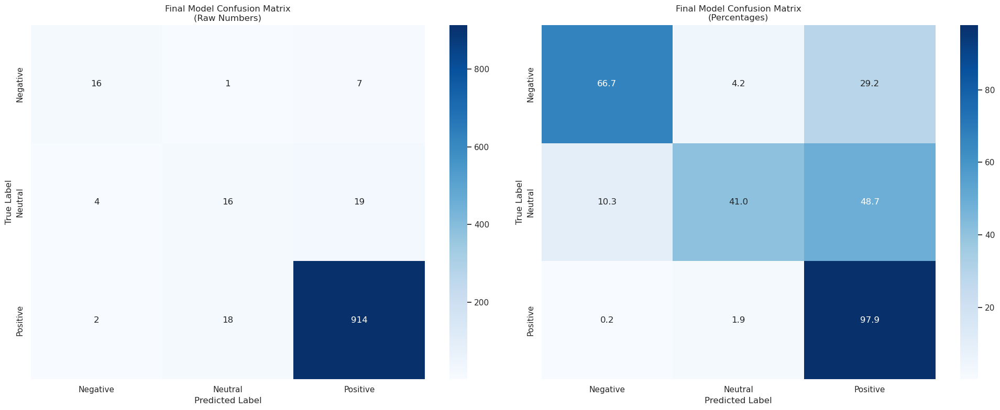


Detailed Classification Metrics:
              precision    recall  f1-score   support

    Negative       0.73      0.67      0.70        24
     Neutral       0.46      0.41      0.43        39
    Positive       0.97      0.98      0.98       934

    accuracy                           0.95       997
   macro avg       0.72      0.69      0.70       997
weighted avg       0.95      0.95      0.95       997


Detailed Metrics per Class:
Overall Accuracy: 0.9488

Per-class metrics:

Negative:
Precision: 0.7273
Recall: 0.6667
F1-Score: 0.6957

Neutral:
Precision: 0.4571
Recall: 0.4103
F1-Score: 0.4324

Positive:
Precision: 0.9723
Recall: 0.9786
F1-Score: 0.9755

Final predictions saved to 'sentiment_final_prediction.csv'

Distribution of Final Predictions:
sentiment_final
Positive    940
Neutral      35
Negative     22
Name: count, dtype: int64

True Label Distribution:
sentiment
Positive    934
Neutral      39
Negative     24
Name: count, dtype: int64


In [ ]:
import pandas as pd
from collections import Counter
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report

# Read the final model predictions
df = pd.read_csv('sentiment_test_model_10.csv')

# [Previous code for majority voting remains the same until after creating final predictions]

# Add final predictions to dataframe
df['sentiment_final'] = final_predictions

# Calculate confusion matrix
cm = confusion_matrix(df['sentiment'], df['sentiment_final'])
cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100

# Plot confusion matrices
plt.figure(figsize=(20,8))

# Plot raw numbers
plt.subplot(1, 2, 1)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Negative', 'Neutral', 'Positive'],
            yticklabels=['Negative', 'Neutral', 'Positive'])
plt.title('Final Model Confusion Matrix\n(Raw Numbers)')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

# Plot percentages
plt.subplot(1, 2, 2)
sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
            xticklabels=['Negative', 'Neutral', 'Positive'],
            yticklabels=['Negative', 'Neutral', 'Positive'])
plt.title('Final Model Confusion Matrix\n(Percentages)')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.tight_layout()
plt.show()

# Print detailed metrics
print("\nDetailed Classification Metrics:")
print("=" * 80)
print(classification_report(df['sentiment'], df['sentiment_final'], 
                          target_names=['Negative', 'Neutral', 'Positive']))

# Calculate and print individual metrics
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Overall accuracy
accuracy = accuracy_score(df['sentiment'], df['sentiment_final'])

# Per-class metrics
precision = precision_score(df['sentiment'], df['sentiment_final'], average=None)
recall = recall_score(df['sentiment'], df['sentiment_final'], average=None)
f1 = f1_score(df['sentiment'], df['sentiment_final'], average=None)

print("\nDetailed Metrics per Class:")
print("=" * 80)
print(f"Overall Accuracy: {accuracy:.4f}")
print("\nPer-class metrics:")
for i, class_name in enumerate(['Negative', 'Neutral', 'Positive']):
    print(f"\n{class_name}:")
    print(f"Precision: {precision[i]:.4f}")
    print(f"Recall: {recall[i]:.4f}")
    print(f"F1-Score: {f1[i]:.4f}")

# Save results
df.to_csv('sentiment_final_prediction.csv', index=False)
print("\nFinal predictions saved to 'sentiment_final_prediction.csv'")

# Distribution of predictions
print("\nDistribution of Final Predictions:")
print("=" * 80)
print(df['sentiment_final'].value_counts())
print("\nTrue Label Distribution:")
print(df['sentiment'].value_counts())


## Sample Predictions

In [ ]:
import pandas as pd
import numpy as np

# Read the final predictions
df = pd.read_csv('sentiment_final_prediction.csv')

def display_examples(df, true_label, predicted_label, n=5):
    """
    Display n examples of predictions where true_label and predicted_label match/don't match
    """
    mask = (df['sentiment'] == true_label) & (df['sentiment_final'] == predicted_label)
    examples = df[mask].head(n)
    
    print(f"\n{'='*100}")
    print(f"Examples where True Label = {true_label} and Predicted Label = {predicted_label}")
    print(f"{'='*100}")
    
    if len(examples) == 0:
        print(f"No examples found for this combination!")
        return
    
    for idx, row in examples.iterrows():
        print(f"\nExample {idx}:")
        print(f"Text: {row['combined_review_cleaned'][:200]}...")
        print(f"True Label: {row['sentiment']}")
        print(f"Predicted Label: {row['sentiment_final']}")
        # print(f"Individual Model Predictions:")
        # for col in [col for col in df.columns if col.startswith('predicted_sentiment_model_')]:
        #     print(f"{col}: {row[col]}")
        print('-' * 100)

# Display True Positives (Correctly predicted Positive)
print("\nTRUE POSITIVES")
display_examples(df, 'Positive', 'Positive')

# Display True Negatives (Correctly predicted Negative)
print("\nTRUE NEGATIVES")
display_examples(df, 'Negative', 'Negative')

# Display True Neutrals (Correctly predicted Neutral)
print("\nTRUE NEUTRALS")
display_examples(df, 'Neutral', 'Neutral')

# Display False Positives (Incorrectly predicted as Positive)
print("\nFALSE POSITIVES")
for true_label in ['Negative', 'Neutral']:
    display_examples(df, true_label, 'Positive')

# Display False Negatives (Incorrectly predicted as Negative)
print("\nFALSE NEGATIVES")
for true_label in ['Positive', 'Neutral']:
    display_examples(df, true_label, 'Negative')

# Display False Neutrals (Incorrectly predicted as Neutral)
print("\nFALSE NEUTRALS")
for true_label in ['Positive', 'Negative']:
    display_examples(df, true_label, 'Neutral')

# Print summary counts
print("\nSUMMARY COUNTS")
print("=" * 100)
for true_label in ['Positive', 'Negative', 'Neutral']:
    for pred_label in ['Positive', 'Negative', 'Neutral']:
        count = len(df[(df['sentiment'] == true_label) & (df['sentiment_final'] == pred_label)])
        if true_label == pred_label:
            print(f"True {true_label}: {count}")
        else:
            print(f"False {pred_label} (Actually {true_label}): {count}")



TRUE POSITIVES

Examples where True Label = Positive and Predicted Label = Positive

Example 0:
Text: very handy device Amazon kindle fire has a lot of free app and can be used by any one that wants to get online anywhere...
True Label: Positive
Predicted Label: Positive
----------------------------------------------------------------------------------------------------

Example 1:
Text: Another winner from Amazon The Echo Show is a great addition to the Amazon family Works just like the Echo but with a 7 screen Bright vibrant display Rich clear sound Works great with Arlo security ca...
True Label: Positive
Predicted Label: Positive
----------------------------------------------------------------------------------------------------

Example 2:
Text: simple to use and reliable so far Great value from Best Buy Bought at Christmas sale...
True Label: Positive
Predicted Label: Positive
----------------------------------------------------------------------------------------------------

E

# Using Conventional Techniques

## 1. Neural Network based Classifier using Word2Vec

In [ ]:
import nltk
nltk.download('punkt')


[nltk_data] Downloading package punkt to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

[nltk_data] Downloading package punkt to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package wordnet to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


Starting data preparation...
Creating Word2Vec embeddings...
Tokenizing texts...
Training Word2Vec model...
Creating document embeddings...

Applying SMOTE...
Original dataset shape: {0: 90, 1: 158, 2: 3684}
Resampled dataset shape: {0: 3684, 1: 3684, 2: 3684}

Creating neural network...

Training neural network...
Epoch 1/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5088 - loss: 1.9106

173/173 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5092 - loss: 1.9092 - learning_rate: 0.0010
Epoch 2/100
153/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6670 - loss: 1.3638

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6690 - loss: 1.3580 - learning_rate: 0.0010
Epoch 3/100
155/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7195 - loss: 1.2135

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7207 - loss: 1.2101 - learning_rate: 0.0010
Epoch 4/100
165/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7540 - loss: 1.0991

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7543 - loss: 1.0984 - learning_rate: 0.0010
Epoch 5/100
165/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7781 - loss: 1.0152

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7785 - loss: 1.0141 - learning_rate: 0.0010
Epoch 6/100
166/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8051 - loss: 0.9300

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8052 - loss: 0.9294 - learning_rate: 0.0010
Epoch 7/100
162/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8076 - loss: 0.8698

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8079 - loss: 0.8690 - learning_rate: 0.0010
Epoch 8/100
146/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8152 - loss: 0.8273

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8159 - loss: 0.8244 - learning_rate: 0.0010
Epoch 9/100
146/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8230 - loss: 0.7748

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8240 - loss: 0.7726 - learning_rate: 0.0010
Epoch 10/100
148/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8306 - loss: 0.7367

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8309 - loss: 0.7349 - learning_rate: 0.0010
Epoch 11/100
171/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8364 - loss: 0.6869

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8363 - loss: 0.6870 - learning_rate: 0.0010
Epoch 12/100
164/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8436 - loss: 0.6493

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8434 - loss: 0.6496 - learning_rate: 0.0010
Epoch 13/100
170/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8404 - loss: 0.6451

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8404 - loss: 0.6450 - learning_rate: 0.0010
Epoch 14/100
166/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8472 - loss: 0.6132

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8473 - loss: 0.6129 - learning_rate: 0.0010
Epoch 15/100
157/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8461 - loss: 0.5932

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8465 - loss: 0.5923 - learning_rate: 0.0010
Epoch 16/100
165/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8524 - loss: 0.5694

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8524 - loss: 0.5693 - learning_rate: 0.0010
Epoch 17/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8482 - loss: 0.5707 - learning_rate: 0.0010
Epoch 18/100
151/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8430 - loss: 0.5668

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8439 - loss: 0.5655 - learning_rate: 0.0010
Epoch 19/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8465 - loss: 0.5673 - learning_rate: 0.0010
Epoch 20/100
163/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8479 - loss: 0.5536

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8479 - loss: 0.5533 - learning_rate: 0.0010
Epoch 21/100
152/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8438 - loss: 0.5436

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8442 - loss: 0.5429 - learning_rate: 0.0010
Epoch 22/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8465 - loss: 0.5367 - learning_rate: 0.0010
Epoch 23/100
157/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8437 - loss: 0.5304

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8441 - loss: 0.5302 - learning_rate: 0.0010
Epoch 24/100
150/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8505 - loss: 0.5172

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8505 - loss: 0.5179 - learning_rate: 0.0010
Epoch 25/100
157/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8474 - loss: 0.5244

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8479 - loss: 0.5233 - learning_rate: 0.0010
Epoch 26/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8520 - loss: 0.5126 - learning_rate: 0.0010
Epoch 27/100
160/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8607 - loss: 0.4964

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8608 - loss: 0.4962 - learning_rate: 0.0010
Epoch 28/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8580 - loss: 0.4972 - learning_rate: 0.0010
Epoch 29/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8539 - loss: 0.5026 - learning_rate: 0.0010
Epoch 30/100
161/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8554 - loss: 0.4995

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8556 - loss: 0.4984 - learning_rate: 0.0010
Epoch 31/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8589 - loss: 0.4862 - learning_rate: 0.0010
Epoch 32/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8515 - loss: 0.4865 - learning_rate: 0.0010
Epoch 33/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8591 - loss: 0.4853 - learning_rate: 0.0010
Epoch 34/100
166/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8608 - loss: 0.4774

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8609 - loss: 0.4772 - learning_rate: 0.0010
Epoch 35/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8583 - loss: 0.4765 - learning_rate: 0.0010
Epoch 36/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8558 - loss: 0.4840 - learning_rate: 0.0010
Epoch 37/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8584 - loss: 0.4739 - learning_rate: 0.0010
Epoch 38/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8577 - loss: 0.4822 - learning_rate: 0.0010
Epoch 39/100
163/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8625 - loss: 0.4701

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8621 - loss: 0.4703 - learning_rate: 0.0010
Epoch 40/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8528 - loss: 0.4858 - learning_rate: 0.0010
Epoch 41/100
160/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8640 - loss: 0.4669

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8639 - loss: 0.4671 - learning_rate: 0.0010
Epoch 42/100
155/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8628 - loss: 0.4712

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8629 - loss: 0.4703 - learning_rate: 0.0010
Epoch 43/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8624 - loss: 0.4738 - learning_rate: 0.0010
Epoch 44/100
162/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8705 - loss: 0.4562

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8703 - loss: 0.4566 - learning_rate: 0.0010
Epoch 45/100
170/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8701 - loss: 0.4665

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8702 - loss: 0.4664 - learning_rate: 0.0010
Epoch 46/100
170/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8697 - loss: 0.4555

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8697 - loss: 0.4554 - learning_rate: 0.0010
Epoch 47/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8646 - loss: 0.4631 - learning_rate: 0.0010
Epoch 48/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8673 - loss: 0.4559 - learning_rate: 0.0010
Epoch 49/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8618 - loss: 0.4673 - learning_rate: 0.0010
Epoch 50/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8610 - loss: 0.4665 - learning_rate: 0.0010
Epoch 51/100
149/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8635 - loss: 0.4614

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8640 - loss: 0.4602 - learning_rate: 0.0010
Epoch 52/100
168/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8737 - loss: 0.4379

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8739 - loss: 0.4374 - learning_rate: 2.0000e-04
Epoch 53/100
151/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8887 - loss: 0.4059

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8888 - loss: 0.4054 - learning_rate: 2.0000e-04
Epoch 54/100
151/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8882 - loss: 0.4030

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8884 - loss: 0.4021 - learning_rate: 2.0000e-04
Epoch 55/100
150/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8957 - loss: 0.3800

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8953 - loss: 0.3810 - learning_rate: 2.0000e-04
Epoch 56/100
144/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8964 - loss: 0.3692

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8961 - loss: 0.3698 - learning_rate: 2.0000e-04
Epoch 57/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8935 - loss: 0.3781 - learning_rate: 2.0000e-04
Epoch 58/100
156/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9011 - loss: 0.3643

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9008 - loss: 0.3646 - learning_rate: 2.0000e-04
Epoch 59/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8996 - loss: 0.3646 - learning_rate: 2.0000e-04
Epoch 60/100
151/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8982 - loss: 0.3591

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8981 - loss: 0.3596 - learning_rate: 2.0000e-04
Epoch 61/100
155/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9053 - loss: 0.3519

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9052 - loss: 0.3524 - learning_rate: 2.0000e-04
Epoch 62/100
154/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9091 - loss: 0.3390

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9085 - loss: 0.3402 - learning_rate: 2.0000e-04
Epoch 63/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8994 - loss: 0.3532 - learning_rate: 2.0000e-04
Epoch 64/100
164/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9069 - loss: 0.3432

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9069 - loss: 0.3431 - learning_rate: 2.0000e-04
Epoch 65/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8958 - loss: 0.3568 - learning_rate: 2.0000e-04
Epoch 66/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9055 - loss: 0.3358 - learning_rate: 2.0000e-04
Epoch 67/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9041 - loss: 0.3449 - learning_rate: 2.0000e-04
Epoch 68/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9066 - loss: 0.3440 - learning_rate: 2.0000e-04
Epoch 69/100
149/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9074 - loss: 0.3350

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9074 - loss: 0.3345 - learning_rate: 2.0000e-04
Epoch 70/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9070 - loss: 0.3306 - learning_rate: 2.0000e-04
Epoch 71/100
162/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9052 - loss: 0.3293

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9053 - loss: 0.3294 - learning_rate: 2.0000e-04
Epoch 72/100
165/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9057 - loss: 0.3277

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9057 - loss: 0.3278 - learning_rate: 2.0000e-04
Epoch 73/100
159/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9100 - loss: 0.3225

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9099 - loss: 0.3226 - learning_rate: 2.0000e-04
Epoch 74/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9097 - loss: 0.3303 - learning_rate: 2.0000e-04
Epoch 75/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9035 - loss: 0.3327 - learning_rate: 2.0000e-04
Epoch 76/100
170/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9133 - loss: 0.3146

173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9132 - loss: 0.3146 - learning_rate: 2.0000e-04
Epoch 77/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9124 - loss: 0.3141 - learning_rate: 2.0000e-04
Epoch 78/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9105 - loss: 0.3150 - learning_rate: 2.0000e-04
Epoch 79/100
157/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9118 - loss: 0.3146

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9118 - loss: 0.3145 - learning_rate: 2.0000e-04
Epoch 80/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9145 - loss: 0.3118 - learning_rate: 2.0000e-04
Epoch 81/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9084 - loss: 0.3182 - learning_rate: 2.0000e-04
Epoch 82/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9169 - loss: 0.3068 - learning_rate: 2.0000e-04
Epoch 83/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9163 - loss: 0.3067

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9162 - loss: 0.3068 - learning_rate: 2.0000e-04
Epoch 84/100
160/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9222 - loss: 0.2945

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9215 - loss: 0.2954 - learning_rate: 2.0000e-04
Epoch 85/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9177 - loss: 0.3065 - learning_rate: 2.0000e-04
Epoch 86/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9141 - loss: 0.3071 - learning_rate: 2.0000e-04
Epoch 87/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9106 - loss: 0.3068 - learning_rate: 2.0000e-04
Epoch 88/100
154/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9138 - loss: 0.3077

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9138 - loss: 0.3071 - learning_rate: 2.0000e-04
Epoch 89/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9147 - loss: 0.3023 - learning_rate: 2.0000e-04
Epoch 90/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9123 - loss: 0.3068 - learning_rate: 2.0000e-04
Epoch 91/100
169/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9155 - loss: 0.2962

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9155 - loss: 0.2963 - learning_rate: 2.0000e-04
Epoch 92/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9146 - loss: 0.3034 - learning_rate: 2.0000e-04
Epoch 93/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9137 - loss: 0.3015 - learning_rate: 2.0000e-04
Epoch 94/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9144 - loss: 0.2968 - learning_rate: 2.0000e-04
Epoch 95/100
164/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9190 - loss: 0.2933

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9189 - loss: 0.2934 - learning_rate: 2.0000e-04
Epoch 96/100
172/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9221 - loss: 0.2858

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9221 - loss: 0.2858 - learning_rate: 2.0000e-04
Epoch 97/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9130 - loss: 0.3037 - learning_rate: 2.0000e-04
Epoch 98/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9161 - loss: 0.2908 - learning_rate: 2.0000e-04
Epoch 99/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9184 - loss: 0.2905 - learning_rate: 2.0000e-04
Epoch 100/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9195 - loss: 0.2842 - learning_rate: 2.0000e-04

Evaluating on Training Set...
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


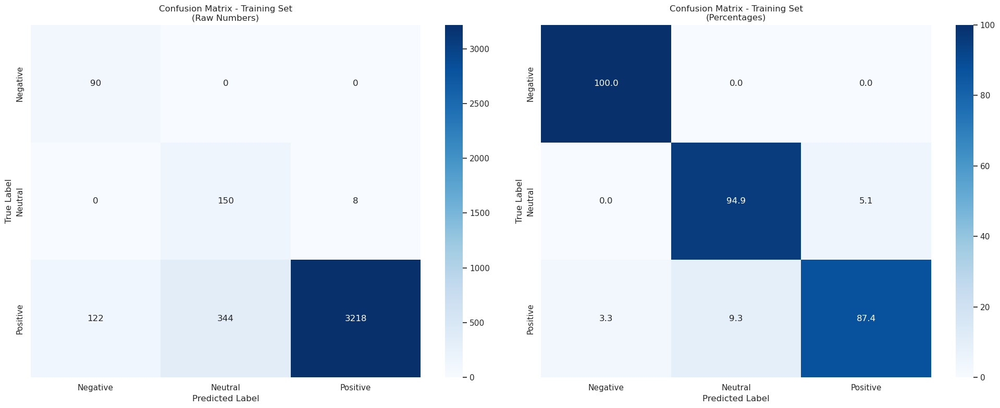


Classification Report - Training Set
              precision    recall  f1-score   support

    Negative       0.42      1.00      0.60        90
     Neutral       0.30      0.95      0.46       158
    Positive       1.00      0.87      0.93      3684

    accuracy                           0.88      3932
   macro avg       0.58      0.94      0.66      3932
weighted avg       0.96      0.88      0.90      3932


Detailed Metrics per Class:
Overall Accuracy: 0.8795

Per-class metrics:

Negative:
Precision: 0.4245
Recall: 1.0000
F1-Score: 0.5960

Neutral:
Precision: 0.3036
Recall: 0.9494
F1-Score: 0.4601

Positive:
Precision: 0.9975
Recall: 0.8735
F1-Score: 0.9314

Creating test embeddings...

Evaluating on Test Set...
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


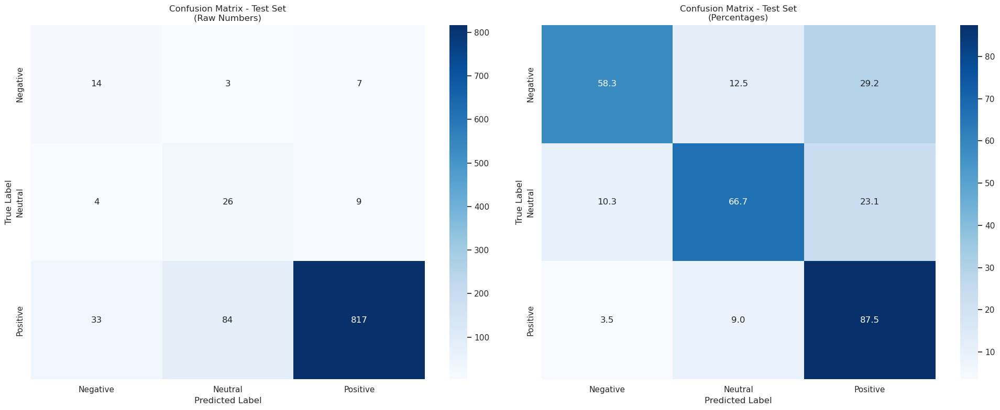


Classification Report - Test Set
              precision    recall  f1-score   support

    Negative       0.27      0.58      0.37        24
     Neutral       0.23      0.67      0.34        39
    Positive       0.98      0.87      0.92       934

    accuracy                           0.86       997
   macro avg       0.50      0.71      0.55       997
weighted avg       0.93      0.86      0.89       997


Detailed Metrics per Class:
Overall Accuracy: 0.8596

Per-class metrics:

Negative:
Precision: 0.2745
Recall: 0.5833
F1-Score: 0.3733

Neutral:
Precision: 0.2301
Recall: 0.6667
F1-Score: 0.3421

Positive:
Precision: 0.9808
Recall: 0.8747
F1-Score: 0.9247

Test predictions saved as 'sentiment_test_w2v.csv'

Analyzing Training Set Misclassifications:

Misclassified Examples:
Original Text | True Label | Predicted Label | Confidence
--------------------------------------------------------------------------------
Great for kids or smaller needs Purchased this for my son Has room to

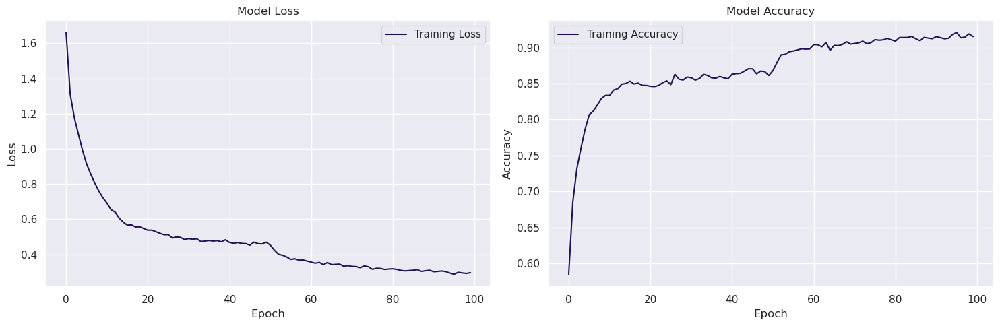


Models saved as 'neural_network_w2v.h5' and 'word2vec_model.model'


In [ ]:
import numpy as np
import pandas as pd
from gensim.models import Word2Vec
import nltk
from nltk.tokenize import word_tokenize
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.regularizers import l2
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report
from imblearn.over_sampling import SMOTE
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Download NLTK data
try:
    nltk.data.find('tokenizers/punkt')
except LookupError:
    print("Downloading NLTK punkt data...")
    nltk.download('punkt', quiet=True)
    print("Download complete.")

# Download required NLTK data
nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('wordnet')
nltk.download('omw-1.4')

# 1. Data preparation
print("Starting data preparation...")
le = LabelEncoder()
y = le.fit_transform(df_train['sentiment'])

# 2. Word2Vec embeddings
print("Creating Word2Vec embeddings...")

def preprocess_for_w2v(texts):
    return [word_tokenize(str(text).lower()) for text in texts]

# Tokenize texts
print("Tokenizing texts...")
tokenized_texts = preprocess_for_w2v(df_train['combined_review_cleaned'])

# Train Word2Vec model
print("Training Word2Vec model...")
w2v_model = Word2Vec(
    sentences=tokenized_texts,
    vector_size=300,  # Embedding dimension
    window=5,         # Context window size
    min_count=1,      # Minimum word frequency
    workers=4,        # Number of CPU cores to use
    sg=1             # Skip-gram model (vs CBOW)
)

# Create document embeddings by averaging word vectors
def get_doc_embedding(text):
    words = word_tokenize(str(text).lower())
    word_vectors = [w2v_model.wv[word] for word in words if word in w2v_model.wv]
    return np.mean(word_vectors, axis=0) if word_vectors else np.zeros(300)

print("Creating document embeddings...")
X = np.array([get_doc_embedding(text) for text in df_train['combined_review_cleaned']])

# 3. Apply SMOTE on entire training data
print("\nApplying SMOTE...")
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

print("Original dataset shape:", dict(zip(np.unique(y), np.bincount(y))))
print("Resampled dataset shape:", dict(zip(np.unique(y_resampled), np.bincount(y_resampled))))

# 4. Create neural network model
print("\nCreating neural network...")
l2_lambda = 0.001
model = Sequential([
    Dense(300, activation='relu', input_shape=(300,), kernel_regularizer=l2(l2_lambda)),
    BatchNormalization(),
    Dropout(0.5),
    
    Dense(256, activation='relu', kernel_regularizer=l2(l2_lambda)),
    BatchNormalization(),
    Dropout(0.5),
    
    Dense(128, activation='relu', kernel_regularizer=l2(l2_lambda)),
    BatchNormalization(),
    Dropout(0.4),
    
    Dense(64, activation='relu', kernel_regularizer=l2(l2_lambda)),
    BatchNormalization(),
    Dropout(0.3),
    
    Dense(3, activation='softmax')
])

# 5. Compile model
initial_learning_rate = 0.001
optimizer = tf.keras.optimizers.Adam(learning_rate=initial_learning_rate)

model.compile(
    optimizer=optimizer,
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# 6. Callbacks
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=10,
        restore_best_weights=True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='loss',
        factor=0.2,
        patience=5,
        min_lr=0.00001
    ),
    tf.keras.callbacks.ModelCheckpoint(
        'best_model_w2v.h5',
        monitor='loss',
        save_best_only=True
    )
]

# 7. Train on entire resampled data
print("\nTraining neural network...")
history = model.fit(
    X_resampled,
    y_resampled,
    epochs=100,
    batch_size=64,
    callbacks=callbacks
)

# 8. Evaluation function
def create_confusion_matrix(X, y, dataset_name):
    predictions = model.predict(X)
    pred_classes = np.argmax(predictions, axis=1)
    
    # Calculate confusion matrices
    cm = confusion_matrix(y, pred_classes)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))
    
    # Plot raw numbers
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax1)
    ax1.set_title(f'Confusion Matrix - {dataset_name}\n(Raw Numbers)')
    ax1.set_ylabel('True Label')
    ax1.set_xlabel('Predicted Label')
    
    # Plot percentages
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax2)
    ax2.set_title(f'Confusion Matrix - {dataset_name}\n(Percentages)')
    ax2.set_ylabel('True Label')
    ax2.set_xlabel('Predicted Label')
    
    plt.tight_layout()
    plt.show()
    
    # Print classification report
    print(f"\nClassification Report - {dataset_name}")
    print(classification_report(y, pred_classes, target_names=le.classes_))
    
    # Calculate and print individual metrics
    accuracy = accuracy_score(y, pred_classes)
    precision = precision_score(y, pred_classes, average=None)
    recall = recall_score(y, pred_classes, average=None)
    f1 = f1_score(y, pred_classes, average=None)
    
    print("\nDetailed Metrics per Class:")
    print("=" * 80)
    print(f"Overall Accuracy: {accuracy:.4f}")
    print("\nPer-class metrics:")
    for i, class_name in enumerate(le.classes_):
        print(f"\n{class_name}:")
        print(f"Precision: {precision[i]:.4f}")
        print(f"Recall: {recall[i]:.4f}")
        print(f"F1-Score: {f1[i]:.4f}")
    
    return pred_classes, predictions

# 9. Training Set Evaluation
print("\nEvaluating on Training Set...")
train_pred_classes, train_pred_probs = create_confusion_matrix(
    X, y, "Training Set"
)

# 10. Test set evaluation
print("\nCreating test embeddings...")
X_test = np.array([get_doc_embedding(text) for text in df_test['combined_review_cleaned']])
y_test = le.transform(df_test['sentiment'])

print("\nEvaluating on Test Set...")
test_pred_classes, test_pred_probs = create_confusion_matrix(
    X_test, y_test, "Test Set"
)

# 11. Save predictions
df_test['predicted_sentiment_w2v'] = le.inverse_transform(test_pred_classes)
df_test.to_csv('sentiment_test_w2v.csv', index=False)
print("\nTest predictions saved as 'sentiment_test_w2v.csv'")

# 12. Misclassification analysis
def get_misclassified_examples(X_embeddings, y_true, texts, pred_classes, pred_probs, n=5):
    misclassified_idx = np.where(y_true != pred_classes)[0]
    
    print("\nMisclassified Examples:")
    print("Original Text | True Label | Predicted Label | Confidence")
    print("-" * 80)
    
    for idx in misclassified_idx[:n]:
        true_label = le.classes_[y_true[idx]]
        pred_label = le.classes_[pred_classes[idx]]
        confidence = np.max(pred_probs[idx]) * 100
        text = texts[idx][:100] + "..."
        print(f"{text} | {true_label} | {pred_label} | {confidence:.2f}%")

# Get misclassified examples
print("\nAnalyzing Training Set Misclassifications:")
get_misclassified_examples(
    X, 
    y, 
    df_train['combined_review_cleaned'].tolist(),
    train_pred_classes,
    train_pred_probs
)

print("\nAnalyzing Test Set Misclassifications:")
get_misclassified_examples(
    X_test, 
    y_test, 
    df_test['combined_review_cleaned'].tolist(),
    test_pred_classes,
    test_pred_probs
)

# 13. Plot training history
plt.figure(figsize=(15,5))

plt.subplot(1,2,1)
plt.plot(history.history['loss'], label='Training Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# 14. Save models
model.save('neural_network_w2v.h5')
w2v_model.save('word2vec_model.model')
print("\nModels saved as 'neural_network_w2v.h5' and 'word2vec_model.model'")

# 15. Function to predict new texts
def predict_sentiment(texts):
    if isinstance(texts, str):
        texts = [texts]
    embeddings = np.array([get_doc_embedding(text) for text in texts])
    predictions = model.predict(embeddings)
    pred_classes = np.argmax(predictions, axis=1)
    return [le.classes_[pred] for pred in pred_classes]


## 2. Neural Network based Classifier using CountVectoriser

Starting data preparation...
Creating Count Vectors...
Vocabulary size: 2857
Feature matrix shape: (3932, 2857)

Applying SMOTE...
Original dataset shape: {0: 90, 1: 158, 2: 3684}
Resampled dataset shape: {0: 3684, 1: 3684, 2: 3684}

Creating neural network...


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_91 (Dense)                │ (None, 512)            │     1,463,296 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_21          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_133 (Dropout)           │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_22          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_134 (Dropout)           │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_23          │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_135 (Dropout)           │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_24          │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_136 (Dropout)           │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,639,811 (6.26 MB)

 Trainable params: 1,637,891 (6.25 MB)

 Non-trainable params: 1,920 (7.50 KB)


Training model...
Epoch 1/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5821 - loss: 1.9356

173/173 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5827 - loss: 1.9336 - learning_rate: 0.0010
Epoch 2/100
159/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8191 - loss: 1.2526

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8207 - loss: 1.2478 - learning_rate: 0.0010
Epoch 3/100
158/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8676 - loss: 1.0694

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8680 - loss: 1.0657 - learning_rate: 0.0010
Epoch 4/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8840 - loss: 0.9414

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8841 - loss: 0.9412 - learning_rate: 0.0010
Epoch 5/100
158/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8914 - loss: 0.8355

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8915 - loss: 0.8330 - learning_rate: 0.0010
Epoch 6/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8954 - loss: 0.7495

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8954 - loss: 0.7493 - learning_rate: 0.0010
Epoch 7/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9010 - loss: 0.6760

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9010 - loss: 0.6759 - learning_rate: 0.0010
Epoch 8/100
156/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9037 - loss: 0.6198

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9035 - loss: 0.6188 - learning_rate: 0.0010
Epoch 9/100
164/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8994 - loss: 0.5990

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8994 - loss: 0.5980 - learning_rate: 0.0010
Epoch 10/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9023 - loss: 0.5575

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9023 - loss: 0.5574 - learning_rate: 0.0010
Epoch 11/100
153/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9077 - loss: 0.5249

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9075 - loss: 0.5235 - learning_rate: 0.0010
Epoch 12/100
161/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9053 - loss: 0.4986

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9053 - loss: 0.4979 - learning_rate: 0.0010
Epoch 13/100
157/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9068 - loss: 0.4761

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9067 - loss: 0.4754 - learning_rate: 0.0010
Epoch 14/100
168/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9057 - loss: 0.4581

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9058 - loss: 0.4578 - learning_rate: 0.0010
Epoch 15/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9056 - loss: 0.4493 - learning_rate: 0.0010
Epoch 16/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9003 - loss: 0.4694 - learning_rate: 0.0010
Epoch 17/100
167/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9046 - loss: 0.4493

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9046 - loss: 0.4490 - learning_rate: 0.0010
Epoch 18/100
170/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9061 - loss: 0.4298

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9062 - loss: 0.4297 - learning_rate: 0.0010
Epoch 19/100
154/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9049 - loss: 0.4293

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9051 - loss: 0.4287 - learning_rate: 0.0010
Epoch 20/100
167/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9063 - loss: 0.4265

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9064 - loss: 0.4263 - learning_rate: 0.0010
Epoch 21/100
159/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9055 - loss: 0.4269

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9056 - loss: 0.4263 - learning_rate: 0.0010
Epoch 22/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9021 - loss: 0.4305 - learning_rate: 0.0010
Epoch 23/100
172/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9077 - loss: 0.4183

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9077 - loss: 0.4183 - learning_rate: 0.0010
Epoch 24/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9066 - loss: 0.4185 - learning_rate: 0.0010
Epoch 25/100
148/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9086 - loss: 0.4190

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9087 - loss: 0.4180 - learning_rate: 0.0010
Epoch 26/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9088 - loss: 0.4124 - learning_rate: 0.0010
Epoch 27/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9063 - loss: 0.4201 - learning_rate: 0.0010
Epoch 28/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9061 - loss: 0.4180 - learning_rate: 0.0010
Epoch 29/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9069 - loss: 0.4282 - learning_rate: 0.0010
Epoch 30/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9065 - loss: 0.4266 - learning_rate: 0.0010
Epoch 31/100
164/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9098 - loss: 0.4105

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9100 - loss: 0.4094 - learning_rate: 2.0000e-04
Epoch 32/100
157/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9173 - loss: 0.3668

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9172 - loss: 0.3661 - learning_rate: 2.0000e-04
Epoch 33/100
157/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9187 - loss: 0.3522

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9190 - loss: 0.3512 - learning_rate: 2.0000e-04
Epoch 34/100
166/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9197 - loss: 0.3361

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9197 - loss: 0.3358 - learning_rate: 2.0000e-04
Epoch 35/100
158/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9180 - loss: 0.3270

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9181 - loss: 0.3262 - learning_rate: 2.0000e-04
Epoch 36/100
156/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9170 - loss: 0.3209

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9172 - loss: 0.3200 - learning_rate: 2.0000e-04
Epoch 37/100
169/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9192 - loss: 0.3069

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9192 - loss: 0.3067 - learning_rate: 2.0000e-04
Epoch 38/100
171/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9212 - loss: 0.2963

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9212 - loss: 0.2962 - learning_rate: 2.0000e-04
Epoch 39/100
164/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9218 - loss: 0.2882

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9218 - loss: 0.2879 - learning_rate: 2.0000e-04
Epoch 40/100
162/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9214 - loss: 0.2803

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9214 - loss: 0.2799 - learning_rate: 2.0000e-04
Epoch 41/100
156/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9161 - loss: 0.2802

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9164 - loss: 0.2793 - learning_rate: 2.0000e-04
Epoch 42/100
161/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9197 - loss: 0.2670

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9198 - loss: 0.2668 - learning_rate: 2.0000e-04
Epoch 43/100
172/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9209 - loss: 0.2595

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9209 - loss: 0.2594 - learning_rate: 2.0000e-04
Epoch 44/100
164/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9245 - loss: 0.2542

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9244 - loss: 0.2540 - learning_rate: 2.0000e-04
Epoch 45/100
168/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9206 - loss: 0.2517

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9207 - loss: 0.2516 - learning_rate: 2.0000e-04
Epoch 46/100
157/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9209 - loss: 0.2497

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9213 - loss: 0.2491 - learning_rate: 2.0000e-04
Epoch 47/100
159/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9212 - loss: 0.2438

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9212 - loss: 0.2436 - learning_rate: 2.0000e-04
Epoch 48/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9258 - loss: 0.2419 - learning_rate: 2.0000e-04
Epoch 49/100
159/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9214 - loss: 0.2409

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9215 - loss: 0.2407 - learning_rate: 2.0000e-04
Epoch 50/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9195 - loss: 0.2454 - learning_rate: 2.0000e-04
Epoch 51/100
159/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9250 - loss: 0.2364

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9248 - loss: 0.2363 - learning_rate: 2.0000e-04
Epoch 52/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9217 - loss: 0.2398 - learning_rate: 2.0000e-04
Epoch 53/100
166/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9233 - loss: 0.2346

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9233 - loss: 0.2345 - learning_rate: 2.0000e-04
Epoch 54/100
159/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9229 - loss: 0.2302

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9230 - loss: 0.2299 - learning_rate: 2.0000e-04
Epoch 55/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9241 - loss: 0.2316

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9241 - loss: 0.2315 - learning_rate: 2.0000e-04
Epoch 56/100
162/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9228 - loss: 0.2319

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9229 - loss: 0.2314 - learning_rate: 2.0000e-04
Epoch 57/100
162/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9219 - loss: 0.2248

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9219 - loss: 0.2247 - learning_rate: 2.0000e-04
Epoch 58/100
161/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9241 - loss: 0.2252

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9241 - loss: 0.2249 - learning_rate: 2.0000e-04
Epoch 59/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9262 - loss: 0.2208 - learning_rate: 2.0000e-04
Epoch 60/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9223 - loss: 0.2274 - learning_rate: 2.0000e-04
Epoch 61/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9226 - loss: 0.2216 - learning_rate: 2.0000e-04
Epoch 62/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9254 - loss: 0.2226 - learning_rate: 2.0000e-04
Epoch 63/100
150/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9223 - loss: 0.2236

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9225 - loss: 0.2228 - learning_rate: 2.0000e-04
Epoch 64/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9241 - loss: 0.2237 - learning_rate: 2.0000e-04
Epoch 65/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9278 - loss: 0.2213 - learning_rate: 2.0000e-04
Epoch 66/100
167/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9242 - loss: 0.2191

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9242 - loss: 0.2190 - learning_rate: 2.0000e-04
Epoch 67/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9231 - loss: 0.2219 - learning_rate: 2.0000e-04
Epoch 68/100
162/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9234 - loss: 0.2209

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9235 - loss: 0.2205 - learning_rate: 2.0000e-04
Epoch 69/100
160/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9240 - loss: 0.2135

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9240 - loss: 0.2134 - learning_rate: 2.0000e-04
Epoch 70/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9260 - loss: 0.2121

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9260 - loss: 0.2121 - learning_rate: 2.0000e-04
Epoch 71/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9221 - loss: 0.2188 - learning_rate: 2.0000e-04
Epoch 72/100
161/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9247 - loss: 0.2176

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9249 - loss: 0.2172 - learning_rate: 2.0000e-04
Epoch 73/100
171/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9254 - loss: 0.2123

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9254 - loss: 0.2123 - learning_rate: 2.0000e-04
Epoch 74/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9245 - loss: 0.2166 - learning_rate: 2.0000e-04
Epoch 75/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9239 - loss: 0.2163 - learning_rate: 2.0000e-04
Epoch 76/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9243 - loss: 0.2168 - learning_rate: 2.0000e-04
Epoch 77/100
159/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9264 - loss: 0.2121

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9265 - loss: 0.2118 - learning_rate: 2.0000e-04
Epoch 78/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9260 - loss: 0.2129 - learning_rate: 2.0000e-04
Epoch 79/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9211 - loss: 0.2235 - learning_rate: 2.0000e-04
Epoch 80/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9276 - loss: 0.2102 - learning_rate: 2.0000e-04
Epoch 81/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9257 - loss: 0.2140 - learning_rate: 2.0000e-04
Epoch 82/100
167/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9218 - loss: 0.2130

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9220 - loss: 0.2128 - learning_rate: 2.0000e-04
Epoch 83/100
159/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9263 - loss: 0.2093

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9264 - loss: 0.2091 - learning_rate: 2.0000e-04
Epoch 84/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9280 - loss: 0.2137 - learning_rate: 2.0000e-04
Epoch 85/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9264 - loss: 0.2091 - learning_rate: 2.0000e-04
Epoch 86/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9247 - loss: 0.2110 - learning_rate: 2.0000e-04
Epoch 87/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9258 - loss: 0.2088 - learning_rate: 2.0000e-04
Epoch 88/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9234 - loss: 0.2161 - learning_rate: 2.0000e-04
Epoch 89/100
157/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9277 - loss: 0.2083

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9276 - loss: 0.2081 - learning_rate: 4.0000e-05
Epoch 90/100
154/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9298 - loss: 0.2034

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9298 - loss: 0.2031 - learning_rate: 4.0000e-05
Epoch 91/100
154/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9277 - loss: 0.1994

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9278 - loss: 0.1991 - learning_rate: 4.0000e-05
Epoch 92/100
159/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9339 - loss: 0.1963

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9338 - loss: 0.1962 - learning_rate: 4.0000e-05
Epoch 93/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9273 - loss: 0.2010 - learning_rate: 4.0000e-05
Epoch 94/100
164/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9293 - loss: 0.1964

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9293 - loss: 0.1963 - learning_rate: 4.0000e-05
Epoch 95/100
156/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9311 - loss: 0.1954

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9310 - loss: 0.1953 - learning_rate: 4.0000e-05
Epoch 96/100
156/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9303 - loss: 0.1943

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9303 - loss: 0.1942 - learning_rate: 4.0000e-05
Epoch 97/100
161/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9331 - loss: 0.1894

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9330 - loss: 0.1893 - learning_rate: 4.0000e-05
Epoch 98/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9314 - loss: 0.1909 - learning_rate: 4.0000e-05
Epoch 99/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9285 - loss: 0.1927 - learning_rate: 4.0000e-05
Epoch 100/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9306 - loss: 0.1892 - learning_rate: 4.0000e-05

Evaluating on Training Set...
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


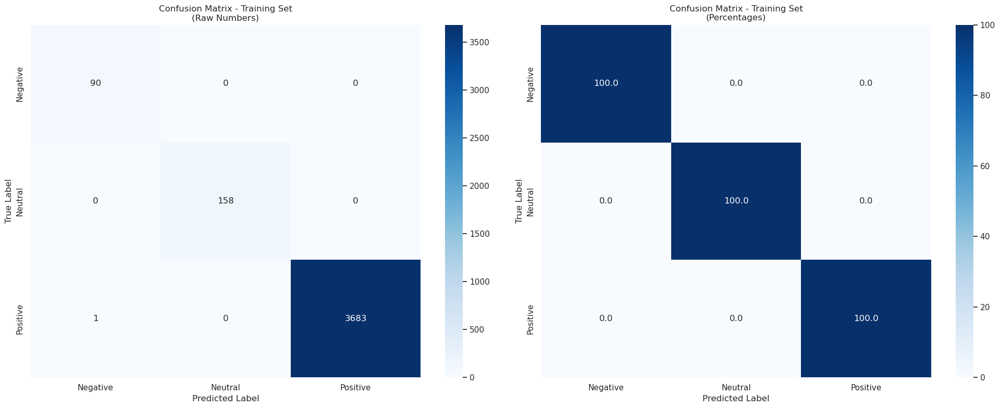


Classification Report - Training Set
              precision    recall  f1-score   support

    Negative       0.99      1.00      0.99        90
     Neutral       1.00      1.00      1.00       158
    Positive       1.00      1.00      1.00      3684

    accuracy                           1.00      3932
   macro avg       1.00      1.00      1.00      3932
weighted avg       1.00      1.00      1.00      3932


Detailed Metrics per Class:
Overall Accuracy: 0.9997

Per-class metrics:

Negative:
Precision: 0.9890
Recall: 1.0000
F1-Score: 0.9945

Neutral:
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000

Positive:
Precision: 1.0000
Recall: 0.9997
F1-Score: 0.9999

Processing test set...

Evaluating on Test Set...
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


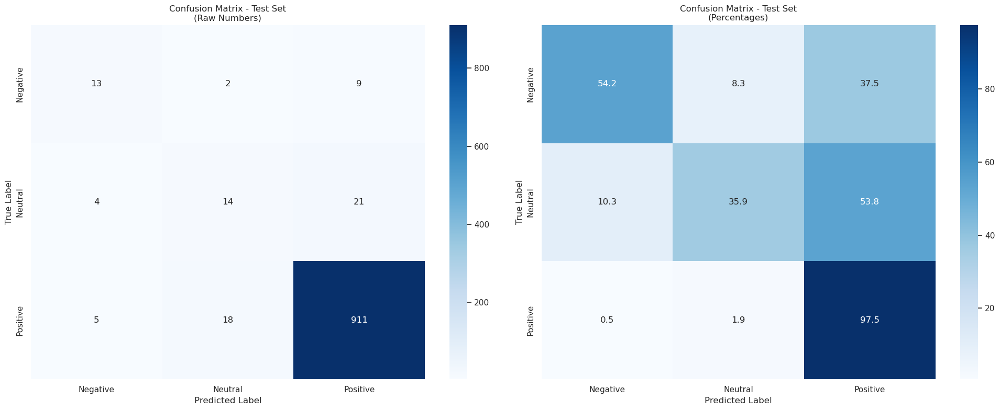


Classification Report - Test Set
              precision    recall  f1-score   support

    Negative       0.59      0.54      0.57        24
     Neutral       0.41      0.36      0.38        39
    Positive       0.97      0.98      0.97       934

    accuracy                           0.94       997
   macro avg       0.66      0.63      0.64       997
weighted avg       0.94      0.94      0.94       997


Detailed Metrics per Class:
Overall Accuracy: 0.9408

Per-class metrics:

Negative:
Precision: 0.5909
Recall: 0.5417
F1-Score: 0.5652

Neutral:
Precision: 0.4118
Recall: 0.3590
F1-Score: 0.3836

Positive:
Precision: 0.9681
Recall: 0.9754
F1-Score: 0.9717

Test predictions saved as 'sentiment_test_countvec.csv'

Analyzing Training Set Misclassifications:

Misclassified Examples:
Original Text | True Label | Predicted Label | Confidence
--------------------------------------------------------------------------------
Great Great... | Positive | Negative | 99.88%

Analyzing Test Se

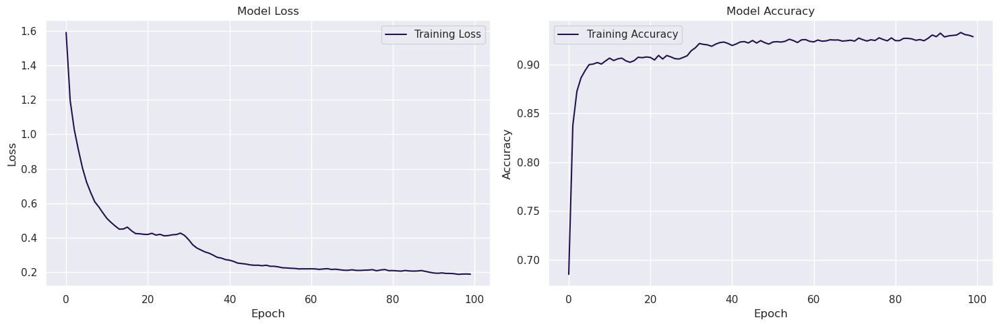


Model and vectorizer saved

Top features for each class:

Top 20 features for Negative:
browser: 0.0205
generally: 0.0207
searching: 0.0213
comparable: 0.0216
bedt: 0.0224
overall: 0.0225
moving: 0.0231
biggest: 0.0233
distracting: 0.0239
kiddie: 0.0248
fan: 0.0257
build: 0.0263
brief: 0.0265
filled: 0.0280
cameras: 0.0304
sound: 0.0310
charger: 0.0313
switch: 0.0371
cord: 0.0419
costly: 0.0474

Top 20 features for Neutral:
short: 0.0207
kiddie: 0.0212
bumper: 0.0214
player: 0.0215
costly: 0.0221
occasionally: 0.0223
informative: 0.0223
tony: 0.0245
ultimately: 0.0245
users: 0.0248
trip: 0.0257
tons: 0.0258
pro: 0.0289
hit: 0.0310
30: 0.0373
works: 0.0400
amd: 0.0413
restricted: 0.0415
inside: 0.0430
surroundings: 0.0489

Top 20 features for Positive:
wore: 0.0259
surprises: 0.0260
earlier: 0.0261
strong: 0.0267
turning: 0.0271
needless: 0.0275
45: 0.0277
fare: 0.0280
steal: 0.0291
switch: 0.0297
filled: 0.0303
reset: 0.0315
rave: 0.0321
multi: 0.0331
world: 0.0350
shipping: 0.0363
up

In [ ]:
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.regularizers import l2
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report
from imblearn.over_sampling import SMOTE
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# 1. Data preparation
print("Starting data preparation...")
le = LabelEncoder()
y = le.fit_transform(df_train['sentiment'])

print("Creating Count Vectors...")
vectorizer = CountVectorizer(
    max_features=5000,  # Limit vocabulary size
    min_df=2,          # Minimum document frequency
    max_df=0.95,       # Maximum document frequency
    stop_words='english'
)

X = vectorizer.fit_transform(df_train['combined_review_cleaned']).toarray()
vocab_size = X.shape[1]  # Get actual vocabulary size
print(f"Vocabulary size: {vocab_size}")
print(f"Feature matrix shape: {X.shape}")

# 3. Apply SMOTE on entire training data
print("\nApplying SMOTE...")
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

print("Original dataset shape:", dict(zip(np.unique(y), np.bincount(y))))
print("Resampled dataset shape:", dict(zip(np.unique(y_resampled), np.bincount(y_resampled))))

# 4. Create model
print("\nCreating neural network...")
l2_lambda = 0.001
model = Sequential([
    Dense(512, activation='relu', input_shape=(vocab_size,), kernel_regularizer=l2(l2_lambda)),
    BatchNormalization(),
    Dropout(0.5),
    
    Dense(256, activation='relu', kernel_regularizer=l2(l2_lambda)),
    BatchNormalization(),
    Dropout(0.5),
    
    Dense(128, activation='relu', kernel_regularizer=l2(l2_lambda)),
    BatchNormalization(),
    Dropout(0.4),
    
    Dense(64, activation='relu', kernel_regularizer=l2(l2_lambda)),
    BatchNormalization(),
    Dropout(0.3),
    
    Dense(3, activation='softmax')
])

# 5. Compile model
initial_learning_rate = 0.001
optimizer = tf.keras.optimizers.Adam(learning_rate=initial_learning_rate)

model.compile(
    optimizer=optimizer,
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Print model summary
model.summary()

# 6. Callbacks
# callbacks = [
#     tf.keras.callbacks.EarlyStopping(
#         monitor='loss',
#         patience=10,
#         restore_best_weights=True
#     ),
#     tf.keras.callbacks.ReduceLROnPlateau(
#         monitor='loss',
#         factor=0.2,
#         patience=5,
#         min_lr=0.00001
#     ),
#     tf.keras.callbacks.ModelCheckpoint(
#         'best_count_vectorizer_model.h5',
#         monitor='loss',
#         save_best_weights_only=True
#     )
# ]

# 6. Callbacks
# callbacks = [
#     tf.keras.callbacks.EarlyStopping(
#         monitor='loss',
#         patience=10,
#         restore_best_weights=True
#     ),
#     tf.keras.callbacks.ReduceLROnPlateau(
#         monitor='loss',
#         factor=0.2,
#         patience=5,
#         min_lr=0.00001
#     ),
#     tf.keras.callbacks.ModelCheckpoint(
#         'best_count_vectorizer_model.h5',
#         monitor='loss',
#         save_best_model=True  # Changed from save_best_weights_only
#     )
# ]

# 6. Callbacks
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=10,
        restore_best_weights=True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='loss',
        factor=0.2,
        patience=5,
        min_lr=0.00001
    ),
    tf.keras.callbacks.ModelCheckpoint(
        filepath='best_count_vectorizer_model.h5',
        monitor='loss',
        save_best_only=True  # Correct parameter name
    )
]


# 7. Train on entire resampled data
print("\nTraining model...")
history = model.fit(
    X_resampled,
    y_resampled,
    epochs=100,
    batch_size=64,
    callbacks=callbacks,
    verbose=1
)

# 8. Evaluation function
def create_confusion_matrix(X, y, dataset_name):
    predictions = model.predict(X)
    pred_classes = np.argmax(predictions, axis=1)
    
    # Calculate confusion matrices
    cm = confusion_matrix(y, pred_classes)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))
    
    # Plot raw numbers
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax1)
    ax1.set_title(f'Confusion Matrix - {dataset_name}\n(Raw Numbers)')
    ax1.set_ylabel('True Label')
    ax1.set_xlabel('Predicted Label')
    
    # Plot percentages
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax2)
    ax2.set_title(f'Confusion Matrix - {dataset_name}\n(Percentages)')
    ax2.set_ylabel('True Label')
    ax2.set_xlabel('Predicted Label')
    
    plt.tight_layout()
    plt.show()
    
    # Print classification report
    print(f"\nClassification Report - {dataset_name}")
    print(classification_report(y, pred_classes, target_names=le.classes_))
    
    # Calculate and print individual metrics
    accuracy = accuracy_score(y, pred_classes)
    precision = precision_score(y, pred_classes, average=None)
    recall = recall_score(y, pred_classes, average=None)
    f1 = f1_score(y, pred_classes, average=None)
    
    print("\nDetailed Metrics per Class:")
    print("=" * 80)
    print(f"Overall Accuracy: {accuracy:.4f}")
    print("\nPer-class metrics:")
    for i, class_name in enumerate(le.classes_):
        print(f"\n{class_name}:")
        print(f"Precision: {precision[i]:.4f}")
        print(f"Recall: {recall[i]:.4f}")
        print(f"F1-Score: {f1[i]:.4f}")
    
    return pred_classes, predictions

# 9. Training Set Evaluation
print("\nEvaluating on Training Set...")
train_pred_classes, train_pred_probs = create_confusion_matrix(
    X, y, "Training Set"
)

# 10. Test set evaluation
print("\nProcessing test set...")
X_test = vectorizer.transform(df_test['combined_review_cleaned']).toarray()
y_test = le.transform(df_test['sentiment'])

print("\nEvaluating on Test Set...")
test_pred_classes, test_pred_probs = create_confusion_matrix(
    X_test, y_test, "Test Set"
)

# 11. Save predictions
df_test['predicted_sentiment_countvec'] = le.inverse_transform(test_pred_classes)
df_test.to_csv('sentiment_test_countvec.csv', index=False)
print("\nTest predictions saved as 'sentiment_test_countvec.csv'")

# 12. Misclassification analysis
def get_misclassified_examples(X_features, y_true, texts, pred_classes, pred_probs, n=5):
    misclassified_idx = np.where(y_true != pred_classes)[0]
    
    print("\nMisclassified Examples:")
    print("Original Text | True Label | Predicted Label | Confidence")
    print("-" * 80)
    
    for idx in misclassified_idx[:n]:
        true_label = le.classes_[y_true[idx]]
        pred_label = le.classes_[pred_classes[idx]]
        confidence = np.max(pred_probs[idx]) * 100
        text = texts[idx][:100] + "..."
        print(f"{text} | {true_label} | {pred_label} | {confidence:.2f}%")

print("\nAnalyzing Training Set Misclassifications:")
get_misclassified_examples(
    X, 
    y, 
    df_train['combined_review_cleaned'].tolist(),
    train_pred_classes,
    train_pred_probs
)

print("\nAnalyzing Test Set Misclassifications:")
get_misclassified_examples(
    X_test, 
    y_test, 
    df_test['combined_review_cleaned'].tolist(),
    test_pred_classes,
    test_pred_probs
)

# 13. Plot training history
plt.figure(figsize=(15,5))

# Loss plot
plt.subplot(1,2,1)
plt.plot(history.history['loss'], label='Training Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Accuracy plot
plt.subplot(1,2,2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# 14. Save the model and vectorizer
model.save('countvec_model.h5')
import joblib
joblib.dump(vectorizer, 'count_vectorizer.joblib')
print("\nModel and vectorizer saved")

# 15. Function to predict new texts
def predict_sentiment(texts):
    # Transform texts using the fitted vectorizer
    X_new = vectorizer.transform(texts).toarray()
    # Get predictions
    predictions = model.predict(X_new)
    pred_classes = np.argmax(predictions, axis=1)
    return [(le.classes_[pred], max(probs)) for pred, probs in zip(pred_classes, predictions)]

# 16. Analyze top features
def print_top_features(n=20):
    print("\nTop features for each class:")
    feature_names = np.array(list(vectorizer.vocabulary_.keys()))
    
    for class_idx, class_name in enumerate(le.classes_):
        print(f"\nTop {n} features for {class_name}:")
        
        # Get weights from the first dense layer for this class
        class_weights = model.layers[0].get_weights()[0][:, class_idx]
        
        # Get top feature indices
        top_indices = np.argsort(class_weights)[-n:]
        
        for idx in top_indices:
            print(f"{feature_names[idx]}: {class_weights[idx]:.4f}")

print_top_features()

print("\nCountVectorizer + Neural Network Model Training and Evaluation Complete!")


## 3. Neural Network based Classifier using TFIDF

Starting data preparation...
Creating TF-IDF vectors...
Vocabulary size: 5000
Feature matrix shape: (3932, 5000)

Applying SMOTE...
Original dataset shape: {0: 90, 1: 158, 2: 3684}
Resampled dataset shape: {0: 3684, 1: 3684, 2: 3684}

Creating neural network...


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_96 (Dense)                │ (None, 512)            │     2,560,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_25          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_137 (Dropout)           │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_26          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_138 (Dropout)           │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_98 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_27          │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_139 (Dropout)           │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_28          │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_140 (Dropout)           │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_100 (Dense)               │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,737,027 (10.44 MB)

 Trainable params: 2,735,107 (10.43 MB)

 Non-trainable params: 1,920 (7.50 KB)


Training model...
Epoch 1/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.6381 - loss: 1.9269

173/173 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6392 - loss: 1.9240 - learning_rate: 0.0010
Epoch 2/100
156/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9801 - loss: 0.9820

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9808 - loss: 0.9767 - learning_rate: 0.0010
Epoch 3/100
156/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9948 - loss: 0.8143

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9948 - loss: 0.8107 - learning_rate: 0.0010
Epoch 4/100
166/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9959 - loss: 0.6845

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9959 - loss: 0.6832 - learning_rate: 0.0010
Epoch 5/100
161/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9950 - loss: 0.5836

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9950 - loss: 0.5819 - learning_rate: 0.0010
Epoch 6/100
167/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9941 - loss: 0.4997

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9941 - loss: 0.4990 - learning_rate: 0.0010
Epoch 7/100
150/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9946 - loss: 0.4387

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9947 - loss: 0.4369 - learning_rate: 0.0010
Epoch 8/100
159/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9940 - loss: 0.3829

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9939 - loss: 0.3826 - learning_rate: 0.0010
Epoch 9/100
160/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9914 - loss: 0.3671

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9914 - loss: 0.3665 - learning_rate: 0.0010
Epoch 10/100
159/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9927 - loss: 0.3300

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9928 - loss: 0.3293 - learning_rate: 0.0010
Epoch 11/100
159/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9946 - loss: 0.3009

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9946 - loss: 0.3003 - learning_rate: 0.0010
Epoch 12/100
169/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9939 - loss: 0.2699

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9939 - loss: 0.2695 - learning_rate: 0.0010
Epoch 13/100
148/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9935 - loss: 0.2324

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9936 - loss: 0.2330 - learning_rate: 0.0010
Epoch 14/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9919 - loss: 0.2467 - learning_rate: 0.0010
Epoch 15/100
153/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9938 - loss: 0.2305

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9938 - loss: 0.2306 - learning_rate: 0.0010
Epoch 16/100
162/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9967 - loss: 0.2025

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9967 - loss: 0.2021 - learning_rate: 0.0010
Epoch 17/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9942 - loss: 0.1935 - learning_rate: 0.0010
Epoch 18/100
159/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9958 - loss: 0.1949

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9958 - loss: 0.1948 - learning_rate: 0.0010
Epoch 19/100
166/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9948 - loss: 0.1872

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9947 - loss: 0.1874 - learning_rate: 0.0010
Epoch 20/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9924 - loss: 0.2038 - learning_rate: 0.0010
Epoch 21/100
163/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9964 - loss: 0.1718

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9964 - loss: 0.1718 - learning_rate: 0.0010
Epoch 22/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9935 - loss: 0.1870 - learning_rate: 0.0010
Epoch 23/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9942 - loss: 0.1778 - learning_rate: 0.0010
Epoch 24/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9939 - loss: 0.1910 - learning_rate: 0.0010
Epoch 25/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9935 - loss: 0.1871 - learning_rate: 0.0010
Epoch 26/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9957 - loss: 0.1797 - learning_rate: 0.0010
Epoch 27/100
156/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9959 - loss: 0.1669

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9961 - loss: 0.1661 - learning_rate: 2.0000e-04
Epoch 28/100
158/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9991 - loss: 0.1447

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9991 - loss: 0.1444 - learning_rate: 2.0000e-04
Epoch 29/100
153/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9990 - loss: 0.1332

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9989 - loss: 0.1328 - learning_rate: 2.0000e-04
Epoch 30/100
167/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9997 - loss: 0.1197

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9997 - loss: 0.1196 - learning_rate: 2.0000e-04
Epoch 31/100
155/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9995 - loss: 0.1097

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9995 - loss: 0.1094 - learning_rate: 2.0000e-04
Epoch 32/100
172/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9993 - loss: 0.1019

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9993 - loss: 0.1019 - learning_rate: 2.0000e-04
Epoch 33/100
166/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 0.0903

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 1.0000 - loss: 0.0902 - learning_rate: 2.0000e-04
Epoch 34/100
164/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9996 - loss: 0.0832

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9996 - loss: 0.0830 - learning_rate: 2.0000e-04
Epoch 35/100
160/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9997 - loss: 0.0742

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9997 - loss: 0.0741 - learning_rate: 2.0000e-04
Epoch 36/100
152/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9994 - loss: 0.0699

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9994 - loss: 0.0696 - learning_rate: 2.0000e-04
Epoch 37/100
167/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9992 - loss: 0.0629

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9992 - loss: 0.0629 - learning_rate: 2.0000e-04
Epoch 38/100
170/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9986 - loss: 0.0604

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9986 - loss: 0.0604 - learning_rate: 2.0000e-04
Epoch 39/100
162/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9981 - loss: 0.0585

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9981 - loss: 0.0585 - learning_rate: 2.0000e-04
Epoch 40/100
158/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9977 - loss: 0.0601

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9978 - loss: 0.0598 - learning_rate: 2.0000e-04
Epoch 41/100
162/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9977 - loss: 0.0552

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9977 - loss: 0.0551 - learning_rate: 2.0000e-04
Epoch 42/100
167/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9988 - loss: 0.0511

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9988 - loss: 0.0510 - learning_rate: 2.0000e-04
Epoch 43/100
161/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9990 - loss: 0.0448

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9990 - loss: 0.0448 - learning_rate: 2.0000e-04
Epoch 44/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9976 - loss: 0.0480 - learning_rate: 2.0000e-04
Epoch 45/100
167/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9988 - loss: 0.0442

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9988 - loss: 0.0442 - learning_rate: 2.0000e-04
Epoch 46/100
165/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9987 - loss: 0.0415

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9986 - loss: 0.0415 - learning_rate: 2.0000e-04
Epoch 47/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9978 - loss: 0.0434 - learning_rate: 2.0000e-04
Epoch 48/100
160/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9984 - loss: 0.0434

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9984 - loss: 0.0433 - learning_rate: 2.0000e-04
Epoch 49/100
157/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9988 - loss: 0.0391

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9988 - loss: 0.0392 - learning_rate: 2.0000e-04
Epoch 50/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9978 - loss: 0.0425 - learning_rate: 2.0000e-04
Epoch 51/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9981 - loss: 0.0415 - learning_rate: 2.0000e-04
Epoch 52/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9978 - loss: 0.0428 - learning_rate: 2.0000e-04
Epoch 53/100
161/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9975 - loss: 0.0434

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9976 - loss: 0.0430 - learning_rate: 2.0000e-04
Epoch 54/100
172/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9982 - loss: 0.0394

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9982 - loss: 0.0394 - learning_rate: 2.0000e-04
Epoch 55/100
166/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9987 - loss: 0.0361

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9987 - loss: 0.0360 - learning_rate: 2.0000e-04
Epoch 56/100
151/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9990 - loss: 0.0342

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9990 - loss: 0.0342 - learning_rate: 2.0000e-04
Epoch 57/100
170/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9987 - loss: 0.0335

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9987 - loss: 0.0335 - learning_rate: 2.0000e-04
Epoch 58/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9972 - loss: 0.0371 - learning_rate: 2.0000e-04
Epoch 59/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9977 - loss: 0.0371 - learning_rate: 2.0000e-04
Epoch 60/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9984 - loss: 0.0357 - learning_rate: 2.0000e-04
Epoch 61/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9976 - loss: 0.0390 - learning_rate: 2.0000e-04
Epoch 62/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9981 - loss: 0.0385 - learning_rate: 2.0000e-04
Epoch 63/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9985 - loss: 0.0376 - learning_rate: 4.0000e-05
Epoch 64/100
170/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9994 - loss: 0.0323

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9994 - loss: 0.0323 - learning_rate: 4.0000e-05
Epoch 65/100
165/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9998 - loss: 0.0311

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9998 - loss: 0.0311 - learning_rate: 4.0000e-05
Epoch 66/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9991 - loss: 0.0318 - learning_rate: 4.0000e-05
Epoch 67/100
168/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9997 - loss: 0.0302

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9997 - loss: 0.0302 - learning_rate: 4.0000e-05
Epoch 68/100
155/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9994 - loss: 0.0298

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9994 - loss: 0.0298 - learning_rate: 4.0000e-05
Epoch 69/100
160/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9996 - loss: 0.0290

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9995 - loss: 0.0290 - learning_rate: 4.0000e-05
Epoch 70/100
153/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9993 - loss: 0.0283

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9993 - loss: 0.0284 - learning_rate: 4.0000e-05
Epoch 71/100
160/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9999 - loss: 0.0267

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9999 - loss: 0.0267 - learning_rate: 4.0000e-05
Epoch 72/100
151/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 0.0261

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9999 - loss: 0.0261 - learning_rate: 4.0000e-05
Epoch 73/100
157/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9998 - loss: 0.0260

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9998 - loss: 0.0259 - learning_rate: 4.0000e-05
Epoch 74/100
157/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9999 - loss: 0.0247

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9999 - loss: 0.0246 - learning_rate: 4.0000e-05
Epoch 75/100
155/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9999 - loss: 0.0240

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9999 - loss: 0.0240 - learning_rate: 4.0000e-05
Epoch 76/100
148/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9998 - loss: 0.0236

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9998 - loss: 0.0236 - learning_rate: 4.0000e-05
Epoch 77/100
152/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9995 - loss: 0.0230

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9996 - loss: 0.0230 - learning_rate: 4.0000e-05
Epoch 78/100
167/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 0.0221

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 1.0000 - loss: 0.0221 - learning_rate: 4.0000e-05
Epoch 79/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9994 - loss: 0.0234 - learning_rate: 4.0000e-05
Epoch 80/100
167/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9996 - loss: 0.0213

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9996 - loss: 0.0213 - learning_rate: 4.0000e-05
Epoch 81/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9999 - loss: 0.0205 - learning_rate: 4.0000e-05
Epoch 82/100
171/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9994 - loss: 0.0206

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9994 - loss: 0.0206 - learning_rate: 4.0000e-05
Epoch 83/100
158/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9997 - loss: 0.0193

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9997 - loss: 0.0193 - learning_rate: 4.0000e-05
Epoch 84/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9996 - loss: 0.0203 - learning_rate: 4.0000e-05
Epoch 85/100
171/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9999 - loss: 0.0181

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9999 - loss: 0.0181 - learning_rate: 4.0000e-05
Epoch 86/100
168/173 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9999 - loss: 0.0174

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9999 - loss: 0.0174 - learning_rate: 4.0000e-05
Epoch 87/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9996 - loss: 0.0181 - learning_rate: 4.0000e-05
Epoch 88/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9994 - loss: 0.0177 - learning_rate: 4.0000e-05
Epoch 89/100
152/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9997 - loss: 0.0169

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9997 - loss: 0.0169 - learning_rate: 4.0000e-05
Epoch 90/100
164/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 0.0158

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 1.0000 - loss: 0.0158 - learning_rate: 4.0000e-05
Epoch 91/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9998 - loss: 0.0167 - learning_rate: 4.0000e-05
Epoch 92/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9994 - loss: 0.0160

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9994 - loss: 0.0160 - learning_rate: 4.0000e-05
Epoch 93/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9994 - loss: 0.0154 - learning_rate: 4.0000e-05
Epoch 94/100
150/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9999 - loss: 0.0143

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9999 - loss: 0.0142 - learning_rate: 4.0000e-05
Epoch 95/100
171/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9999 - loss: 0.0140

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9999 - loss: 0.0140 - learning_rate: 4.0000e-05
Epoch 96/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9998 - loss: 0.0143 - learning_rate: 4.0000e-05
Epoch 97/100
155/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9997 - loss: 0.0144

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9997 - loss: 0.0143 - learning_rate: 4.0000e-05
Epoch 98/100
156/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 0.0128

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9999 - loss: 0.0129 - learning_rate: 4.0000e-05
Epoch 99/100
156/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9998 - loss: 0.0129

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9998 - loss: 0.0129 - learning_rate: 4.0000e-05
Epoch 100/100
165/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9997 - loss: 0.0127

173/173 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9997 - loss: 0.0127 - learning_rate: 4.0000e-05

Evaluating on Training Set...
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


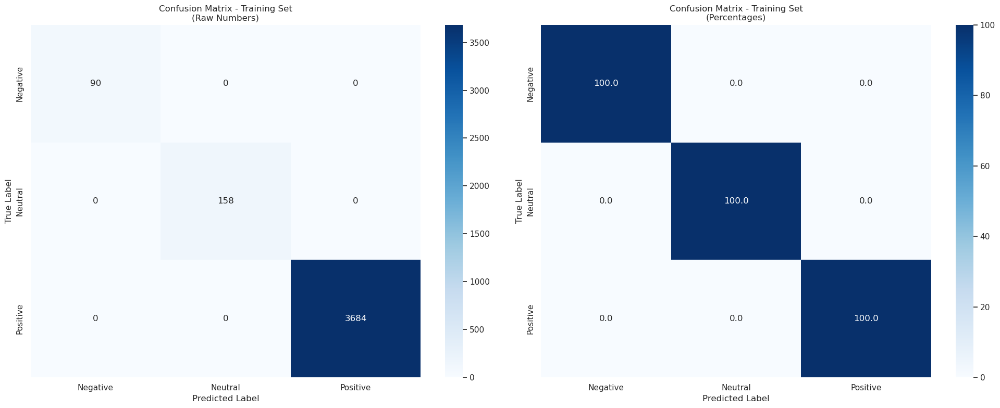


Classification Report - Training Set
              precision    recall  f1-score   support

    Negative       1.00      1.00      1.00        90
     Neutral       1.00      1.00      1.00       158
    Positive       1.00      1.00      1.00      3684

    accuracy                           1.00      3932
   macro avg       1.00      1.00      1.00      3932
weighted avg       1.00      1.00      1.00      3932


Detailed Metrics per Class:
Overall Accuracy: 1.0000

Per-class metrics:

Negative:
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000

Neutral:
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000

Positive:
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000

Processing test set...

Evaluating on Test Set...
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


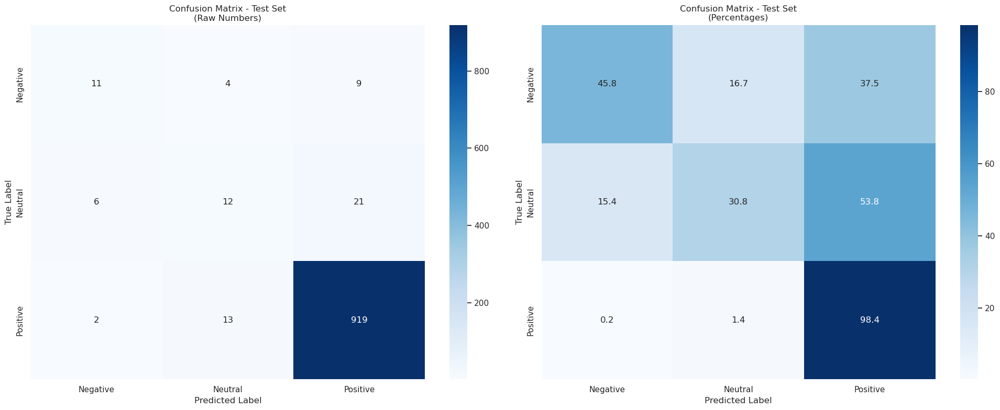


Classification Report - Test Set
              precision    recall  f1-score   support

    Negative       0.58      0.46      0.51        24
     Neutral       0.41      0.31      0.35        39
    Positive       0.97      0.98      0.98       934

    accuracy                           0.94       997
   macro avg       0.65      0.58      0.61       997
weighted avg       0.94      0.94      0.94       997


Detailed Metrics per Class:
Overall Accuracy: 0.9448

Per-class metrics:

Negative:
Precision: 0.5789
Recall: 0.4583
F1-Score: 0.5116

Neutral:
Precision: 0.4138
Recall: 0.3077
F1-Score: 0.3529

Positive:
Precision: 0.9684
Recall: 0.9839
F1-Score: 0.9761

Test predictions saved as 'sentiment_test_tfidf.csv'

Analyzing Training Set Misclassifications:

Misclassified Examples:
Original Text | True Label | Predicted Label | Confidence
--------------------------------------------------------------------------------

Analyzing Test Set Misclassifications:

Misclassified Examples:
Or

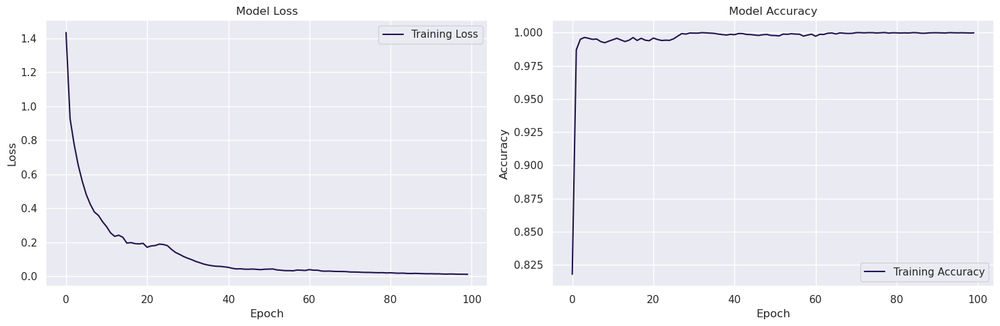


Model and vectorizer saved

Top TF-IDF features for each class:

Top 20 features for Negative:
loves good: 0.0000
children great: 0.0000
nice like: 0.0000
apps like: 0.0000
time internet: 0.0000
1st generation: 0.0000
children easy: 0.0000
works expected: 0.0000
basic: 0.0000
angle: 0.0000
ordered: 0.0000
started using: 0.0000
inch size: 0.0000
tablet time: 0.0000
set easy: 0.0000
easy figure: 0.0000
source: 0.0000
connect: 0.0000
middle: 0.0000
basic internet: 0.0000

Top 20 features for Neutral:
nephew: 0.0024
built: 0.0025
versions: 0.0025
life easier: 0.0026
products great: 0.0030
say: 0.0039
lasts: 0.0041
tried: 0.0052
constantly trying: 0.0057
set easy: 0.0091
wireless needs: 0.0109
quality speaker: 0.0131
best feature: 0.0141
asking alexa: 0.0167
speaker bought: 0.0194
simple: 0.0195
hands free: 0.0217
free voice: 0.0250
soft: 0.0259
car: 0.0280

Top 20 features for Positive:
unnecessary: 0.0000
slight: 0.0000
lastly: 0.0000
transferred: 0.0000
echo lineup: 0.0000
kids edition:

In [ ]:
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.regularizers import l2
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report
from imblearn.over_sampling import SMOTE
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# 1. Data preparation
print("Starting data preparation...")
le = LabelEncoder()
y = le.fit_transform(df_train['sentiment'])

# 2. TF-IDF instead of SBERT
print("Creating TF-IDF vectors...")
vectorizer = TfidfVectorizer(
    max_features=5000,  # Limit vocabulary size
    min_df=2,          # Minimum document frequency
    max_df=0.95,       # Maximum document frequency
    stop_words='english',
    ngram_range=(1, 2)  # Include both unigrams and bigrams
)

X = vectorizer.fit_transform(df_train['combined_review_cleaned']).toarray()
vocab_size = X.shape[1]  # Get actual vocabulary size
print(f"Vocabulary size: {vocab_size}")
print(f"Feature matrix shape: {X.shape}")

# 3. Apply SMOTE on entire training data
print("\nApplying SMOTE...")
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

print("Original dataset shape:", dict(zip(np.unique(y), np.bincount(y))))
print("Resampled dataset shape:", dict(zip(np.unique(y_resampled), np.bincount(y_resampled))))

# 4. Create model
print("\nCreating neural network...")
l2_lambda = 0.001
model = Sequential([
    Dense(512, activation='relu', input_shape=(vocab_size,), kernel_regularizer=l2(l2_lambda)),
    BatchNormalization(),
    Dropout(0.5),
    
    Dense(256, activation='relu', kernel_regularizer=l2(l2_lambda)),
    BatchNormalization(),
    Dropout(0.5),
    
    Dense(128, activation='relu', kernel_regularizer=l2(l2_lambda)),
    BatchNormalization(),
    Dropout(0.4),
    
    Dense(64, activation='relu', kernel_regularizer=l2(l2_lambda)),
    BatchNormalization(),
    Dropout(0.3),
    
    Dense(3, activation='softmax')
])

# 5. Compile model
initial_learning_rate = 0.001
optimizer = tf.keras.optimizers.Adam(learning_rate=initial_learning_rate)

model.compile(
    optimizer=optimizer,
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Print model summary
model.summary()

# 6. Callbacks
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=10,
        restore_best_weights=True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='loss',
        factor=0.2,
        patience=5,
        min_lr=0.00001
    ),
    tf.keras.callbacks.ModelCheckpoint(
        filepath='best_tfidf_model.h5',
        monitor='loss',
        save_best_only=True
    )
]

# 7. Train on entire resampled data
print("\nTraining model...")
history = model.fit(
    X_resampled,
    y_resampled,
    epochs=100,
    batch_size=64,
    callbacks=callbacks,
    verbose=1
)

# 8. Evaluation function
def create_confusion_matrix(X, y, dataset_name):
    predictions = model.predict(X)
    pred_classes = np.argmax(predictions, axis=1)
    
    # Calculate confusion matrices
    cm = confusion_matrix(y, pred_classes)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))
    
    # Plot raw numbers
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax1)
    ax1.set_title(f'Confusion Matrix - {dataset_name}\n(Raw Numbers)')
    ax1.set_ylabel('True Label')
    ax1.set_xlabel('Predicted Label')
    
    # Plot percentages
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax2)
    ax2.set_title(f'Confusion Matrix - {dataset_name}\n(Percentages)')
    ax2.set_ylabel('True Label')
    ax2.set_xlabel('Predicted Label')
    
    plt.tight_layout()
    plt.show()
    
    # Print classification report
    print(f"\nClassification Report - {dataset_name}")
    print(classification_report(y, pred_classes, target_names=le.classes_))
    
    # Calculate and print individual metrics
    accuracy = accuracy_score(y, pred_classes)
    precision = precision_score(y, pred_classes, average=None)
    recall = recall_score(y, pred_classes, average=None)
    f1 = f1_score(y, pred_classes, average=None)
    
    print("\nDetailed Metrics per Class:")
    print("=" * 80)
    print(f"Overall Accuracy: {accuracy:.4f}")
    print("\nPer-class metrics:")
    for i, class_name in enumerate(le.classes_):
        print(f"\n{class_name}:")
        print(f"Precision: {precision[i]:.4f}")
        print(f"Recall: {recall[i]:.4f}")
        print(f"F1-Score: {f1[i]:.4f}")
    
    return pred_classes, predictions

# 9. Training Set Evaluation
print("\nEvaluating on Training Set...")
train_pred_classes, train_pred_probs = create_confusion_matrix(
    X, y, "Training Set"
)

# 10. Test set evaluation
print("\nProcessing test set...")
X_test = vectorizer.transform(df_test['combined_review_cleaned']).toarray()
y_test = le.transform(df_test['sentiment'])

print("\nEvaluating on Test Set...")
test_pred_classes, test_pred_probs = create_confusion_matrix(
    X_test, y_test, "Test Set"
)

# 11. Save predictions
df_test['predicted_sentiment_tfidf'] = le.inverse_transform(test_pred_classes)
df_test.to_csv('sentiment_test_tfidf.csv', index=False)
print("\nTest predictions saved as 'sentiment_test_tfidf.csv'")

# 12. Misclassification analysis
def get_misclassified_examples(X_features, y_true, texts, pred_classes, pred_probs, n=5):
    misclassified_idx = np.where(y_true != pred_classes)[0]
    
    print("\nMisclassified Examples:")
    print("Original Text | True Label | Predicted Label | Confidence")
    print("-" * 80)
    
    for idx in misclassified_idx[:n]:
        true_label = le.classes_[y_true[idx]]
        pred_label = le.classes_[pred_classes[idx]]
        confidence = np.max(pred_probs[idx]) * 100
        text = texts[idx][:100] + "..."
        print(f"{text} | {true_label} | {pred_label} | {confidence:.2f}%")

print("\nAnalyzing Training Set Misclassifications:")
get_misclassified_examples(
    X, 
    y, 
    df_train['combined_review_cleaned'].tolist(),
    train_pred_classes,
    train_pred_probs
)

print("\nAnalyzing Test Set Misclassifications:")
get_misclassified_examples(
    X_test, 
    y_test, 
    df_test['combined_review_cleaned'].tolist(),
    test_pred_classes,
    test_pred_probs
)

# 13. Plot training history
plt.figure(figsize=(15,5))

# Loss plot
plt.subplot(1,2,1)
plt.plot(history.history['loss'], label='Training Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Accuracy plot
plt.subplot(1,2,2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# 14. Save the model and vectorizer
model.save('tfidf_model.h5')
import joblib
joblib.dump(vectorizer, 'tfidf_vectorizer.joblib')
print("\nModel and vectorizer saved")

# 15. Function to predict new texts
def predict_sentiment(texts):
    # Transform texts using the fitted vectorizer
    X_new = vectorizer.transform(texts).toarray()
    # Get predictions
    predictions = model.predict(X_new)
    pred_classes = np.argmax(predictions, axis=1)
    return [(le.classes_[pred], max(probs)) for pred, probs in zip(pred_classes, predictions)]

# 16. Analyze top TF-IDF features
def print_top_features(n=20):
    print("\nTop TF-IDF features for each class:")
    feature_names = np.array(list(vectorizer.vocabulary_.keys()))
    
    for class_idx, class_name in enumerate(le.classes_):
        print(f"\nTop {n} features for {class_name}:")
        
        # Get weights from the first dense layer for this class
        class_weights = model.layers[0].get_weights()[0][:, class_idx]
        
        # Get top feature indices
        top_indices = np.argsort(class_weights)[-n:]
        
        for idx in top_indices:
            print(f"{feature_names[idx]}: {class_weights[idx]:.4f}")

print_top_features()

print("\nTF-IDF + Neural Network Model Training and Evaluation Complete!")


## 4. Random Forests based Classifier using SBERT

Starting data preparation...
Creating SBERT embeddings...


Batches:   0%|          | 0/123 [00:00<?, ?it/s]


Applying SMOTE...
Original dataset shape: {0: 90, 1: 158, 2: 3684}
Resampled dataset shape: {0: 3684, 1: 3684, 2: 3684}

Training Random Forest model...


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 192 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 out of 200 | elapsed:    0.3s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.7s finished
[Parallel(n_jobs=192)]: Using backend ThreadingBackend with 192 concurrent workers.
[Parallel(n_jobs=192)]: Done  18 out of 200 | elapsed:    0.1s remaining:    0.7s
[Parallel(n_jobs=192)]: Done 200 out of 200 | elapsed:    0.1s finished
[Parallel(n_jobs=192)]: Using backend ThreadingBackend with 192 concurrent workers.



Evaluating on Training Set...


[Parallel(n_jobs=192)]: Done  18 out of 200 | elapsed:    0.1s remaining:    0.6s
[Parallel(n_jobs=192)]: Done 200 out of 200 | elapsed:    0.1s finished


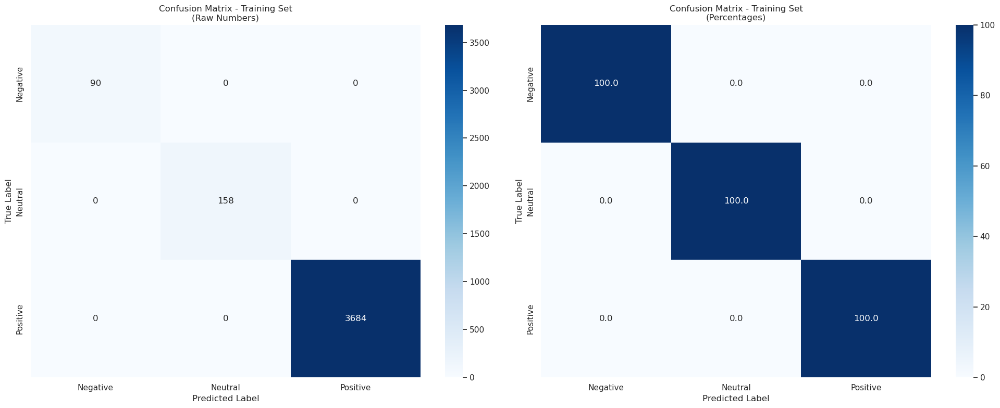


Classification Report - Training Set
              precision    recall  f1-score   support

    Negative       1.00      1.00      1.00        90
     Neutral       1.00      1.00      1.00       158
    Positive       1.00      1.00      1.00      3684

    accuracy                           1.00      3932
   macro avg       1.00      1.00      1.00      3932
weighted avg       1.00      1.00      1.00      3932


Detailed Metrics per Class:
Overall Accuracy: 1.0000

Per-class metrics:

Negative:
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000

Neutral:
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000

Positive:
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000

Creating test embeddings...


Batches:   0%|          | 0/32 [00:00<?, ?it/s]


Evaluating on Test Set...


[Parallel(n_jobs=192)]: Using backend ThreadingBackend with 192 concurrent workers.
[Parallel(n_jobs=192)]: Done  18 out of 200 | elapsed:    0.0s remaining:    0.4s
[Parallel(n_jobs=192)]: Done 200 out of 200 | elapsed:    0.1s finished
[Parallel(n_jobs=192)]: Using backend ThreadingBackend with 192 concurrent workers.
[Parallel(n_jobs=192)]: Done  18 out of 200 | elapsed:    0.1s remaining:    0.5s
[Parallel(n_jobs=192)]: Done 200 out of 200 | elapsed:    0.1s finished


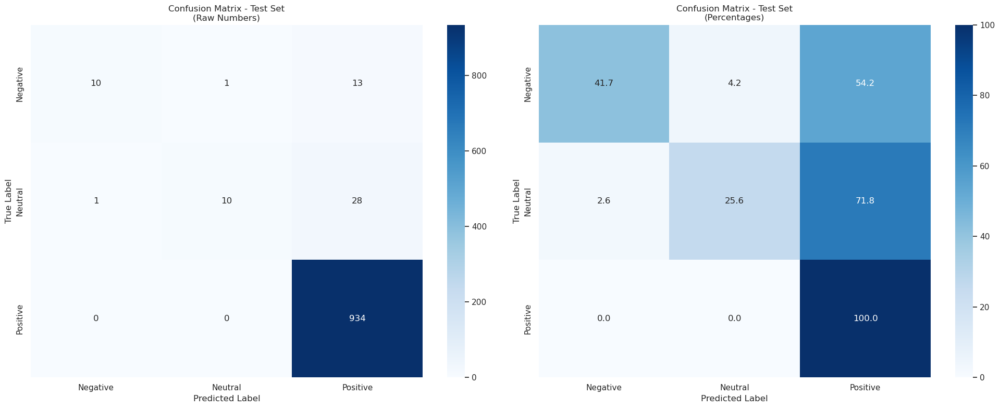


Classification Report - Test Set
              precision    recall  f1-score   support

    Negative       0.91      0.42      0.57        24
     Neutral       0.91      0.26      0.40        39
    Positive       0.96      1.00      0.98       934

    accuracy                           0.96       997
   macro avg       0.93      0.56      0.65       997
weighted avg       0.95      0.96      0.95       997


Detailed Metrics per Class:
Overall Accuracy: 0.9569

Per-class metrics:

Negative:
Precision: 0.9091
Recall: 0.4167
F1-Score: 0.5714

Neutral:
Precision: 0.9091
Recall: 0.2564
F1-Score: 0.4000

Positive:
Precision: 0.9579
Recall: 1.0000
F1-Score: 0.9785

Test predictions saved as 'sentiment_test_rf.csv'

Analyzing Training Set Misclassifications:

Misclassified Examples:
Original Text | True Label | Predicted Label | Confidence
--------------------------------------------------------------------------------

Analyzing Test Set Misclassifications:

Misclassified Examples:
Origi

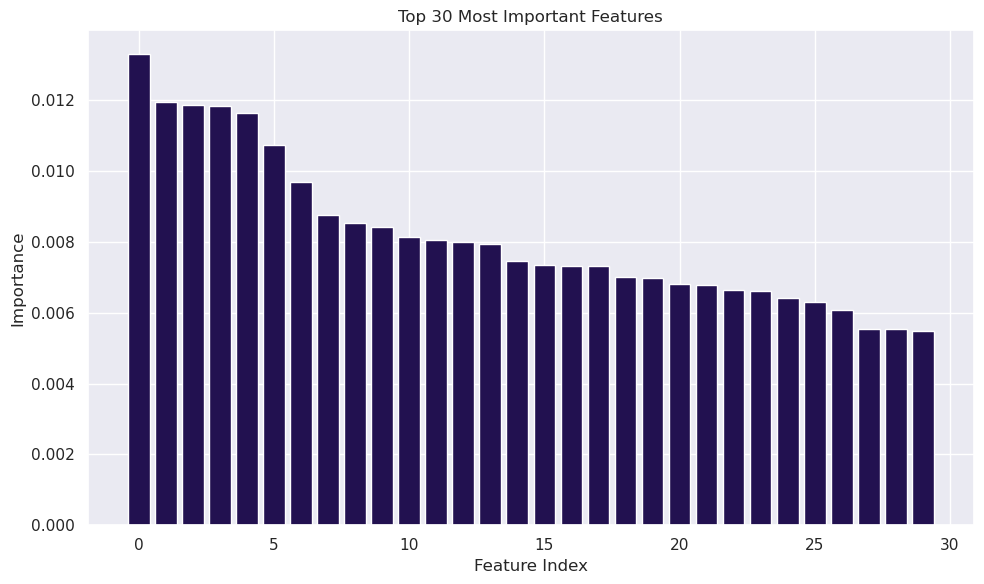


Random Forest Model Training and Evaluation Complete!

Model saved as 'random_forest_model.joblib'


In [ ]:
import numpy as np
import pandas as pd
from sentence_transformers import SentenceTransformer
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report
from imblearn.over_sampling import SMOTE
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# 1. Data preparation
print("Starting data preparation...")
le = LabelEncoder()
y = le.fit_transform(df_train['sentiment'])

# 2. SBERT embeddings
print("Creating SBERT embeddings...")
model_sbert = SentenceTransformer('all-MiniLM-L6-v2')
X = model_sbert.encode(df_train['combined_review_cleaned'].tolist(), 
                      batch_size=32, 
                      show_progress_bar=True)

# 3. Apply SMOTE on entire training data
print("\nApplying SMOTE...")
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

print("Original dataset shape:", dict(zip(np.unique(y), np.bincount(y))))
print("Resampled dataset shape:", dict(zip(np.unique(y_resampled), np.bincount(y_resampled))))

# 4. Create and train Random Forest model
print("\nTraining Random Forest model...")
rf_model = RandomForestClassifier(
    n_estimators=200,
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    max_features='sqrt',
    n_jobs=-1,
    random_state=42,
    verbose=1
)

rf_model.fit(X_resampled, y_resampled)

# 5. Evaluation function
def create_confusion_matrix(X, y, dataset_name):
    pred_classes = rf_model.predict(X)
    pred_probs = rf_model.predict_proba(X)
    
    # Calculate confusion matrices
    cm = confusion_matrix(y, pred_classes)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))
    
    # Plot raw numbers
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax1)
    ax1.set_title(f'Confusion Matrix - {dataset_name}\n(Raw Numbers)')
    ax1.set_ylabel('True Label')
    ax1.set_xlabel('Predicted Label')
    
    # Plot percentages
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax2)
    ax2.set_title(f'Confusion Matrix - {dataset_name}\n(Percentages)')
    ax2.set_ylabel('True Label')
    ax2.set_xlabel('Predicted Label')
    
    plt.tight_layout()
    plt.show()
    
    # Print classification report
    print(f"\nClassification Report - {dataset_name}")
    print(classification_report(y, pred_classes, target_names=le.classes_))
    
    # Calculate and print individual metrics
    accuracy = accuracy_score(y, pred_classes)
    precision = precision_score(y, pred_classes, average=None)
    recall = recall_score(y, pred_classes, average=None)
    f1 = f1_score(y, pred_classes, average=None)
    
    print("\nDetailed Metrics per Class:")
    print("=" * 80)
    print(f"Overall Accuracy: {accuracy:.4f}")
    print("\nPer-class metrics:")
    for i, class_name in enumerate(le.classes_):
        print(f"\n{class_name}:")
        print(f"Precision: {precision[i]:.4f}")
        print(f"Recall: {recall[i]:.4f}")
        print(f"F1-Score: {f1[i]:.4f}")
    
    return pred_classes, pred_probs

# 6. Training Set Evaluation
print("\nEvaluating on Training Set...")
train_pred_classes, train_pred_probs = create_confusion_matrix(
    X, y, "Training Set"
)

# 7. Test set evaluation
print("\nCreating test embeddings...")
X_test = model_sbert.encode(df_test['combined_review_cleaned'].tolist(), 
                           batch_size=32, 
                           show_progress_bar=True)
y_test = le.transform(df_test['sentiment'])

print("\nEvaluating on Test Set...")
test_pred_classes, test_pred_probs = create_confusion_matrix(
    X_test, y_test, "Test Set"
)

# 8. Save predictions
df_test['predicted_sentiment_rf'] = le.inverse_transform(test_pred_classes)
df_test.to_csv('sentiment_test_rf.csv', index=False)
print("\nTest predictions saved as 'sentiment_test_rf.csv'")

# 9. Misclassification analysis
def get_misclassified_examples(X_embeddings, y_true, texts, pred_classes, pred_probs, n=5):
    misclassified_idx = np.where(y_true != pred_classes)[0]
    
    print("\nMisclassified Examples:")
    print("Original Text | True Label | Predicted Label | Confidence")
    print("-" * 80)
    
    for idx in misclassified_idx[:n]:
        true_label = le.classes_[y_true[idx]]
        pred_label = le.classes_[pred_classes[idx]]
        confidence = np.max(pred_probs[idx]) * 100
        text = texts[idx][:100] + "..."
        print(f"{text} | {true_label} | {pred_label} | {confidence:.2f}%")

# Get misclassified examples
print("\nAnalyzing Training Set Misclassifications:")
get_misclassified_examples(
    X, 
    y, 
    df_train['combined_review_cleaned'].tolist(),
    train_pred_classes,
    train_pred_probs
)

print("\nAnalyzing Test Set Misclassifications:")
get_misclassified_examples(
    X_test, 
    y_test, 
    df_test['combined_review_cleaned'].tolist(),
    test_pred_classes,
    test_pred_probs
)

# 10. Feature Importance Analysis
feature_importance = pd.DataFrame({
    'feature': range(X.shape[1]),
    'importance': rf_model.feature_importances_
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

plt.figure(figsize=(10, 6))
plt.bar(range(30), feature_importance['importance'][:30])
plt.title('Top 30 Most Important Features')
plt.xlabel('Feature Index')
plt.ylabel('Importance')
plt.tight_layout()
plt.show()

# 11. Function to predict new texts
def predict_sentiment(texts):
    embeddings = model_sbert.encode(texts)
    predictions = rf_model.predict(embeddings)
    probabilities = rf_model.predict_proba(embeddings)
    return [(le.classes_[pred], max(prob)) for pred, prob in zip(predictions, probabilities)]

print("\nRandom Forest Model Training and Evaluation Complete!")

# Save the model
import joblib
joblib.dump(rf_model, 'random_forest_model.joblib')
print("\nModel saved as 'random_forest_model.joblib'")


## 5. SVM based Classifier using SBERT

Starting data preparation...
Creating SBERT embeddings...


Batches:   0%|          | 0/123 [00:00<?, ?it/s]


Applying SMOTE...
Original dataset shape: {0: 90, 1: 158, 2: 3684}
Resampled dataset shape: {0: 3684, 1: 3684, 2: 3684}

Training SVM model...
Fitting SVM model... (this might take a while)
[LibSVM].
*..
*
optimization finished, #iter = 3952
obj = -159.054346, rho = -0.216762
nSV = 590, nBSV = 132
Total nSV = 590
.
*..*.*
optimization finished, #iter = 3693
obj = -159.073594, rho = -0.210952
nSV = 589, nBSV = 135
Total nSV = 589
..
*.
*
optimization finished, #iter = 3805
obj = -159.588756, rho = -0.212632
nSV = 582, nBSV = 130
Total nSV = 582
.
*..
*.
*
optimization finished, #iter = 3723
obj = -159.594665, rho = -0.214293
nSV = 568, nBSV = 138
Total nSV = 568
..
*.
*
optimization finished, #iter = 3665
obj = -159.131812, rho = -0.214020
nSV = 579, nBSV = 136
Total nSV = 579
.
*..
*
optimization finished, #iter = 3938
obj = -160.079572, rho = 0.212105
nSV = 598, nBSV = 131
*.*
optimization finished, #iter = 1239
obj = -185.177983, rho = -1.648517
nSV = 616, nBSV = 190
Total nSV = 616

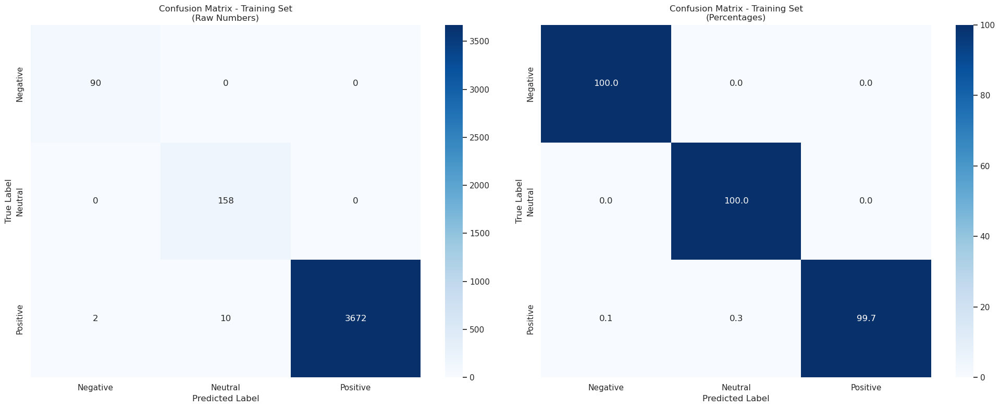


Classification Report - Training Set
              precision    recall  f1-score   support

    Negative       0.98      1.00      0.99        90
     Neutral       0.94      1.00      0.97       158
    Positive       1.00      1.00      1.00      3684

    accuracy                           1.00      3932
   macro avg       0.97      1.00      0.99      3932
weighted avg       1.00      1.00      1.00      3932


Detailed Metrics per Class:
Overall Accuracy: 0.9969

Per-class metrics:

Negative:
Precision: 0.9783
Recall: 1.0000
F1-Score: 0.9890

Neutral:
Precision: 0.9405
Recall: 1.0000
F1-Score: 0.9693

Positive:
Precision: 1.0000
Recall: 0.9967
F1-Score: 0.9984

Creating test embeddings...


Batches:   0%|          | 0/32 [00:00<?, ?it/s]


Evaluating on Test Set...


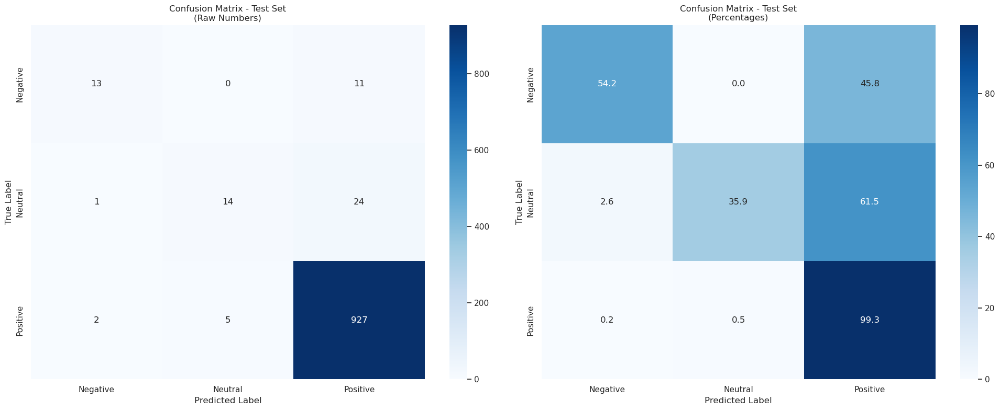


Classification Report - Test Set
              precision    recall  f1-score   support

    Negative       0.81      0.54      0.65        24
     Neutral       0.74      0.36      0.48        39
    Positive       0.96      0.99      0.98       934

    accuracy                           0.96       997
   macro avg       0.84      0.63      0.70       997
weighted avg       0.95      0.96      0.95       997


Detailed Metrics per Class:
Overall Accuracy: 0.9569

Per-class metrics:

Negative:
Precision: 0.8125
Recall: 0.5417
F1-Score: 0.6500

Neutral:
Precision: 0.7368
Recall: 0.3590
F1-Score: 0.4828

Positive:
Precision: 0.9636
Recall: 0.9925
F1-Score: 0.9778

Test predictions saved as 'sentiment_test_svm.csv'

Analyzing Training Set Misclassifications:

Misclassified Examples:
Original Text | True Label | Predicted Label | Confidence
--------------------------------------------------------------------------------
Great tablet for beginner My kid enjoys the tablet This one is inexpe

In [ ]:
import numpy as np
import pandas as pd
from sentence_transformers import SentenceTransformer
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report
from imblearn.over_sampling import SMOTE
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# 1. Data preparation
print("Starting data preparation...")
le = LabelEncoder()
y = le.fit_transform(df_train['sentiment'])

# 2. SBERT embeddings
print("Creating SBERT embeddings...")
model_sbert = SentenceTransformer('all-MiniLM-L6-v2')
X = model_sbert.encode(df_train['combined_review_cleaned'].tolist(), 
                      batch_size=32, 
                      show_progress_bar=True)

# 3. Apply SMOTE on entire training data
print("\nApplying SMOTE...")
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

print("Original dataset shape:", dict(zip(np.unique(y), np.bincount(y))))
print("Resampled dataset shape:", dict(zip(np.unique(y_resampled), np.bincount(y_resampled))))

# 4. Create and train SVM model
print("\nTraining SVM model...")
svm_model = SVC(
    kernel='rbf',  # Radial Basis Function kernel
    C=1.0,         # Regularization parameter
    probability=True,  # Enable probability estimates
    random_state=42,
    verbose=True
)

print("Fitting SVM model... (this might take a while)")
svm_model.fit(X_resampled, y_resampled)

# 5. Evaluation function
def create_confusion_matrix(X, y, dataset_name):
    pred_classes = svm_model.predict(X)
    pred_probs = svm_model.predict_proba(X)
    
    # Calculate confusion matrices
    cm = confusion_matrix(y, pred_classes)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))
    
    # Plot raw numbers
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax1)
    ax1.set_title(f'Confusion Matrix - {dataset_name}\n(Raw Numbers)')
    ax1.set_ylabel('True Label')
    ax1.set_xlabel('Predicted Label')
    
    # Plot percentages
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax2)
    ax2.set_title(f'Confusion Matrix - {dataset_name}\n(Percentages)')
    ax2.set_ylabel('True Label')
    ax2.set_xlabel('Predicted Label')
    
    plt.tight_layout()
    plt.show()
    
    # Print classification report
    print(f"\nClassification Report - {dataset_name}")
    print(classification_report(y, pred_classes, target_names=le.classes_))
    
    # Calculate and print individual metrics
    accuracy = accuracy_score(y, pred_classes)
    precision = precision_score(y, pred_classes, average=None)
    recall = recall_score(y, pred_classes, average=None)
    f1 = f1_score(y, pred_classes, average=None)
    
    print("\nDetailed Metrics per Class:")
    print("=" * 80)
    print(f"Overall Accuracy: {accuracy:.4f}")
    print("\nPer-class metrics:")
    for i, class_name in enumerate(le.classes_):
        print(f"\n{class_name}:")
        print(f"Precision: {precision[i]:.4f}")
        print(f"Recall: {recall[i]:.4f}")
        print(f"F1-Score: {f1[i]:.4f}")
    
    return pred_classes, pred_probs

# 6. Training Set Evaluation
print("\nEvaluating on Training Set...")
train_pred_classes, train_pred_probs = create_confusion_matrix(
    X, y, "Training Set"
)

# 7. Test set evaluation
print("\nCreating test embeddings...")
X_test = model_sbert.encode(df_test['combined_review_cleaned'].tolist(), 
                           batch_size=32, 
                           show_progress_bar=True)
y_test = le.transform(df_test['sentiment'])

print("\nEvaluating on Test Set...")
test_pred_classes, test_pred_probs = create_confusion_matrix(
    X_test, y_test, "Test Set"
)

# 8. Save predictions
df_test['predicted_sentiment_svm'] = le.inverse_transform(test_pred_classes)
df_test.to_csv('sentiment_test_svm.csv', index=False)
print("\nTest predictions saved as 'sentiment_test_svm.csv'")

# 9. Misclassification analysis
def get_misclassified_examples(X_embeddings, y_true, texts, pred_classes, pred_probs, n=5):
    misclassified_idx = np.where(y_true != pred_classes)[0]
    
    print("\nMisclassified Examples:")
    print("Original Text | True Label | Predicted Label | Confidence")
    print("-" * 80)
    
    for idx in misclassified_idx[:n]:
        true_label = le.classes_[y_true[idx]]
        pred_label = le.classes_[pred_classes[idx]]
        confidence = np.max(pred_probs[idx]) * 100
        text = texts[idx][:100] + "..."
        print(f"{text} | {true_label} | {pred_label} | {confidence:.2f}%")

# Get misclassified examples
print("\nAnalyzing Training Set Misclassifications:")
get_misclassified_examples(
    X, 
    y, 
    df_train['combined_review_cleaned'].tolist(),
    train_pred_classes,
    train_pred_probs
)

print("\nAnalyzing Test Set Misclassifications:")
get_misclassified_examples(
    X_test, 
    y_test, 
    df_test['combined_review_cleaned'].tolist(),
    test_pred_classes,
    test_pred_probs
)

# 10. Support Vector Analysis
if hasattr(svm_model, 'n_support_'):
    print("\nSupport Vector Analysis:")
    print("Number of support vectors for each class:")
    for i, count in enumerate(svm_model.n_support_):
        print(f"Class {le.classes_[i]}: {count} support vectors")

# 11. Function to predict new texts
def predict_sentiment(texts):
    embeddings = model_sbert.encode(texts)
    predictions = svm_model.predict(embeddings)
    probabilities = svm_model.predict_proba(embeddings)
    return [(le.classes_[pred], max(prob)) for pred, prob in zip(predictions, probabilities)]

print("\nSVM Model Training and Evaluation Complete!")

# Save the model
import joblib
joblib.dump(svm_model, 'svm_model.joblib')
print("\nModel saved as 'svm_model.joblib'")

# Optional: Save SBERT embeddings for future use
np.save('sbert_train_embeddings.npy', X)
np.save('sbert_test_embeddings.npy', X_test)
print("\nEmbeddings saved as 'sbert_train_embeddings.npy' and 'sbert_test_embeddings.npy'")


# Using Pre-trained Model

## Pre-trained Default RoBERTa Sentiment Classifier

Initializing RoBERTa model...

Evaluating on training set...


100%|██████████| 123/123 [00:13<00:00,  8.82it/s]


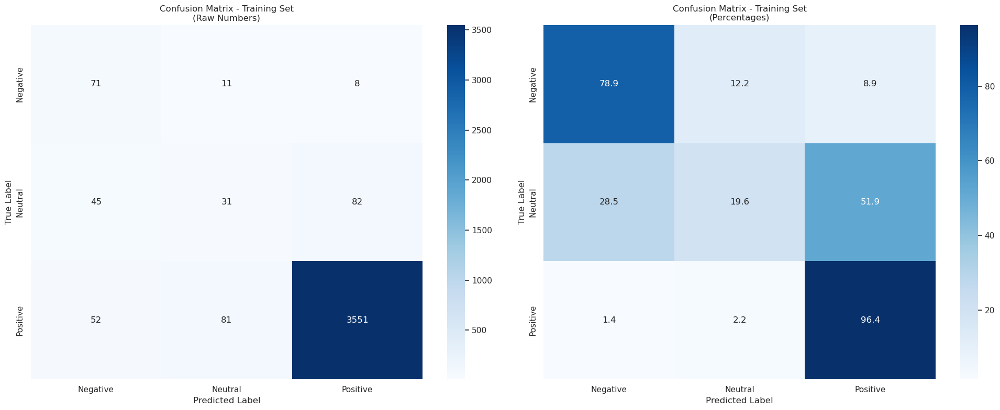


Classification Report - Training Set
              precision    recall  f1-score   support

    Negative       0.42      0.79      0.55        90
     Neutral       0.25      0.20      0.22       158
    Positive       0.98      0.96      0.97      3684

    accuracy                           0.93      3932
   macro avg       0.55      0.65      0.58      3932
weighted avg       0.93      0.93      0.93      3932


Detailed Metrics per Class:
Overall Accuracy: 0.9290

Per-class metrics:

Negative:
Precision: 0.4226
Recall: 0.7889
F1-Score: 0.5504

Neutral:
Precision: 0.2520
Recall: 0.1962
F1-Score: 0.2206

Positive:
Precision: 0.9753
Recall: 0.9639
F1-Score: 0.9696

Evaluating on test set...


100%|██████████| 32/32 [00:04<00:00,  7.65it/s]


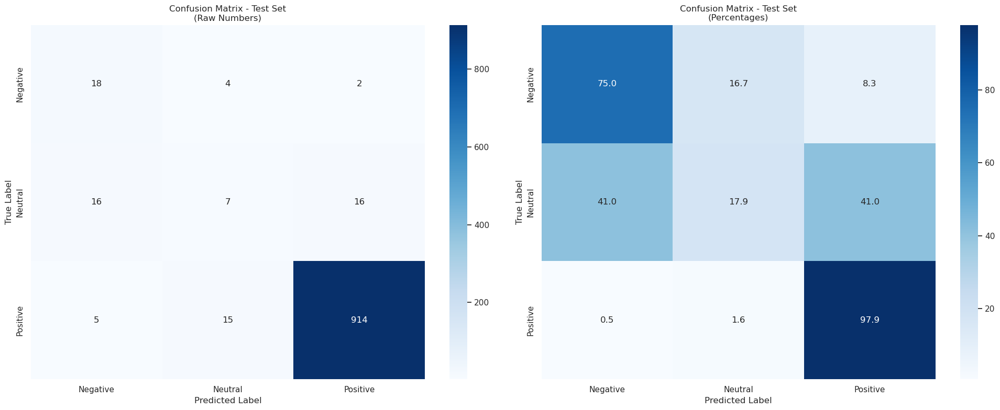


Classification Report - Test Set
              precision    recall  f1-score   support

    Negative       0.46      0.75      0.57        24
     Neutral       0.27      0.18      0.22        39
    Positive       0.98      0.98      0.98       934

    accuracy                           0.94       997
   macro avg       0.57      0.64      0.59       997
weighted avg       0.94      0.94      0.94       997


Detailed Metrics per Class:
Overall Accuracy: 0.9418

Per-class metrics:

Negative:
Precision: 0.4615
Recall: 0.7500
F1-Score: 0.5714

Neutral:
Precision: 0.2692
Recall: 0.1795
F1-Score: 0.2154

Positive:
Precision: 0.9807
Recall: 0.9786
F1-Score: 0.9796

Example Predictions:

Example 1:
Text: very handy device Amazon kindle fire has a lot of free app and can be used by any one that wants to get online anywhere...
True Label: Positive
Predicted Label: Positive
Prediction Probabilities:
Negative: 0.0015
Neutral: 0.0295
Positive: 0.9690
-------------------------------------------

In [ ]:
from transformers import AutoModelForSequenceClassification, AutoTokenizer
import torch
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm

class SentimentClassifier:
    def __init__(self):
        self.model_name = "cardiffnlp/twitter-roberta-base-sentiment"
        self.tokenizer = AutoTokenizer.from_pretrained(self.model_name)
        self.model = AutoModelForSequenceClassification.from_pretrained(self.model_name)
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model.to(self.device)
        self.model.eval()
        
    def predict_batch(self, texts, batch_size=32):
        predictions = []
        
        # Convert texts to list and handle NaN values
        texts = [str(text) if pd.notnull(text) else "" for text in texts]
        
        for i in tqdm(range(0, len(texts), batch_size)):
            batch_texts = texts[i:i + batch_size]
            inputs = self.tokenizer(batch_texts, return_tensors="pt", truncation=True, 
                                  max_length=512, padding=True)
            inputs = {k: v.to(self.device) for k, v in inputs.items()}
            
            with torch.no_grad():
                outputs = self.model(**inputs)
                pred = torch.softmax(outputs.logits, dim=1)
                predictions.extend(pred.cpu().numpy())
        
        return np.array(predictions)

def evaluate_predictions(y_true, predictions, set_name):
    # Convert probabilities to class predictions
    pred_classes = np.argmax(predictions, axis=1)
    
    # Convert numeric labels to text labels
    label_map = {0: 'Negative', 1: 'Neutral', 2: 'Positive'}
    pred_labels = [label_map[p] for p in pred_classes]
    
    # Calculate confusion matrices
    cm = confusion_matrix(y_true, pred_labels)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100
    
    # Plot confusion matrices
    plt.figure(figsize=(20,8))
    
    # Plot raw numbers
    plt.subplot(1, 2, 1)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Negative', 'Neutral', 'Positive'],
                yticklabels=['Negative', 'Neutral', 'Positive'])
    plt.title(f'Confusion Matrix - {set_name}\n(Raw Numbers)')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    
    # Plot percentages
    plt.subplot(1, 2, 2)
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=['Negative', 'Neutral', 'Positive'],
                yticklabels=['Negative', 'Neutral', 'Positive'])
    plt.title(f'Confusion Matrix - {set_name}\n(Percentages)')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    
    plt.tight_layout()
    plt.show()
    
    # Print classification report
    print(f"\nClassification Report - {set_name}")
    print("=" * 80)
    print(classification_report(y_true, pred_labels))
    
    # Calculate and print individual metrics
    from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
    
    # Overall accuracy
    accuracy = accuracy_score(y_true, pred_labels)
    
    # Per-class metrics
    precision = precision_score(y_true, pred_labels, average=None)
    recall = recall_score(y_true, pred_labels, average=None)
    f1 = f1_score(y_true, pred_labels, average=None)
    
    print("\nDetailed Metrics per Class:")
    print("=" * 80)
    print(f"Overall Accuracy: {accuracy:.4f}")
    print("\nPer-class metrics:")
    for i, class_name in enumerate(['Negative', 'Neutral', 'Positive']):
        print(f"\n{class_name}:")
        print(f"Precision: {precision[i]:.4f}")
        print(f"Recall: {recall[i]:.4f}")
        print(f"F1-Score: {f1[i]:.4f}")
    
    return pred_labels, predictions

# Initialize classifier
print("Initializing RoBERTa model...")
classifier = SentimentClassifier()

print("\nEvaluating on training set...")
train_texts = df_train['combined_review_cleaned'].fillna("").values  # Fill NaN with empty string
train_predictions = classifier.predict_batch(train_texts)
train_pred_labels, train_pred_probs = evaluate_predictions(
    df_train['sentiment'].values, 
    train_predictions, 
    "Training Set"
)

print("\nEvaluating on test set...")
test_texts = df_test['combined_review_cleaned'].fillna("").values  # Fill NaN with empty string
test_predictions = classifier.predict_batch(test_texts)
test_pred_labels, test_pred_probs = evaluate_predictions(
    df_test['sentiment'].values, 
    test_predictions, 
    "Test Set"
)

# Save predictions
df_train['roberta_prediction'] = train_pred_labels
df_test['roberta_prediction'] = test_pred_labels

# Add prediction probabilities
for i, label in enumerate(['negative_prob', 'neutral_prob', 'positive_prob']):
    df_train[f'roberta_{label}'] = train_pred_probs[:, i]
    df_test[f'roberta_{label}'] = test_pred_probs[:, i]

# Save results
df_train.to_csv('train_with_roberta_predictions.csv', index=False)
df_test.to_csv('test_with_roberta_predictions.csv', index=False)

# Display some example predictions
print("\nExample Predictions:")
print("=" * 80)
for i in range(5):
    print(f"\nExample {i+1}:")
    print(f"Text: {df_test['combined_review_cleaned'].iloc[i][:200]}...")
    print(f"True Label: {df_test['sentiment'].iloc[i]}")
    print(f"Predicted Label: {test_pred_labels[i]}")
    print(f"Prediction Probabilities:")
    print(f"Negative: {test_pred_probs[i][0]:.4f}")
    print(f"Neutral: {test_pred_probs[i][1]:.4f}")
    print(f"Positive: {test_pred_probs[i][2]:.4f}")
    print("-" * 80)


## Fine-tuned RoBERTa Sentiment Classifier

In [ ]:
from transformers import AutoModelForSequenceClassification, AutoTokenizer, TrainingArguments, Trainer
from torch.utils.data import Dataset
import torch
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
import evaluate
from datasets import load_metric
from transformers import AutoModelForSequenceClassification, AutoTokenizer, TrainingArguments, Trainer
from torch.utils.data import Dataset
import torch
import numpy as np
import pandas as pd
from sklearn.metrics import (
    confusion_matrix, 
    classification_report, 
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
import evaluate
from datasets import load_metric
from scipy.special import softmax  # Add this for softmax function


# Custom Dataset class for our data
class SentimentDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_length=512):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_length = max_length
        
    def __len__(self):
        return len(self.texts)
    
    def __getitem__(self, idx):
        text = str(self.texts[idx])
        label = self.labels[idx]
        
        # Tokenize the text
        encoding = self.tokenizer(
            text,
            truncation=True,
            padding='max_length',
            max_length=self.max_length,
            return_tensors='pt'
        )
        
        # Convert to correct format and remove batch dimension
        return {
            'input_ids': encoding['input_ids'].squeeze(),
            'attention_mask': encoding['attention_mask'].squeeze(),
            'labels': torch.tensor(label, dtype=torch.long)
        }

# Metrics computation function
def compute_metrics(eval_pred):
    metric = evaluate.load("accuracy")
    predictions, labels = eval_pred
    predictions = np.argmax(predictions, axis=1)
    
    accuracy = accuracy_score(labels, predictions)
    
    return {
        'accuracy': accuracy
    }

def evaluate_model(predictions, true_labels, set_name):
    # Convert predictions to class labels
    pred_labels = np.argmax(predictions, axis=1)
    
    # Calculate confusion matrices
    cm = confusion_matrix(true_labels, pred_labels)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100
    
    # Plot confusion matrices
    plt.figure(figsize=(20,8))
    
    # Plot raw numbers
    plt.subplot(1, 2, 1)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Negative', 'Neutral', 'Positive'],
                yticklabels=['Negative', 'Neutral', 'Positive'])
    plt.title(f'Confusion Matrix - {set_name}\n(Raw Numbers)')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    
    # Plot percentages
    plt.subplot(1, 2, 2)
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=['Negative', 'Neutral', 'Positive'],
                yticklabels=['Negative', 'Neutral', 'Positive'])
    plt.title(f'Confusion Matrix - {set_name}\n(Percentages)')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    
    plt.tight_layout()
    plt.show()
    
    # Print classification report
    print(f"\nClassification Report - {set_name}")
    print("=" * 80)
    print(classification_report(true_labels, pred_labels, 
                              target_names=['Negative', 'Neutral', 'Positive']))
    
    # Calculate individual metrics
    precision = precision_score(true_labels, pred_labels, average=None)
    recall = recall_score(true_labels, pred_labels, average=None)
    f1 = f1_score(true_labels, pred_labels, average=None)
    accuracy = accuracy_score(true_labels, pred_labels)
    
    print("\nDetailed Metrics per Class:")
    print("=" * 80)
    print(f"Overall Accuracy: {accuracy:.4f}")
    print("\nPer-class metrics:")
    for i, class_name in enumerate(['Negative', 'Neutral', 'Positive']):
        print(f"\n{class_name}:")
        print(f"Precision: {precision[i]:.4f}")
        print(f"Recall: {recall[i]:.4f}")
        print(f"F1-Score: {f1[i]:.4f}")
    
    return pred_labels

def main():
    # Load the pre-trained model and tokenizer
    model_name = "cardiffnlp/twitter-roberta-base-sentiment"
    tokenizer = AutoTokenizer.from_pretrained(model_name)
    model = AutoModelForSequenceClassification.from_pretrained(model_name)
    
    # Prepare labels
    # Convert sentiment labels to numbers (Negative: 0, Neutral: 1, Positive: 2)
    label_dict = {'Negative': 0, 'Neutral': 1, 'Positive': 2}
    train_labels = df_train['sentiment'].map(label_dict).values
    test_labels = df_test['sentiment'].map(label_dict).values
    
    # Create datasets
    train_dataset = SentimentDataset(
        df_train['combined_review_cleaned'].values,
        train_labels,
        tokenizer
    )
    
    test_dataset = SentimentDataset(
        df_test['combined_review_cleaned'].values,
        test_labels,
        tokenizer
    )
    
    # Define training arguments
    training_args = TrainingArguments(
        output_dir="./roberta_finetuned",
        num_train_epochs=3,
        per_device_train_batch_size=16,
        per_device_eval_batch_size=64,
        warmup_steps=500,
        weight_decay=0.01,
        logging_dir='./logs',
        logging_steps=10,
        eval_strategy="epoch",
        save_strategy="epoch",
        load_best_model_at_end=True,
        metric_for_best_model="accuracy"
    )

    # training_args = TrainingArguments(
    # output_dir="./roberta_finetuned",
    # num_train_epochs=3,
    # per_device_train_batch_size=16,
    # per_device_eval_batch_size=64,
    # warmup_steps=500,
    # weight_decay=0.01,
    # logging_dir='./logs',
    # logging_steps=10,
    # save_steps=500,        # Save model every 500 steps
    # eval_steps=500,        # Evaluate every 500 steps
    # save_total_limit=2,    # Only keep the 2 best models
    # load_best_model_at_end=True,
    # remove_unused_columns=True,
    # push_to_hub=False,
    # report_to="none"       # Disable reporting
    # )

    # training_args = TrainingArguments(
    # output_dir="./roberta_finetuned",
    # num_train_epochs=3,
    # per_device_train_batch_size=16,
    # per_device_eval_batch_size=64,
    # weight_decay=0.01,
    # logging_dir='./logs',
    # save_strategy="steps",
    # save_steps=500,
    # load_best_model_at_end=True
    # )

    
    # Create Trainer
    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=test_dataset,
        compute_metrics=compute_metrics,
    )
    
    # Fine-tune the model
    print("Starting model fine-tuning...")
    trainer.train()
    
    # Make predictions on test set
    print("\nMaking predictions...")
    predictions = trainer.predict(test_dataset)
    
    # Evaluate results
    print("\nEvaluating results...")
    test_pred_labels = evaluate_model(
        predictions.predictions,
        test_labels,
        "Test Set (Fine-tuned Model)"
    )
    
    # Save the fine-tuned model
    trainer.save_model("./roberta_finetuned/final_model")
    
    # Save predictions
    df_test['roberta_finetuned_prediction'] = test_pred_labels
    df_test.to_csv('test_with_finetuned_predictions.csv', index=False)
    
    # Show some example predictions
    print("\nExample Predictions:")
    print("=" * 80)
    for i in range(5):
        print(f"\nExample {i+1}:")
        print(f"Text: {df_test['combined_review_cleaned'].iloc[i][:200]}...")
        print(f"True Label: {df_test['sentiment'].iloc[i]}")
        print(f"Predicted Label: {['Negative', 'Neutral', 'Positive'][test_pred_labels[i]]}")
        probs = softmax(predictions.predictions[i])
        print(f"Prediction Probabilities:")
        print(f"Negative: {probs[0]:.4f}")
        print(f"Neutral: {probs[1]:.4f}")
        print(f"Positive: {probs[2]:.4f}")
        print("-" * 80)

if __name__ == "__main__":
    main()


Starting model fine-tuning...


OutOfMemoryError: Caught OutOfMemoryError in replica 0 on device 0.
Original Traceback (most recent call last):
  File "/opt/conda/lib/python3.11/site-packages/torch/nn/parallel/parallel_apply.py", line 84, in _worker
    output = module(*input, **kwargs)
             ^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/conda/lib/python3.11/site-packages/torch/nn/modules/module.py", line 1553, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/conda/lib/python3.11/site-packages/torch/nn/modules/module.py", line 1562, in _call_impl
    return forward_call(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/conda/lib/python3.11/site-packages/transformers/models/roberta/modeling_roberta.py", line 1322, in forward
    outputs = self.roberta(
              ^^^^^^^^^^^^^
  File "/opt/conda/lib/python3.11/site-packages/torch/nn/modules/module.py", line 1553, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/conda/lib/python3.11/site-packages/torch/nn/modules/module.py", line 1562, in _call_impl
    return forward_call(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/conda/lib/python3.11/site-packages/transformers/models/roberta/modeling_roberta.py", line 978, in forward
    encoder_outputs = self.encoder(
                      ^^^^^^^^^^^^^
  File "/opt/conda/lib/python3.11/site-packages/torch/nn/modules/module.py", line 1553, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/conda/lib/python3.11/site-packages/torch/nn/modules/module.py", line 1562, in _call_impl
    return forward_call(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/conda/lib/python3.11/site-packages/transformers/models/roberta/modeling_roberta.py", line 631, in forward
    layer_outputs = layer_module(
                    ^^^^^^^^^^^^^
  File "/opt/conda/lib/python3.11/site-packages/torch/nn/modules/module.py", line 1553, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/conda/lib/python3.11/site-packages/torch/nn/modules/module.py", line 1562, in _call_impl
    return forward_call(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/conda/lib/python3.11/site-packages/transformers/models/roberta/modeling_roberta.py", line 520, in forward
    self_attention_outputs = self.attention(
                             ^^^^^^^^^^^^^^^
  File "/opt/conda/lib/python3.11/site-packages/torch/nn/modules/module.py", line 1553, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/conda/lib/python3.11/site-packages/torch/nn/modules/module.py", line 1562, in _call_impl
    return forward_call(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/conda/lib/python3.11/site-packages/transformers/models/roberta/modeling_roberta.py", line 456, in forward
    attention_output = self.output(self_outputs[0], hidden_states)
                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/conda/lib/python3.11/site-packages/torch/nn/modules/module.py", line 1553, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/conda/lib/python3.11/site-packages/torch/nn/modules/module.py", line 1562, in _call_impl
    return forward_call(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/conda/lib/python3.11/site-packages/transformers/models/roberta/modeling_roberta.py", line 399, in forward
    hidden_states = self.LayerNorm(hidden_states + input_tensor)
                    ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/conda/lib/python3.11/site-packages/torch/nn/modules/module.py", line 1553, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/conda/lib/python3.11/site-packages/torch/nn/modules/module.py", line 1562, in _call_impl
    return forward_call(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/conda/lib/python3.11/site-packages/torch/nn/modules/normalization.py", line 202, in forward
    return F.layer_norm(
           ^^^^^^^^^^^^^
  File "/opt/conda/lib/python3.11/site-packages/torch/nn/functional.py", line 2576, in layer_norm
    return torch.layer_norm(input, normalized_shape, weight, bias, eps, torch.backends.cudnn.enabled)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
torch.OutOfMemoryError: CUDA out of memory. Tried to allocate 24.00 MiB. GPU 0 has a total capacity of 21.95 GiB of which 8.12 MiB is free. Process 30442 has 21.94 GiB memory in use. Of the allocated memory 1.65 GiB is allocated by PyTorch, and 28.36 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


# Using GenAI and LLMs based Sentiment Classification

## Using few-shot prompting technique for GenAI based Classifier

In [ ]:
import boto3
import json
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import time
from botocore.exceptions import ClientError

import boto3, os 
import json
class ClaudeBedrockClient:
    def __init__(self):
        self.model_id = "anthropic.claude-3-sonnet-20240229-v1:0"
        # self.model_id = "anthropic.claude-3-7-sonnet-20250219-v1:0"
        self.input_tokens = 0
        self.output_tokens = 0
        self.invocations = 0

    def create_client(self):
        return boto3.client(
            service_name="bedrock-runtime",
            region_name="us-east-1",
            use_ssl=True,
            config=boto3.session.Config(
                max_pool_connections=100,
                read_timeout=900,
                retries={
                    'max_attempts': 10,
                    'mode': 'standard'
                }
            ),
        )

    def call_model(self, prompt: str, temperature: float = 0) -> str:
        retry_delay = 60  # Delay in seconds (1 minute)
        max_retries = 5  # Maximum number of retries
        retries = 0

        client = self.create_client()

        while True:
            try:
                response = client.invoke_model(
                    modelId=self.model_id,
                    body=json.dumps(
                        {
                            "anthropic_version": "bedrock-2023-05-31",
                            "max_tokens": 1024,
                            "temperature": temperature,
                            "messages": [
                                {
                                    "role": "user",
                                    "content": [{"type": "text", "text": prompt}],
                                }
                            ],
                        }
                    ).encode("utf-8"),
                )
                result = response["body"].read().decode("utf-8")
                body = json.loads(result)
                self.input_tokens += body['usage']['input_tokens']
                self.output_tokens += body['usage']['output_tokens']
                self.invocations += 1
                return body['content'][0]['text']
            except ClientError as e:
                if retries < max_retries:
                    time.sleep(retry_delay)
                    retries += 1
                else:
                    raise e
client = ClaudeBedrockClient()


def create_few_shot_prompt(review_text):
    prompt = """Please classify the sentiment of the given review into one of three categories: Positive, Negative, or Neutral.

Here are some examples:

Review: "Greattttttt very good product Exactly what I wanted and a very good price."
Positive

Review: "Average Just an average Alexa option Does show a few things on screen but still limited."
Neutral

Review: "was cheap can not run chrome stuff returned was cheap can not run chrome stuff returned to store."
Negative

Just respond with either "Positive" or "Neutral" or "Negative"

Now classify this review:
Review: "{}"
Sentiment:""".format(review_text)
    
    return prompt

def evaluate_predictions(true_labels, predicted_labels, set_name):
    # Calculate confusion matrices
    cm = confusion_matrix(true_labels, predicted_labels)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100
    
    # Create figure with two subplots
    plt.figure(figsize=(20,8))
    
    # Plot raw numbers
    plt.subplot(1, 2, 1)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Negative', 'Neutral', 'Positive'],
                yticklabels=['Negative', 'Neutral', 'Positive'])
    plt.title(f'Confusion Matrix - {set_name}\n(Raw Numbers)')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    
    # Plot percentages
    plt.subplot(1, 2, 2)
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=['Negative', 'Neutral', 'Positive'],
                yticklabels=['Negative', 'Neutral', 'Positive'])
    plt.title(f'Confusion Matrix - {set_name}\n(Percentages)')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    
    plt.tight_layout()
    plt.show()
    
    # Print classification report
    print(f"\nClassification Report - {set_name}")
    print("=" * 80)
    print(classification_report(true_labels, predicted_labels))
    
    # Calculate individual metrics
    precision = precision_score(true_labels, predicted_labels, average=None)
    recall = recall_score(true_labels, predicted_labels, average=None)
    f1 = f1_score(true_labels, predicted_labels, average=None)
    accuracy = accuracy_score(true_labels, predicted_labels)
    
    print("\nDetailed Metrics per Class:")
    print("=" * 80)
    print(f"Overall Accuracy: {accuracy:.4f}")
    print("\nPer-class metrics:")
    for i, class_name in enumerate(['Negative', 'Neutral', 'Positive']):
        print(f"\n{class_name}:")
        print(f"Precision: {precision[i]:.4f}")
        print(f"Recall: {recall[i]:.4f}")
        print(f"F1-Score: {f1[i]:.4f}")

def get_predictions(df, client, batch_size=100):
    predictions = []
    total = len(df)
    
    for i in range(0, total, batch_size):
        batch = df.iloc[i:i+batch_size]
        batch_predictions = []
        
        print(f"\nProcessing batch {i//batch_size + 1}/{(total+batch_size-1)//batch_size}")
        
        for _, row in batch.iterrows():
            try:
                prompt = create_few_shot_prompt(row['combined_review_cleaned'])
                response = client.call_model(prompt, temperature=0.1)
                
                # Extract just the sentiment label
                sentiment = response.strip()
                batch_predictions.append(sentiment)
                
                print(f"Processed {len(predictions) + len(batch_predictions)}/{total}", end='\r')
                
            except Exception as e:
                print(f"\nError processing review: {e}")
                batch_predictions.append("Error")
                
            # Add a small delay to avoid rate limiting
            time.sleep(0.1)
        
        predictions.extend(batch_predictions)
        
        # Save intermediate results
        temp_df = df.iloc[:len(predictions)].copy()
        temp_df['predicted_sentiment'] = predictions
        temp_df.to_csv('intermediate_predictions.csv', index=False)
    
    return predictions

# Initialize the Claude client
# client = ClaudeBedrockClient()

# Get predictions for training set
# print("Processing Training Set...")
# train_predictions = get_predictions(df_train, client)
# df_train['predicted_sentiment'] = train_predictions
# df_train.to_csv('train_predictions.csv', index=False)

# Get predictions for test set
print("\nProcessing Test Set...")
test_predictions = get_predictions(df_test, client)
df_test['predicted_sentiment'] = test_predictions
df_test.to_csv('test_predictions.csv', index=False)

# Evaluate training set predictions
# print("\nEvaluating Training Set Predictions...")
# evaluate_predictions(
#     df_train['sentiment'].values,
#     df_train['predicted_sentiment'].values,
#     "Training Set"
# )

# Evaluate test set predictions
print("\nEvaluating Test Set Predictions...")
evaluate_predictions(
    df_test['sentiment'].values,
    df_test['predicted_sentiment'].values,
    "Test Set"
)

# Print token usage statistics
print("\nToken Usage Statistics:")
print(f"Total Input Tokens: {client.input_tokens}")
print(f"Total Output Tokens: {client.output_tokens}")
print(f"Total API Invocations: {client.invocations}")

# Save final results
df_train.to_csv('train_predictions_final.csv', index=False)
df_test.to_csv('test_predictions_final.csv', index=False)

# Print some example predictions
print("\nExample Predictions from Test Set:")
print("=" * 80)
for i in range(min(5, len(df_test))):
    print(f"\nReview: {df_test['combined_review_cleaned'].iloc[i][:100]}...")
    print(f"True Sentiment: {df_test['sentiment'].iloc[i]}")
    print(f"Predicted Sentiment: {df_test['predicted_sentiment'].iloc[i]}")
    print("-" * 50)


In [ ]:
test_predictions

# Manual Testing on Test Cases

## Model 1 Test

In [84]:
import numpy as np
import pandas as pd
from sentence_transformers import SentenceTransformer
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.regularizers import l2
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report
from imblearn.over_sampling import SMOTE
import seaborn as sns
import matplotlib.pyplot as plt
import time
import psutil
import os
import joblib
from memory_profiler import profile

class SentimentAnalysisModel:
    def __init__(self):
        self.model = None
        self.model_sbert = None
        self.label_encoder = None
        self.history = None
    
    def create_model(self, input_shape=384):
        l2_lambda = 0.001
        self.model = Sequential([
            Dense(384, activation='relu', input_shape=(input_shape,), kernel_regularizer=l2(l2_lambda)),
            BatchNormalization(),
            Dropout(0.5),
            
            Dense(256, activation='relu', kernel_regularizer=l2(l2_lambda)),
            BatchNormalization(),
            Dropout(0.5),
            
            Dense(128, activation='relu', kernel_regularizer=l2(l2_lambda)),
            BatchNormalization(),
            Dropout(0.4),
            
            Dense(64, activation='relu', kernel_regularizer=l2(l2_lambda)),
            BatchNormalization(),
            Dropout(0.3),
            
            Dense(3, activation='softmax')
        ])
        
        initial_learning_rate = 0.001
        optimizer = tf.keras.optimizers.Adam(learning_rate=initial_learning_rate)
        
        self.model.compile(
            optimizer=optimizer,
            loss='sparse_categorical_crossentropy',
            metrics=['accuracy']
        )
    
    def train(self, df_train):
        # Initialize components
        self.label_encoder = LabelEncoder()
        self.model_sbert = SentenceTransformer('all-MiniLM-L6-v2')
        
        # Prepare data
        y = self.label_encoder.fit_transform(df_train['sentiment'])
        
        print("Creating embeddings...")
        X = self.model_sbert.encode(df_train['combined_review_cleaned'].tolist(), 
                                  batch_size=32, 
                                  show_progress_bar=True)
        
        # Apply SMOTE
        smote = SMOTE(random_state=42)
        X_resampled, y_resampled = smote.fit_resample(X, y)
        
        # Create and compile model
        self.create_model()
        
        # Callbacks
        callbacks = [
            tf.keras.callbacks.EarlyStopping(
                monitor='loss',
                patience=10,
                restore_best_weights=True
            ),
            tf.keras.callbacks.ReduceLROnPlateau(
                monitor='loss',
                factor=0.2,
                patience=5,
                min_lr=0.00001
            ),
            tf.keras.callbacks.ModelCheckpoint(
                'best_model.h5',
                monitor='loss',
                save_best_only=True
            )
        ]
        
        # Train model
        self.history = self.model.fit(
            X_resampled,
            y_resampled,
            epochs=100,
            batch_size=64,
            callbacks=callbacks
        )
    
    def predict(self, texts):
        # Create embeddings
        embeddings = self.model_sbert.encode(texts)
        
        # Get predictions
        predictions = self.model.predict(embeddings)
        pred_classes = np.argmax(predictions, axis=1)
        
        # Get prediction probabilities
        pred_probs = np.max(predictions, axis=1)
        
        # Convert to labels
        pred_labels = self.label_encoder.inverse_transform(pred_classes)
        
        return pred_labels, pred_probs
    
    def save(self, path):
        """Save the complete model with all components"""
        os.makedirs(path, exist_ok=True)
        
        # Save Keras model
        self.model.save(os.path.join(path, 'keras_model.h5'))
        
        # Save SBERT model
        self.model_sbert.save(os.path.join(path, 'sbert_model'))
        
        # Save label encoder
        joblib.dump(self.label_encoder, os.path.join(path, 'label_encoder.joblib'))
        
        # Save training history if exists
        if self.history is not None:
            with open(os.path.join(path, 'training_history.npy'), 'wb') as f:
                np.save(f, self.history.history)
    
    @classmethod
    def load(cls, path):
        """Load a complete model with all components"""
        instance = cls()
        
        # Load Keras model
        instance.model = load_model(os.path.join(path, 'keras_model.h5'))
        
        # Load SBERT model
        instance.model_sbert = SentenceTransformer(os.path.join(path, 'sbert_model'))
        
        # Load label encoder
        instance.label_encoder = joblib.load(os.path.join(path, 'label_encoder.joblib'))
        
        # Load training history if exists
        history_path = os.path.join(path, 'training_history.npy')
        if os.path.exists(history_path):
            with open(history_path, 'rb') as f:
                history_dict = np.load(f, allow_pickle=True).item()
            
            # Recreate history object
            instance.history = type('History', (), {'history': history_dict})
        
        return instance

def get_user_input():
    """Function to get and validate user input"""
    while True:
        print("\nEnter your review text (or 'quit' to exit):")
        text = input().strip()
        
        if text.lower() == 'quit':
            return None
        elif len(text) < 1:
            print("Please enter some text!")
            continue
        else:
            return text

def predict_sentiment():
    """Main function to handle user interaction and predictions"""
    print("Loading the sentiment analysis model...")
    try:
        model = SentimentAnalysisModel.load('sentiment_model')
        print("Model loaded successfully!")
    except Exception as e:
        print(f"Error loading model: {e}")
        return

    print("\nWelcome to the Sentiment Analysis Predictor!")
    print("-------------------------------------------")
    print("You can enter any text, and the model will predict its sentiment.")
    print("Enter 'quit' to exit the program.")

    while True:
        text = get_user_input()
        
        if text is None:
            print("\nThank you for using the Sentiment Analysis Predictor!")
            break
        
        try:
            # Make prediction
            predictions, probabilities = model.predict([text])
            
            # Print results with formatting
            print("\nPrediction Results:")
            print("-----------------")
            print(f"Text: {text}")
            print(f"Predicted Sentiment: {predictions[0]}")
            print(f"Confidence: {probabilities[0]*100:.2f}%")
            print("-----------------")
            
        except Exception as e:
            print(f"Error making prediction: {e}")

if __name__ == "__main__":
    # If you need to train a new model:
    # model = SentimentAnalysisModel()
    # model.train(df_train)  # Assuming df_train is your training DataFrame
    # model.save('sentiment_model')
    
    # Run the interactive prediction program
    predict_sentiment()


Loading the sentiment analysis model...
Error loading model: [Errno 2] Unable to synchronously open file (unable to open file: name = 'sentiment_model/keras_model.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)


## Model 2 Test

In [ ]:
import numpy as np
import pandas as pd
from sentence_transformers import SentenceTransformer
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.regularizers import l2
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report, f1_score
from imblearn.combine import SMOTETomek
import seaborn as sns
import matplotlib.pyplot as plt
import time
import psutil
import os
from memory_profiler import profile

import numpy as np
import pandas as pd
from sentence_transformers import SentenceTransformer
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.regularizers import l2
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report, f1_score
from imblearn.combine import SMOTETomek
import seaborn as sns
import matplotlib.pyplot as plt

# Load previous test results
df_test = pd.read_csv('sentiment_test_model_1.csv')


# 1. Data preparation
le = LabelEncoder()
y = le.fit_transform(df_train['sentiment'])

# 2. SBERT embeddings
model_sbert = SentenceTransformer('all-MiniLM-L6-v2')

print("Creating embeddings...")
X = model_sbert.encode(df_train['combined_review_cleaned'].tolist(), 
                      batch_size=32, 
                      show_progress_bar=True)

# 3. Apply SMOTE-Tomek on entire training data
print("\nOriginal dataset shape:", dict(zip(np.unique(y), np.bincount(y))))

smote_tomek = SMOTETomek(random_state=42, n_jobs=-1)
X_resampled, y_resampled = smote_tomek.fit_resample(X, y)

print("Resampled dataset shape:", dict(zip(np.unique(y_resampled), np.bincount(y_resampled))))

# 4. Create model
l2_lambda = 0.001
model = Sequential([
    Dense(384, activation='relu', input_shape=(384,), kernel_regularizer=l2(l2_lambda)),
    BatchNormalization(),
    Dropout(0.5),
    
    Dense(256, activation='relu', kernel_regularizer=l2(l2_lambda)),
    BatchNormalization(),
    Dropout(0.5),
    
    Dense(128, activation='relu', kernel_regularizer=l2(l2_lambda)),
    BatchNormalization(),
    Dropout(0.4),
    
    Dense(64, activation='relu', kernel_regularizer=l2(l2_lambda)),
    BatchNormalization(),
    Dropout(0.3),
    
    Dense(3, activation='softmax')
])

# 5. Compile model
initial_learning_rate = 0.001
optimizer = tf.keras.optimizers.Adam(learning_rate=initial_learning_rate)

model.compile(
    optimizer=optimizer,
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# 6. Callbacks (modified to monitor training loss)
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=10,
        restore_best_weights=True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='loss',
        factor=0.2,
        patience=5,
        min_lr=0.00001
    ),
    tf.keras.callbacks.ModelCheckpoint(
        'best_model.h5',
        monitor='loss',
        save_best_only=True
    )
]

# 7. Train model on entire resampled data
history = model.fit(
    X_resampled,
    y_resampled,
    epochs=100,
    batch_size=64,
    callbacks=callbacks
)

# 8. Evaluation function
def create_confusion_matrix(X, y, dataset_name):
    predictions = model.predict(X)
    pred_classes = np.argmax(predictions, axis=1)
    
    # Calculate confusion matrices
    cm = confusion_matrix(y, pred_classes)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))
    
    # Plot raw numbers
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax1)
    ax1.set_title(f'Confusion Matrix - {dataset_name}\n(Raw Numbers)')
    ax1.set_ylabel('True Label')
    ax1.set_xlabel('Predicted Label')
    
    # Plot percentages
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax2)
    ax2.set_title(f'Confusion Matrix - {dataset_name}\n(Percentages)')
    ax2.set_ylabel('True Label')
    ax2.set_xlabel('Predicted Label')
    
    plt.tight_layout()
    plt.show()
    
    # Print classification report
    print(f"\nClassification Report - {dataset_name}")
    print(classification_report(y, pred_classes, 
                              target_names=le.classes_))
    
    # Print F1 scores
    f1_scores = f1_score(y, pred_classes, average=None)
    print("\nF1 Scores per class:")
    for i, score in enumerate(f1_scores):
        print(f"Class {le.classes_[i]}: {score:.4f}")
    
    return pred_classes, predictions

# 9. Training Set Evaluation
print("\nTraining Set Evaluation:")
train_pred_classes, train_pred_probs = create_confusion_matrix(
    X, y, "Training Set"
)

# 10. Test set evaluation
print("Creating test embeddings...")
X_test = model_sbert.encode(df_test['combined_review_cleaned'].tolist(), 
                           batch_size=32, 
                           show_progress_bar=True)
y_test = le.transform(df_test['sentiment'])

print("\nTest Set Evaluation:")
test_pred_classes, test_pred_probs = create_confusion_matrix(
    X_test, y_test, "Test Set"
)

# Store predictions in df_test
df_test['predicted_sentiment_model_2'] = le.inverse_transform(test_pred_classes)
df_test.to_csv('sentiment_test_model_2.csv', index=False)
print("\nTest predictions have been added to df_test and saved as 'sentiment_test_model_2.csv'")


# 11. Analyze misclassifications
def get_misclassified_examples(X_embeddings, y_true, texts, pred_classes, pred_probs, n=5):
    misclassified_idx = np.where(y_true != pred_classes)[0]
    
    print("\nMisclassified Examples:")
    print("Original Text | True Label | Predicted Label | Confidence")
    print("-" * 80)
    
    confidences = np.max(pred_probs, axis=1)[misclassified_idx]
    sorted_indices = misclassified_idx[np.argsort(confidences)]
    
    for idx in sorted_indices[:n]:
        true_label = le.classes_[y_true[idx]]
        pred_label = le.classes_[pred_classes[idx]]
        confidence = np.max(pred_probs[idx]) * 100
        text = texts[idx][:100] + "..."
        print(f"{text} | {true_label} | {pred_label} | {confidence:.2f}%")

# Get misclassified examples
print("\nTraining Set Misclassifications:")
get_misclassified_examples(
    X, 
    y, 
    df_train['combined_review_cleaned'].tolist(),
    train_pred_classes,
    train_pred_probs
)

print("\nTest Set Misclassifications:")
get_misclassified_examples(
    X_test, 
    y_test, 
    df_test['combined_review_cleaned'].tolist(),
    test_pred_classes,
    test_pred_probs
)

# 12. Plot training history
plt.figure(figsize=(15,5))

# Loss plot
plt.subplot(1,2,1)
plt.plot(history.history['loss'], label='Training Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Accuracy plot
plt.subplot(1,2,2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# 13. Save the model
model.save('model2.h5')

# 14. Function to predict new texts
def predict_sentiment(texts):
    embeddings = model_sbert.encode(texts)
    predictions = model.predict(embeddings)
    pred_classes = np.argmax(predictions, axis=1)
    confidences = np.max(predictions, axis=1)
    return [(le.classes_[pred], conf) for pred, conf in zip(pred_classes, confidences)]
# 15. Performance Metrics Evaluation
import time
import psutil
import os
from memory_profiler import profile

def measure_inference_metrics(model, X, batch_size=32):
    # Warm-up run
    _ = model.predict(X[:batch_size])
    
    # Memory usage before inference
    process = psutil.Process(os.getpid())
    memory_before = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Measure inference time
    start_time = time.time()
    predictions = model.predict(X, batch_size=batch_size)
    end_time = time.time()
    
    # Memory usage after inference
    memory_after = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Calculate metrics
    total_time = end_time - start_time
    samples = len(X)
    avg_time_per_sample = total_time / samples
    memory_used = memory_after - memory_before
    
    return {
        'total_inference_time': total_time,
        'average_time_per_sample': avg_time_per_sample,
        'samples_per_second': samples / total_time,
        'memory_usage_mb': memory_used,
        'batch_size': batch_size
    }

# Get model complexity metrics
def get_model_complexity():
    trainable_params = model.count_params()
    non_trainable_params = sum([tf.keras.backend.count_params(w) for w in model.non_trainable_weights])
    
    return {
        'trainable_parameters': trainable_params,
        'non_trainable_parameters': non_trainable_params,
        'total_parameters': trainable_params + non_trainable_params,
        'model_size_mb': os.path.getsize('model2.h5') / (1024 * 1024)
    }

# Measure and print performance metrics
print("\nPerformance Metrics:")
print("\nTraining Set Performance:")
train_metrics = measure_inference_metrics(model, X)
for metric, value in train_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nTest Set Performance:")
test_metrics = measure_inference_metrics(model, X_test)
for metric, value in test_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nModel Complexity Metrics:")
complexity_metrics = get_model_complexity()
for metric, value in complexity_metrics.items():
    if 'size' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:,}")

# Visualize performance metrics
plt.figure(figsize=(15,5))

# Inference time comparison
plt.subplot(1,2,1)
metrics_data = [train_metrics['average_time_per_sample'], test_metrics['average_time_per_sample']]
plt.bar(['Training Set', 'Test Set'], metrics_data)
plt.title('Average Inference Time per Sample')
plt.ylabel('Time (seconds)')

# Memory usage comparison
plt.subplot(1,2,2)
memory_data = [train_metrics['memory_usage_mb'], test_metrics['memory_usage_mb']]
plt.bar(['Training Set', 'Test Set'], memory_data)
plt.title('Memory Usage')
plt.ylabel('Memory (MB)')

plt.tight_layout()
plt.show()

# Store all metrics for model comparison
performance_metrics = {
    'model2': {  # Changed to model2 to match your code
        'train': train_metrics,
        'test': test_metrics,
        'complexity': complexity_metrics,
        'training_history': {
            'final_loss': history.history['loss'][-1],
            'final_accuracy': history.history['accuracy'][-1],
            'epochs_trained': len(history.history['loss'])
        }
    }
}

# Create detailed metrics DataFrame
def create_metrics_df(metrics_dict):
    data = {
        'Model': [],
        'Training Time per Sample (s)': [],
        'Test Time per Sample (s)': [],
        'Training Memory (MB)': [],
        'Test Memory (MB)': [],
        'Model Size (MB)': [],
        'Total Parameters': [],
        'Final Training Loss': [],
        'Final Training Accuracy': [],
        'Epochs Trained': []
    }
    
    for model_name, metrics in metrics_dict.items():
        data['Model'].append(model_name)
        data['Training Time per Sample (s)'].append(metrics['train']['average_time_per_sample'])
        data['Test Time per Sample (s)'].append(metrics['test']['average_time_per_sample'])
        data['Training Memory (MB)'].append(metrics['train']['memory_usage_mb'])
        data['Test Memory (MB)'].append(metrics['test']['memory_usage_mb'])
        data['Model Size (MB)'].append(metrics['complexity']['model_size_mb'])
        data['Total Parameters'].append(metrics['complexity']['total_parameters'])
        data['Final Training Loss'].append(metrics['training_history']['final_loss'])
        data['Final Training Accuracy'].append(metrics['training_history']['final_accuracy'])
        data['Epochs Trained'].append(metrics['training_history']['epochs_trained'])
    
    return pd.DataFrame(data)

# Create and save metrics DataFrame
metrics_df = create_metrics_df(performance_metrics)
metrics_df.to_csv('model2_performance_metrics.csv', index=False)
print("\nPerformance metrics have been saved to 'model2_performance_metrics.csv'")

# Print comprehensive summary
print("\nComprehensive Model Summary:")
print("=" * 50)
print(f"Model: Model 2 (SMOTE-Tomek)")
print(f"Total Parameters: {complexity_metrics['total_parameters']:,}")
print(f"Model Size: {complexity_metrics['model_size_mb']:.2f} MB")
print(f"Average Inference Time: {test_metrics['average_time_per_sample']:.4f} seconds per sample")
print(f"Memory Usage: {test_metrics['memory_usage_mb']:.2f} MB")
print(f"Final Training Accuracy: {history.history['accuracy'][-1]:.4f}")
print(f"Total Training Epochs: {len(history.history['loss'])}")


def get_user_input():
    """Function to get and validate user input"""
    while True:
        print("\nEnter your review text (or 'quit' to exit):")
        text = input().strip()
        
        if text.lower() == 'quit':
            return None
        elif len(text) < 1:
            print("Please enter some text!")
            continue
        else:
            return text

def predict_sentiment_interactive(model, model_sbert, label_encoder):
    """Function to handle user interaction and predictions"""
    print("\nWelcome to the Sentiment Analysis Predictor!")
    print("-------------------------------------------")
    print("You can enter any text, and the model will predict its sentiment.")
    print("Enter 'quit' to exit the program.")

    while True:
        text = get_user_input()
        
        if text is None:
            print("\nThank you for using the Sentiment Analysis Predictor!")
            break
        
        try:
            # Create embedding
            embedding = model_sbert.encode([text])
            
            # Make prediction
            prediction = model.predict(embedding)
            pred_class = np.argmax(prediction, axis=1)[0]
            confidence = np.max(prediction) * 100
            
            # Get sentiment label
            sentiment = label_encoder.inverse_transform([pred_class])[0]
            
            # Print results with formatting
            print("\nPrediction Results:")
            print("-----------------")
            print(f"Text: {text}")
            print(f"Predicted Sentiment: {sentiment}")
            print(f"Confidence: {confidence:.2f}%")
            print("-----------------")
            
        except Exception as e:
            print(f"Error making prediction: {e}")

# Add this at the very end of your script:
if __name__ == "__main__":
    # Your existing code runs here
    
    # After all the model training and evaluation, add:
    print("\nModel training and evaluation complete.")
    print("Starting interactive sentiment prediction...")
    
    # Use the trained model for interactive predictions
    predict_sentiment_interactive(model, model_sbert, le)


## Model 3 Test

In [ ]:
import numpy as np
import pandas as pd
from sentence_transformers import SentenceTransformer
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, LSTM, Bidirectional
from tensorflow.keras.regularizers import l2
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report, f1_score
from imblearn.combine import SMOTETomek
import seaborn as sns
import matplotlib.pyplot as plt

# Load previous test results
df_test = pd.read_csv('sentiment_test_model_2.csv')


# 1. Data preparation
le = LabelEncoder()
y = le.fit_transform(df_train['sentiment'])

# 2. SBERT embeddings
model_sbert = SentenceTransformer('all-MiniLM-L6-v2')

print("Creating embeddings...")
X = model_sbert.encode(df_train['combined_review_cleaned'].tolist(), 
                      batch_size=32, 
                      show_progress_bar=True)

# 3. Apply SMOTE-Tomek on entire training data
print("\nOriginal dataset shape:", dict(zip(np.unique(y), np.bincount(y))))

smote_tomek = SMOTETomek(random_state=42, n_jobs=-1)
X_resampled, y_resampled = smote_tomek.fit_resample(X, y)

print("Resampled dataset shape:", dict(zip(np.unique(y_resampled), np.bincount(y_resampled))))

# 4. Reshape data for LSTM
X_resampled = X_resampled.reshape(X_resampled.shape[0], 1, X_resampled.shape[1])
X = X.reshape(X.shape[0], 1, X.shape[1])

# 5. Create LSTM model
l2_lambda = 0.001

model = Sequential([
    # Bidirectional LSTM layers
    Bidirectional(LSTM(256, return_sequences=True, 
                      kernel_regularizer=l2(l2_lambda),
                      recurrent_regularizer=l2(l2_lambda))),
    BatchNormalization(),
    Dropout(0.5),
    
    Bidirectional(LSTM(128,
                      kernel_regularizer=l2(l2_lambda),
                      recurrent_regularizer=l2(l2_lambda))),
    BatchNormalization(),
    Dropout(0.5),
    
    Dense(64, activation='relu', kernel_regularizer=l2(l2_lambda)),
    BatchNormalization(),
    Dropout(0.3),
    
    Dense(3, activation='softmax')
])

# 6. Compile model
initial_learning_rate = 0.001
optimizer = tf.keras.optimizers.Adam(learning_rate=initial_learning_rate)

model.compile(
    optimizer=optimizer,
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# 7. Callbacks (modified to monitor training loss)
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=10,
        restore_best_weights=True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='loss',
        factor=0.2,
        patience=5,
        min_lr=0.00001
    ),
    tf.keras.callbacks.ModelCheckpoint(
        'best_model.h5',
        monitor='loss',
        save_best_only=True
    )
]

# 8. Train model on entire resampled data
history = model.fit(
    X_resampled,
    y_resampled,
    epochs=100,
    batch_size=32,
    callbacks=callbacks
)

# 9. Evaluation function
def create_confusion_matrix(X, y, dataset_name):
    # Reshape X if needed
    if len(X.shape) == 2:
        X = X.reshape(X.shape[0], 1, X.shape[1])
    
    predictions = model.predict(X)
    pred_classes = np.argmax(predictions, axis=1)
    
    # Calculate confusion matrices
    cm = confusion_matrix(y, pred_classes)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))
    
    # Plot raw numbers
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax1)
    ax1.set_title(f'Confusion Matrix - {dataset_name}\n(Raw Numbers)')
    ax1.set_ylabel('True Label')
    ax1.set_xlabel('Predicted Label')
    
    # Plot percentages
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax2)
    ax2.set_title(f'Confusion Matrix - {dataset_name}\n(Percentages)')
    ax2.set_ylabel('True Label')
    ax2.set_xlabel('Predicted Label')
    
    plt.tight_layout()
    plt.show()
    
    # Print classification report
    print(f"\nClassification Report - {dataset_name}")
    print(classification_report(y, pred_classes, 
                              target_names=le.classes_))
    
    # Print F1 scores
    f1_scores = f1_score(y, pred_classes, average=None)
    print("\nF1 Scores per class:")
    for i, score in enumerate(f1_scores):
        print(f"Class {le.classes_[i]}: {score:.4f}")
    
    return pred_classes, predictions

# 10. Training Set Evaluation
print("\nTraining Set Evaluation:")
train_pred_classes, train_pred_probs = create_confusion_matrix(
    X, y, "Training Set"
)

# 11. Test set evaluation
print("Creating test embeddings...")
X_test = model_sbert.encode(df_test['combined_review_cleaned'].tolist(), 
                           batch_size=32, 
                           show_progress_bar=True)
X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
y_test = le.transform(df_test['sentiment'])

print("\nTest Set Evaluation:")
test_pred_classes, test_pred_probs = create_confusion_matrix(
    X_test, y_test, "Test Set"
)

# Store predictions in df_test
df_test['predicted_sentiment_model_3'] = le.inverse_transform(test_pred_classes)
df_test.to_csv('sentiment_test_model_3.csv', index=False)
print("\nTest predictions have been added to df_test and saved as 'sentiment_test_model_3.csv'")


# 12. Analyze misclassifications
def get_misclassified_examples(X_embeddings, y_true, texts, pred_classes, pred_probs, n=5):
    misclassified_idx = np.where(y_true != pred_classes)[0]
    
    print("\nMisclassified Examples:")
    print("Original Text | True Label | Predicted Label | Confidence")
    print("-" * 80)
    
    confidences = np.max(pred_probs, axis=1)[misclassified_idx]
    sorted_indices = misclassified_idx[np.argsort(confidences)]
    
    for idx in sorted_indices[:n]:
        true_label = le.classes_[y_true[idx]]
        pred_label = le.classes_[pred_classes[idx]]
        confidence = np.max(pred_probs[idx]) * 100
        text = texts[idx][:100] + "..."
        print(f"{text} | {true_label} | {pred_label} | {confidence:.2f}%")

# Get misclassified examples
print("\nTraining Set Misclassifications:")
get_misclassified_examples(
    X, 
    y, 
    df_train['combined_review_cleaned'].tolist(),
    train_pred_classes,
    train_pred_probs
)

print("\nTest Set Misclassifications:")
get_misclassified_examples(
    X_test, 
    y_test, 
    df_test['combined_review_cleaned'].tolist(),
    test_pred_classes,
    test_pred_probs
)

# 13. Plot training history
plt.figure(figsize=(15,5))

# Loss plot
plt.subplot(1,2,1)
plt.plot(history.history['loss'], label='Training Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Accuracy plot
plt.subplot(1,2,2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# 14. Save the model
model.save('model3.h5')

# 15. Function to predict new texts
def predict_sentiment(texts):
    embeddings = model_sbert.encode(texts)
    embeddings = embeddings.reshape(embeddings.shape[0], 1, embeddings.shape[1])
    predictions = model.predict(embeddings)
    pred_classes = np.argmax(predictions, axis=1)
    confidences = np.max(predictions, axis=1)
    return [(le.classes_[pred], conf) for pred, conf in zip(pred_classes, confidences)]


# 16. Performance Metrics Evaluation
import time
import psutil
import os
from memory_profiler import profile

def measure_inference_metrics(model, X, batch_size=32):
    # Ensure proper shape for LSTM
    if len(X.shape) == 2:
        X = X.reshape(X.shape[0], 1, X.shape[1])
    
    # Warm-up run
    _ = model.predict(X[:batch_size])
    
    # Memory usage before inference
    process = psutil.Process(os.getpid())
    memory_before = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Measure inference time
    start_time = time.time()
    predictions = model.predict(X, batch_size=batch_size)
    end_time = time.time()
    
    # Memory usage after inference
    memory_after = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Calculate metrics
    total_time = end_time - start_time
    samples = len(X)
    avg_time_per_sample = total_time / samples
    memory_used = memory_after - memory_before
    
    return {
        'total_inference_time': total_time,
        'average_time_per_sample': avg_time_per_sample,
        'samples_per_second': samples / total_time,
        'memory_usage_mb': memory_used,
        'batch_size': batch_size
    }

# Get model complexity metrics
def get_model_complexity():
    trainable_params = model.count_params()
    non_trainable_params = sum([tf.keras.backend.count_params(w) for w in model.non_trainable_weights])
    
    return {
        'trainable_parameters': trainable_params,
        'non_trainable_parameters': non_trainable_params,
        'total_parameters': trainable_params + non_trainable_params,
        'model_size_mb': os.path.getsize('model3.h5') / (1024 * 1024),
        'model_type': 'Bidirectional LSTM'
    }

# Measure and print performance metrics
print("\nPerformance Metrics:")
print("\nTraining Set Performance:")
train_metrics = measure_inference_metrics(model, X)
for metric, value in train_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nTest Set Performance:")
test_metrics = measure_inference_metrics(model, X_test)
for metric, value in test_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nModel Complexity Metrics:")
complexity_metrics = get_model_complexity()
for metric, value in complexity_metrics.items():
    if isinstance(value, str):
        print(f"{metric}: {value}")
    elif 'size' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:,}")

# Visualize performance metrics
plt.figure(figsize=(15,8))

# Inference time comparison
plt.subplot(2,2,1)
metrics_data = [train_metrics['average_time_per_sample'], test_metrics['average_time_per_sample']]
plt.bar(['Training Set', 'Test Set'], metrics_data)
plt.title('Average Inference Time per Sample')
plt.ylabel('Time (seconds)')

# Memory usage comparison
plt.subplot(2,2,2)
memory_data = [train_metrics['memory_usage_mb'], test_metrics['memory_usage_mb']]
plt.bar(['Training Set', 'Test Set'], memory_data)
plt.title('Memory Usage')
plt.ylabel('Memory (MB)')

# Throughput comparison
plt.subplot(2,2,3)
throughput_data = [train_metrics['samples_per_second'], test_metrics['samples_per_second']]
plt.bar(['Training Set', 'Test Set'], throughput_data)
plt.title('Throughput (Samples per Second)')
plt.ylabel('Samples/s')

plt.tight_layout()
plt.show()

# Store all metrics for model comparison
performance_metrics = {
    'model3': {  # Changed to model3 to match your code
        'train': train_metrics,
        'test': test_metrics,
        'complexity': complexity_metrics,
        'training_history': {
            'final_loss': history.history['loss'][-1],
            'final_accuracy': history.history['accuracy'][-1],
            'epochs_trained': len(history.history['loss'])
        },
        'model_architecture': 'Bidirectional LSTM'
    }
}

# Create detailed metrics DataFrame
def create_metrics_df(metrics_dict):
    data = {
        'Model': [],
        'Architecture': [],
        'Training Time per Sample (s)': [],
        'Test Time per Sample (s)': [],
        'Training Memory (MB)': [],
        'Test Memory (MB)': [],
        'Model Size (MB)': [],
        'Total Parameters': [],
        'Final Training Loss': [],
        'Final Training Accuracy': [],
        'Epochs Trained': [],
        'Throughput (samples/s)': []
    }
    
    for model_name, metrics in metrics_dict.items():
        data['Model'].append(model_name)
        data['Architecture'].append(metrics['model_architecture'])
        data['Training Time per Sample (s)'].append(metrics['train']['average_time_per_sample'])
        data['Test Time per Sample (s)'].append(metrics['test']['average_time_per_sample'])
        data['Training Memory (MB)'].append(metrics['train']['memory_usage_mb'])
        data['Test Memory (MB)'].append(metrics['test']['memory_usage_mb'])
        data['Model Size (MB)'].append(metrics['complexity']['model_size_mb'])
        data['Total Parameters'].append(metrics['complexity']['total_parameters'])
        data['Final Training Loss'].append(metrics['training_history']['final_loss'])
        data['Final Training Accuracy'].append(metrics['training_history']['final_accuracy'])
        data['Epochs Trained'].append(metrics['training_history']['epochs_trained'])
        data['Throughput (samples/s)'].append(metrics['test']['samples_per_second'])
    
    return pd.DataFrame(data)

# Create and save metrics DataFrame
metrics_df = create_metrics_df(performance_metrics)
metrics_df.to_csv('model3_performance_metrics.csv', index=False)
print("\nPerformance metrics have been saved to 'model3_performance_metrics.csv'")

# Print comprehensive summary
print("\nComprehensive Model Summary:")
print("=" * 50)
print(f"Model: Model 3 (Bidirectional LSTM)")
print(f"Total Parameters: {complexity_metrics['total_parameters']:,}")
print(f"Model Size: {complexity_metrics['model_size_mb']:.2f} MB")
print(f"Average Inference Time: {test_metrics['average_time_per_sample']:.4f} seconds per sample")
print(f"Throughput: {test_metrics['samples_per_second']:.2f} samples/second")
print(f"Memory Usage: {test_metrics['memory_usage_mb']:.2f} MB")
print(f"Final Training Accuracy: {history.history['accuracy'][-1]:.4f}")
print(f"Total Training Epochs: {len(history.history['loss'])}")


def get_user_input():
    """Function to get and validate user input"""
    while True:
        print("\nEnter your review text (or 'quit' to exit):")
        text = input().strip()
        
        if text.lower() == 'quit':
            return None
        elif len(text) < 1:
            print("Please enter some text!")
            continue
        else:
            return text

def predict_sentiment_interactive(model, model_sbert, label_encoder):
    """Function to handle user interaction and predictions"""
    print("\nWelcome to the Sentiment Analysis Predictor (LSTM Model)!")
    print("-------------------------------------------")
    print("You can enter any text, and the model will predict its sentiment.")
    print("Enter 'quit' to exit the program.")

    while True:
        text = get_user_input()
        
        if text is None:
            print("\nThank you for using the Sentiment Analysis Predictor!")
            break
        
        try:
            # Create embedding
            embedding = model_sbert.encode([text])
            # Reshape for LSTM
            embedding = embedding.reshape(embedding.shape[0], 1, embedding.shape[1])
            
            # Make prediction
            prediction = model.predict(embedding)
            pred_class = np.argmax(prediction, axis=1)[0]
            confidence = np.max(prediction) * 100
            
            # Get sentiment label
            sentiment = label_encoder.inverse_transform([pred_class])[0]
            
            # Print results with formatting
            print("\nPrediction Results:")
            print("-----------------")
            print(f"Text: {text}")
            print(f"Predicted Sentiment: {sentiment}")
            print(f"Confidence: {confidence:.2f}%")
            print("-----------------")
            
        except Exception as e:
            print(f"Error making prediction: {e}")

# Add this at the very end of your script:
if __name__ == "__main__":
    # Your existing code runs here
    
    # After all the model training and evaluation, add:
    print("\nModel training and evaluation complete.")
    print("Starting interactive sentiment prediction...")
    
    # Use the trained model for interactive predictions
    predict_sentiment_interactive(model, model_sbert, le)


## Model 4 Test

In [ ]:
import numpy as np
import pandas as pd
from sentence_transformers import SentenceTransformer
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, GRU, Bidirectional
from tensorflow.keras.regularizers import l2
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report, f1_score
from imblearn.combine import SMOTETomek
import seaborn as sns
import matplotlib.pyplot as plt

# Load previous test results
df_test = pd.read_csv('sentiment_test_model_3.csv')


# 1. Data preparation
le = LabelEncoder()
y = le.fit_transform(df_train['sentiment'])

# 2. SBERT embeddings
model_sbert = SentenceTransformer('all-MiniLM-L6-v2')

print("Creating embeddings...")
X = model_sbert.encode(df_train['combined_review_cleaned'].tolist(), 
                      batch_size=32, 
                      show_progress_bar=True)

# 3. Apply SMOTE-Tomek on entire training data
print("\nOriginal dataset shape:", dict(zip(np.unique(y), np.bincount(y))))

smote_tomek = SMOTETomek(random_state=42, n_jobs=-1)
X_resampled, y_resampled = smote_tomek.fit_resample(X, y)

print("Resampled dataset shape:", dict(zip(np.unique(y_resampled), np.bincount(y_resampled))))

# 4. Reshape data for GRU
X_resampled = X_resampled.reshape(X_resampled.shape[0], 1, X_resampled.shape[1])
X = X.reshape(X.shape[0], 1, X.shape[1])

# 5. Create GRU model
model = Sequential([
    Bidirectional(GRU(128, 
                     kernel_regularizer=l2(0.01),
                     recurrent_regularizer=l2(0.01))),
    BatchNormalization(),
    Dropout(0.5),
    
    Dense(64, activation='relu', kernel_regularizer=l2(0.01)),
    BatchNormalization(),
    Dropout(0.4),
    
    Dense(3, activation='softmax')
])

# 6. Compile model
initial_learning_rate = 0.001
optimizer = tf.keras.optimizers.Adam(learning_rate=initial_learning_rate)

model.compile(
    optimizer=optimizer,
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# 7. Callbacks (modified to monitor training loss)
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=10,
        restore_best_weights=True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='loss',
        factor=0.2,
        patience=5,
        min_lr=0.00001
    ),
    tf.keras.callbacks.ModelCheckpoint(
        'best_model.h5',
        monitor='loss',
        save_best_only=True
    )
]

# 8. Train model on entire resampled data
history = model.fit(
    X_resampled,
    y_resampled,
    epochs=100,
    batch_size=32,
    callbacks=callbacks
)

# 9. Evaluation function
def create_confusion_matrix(X, y, dataset_name):
    # Reshape X if needed
    if len(X.shape) == 2:
        X = X.reshape(X.shape[0], 1, X.shape[1])
    
    predictions = model.predict(X)
    pred_classes = np.argmax(predictions, axis=1)
    
    # Calculate confusion matrices
    cm = confusion_matrix(y, pred_classes)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))
    
    # Plot raw numbers
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax1)
    ax1.set_title(f'Confusion Matrix - {dataset_name}\n(Raw Numbers)')
    ax1.set_ylabel('True Label')
    ax1.set_xlabel('Predicted Label')
    
    # Plot percentages
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax2)
    ax2.set_title(f'Confusion Matrix - {dataset_name}\n(Percentages)')
    ax2.set_ylabel('True Label')
    ax2.set_xlabel('Predicted Label')
    
    plt.tight_layout()
    plt.show()
    
    # Print classification report
    print(f"\nClassification Report - {dataset_name}")
    print(classification_report(y, pred_classes, 
                              target_names=le.classes_))
    
    # Print F1 scores
    f1_scores = f1_score(y, pred_classes, average=None)
    print("\nF1 Scores per class:")
    for i, score in enumerate(f1_scores):
        print(f"Class {le.classes_[i]}: {score:.4f}")
    
    return pred_classes, predictions

# 10. Training Set Evaluation
print("\nTraining Set Evaluation:")
train_pred_classes, train_pred_probs = create_confusion_matrix(
    X, y, "Training Set"
)

# 11. Test set evaluation
print("Creating test embeddings...")
X_test = model_sbert.encode(df_test['combined_review_cleaned'].tolist(), 
                           batch_size=32, 
                           show_progress_bar=True)
X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
y_test = le.transform(df_test['sentiment'])

print("\nTest Set Evaluation:")
test_pred_classes, test_pred_probs = create_confusion_matrix(
    X_test, y_test, "Test Set"
)

# Store predictions in df_test
df_test['predicted_sentiment_model_4'] = le.inverse_transform(test_pred_classes)
df_test.to_csv('sentiment_test_model_4.csv', index=False)
print("\nTest predictions have been added to df_test and saved as 'sentiment_test_model_4.csv'")


# 12. Analyze misclassifications
def get_misclassified_examples(X_embeddings, y_true, texts, pred_classes, pred_probs, n=5):
    misclassified_idx = np.where(y_true != pred_classes)[0]
    
    print("\nMisclassified Examples:")
    print("Original Text | True Label | Predicted Label | Confidence")
    print("-" * 80)
    
    confidences = np.max(pred_probs, axis=1)[misclassified_idx]
    sorted_indices = misclassified_idx[np.argsort(confidences)]
    
    for idx in sorted_indices[:n]:
        true_label = le.classes_[y_true[idx]]
        pred_label = le.classes_[pred_classes[idx]]
        confidence = np.max(pred_probs[idx]) * 100
        text = texts[idx][:100] + "..."
        print(f"{text} | {true_label} | {pred_label} | {confidence:.2f}%")

# Get misclassified examples
print("\nTraining Set Misclassifications:")
get_misclassified_examples(
    X, 
    y, 
    df_train['combined_review_cleaned'].tolist(),
    train_pred_classes,
    train_pred_probs
)

print("\nTest Set Misclassifications:")
get_misclassified_examples(
    X_test, 
    y_test, 
    df_test['combined_review_cleaned'].tolist(),
    test_pred_classes,
    test_pred_probs
)

# 13. Plot training history
plt.figure(figsize=(15,5))

# Loss plot
plt.subplot(1,2,1)
plt.plot(history.history['loss'], label='Training Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Accuracy plot
plt.subplot(1,2,2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# 14. Save the model
model.save('model4.h5')

# 15. Function to predict new texts
def predict_sentiment(texts):
    embeddings = model_sbert.encode(texts)
    embeddings = embeddings.reshape(embeddings.shape[0], 1, embeddings.shape[1])
    predictions = model.predict(embeddings)
    pred_classes = np.argmax(predictions, axis=1)
    confidences = np.max(predictions, axis=1)
    return [(le.classes_[pred], conf) for pred, conf in zip(pred_classes, confidences)]
# 16. Performance Metrics Evaluation
import time
import psutil
import os
from memory_profiler import profile

def measure_inference_metrics(model, X, batch_size=32):
    # Ensure proper shape for GRU
    if len(X.shape) == 2:
        X = X.reshape(X.shape[0], 1, X.shape[1])
    
    # Warm-up run
    _ = model.predict(X[:batch_size])
    
    # Memory usage before inference
    process = psutil.Process(os.getpid())
    memory_before = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Measure inference time
    start_time = time.time()
    predictions = model.predict(X, batch_size=batch_size)
    end_time = time.time()
    
    # Memory usage after inference
    memory_after = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Calculate metrics
    total_time = end_time - start_time
    samples = len(X)
    avg_time_per_sample = total_time / samples
    memory_used = memory_after - memory_before
    
    return {
        'total_inference_time': total_time,
        'average_time_per_sample': avg_time_per_sample,
        'samples_per_second': samples / total_time,
        'memory_usage_mb': memory_used,
        'batch_size': batch_size
    }

# Get model complexity metrics
def get_model_complexity():
    trainable_params = model.count_params()
    non_trainable_params = sum([tf.keras.backend.count_params(w) for w in model.non_trainable_weights])
    
    return {
        'trainable_parameters': trainable_params,
        'non_trainable_parameters': non_trainable_params,
        'total_parameters': trainable_params + non_trainable_params,
        'model_size_mb': os.path.getsize('model4.h5') / (1024 * 1024),
        'model_type': 'Bidirectional GRU'
    }

# Measure and print performance metrics
print("\nPerformance Metrics:")
print("\nTraining Set Performance:")
train_metrics = measure_inference_metrics(model, X)
for metric, value in train_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nTest Set Performance:")
test_metrics = measure_inference_metrics(model, X_test)
for metric, value in test_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nModel Complexity Metrics:")
complexity_metrics = get_model_complexity()
for metric, value in complexity_metrics.items():
    if isinstance(value, str):
        print(f"{metric}: {value}")
    elif 'size' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:,}")

# Visualize performance metrics
plt.figure(figsize=(15,10))

# Inference time comparison
plt.subplot(2,2,1)
metrics_data = [train_metrics['average_time_per_sample'], test_metrics['average_time_per_sample']]
plt.bar(['Training Set', 'Test Set'], metrics_data)
plt.title('Average Inference Time per Sample')
plt.ylabel('Time (seconds)')

# Memory usage comparison
plt.subplot(2,2,2)
memory_data = [train_metrics['memory_usage_mb'], test_metrics['memory_usage_mb']]
plt.bar(['Training Set', 'Test Set'], memory_data)
plt.title('Memory Usage')
plt.ylabel('Memory (MB)')

# Throughput comparison
plt.subplot(2,2,3)
throughput_data = [train_metrics['samples_per_second'], test_metrics['samples_per_second']]
plt.bar(['Training Set', 'Test Set'], throughput_data)
plt.title('Throughput (Samples per Second)')
plt.ylabel('Samples/s')

# Model size and parameters
plt.subplot(2,2,4)
plt.bar(['Model Size (MB)', 'Parameters (Millions)'], 
        [complexity_metrics['model_size_mb'], complexity_metrics['total_parameters']/1e6])
plt.title('Model Size and Parameters')

plt.tight_layout()
plt.show()

# Store all metrics for model comparison
performance_metrics = {
    'model4': {  # Changed to model4 to match your code
        'train': train_metrics,
        'test': test_metrics,
        'complexity': complexity_metrics,
        'training_history': {
            'final_loss': history.history['loss'][-1],
            'final_accuracy': history.history['accuracy'][-1],
            'epochs_trained': len(history.history['loss'])
        },
        'model_architecture': 'Bidirectional GRU'
    }
}

# Create detailed metrics DataFrame
def create_metrics_df(metrics_dict):
    data = {
        'Model': [],
        'Architecture': [],
        'Training Time per Sample (s)': [],
        'Test Time per Sample (s)': [],
        'Training Memory (MB)': [],
        'Test Memory (MB)': [],
        'Model Size (MB)': [],
        'Total Parameters': [],
        'Final Training Loss': [],
        'Final Training Accuracy': [],
        'Epochs Trained': [],
        'Throughput (samples/s)': []
    }
    
    for model_name, metrics in metrics_dict.items():
        data['Model'].append(model_name)
        data['Architecture'].append(metrics['model_architecture'])
        data['Training Time per Sample (s)'].append(metrics['train']['average_time_per_sample'])
        data['Test Time per Sample (s)'].append(metrics['test']['average_time_per_sample'])
        data['Training Memory (MB)'].append(metrics['train']['memory_usage_mb'])
        data['Test Memory (MB)'].append(metrics['test']['memory_usage_mb'])
        data['Model Size (MB)'].append(metrics['complexity']['model_size_mb'])
        data['Total Parameters'].append(metrics['complexity']['total_parameters'])
        data['Final Training Loss'].append(metrics['training_history']['final_loss'])
        data['Final Training Accuracy'].append(metrics['training_history']['final_accuracy'])
        data['Epochs Trained'].append(metrics['training_history']['epochs_trained'])
        data['Throughput (samples/s)'].append(metrics['test']['samples_per_second'])
    
    return pd.DataFrame(data)

# Create and save metrics DataFrame
metrics_df = create_metrics_df(performance_metrics)
metrics_df.to_csv('model4_performance_metrics.csv', index=False)
print("\nPerformance metrics have been saved to 'model4_performance_metrics.csv'")

# Print comprehensive summary
print("\nComprehensive Model Summary:")
print("=" * 50)
print(f"Model: Model 4 (Bidirectional GRU)")
print(f"Total Parameters: {complexity_metrics['total_parameters']:,}")
print(f"Model Size: {complexity_metrics['model_size_mb']:.2f} MB")
print(f"Average Inference Time: {test_metrics['average_time_per_sample']:.4f} seconds per sample")
print(f"Throughput: {test_metrics['samples_per_second']:.2f} samples/second")
print(f"Memory Usage: {test_metrics['memory_usage_mb']:.2f} MB")
print(f"Final Training Accuracy: {history.history['accuracy'][-1]:.4f}")
print(f"Total Training Epochs: {len(history.history['loss'])}")


def get_user_input():
    """Function to get and validate user input"""
    while True:
        print("\nEnter your review text (or 'quit' to exit):")
        text = input().strip()
        
        if text.lower() == 'quit':
            return None
        elif len(text) < 1:
            print("Please enter some text!")
            continue
        else:
            return text

def predict_sentiment_interactive(model, model_sbert, label_encoder):
    """Function to handle user interaction and predictions"""
    print("\nWelcome to the Sentiment Analysis Predictor (Bidirectional GRU Model)!")
    print("-------------------------------------------")
    print("You can enter any text, and the model will predict its sentiment.")
    print("Enter 'quit' to exit the program.")

    while True:
        text = get_user_input()
        
        if text is None:
            print("\nThank you for using the Sentiment Analysis Predictor!")
            break
        
        try:
            # Create embedding
            embedding = model_sbert.encode([text])
            # Reshape for GRU
            embedding = embedding.reshape(embedding.shape[0], 1, embedding.shape[1])
            
            # Make prediction
            prediction = model.predict(embedding)
            pred_class = np.argmax(prediction, axis=1)[0]
            confidence = np.max(prediction) * 100
            
            # Get sentiment label
            sentiment = label_encoder.inverse_transform([pred_class])[0]
            
            # Print results with formatting
            print("\nPrediction Results:")
            print("-----------------")
            print(f"Text: {text}")
            print(f"Predicted Sentiment: {sentiment}")
            print(f"Confidence: {confidence:.2f}%")
            
            # Add more detailed confidence scores
            print("\nConfidence Scores for Each Class:")
            for i, label in enumerate(label_encoder.classes_):
                print(f"{label}: {prediction[0][i]*100:.2f}%")
            print("-----------------")
            
        except Exception as e:
            print(f"Error making prediction: {e}")

# Add this at the very end of your script:
if __name__ == "__main__":
    # Your existing code runs here
    
    # After all the model training and evaluation, add:
    print("\nModel training and evaluation complete.")
    print("Starting interactive sentiment prediction...")
    
    # Use the trained model for interactive predictions
    predict_sentiment_interactive(model, model_sbert, le)


## Model 5 Test

In [ ]:
import numpy as np
import pandas as pd
from sentence_transformers import SentenceTransformer
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Input, MultiHeadAttention, LayerNormalization, Add
from tensorflow.keras.regularizers import l2
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report, f1_score
from imblearn.combine import SMOTETomek
import seaborn as sns
import matplotlib.pyplot as plt

# Load previous test results
df_test = pd.read_csv('sentiment_test_model_4.csv')


# 1. Data preparation
le = LabelEncoder()
y = le.fit_transform(df_train['sentiment'])

# 2. SBERT embeddings
model_sbert = SentenceTransformer('all-MiniLM-L6-v2')

print("Creating embeddings...")
X = model_sbert.encode(df_train['combined_review_cleaned'].tolist(), 
                      batch_size=32, 
                      show_progress_bar=True)

# 3. Apply SMOTE-Tomek on entire training data
print("\nOriginal dataset shape:", dict(zip(np.unique(y), np.bincount(y))))

smote_tomek = SMOTETomek(random_state=42, n_jobs=-1)
X_resampled, y_resampled = smote_tomek.fit_resample(X, y)

print("Resampled dataset shape:", dict(zip(np.unique(y_resampled), np.bincount(y_resampled))))

# 4. Reshape data for Transformer
X_resampled = X_resampled.reshape(X_resampled.shape[0], 1, X_resampled.shape[1])
X = X.reshape(X.shape[0], 1, X.shape[1])

# 5. Create Transformer model functions
def transformer_encoder(inputs, head_size, num_heads, ff_dim, dropout=0):
    # Multi-head attention
    x = MultiHeadAttention(
        key_dim=head_size, num_heads=num_heads, dropout=dropout
    )(inputs, inputs)
    x = Dropout(dropout)(x)
    res = Add()([inputs, x])
    x = LayerNormalization(epsilon=1e-6)(res)
    
    # Feed-forward network
    x = Dense(ff_dim, activation='relu')(x)
    x = Dropout(dropout)(x)
    x = Dense(inputs.shape[-1])(x)
    x = Dropout(dropout)(x)
    
    res = Add()([res, x])
    return LayerNormalization(epsilon=1e-6)(res)

def build_transformer_model(
    input_shape,
    head_size=256,
    num_heads=4,
    ff_dim=4,
    num_transformer_blocks=4,
    mlp_units=[128],
    dropout=0.4,
    mlp_dropout=0.3,
):
    inputs = Input(shape=input_shape)
    x = inputs
    
    # Transformer blocks
    for _ in range(num_transformer_blocks):
        x = transformer_encoder(x, head_size, num_heads, ff_dim, dropout)

    # Global average pooling
    x = tf.keras.layers.GlobalAveragePooling1D(data_format="channels_first")(x)
    
    # MLP layers
    for dim in mlp_units:
        x = Dense(dim, activation="relu")(x)
        x = Dropout(mlp_dropout)(x)
    
    # Output layer
    outputs = Dense(3, activation="softmax")(x)
    
    return Model(inputs, outputs)

# 6. Create model
input_shape = (1, 384)  # Adjust based on your embedding dimension
model = build_transformer_model(
    input_shape,
    head_size=256,
    num_heads=4,
    ff_dim=4,
    num_transformer_blocks=4,
    mlp_units=[128, 64],
    dropout=0.4,
    mlp_dropout=0.3,
)

# 7. Compile model
initial_learning_rate = 0.0001
optimizer = tf.keras.optimizers.Adam(
    learning_rate=initial_learning_rate,
    beta_1=0.9,
    beta_2=0.999,
    epsilon=1e-7
)

model.compile(
    optimizer=optimizer,
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# 8. Callbacks (modified to monitor training loss)
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=10,
        restore_best_weights=True,
        min_delta=0.001
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='loss',
        factor=0.5,
        patience=5,
        min_lr=0.00001
    ),
    tf.keras.callbacks.ModelCheckpoint(
        'best_transformer_model.h5',
        monitor='loss',
        save_best_only=True
    )
]

# 9. Train model on entire resampled data
# Modify the training part
batch_size = 16  # Reduced from 32

# Option 1: Simple batch size reduction
history = model.fit(
    X_resampled,
    y_resampled,
    epochs=100,
    batch_size=batch_size,  # Smaller batch size
    callbacks=callbacks
)

# 10. Evaluation function
def create_confusion_matrix(X, y, dataset_name):
    if len(X.shape) == 2:
        X = X.reshape(X.shape[0], 1, X.shape[1])
    
    predictions = model.predict(X)
    pred_classes = np.argmax(predictions, axis=1)
    
    # Calculate confusion matrices
    cm = confusion_matrix(y, pred_classes)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))
    
    # Plot raw numbers
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax1)
    ax1.set_title(f'Confusion Matrix - {dataset_name}\n(Raw Numbers)')
    ax1.set_ylabel('True Label')
    ax1.set_xlabel('Predicted Label')
    
    # Plot percentages
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax2)
    ax2.set_title(f'Confusion Matrix - {dataset_name}\n(Percentages)')
    ax2.set_ylabel('True Label')
    ax2.set_xlabel('Predicted Label')
    
    plt.tight_layout()
    plt.show()
    
    # Print classification report
    print(f"\nClassification Report - {dataset_name}")
    print(classification_report(y, pred_classes, 
                              target_names=le.classes_))
    
    # Print F1 scores
    f1_scores = f1_score(y, pred_classes, average=None)
    print("\nF1 Scores per class:")
    for i, score in enumerate(f1_scores):
        print(f"Class {le.classes_[i]}: {score:.4f}")
    
    return pred_classes, predictions

# 11. Training Set Evaluation
print("\nTraining Set Evaluation:")
train_pred_classes, train_pred_probs = create_confusion_matrix(
    X, y, "Training Set"
)

# 12. Test set evaluation
print("Creating test embeddings...")
X_test = model_sbert.encode(df_test['combined_review_cleaned'].tolist(), 
                           batch_size=32, 
                           show_progress_bar=True)
X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
y_test = le.transform(df_test['sentiment'])

print("\nTest Set Evaluation:")
test_pred_classes, test_pred_probs = create_confusion_matrix(
    X_test, y_test, "Test Set"
)

# Store predictions in df_test
df_test['predicted_sentiment_model_5'] = le.inverse_transform(test_pred_classes)
df_test.to_csv('sentiment_test_model_5.csv', index=False)
print("\nTest predictions have been added to df_test and saved as 'sentiment_test_model_5.csv'")


# 13. Analyze misclassifications
def get_misclassified_examples(X_embeddings, y_true, texts, pred_classes, pred_probs, n=5):
    misclassified_idx = np.where(y_true != pred_classes)[0]
    
    print("\nMisclassified Examples:")
    print("Original Text | True Label | Predicted Label | Confidence")
    print("-" * 80)
    
    confidences = np.max(pred_probs, axis=1)[misclassified_idx]
    sorted_indices = misclassified_idx[np.argsort(confidences)]
    
    for idx in sorted_indices[:n]:
        true_label = le.classes_[y_true[idx]]
        pred_label = le.classes_[pred_classes[idx]]
        confidence = np.max(pred_probs[idx]) * 100
        text = texts[idx][:100] + "..."
        print(f"{text} | {true_label} | {pred_label} | {confidence:.2f}%")

# Get misclassified examples
print("\nTraining Set Misclassifications:")
get_misclassified_examples(
    X, 
    y, 
    df_train['combined_review_cleaned'].tolist(),
    train_pred_classes,
    train_pred_probs
)

print("\nTest Set Misclassifications:")
get_misclassified_examples(
    X_test, 
    y_test, 
    df_test['combined_review_cleaned'].tolist(),
    test_pred_classes,
    test_pred_probs
)

# 14. Plot training history
plt.figure(figsize=(15,5))

# Loss plot
plt.subplot(1,2,1)
plt.plot(history.history['loss'], label='Training Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Accuracy plot
plt.subplot(1,2,2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# 15. Save the model
model.save('model5.h5')

# 16. Function to predict new texts
def predict_sentiment(texts):
    embeddings = model_sbert.encode(texts)
    embeddings = embeddings.reshape(embeddings.shape[0], 1, embeddings.shape[1])
    predictions = model.predict(embeddings)
    pred_classes = np.argmax(predictions, axis=1)
    confidences = np.max(predictions, axis=1)
    return [(le.classes_[pred], conf) for pred, conf in zip(pred_classes, confidences)]
# 17. Performance Metrics Evaluation
import time
import psutil
import os
from memory_profiler import profile

def measure_inference_metrics(model, X, batch_size=16):  # Updated batch_size to match training
    # Ensure proper shape for Transformer
    if len(X.shape) == 2:
        X = X.reshape(X.shape[0], 1, X.shape[1])
    
    # Warm-up run
    _ = model.predict(X[:batch_size])
    
    # Memory usage before inference
    process = psutil.Process(os.getpid())
    memory_before = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Measure inference time
    start_time = time.time()
    predictions = model.predict(X, batch_size=batch_size)
    end_time = time.time()
    
    # Memory usage after inference
    memory_after = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Calculate metrics
    total_time = end_time - start_time
    samples = len(X)
    avg_time_per_sample = total_time / samples
    memory_used = memory_after - memory_before
    
    return {
        'total_inference_time': total_time,
        'average_time_per_sample': avg_time_per_sample,
        'samples_per_second': samples / total_time,
        'memory_usage_mb': memory_used,
        'batch_size': batch_size
    }

# Get model complexity metrics
def get_model_complexity():
    trainable_params = model.count_params()
    non_trainable_params = sum([tf.keras.backend.count_params(w) for w in model.non_trainable_weights])
    
    return {
        'trainable_parameters': trainable_params,
        'non_trainable_parameters': non_trainable_params,
        'total_parameters': trainable_params + non_trainable_params,
        'model_size_mb': os.path.getsize('model5.h5') / (1024 * 1024),
        'model_type': 'Transformer'
    }

# Measure and print performance metrics
print("\nPerformance Metrics:")
print("\nTraining Set Performance:")
train_metrics = measure_inference_metrics(model, X)
for metric, value in train_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nTest Set Performance:")
test_metrics = measure_inference_metrics(model, X_test)
for metric, value in test_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nModel Complexity Metrics:")
complexity_metrics = get_model_complexity()
for metric, value in complexity_metrics.items():
    if isinstance(value, str):
        print(f"{metric}: {value}")
    elif 'size' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:,}")

# Visualize performance metrics
plt.figure(figsize=(15,8))

# Inference time comparison
plt.subplot(2,2,1)
metrics_data = [train_metrics['average_time_per_sample'], test_metrics['average_time_per_sample']]
plt.bar(['Training Set', 'Test Set'], metrics_data)
plt.title('Average Inference Time per Sample')
plt.ylabel('Time (seconds)')

# Memory usage comparison
plt.subplot(2,2,2)
memory_data = [train_metrics['memory_usage_mb'], test_metrics['memory_usage_mb']]
plt.bar(['Training Set', 'Test Set'], memory_data)
plt.title('Memory Usage')
plt.ylabel('Memory (MB)')

# Throughput comparison
plt.subplot(2,2,3)
throughput_data = [train_metrics['samples_per_second'], test_metrics['samples_per_second']]
plt.bar(['Training Set', 'Test Set'], throughput_data)
plt.title('Throughput (Samples per Second)')
plt.ylabel('Samples/s')

plt.tight_layout()
plt.show()

# Store all metrics for model comparison
performance_metrics = {
    'model5': {  # Changed to model5 to match your code
        'train': train_metrics,
        'test': test_metrics,
        'complexity': complexity_metrics,
        'training_history': {
            'final_loss': history.history['loss'][-1],
            'final_accuracy': history.history['accuracy'][-1],
            'epochs_trained': len(history.history['loss'])
        },
        'model_architecture': 'Transformer'
    }
}

# Create detailed metrics DataFrame
def create_metrics_df(metrics_dict):
    data = {
        'Model': [],
        'Architecture': [],
        'Training Time per Sample (s)': [],
        'Test Time per Sample (s)': [],
        'Training Memory (MB)': [],
        'Test Memory (MB)': [],
        'Model Size (MB)': [],
        'Total Parameters': [],
        'Final Training Loss': [],
        'Final Training Accuracy': [],
        'Epochs Trained': [],
        'Throughput (samples/s)': []
    }
    
    for model_name, metrics in metrics_dict.items():
        data['Model'].append(model_name)
        data['Architecture'].append(metrics['model_architecture'])
        data['Training Time per Sample (s)'].append(metrics['train']['average_time_per_sample'])
        data['Test Time per Sample (s)'].append(metrics['test']['average_time_per_sample'])
        data['Training Memory (MB)'].append(metrics['train']['memory_usage_mb'])
        data['Test Memory (MB)'].append(metrics['test']['memory_usage_mb'])
        data['Model Size (MB)'].append(metrics['complexity']['model_size_mb'])
        data['Total Parameters'].append(metrics['complexity']['total_parameters'])
        data['Final Training Loss'].append(metrics['training_history']['final_loss'])
        data['Final Training Accuracy'].append(metrics['training_history']['final_accuracy'])
        data['Epochs Trained'].append(metrics['training_history']['epochs_trained'])
        data['Throughput (samples/s)'].append(metrics['test']['samples_per_second'])
    
    return pd.DataFrame(data)

# Create and save metrics DataFrame
metrics_df = create_metrics_df(performance_metrics)
metrics_df.to_csv('model5_performance_metrics.csv', index=False)
print("\nPerformance metrics have been saved to 'model5_performance_metrics.csv'")

# Print comprehensive summary
print("\nComprehensive Model Summary:")
print("=" * 50)
print(f"Model: Model 5 (Transformer)")
print(f"Total Parameters: {complexity_metrics['total_parameters']:,}")
print(f"Model Size: {complexity_metrics['model_size_mb']:.2f} MB")
print(f"Average Inference Time: {test_metrics['average_time_per_sample']:.4f} seconds per sample")
print(f"Throughput: {test_metrics['samples_per_second']:.2f} samples/second")
print(f"Memory Usage: {test_metrics['memory_usage_mb']:.2f} MB")
print(f"Final Training Accuracy: {history.history['accuracy'][-1]:.4f}")
print(f"Total Training Epochs: {len(history.history['loss'])}")


def get_user_input():
    """Function to get and validate user input"""
    while True:
        print("\nEnter your review text (or 'quit' to exit):")
        text = input().strip()
        
        if text.lower() == 'quit':
            return None
        elif len(text) < 1:
            print("Please enter some text!")
            continue
        else:
            return text

def predict_sentiment_interactive(model, model_sbert, label_encoder):
    """Function to handle user interaction and predictions"""
    print("\nWelcome to the Sentiment Analysis Predictor (Transformer Model)!")
    print("-------------------------------------------")
    print("You can enter any text, and the model will predict its sentiment.")
    print("Enter 'quit' to exit the program.")

    while True:
        text = get_user_input()
        
        if text is None:
            print("\nThank you for using the Sentiment Analysis Predictor!")
            break
        
        try:
            # Create embedding
            embedding = model_sbert.encode([text])
            # Reshape for Transformer
            embedding = embedding.reshape(embedding.shape[0], 1, embedding.shape[1])
            
            # Make prediction
            prediction = model.predict(embedding)
            pred_class = np.argmax(prediction, axis=1)[0]
            confidence = np.max(prediction) * 100
            
            # Get sentiment label
            sentiment = label_encoder.inverse_transform([pred_class])[0]
            
            # Print results with formatting
            print("\nPrediction Results:")
            print("-----------------")
            print(f"Text: {text}")
            print(f"Predicted Sentiment: {sentiment}")
            print(f"Confidence: {confidence:.2f}%")
            
            # Add attention visualization-like confidence scores
            print("\nDetailed Analysis:")
            print("Confidence Scores for Each Class:")
            for i, label in enumerate(label_encoder.classes_):
                score = prediction[0][i] * 100
                bars = "█" * int(score/5)  # Visual representation of confidence
                print(f"{label:8}: {score:6.2f}% |{bars}")
            print("-----------------")
            
        except Exception as e:
            print(f"Error making prediction: {e}")

# Add this at the very end of your script:
if __name__ == "__main__":
    # Your existing code runs here
    
    # After all the model training and evaluation, add:
    print("\nModel training and evaluation complete.")
    print("Starting interactive sentiment prediction...")
    
    # Use the trained model for interactive predictions
    predict_sentiment_interactive(model, model_sbert, le)


## Model 6 Test

In [ ]:
import numpy as np
import pandas as pd
from sentence_transformers import SentenceTransformer
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Input, MultiHeadAttention, LayerNormalization, Add
from tensorflow.keras.regularizers import l2
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report, f1_score
from sklearn.utils.class_weight import compute_class_weight
from imblearn.combine import SMOTETomek
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Load previous test results
df_test = pd.read_csv('sentiment_test_model_5.csv')


# Create directory for model outputs
os.makedirs('./model8', exist_ok=True)


# Transformer encoder function
def transformer_encoder(inputs, head_size, num_heads, ff_dim, dropout=0):
    x = MultiHeadAttention(
        key_dim=head_size, num_heads=num_heads, dropout=dropout
    )(inputs, inputs)
    x = Dropout(dropout)(x)
    res = Add()([inputs, x])
    x = LayerNormalization(epsilon=1e-6)(res)
    
    x = Dense(ff_dim, activation='relu')(x)
    x = Dropout(dropout)(x)
    x = Dense(inputs.shape[-1])(x)
    x = Dropout(dropout)(x)
    
    res = Add()([res, x])
    return LayerNormalization(epsilon=1e-6)(res)

def build_transformer_model(
    input_shape,
    head_size=256,
    num_heads=6,
    ff_dim=4,
    num_transformer_blocks=6,
    mlp_units=[256, 128],
    dropout=0.4,
    mlp_dropout=0.3,
):
    inputs = Input(shape=input_shape)
    x = inputs
    
    for _ in range(num_transformer_blocks):
        x = transformer_encoder(x, head_size, num_heads, ff_dim, dropout)

    x = tf.keras.layers.GlobalAveragePooling1D(data_format="channels_first")(x)
    
    for dim in mlp_units:
        x = Dense(dim, activation="relu")(x)
        x = Dropout(mlp_dropout)(x)
    
    outputs = Dense(3, activation="softmax")(x)
    
    return Model(inputs, outputs)
# 1. Data preparation
print("Preparing data...")
le = LabelEncoder()
y = le.fit_transform(df_train['sentiment'])

# Print class mapping
print("Class mapping:")
for i, label in enumerate(le.classes_):
    print(f"{label}: {i}")

# 2. SBERT embeddings
print("\nCreating embeddings...")
model_sbert = SentenceTransformer('all-MiniLM-L6-v2')
X = model_sbert.encode(df_train['combined_review_cleaned'].tolist(), 
                      batch_size=32, 
                      show_progress_bar=True)

# 3. Apply SMOTE-Tomek on entire dataset
print("\nOriginal dataset shape:", dict(zip(np.unique(y), np.bincount(y))))

smote_tomek = SMOTETomek(random_state=42, n_jobs=-1)
X_resampled, y_resampled = smote_tomek.fit_resample(X, y)

print("Resampled dataset shape:", dict(zip(np.unique(y_resampled), np.bincount(y_resampled))))

# Calculate class weights and increase weight for Neutral class
class_weights = compute_class_weight('balanced', 
                                   classes=np.unique(y_resampled), 
                                   y=y_resampled)

# Find neutral class index
neutral_idx = np.where(le.classes_ == 'Neutral')[0][0]

# Increase weight for neutral class (multiply by 2)
class_weights[neutral_idx] *= 2.0

class_weight_dict = dict(zip(np.unique(y_resampled), class_weights))
print("\nClass weights:", class_weight_dict)

# 4. Reshape data for Transformer
X_resampled = X_resampled.reshape(X_resampled.shape[0], 1, X_resampled.shape[1])

# 5. Custom loss function with class weighting
def weighted_categorical_crossentropy(class_weights):
    def loss(y_true, y_pred):
        y_true = tf.cast(y_true, tf.int32)
        weights = tf.gather(tf.constant(list(class_weights.values()), dtype=tf.float32), y_true)
        unweighted_loss = tf.keras.losses.sparse_categorical_crossentropy(y_true, y_pred)
        weighted_loss = unweighted_loss * weights
        return tf.reduce_mean(weighted_loss)
    return loss

# 6. Create and compile model
print("\nCreating and compiling model...")
input_shape = (1, 384)
model = build_transformer_model(input_shape)

initial_learning_rate = 0.0001
optimizer = tf.keras.optimizers.Adam(
    learning_rate=initial_learning_rate,
    beta_1=0.9,
    beta_2=0.999,
    epsilon=1e-7
)

model.compile(
    optimizer=optimizer,
    loss=weighted_categorical_crossentropy(class_weight_dict),
    metrics=['accuracy']
)
# 7. Training callbacks
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=10,
        restore_best_weights=True,
        min_delta=0.001
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='loss',
        factor=0.5,
        patience=5,
        min_lr=0.00001
    ),
    tf.keras.callbacks.ModelCheckpoint(
        './model8/best_transformer_model.h5',
        monitor='loss',
        save_best_only=True
    )
]

# 8. Train model
print("\nTraining model...")
history = model.fit(
    X_resampled,
    y_resampled,
    epochs=100,
    batch_size=32,
    callbacks=callbacks,
    class_weight=class_weight_dict
)

# 9. Evaluation function
def create_confusion_matrix(X, y, dataset_name):
    if len(X.shape) == 2:
        X = X.reshape(X.shape[0], 1, X.shape[1])
    
    predictions = model.predict(X)
    pred_classes = np.argmax(predictions, axis=1)
    
    # Calculate confusion matrices
    cm = confusion_matrix(y, pred_classes)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))
    
    # Plot raw numbers
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax1)
    ax1.set_title(f'Confusion Matrix - {dataset_name}\n(Raw Numbers)')
    ax1.set_ylabel('True Label')
    ax1.set_xlabel('Predicted Label')
    
    # Plot percentages
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                ax=ax2)
    ax2.set_title(f'Confusion Matrix - {dataset_name}\n(Percentages)')
    ax2.set_ylabel('True Label')
    ax2.set_xlabel('Predicted Label')
    
    plt.tight_layout()
    plt.savefig(f'./model8/confusion_matrix_{dataset_name.lower().replace(" ", "_")}.png')
    plt.show()
    
    # Print classification report and metrics
    print(f"\nClassification Report - {dataset_name}")
    report = classification_report(y, pred_classes, target_names=le.classes_)
    print(report)
    
    # Save classification report
    with open(f'./model8/classification_report_{dataset_name.lower().replace(" ", "_")}.txt', 'w') as f:
        f.write(report)
    
    f1_scores = f1_score(y, pred_classes, average=None)
    print("\nF1 Scores per class:")
    for i, score in enumerate(f1_scores):
        print(f"Class {le.classes_[i]}: {score:.4f}")
        
    # Print neutral class specific metrics
    neutral_mask = (y == neutral_idx)
    if np.any(neutral_mask):
        neutral_pred_mask = (pred_classes == neutral_idx)
        neutral_precision = np.mean(y[neutral_pred_mask] == neutral_idx) if np.any(neutral_pred_mask) else 0
        neutral_recall = np.mean(pred_classes[neutral_mask] == neutral_idx)
        print(f"\nNeutral Class Metrics:")
        print(f"Precision: {neutral_precision:.4f}")
        print(f"Recall: {neutral_recall:.4f}")
    
    return pred_classes, predictions
# 10. Evaluate on training set
print("\nTraining Set Evaluation:")
train_pred_classes, train_pred_probs = create_confusion_matrix(
    X, y, "Training Set"
)

# 11. Test set evaluation
print("\nCreating test embeddings...")
X_test = model_sbert.encode(df_test['combined_review_cleaned'].tolist(), 
                           batch_size=32, 
                           show_progress_bar=True)
X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
y_test = le.transform(df_test['sentiment'])

print("\nTest Set Evaluation:")
test_pred_classes, test_pred_probs = create_confusion_matrix(
    X_test, y_test, "Test Set"
)


# Store predictions in df_test
df_test['predicted_sentiment_model_6'] = le.inverse_transform(test_pred_classes)
df_test.to_csv('sentiment_test_model_6.csv', index=False)
print("\nTest predictions have been added to df_test and saved as 'sentiment_test_model_6.csv'")


# 12. Analyze misclassifications
def get_misclassified_examples(X_embeddings, y_true, texts, pred_classes, pred_probs, n=5):
    misclassified_idx = np.where(y_true != pred_classes)[0]
    
    print("\nMisclassified Examples:")
    print("Original Text | True Label | Predicted Label | Confidence")
    print("-" * 80)
    
    confidences = np.max(pred_probs, axis=1)[misclassified_idx]
    sorted_indices = misclassified_idx[np.argsort(confidences)]
    
    misclassified_examples = []
    for idx in sorted_indices[:n]:
        true_label = le.classes_[y_true[idx]]
        pred_label = le.classes_[pred_classes[idx]]
        confidence = np.max(pred_probs[idx]) * 100
        text = texts[idx][:100] + "..."
        print(f"{text} | {true_label} | {pred_label} | {confidence:.2f}%")
        
        misclassified_examples.append({
            'text': texts[idx],
            'true_label': true_label,
            'predicted_label': pred_label,
            'confidence': confidence
        })
    
    # Save misclassified examples to CSV
    pd.DataFrame(misclassified_examples).to_csv(
        f'./model8/misclassified_examples.csv', index=False
    )
    
    return misclassified_examples

# Get misclassified examples
print("\nAnalyzing misclassifications...")
train_misclassified = get_misclassified_examples(
    X, 
    y, 
    df_train['combined_review_cleaned'].tolist(),
    train_pred_classes,
    train_pred_probs
)

test_misclassified = get_misclassified_examples(
    X_test, 
    y_test, 
    df_test['combined_review_cleaned'].tolist(),
    test_pred_classes,
    test_pred_probs
)

# 13. Plot and save training history
plt.figure(figsize=(15,5))

plt.subplot(1,2,1)
plt.plot(history.history['loss'], label='Training Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.savefig('./model8/training_history.png')
plt.show()

# 14. Save training history
history_dict = {
    'loss': history.history['loss'],
    'accuracy': history.history['accuracy']
}
np.save('./model8/training_history.npy', history_dict)

# 15. Function to predict new texts
def predict_sentiment(texts):
    embeddings = model_sbert.encode(texts)
    embeddings = embeddings.reshape(embeddings.shape[0], 1, embeddings.shape[1])
    predictions = model.predict(embeddings)
    pred_classes = np.argmax(predictions, axis=1)
    confidences = np.max(predictions, axis=1)
    return [(le.classes_[pred], conf) for pred, conf in zip(pred_classes, confidences)]

# 16. Save model and important components
print("\nSaving model and components...")
model.save('./model8/final_model.h5')
np.save('./model8/label_encoder_classes.npy', le.classes_)

# Print final summary
print("\nModel 8 Training Complete!")
print("Models and results saved in ./model8/ directory")
print("Files saved:")
print("- final_model.h5")
print("- best_transformer_model.h5")
print("- confusion_matrix_training_set.png")
print("- confusion_matrix_test_set.png")
print("- classification_report_training_set.txt")
print("- classification_report_test_set.txt")
print("- training_history.png")
print("- training_history.npy")
print("- misclassified_examples.csv")
print("- label_encoder_classes.npy")

if __name__ == "__main__":
    # Set random seeds for reproducibility
    np.random.seed(42)
    tf.random.set_seed(42)
    
    # Make sure required data is loaded
    if 'df_train' not in globals():
        raise ValueError("Please load your training data into df_train before running")
    if 'df_test' not in globals():
        raise ValueError("Please load your test data into df_test before running")
# 17. Performance Metrics Evaluation
import time
import psutil
from memory_profiler import profile

def measure_inference_metrics(model, X, batch_size=32):
    # Ensure proper shape for Transformer
    if len(X.shape) == 2:
        X = X.reshape(X.shape[0], 1, X.shape[1])
    
    # Warm-up run
    _ = model.predict(X[:batch_size])
    
    # Memory usage before inference
    process = psutil.Process(os.getpid())
    memory_before = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Measure inference time
    start_time = time.time()
    predictions = model.predict(X, batch_size=batch_size)
    end_time = time.time()
    
    # Memory usage after inference
    memory_after = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Calculate metrics
    total_time = end_time - start_time
    samples = len(X)
    avg_time_per_sample = total_time / samples
    memory_used = memory_after - memory_before
    
    return {
        'total_inference_time': total_time,
        'average_time_per_sample': avg_time_per_sample,
        'samples_per_second': samples / total_time,
        'memory_usage_mb': memory_used,
        'batch_size': batch_size
    }

# Get model complexity metrics
def get_model_complexity():
    trainable_params = model.count_params()
    non_trainable_params = sum([tf.keras.backend.count_params(w) for w in model.non_trainable_weights])
    
    return {
        'trainable_parameters': trainable_params,
        'non_trainable_parameters': non_trainable_params,
        'total_parameters': trainable_params + non_trainable_params,
        'model_size_mb': os.path.getsize('./model8/final_model.h5') / (1024 * 1024),
        'model_type': 'Transformer with Class Weighting'
    }

# Measure and print performance metrics
print("\nPerformance Metrics:")
print("\nTraining Set Performance:")
train_metrics = measure_inference_metrics(model, X)
for metric, value in train_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nTest Set Performance:")
test_metrics = measure_inference_metrics(model, X_test)
for metric, value in test_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nModel Complexity Metrics:")
complexity_metrics = get_model_complexity()
for metric, value in complexity_metrics.items():
    if isinstance(value, str):
        print(f"{metric}: {value}")
    elif 'size' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:,}")

# Visualize performance metrics
plt.figure(figsize=(15,8))

# Inference time comparison
plt.subplot(2,2,1)
metrics_data = [train_metrics['average_time_per_sample'], test_metrics['average_time_per_sample']]
plt.bar(['Training Set', 'Test Set'], metrics_data)
plt.title('Average Inference Time per Sample')
plt.ylabel('Time (seconds)')

# Memory usage comparison
plt.subplot(2,2,2)
memory_data = [train_metrics['memory_usage_mb'], test_metrics['memory_usage_mb']]
plt.bar(['Training Set', 'Test Set'], memory_data)
plt.title('Memory Usage')
plt.ylabel('Memory (MB)')

# Throughput comparison
plt.subplot(2,2,3)
throughput_data = [train_metrics['samples_per_second'], test_metrics['samples_per_second']]
plt.bar(['Training Set', 'Test Set'], throughput_data)
plt.title('Throughput (Samples per Second)')
plt.ylabel('Samples/s')

plt.tight_layout()
plt.savefig('./model8/performance_metrics.png')
plt.show()

# Store all metrics
performance_metrics = {
    'model6': {
        'train': train_metrics,
        'test': test_metrics,
        'complexity': complexity_metrics,
        'training_history': {
            'final_loss': history.history['loss'][-1],
            'final_accuracy': history.history['accuracy'][-1],
            'epochs_trained': len(history.history['loss'])
        },
        'model_architecture': 'Transformer with Class Weighting',
        'class_weights': class_weight_dict
    }
}

# Create detailed metrics DataFrame
def create_metrics_df(metrics_dict):
    data = {
        'Model': [],
        'Architecture': [],
        'Training Time per Sample (s)': [],
        'Test Time per Sample (s)': [],
        'Training Memory (MB)': [],
        'Test Memory (MB)': [],
        'Model Size (MB)': [],
        'Total Parameters': [],
        'Final Training Loss': [],
        'Final Training Accuracy': [],
        'Epochs Trained': [],
        'Throughput (samples/s)': []
    }
    
    for model_name, metrics in metrics_dict.items():
        data['Model'].append(model_name)
        data['Architecture'].append(metrics['model_architecture'])
        data['Training Time per Sample (s)'].append(metrics['train']['average_time_per_sample'])
        data['Test Time per Sample (s)'].append(metrics['test']['average_time_per_sample'])
        data['Training Memory (MB)'].append(metrics['train']['memory_usage_mb'])
        data['Test Memory (MB)'].append(metrics['test']['memory_usage_mb'])
        data['Model Size (MB)'].append(metrics['complexity']['model_size_mb'])
        data['Total Parameters'].append(metrics['complexity']['total_parameters'])
        data['Final Training Loss'].append(metrics['training_history']['final_loss'])
        data['Final Training Accuracy'].append(metrics['training_history']['final_accuracy'])
        data['Epochs Trained'].append(metrics['training_history']['epochs_trained'])
        data['Throughput (samples/s)'].append(metrics['test']['samples_per_second'])
    
    return pd.DataFrame(data)

# Create and save metrics DataFrame
metrics_df = create_metrics_df(performance_metrics)
metrics_df.to_csv('./model8/model_performance_metrics.csv', index=False)
print("\nPerformance metrics have been saved to './model8/model_performance_metrics.csv'")

# Print comprehensive summary
print("\nComprehensive Model Summary:")
print("=" * 50)
print(f"Model: Model 6 (Transformer with Class Weighting)")
print(f"Total Parameters: {complexity_metrics['total_parameters']:,}")
print(f"Model Size: {complexity_metrics['model_size_mb']:.2f} MB")
print(f"Average Inference Time: {test_metrics['average_time_per_sample']:.4f} seconds per sample")
print(f"Throughput: {test_metrics['samples_per_second']:.2f} samples/second")
print(f"Memory Usage: {test_metrics['memory_usage_mb']:.2f} MB")
print(f"Final Training Accuracy: {history.history['accuracy'][-1]:.4f}")
print(f"Total Training Epochs: {len(history.history['loss'])}")
print(f"Class Weights Used: {class_weight_dict}")


def get_user_input():
    """Function to get and validate user input"""
    while True:
        print("\nEnter your review text (or 'quit' to exit):")
        text = input().strip()
        
        if text.lower() == 'quit':
            return None
        elif len(text) < 1:
            print("Please enter some text!")
            continue
        else:
            return text

def predict_sentiment_interactive(model, model_sbert, label_encoder, class_weights):
    """Function to handle user interaction and predictions"""
    print("\nWelcome to the Sentiment Analysis Predictor!")
    print("(Class-Weighted Transformer Model)")
    print("-------------------------------------------")
    print("You can enter any text, and the model will predict its sentiment.")
    print("This model uses class weights to handle imbalanced data.")
    print("Class weights used:", class_weights)
    print("\nEnter 'quit' to exit the program.")

    while True:
        text = get_user_input()
        
        if text is None:
            print("\nThank you for using the Sentiment Analysis Predictor!")
            break
        
        try:
            # Create embedding
            embedding = model_sbert.encode([text])
            # Reshape for Transformer
            embedding = embedding.reshape(embedding.shape[0], 1, embedding.shape[1])
            
            # Make prediction
            prediction = model.predict(embedding)
            pred_class = np.argmax(prediction, axis=1)[0]
            confidence = np.max(prediction) * 100
            
            # Get sentiment label
            sentiment = label_encoder.inverse_transform([pred_class])[0]
            
            # Print results with formatting
            print("\nPrediction Results:")
            print("-----------------")
            print(f"Text: {text}")
            print(f"Predicted Sentiment: {sentiment}")
            print(f"Confidence: {confidence:.2f}%")
            
            # Add detailed analysis with class weights consideration
            print("\nDetailed Analysis:")
            print("Class-Weighted Confidence Scores:")
            for i, label in enumerate(label_encoder.classes_):
                raw_score = prediction[0][i] * 100
                weighted_score = raw_score * class_weights[i]
                bars = "█" * int(raw_score/5)  # Visual representation of confidence
                print(f"{label:8}: {raw_score:6.2f}% (Weight: {class_weights[i]:.2f}) |{bars}")
                
            # Add prediction explanation
            print("\nPrediction Explanation:")
            print(f"The model predicts {sentiment} with {confidence:.2f}% confidence.")
            print(f"This prediction takes into account the class weights,")
            print(f"with the neutral class having increased importance.")
            print("-----------------")
            
        except Exception as e:
            print(f"Error making prediction: {e}")

# Add this at the very end of your script:
if __name__ == "__main__":
    # Your existing code runs here
    
    # After all the model training and evaluation, add:
    print("\nModel training and evaluation complete.")
    print("Starting interactive sentiment prediction...")
    
    # Use the trained model for interactive predictions
    predict_sentiment_interactive(model, model_sbert, le, class_weight_dict)


## Model 7 Test

In [ ]:
import numpy as np
import pandas as pd
from sentence_transformers import SentenceTransformer
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Input, MultiHeadAttention, LayerNormalization, Add
from tensorflow.keras.regularizers import l2
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report, f1_score
from sklearn.utils.class_weight import compute_class_weight
from imblearn.combine import SMOTETomek
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Load the test set with previous models' predictions
df_test = pd.read_csv('sentiment_test_model_6.csv')


# Create directory for model 7
os.makedirs('./model7', exist_ok=True)

# Utility functions
def transformer_encoder(inputs, head_size, num_heads, ff_dim, dropout=0):
    x = MultiHeadAttention(
        key_dim=head_size, num_heads=num_heads, dropout=dropout
    )(inputs, inputs)
    x = Dropout(dropout)(x)
    res = Add()([inputs, x])
    x = LayerNormalization(epsilon=1e-6)(res)
    
    x = Dense(ff_dim, activation='relu')(x)
    x = Dropout(dropout)(x)
    x = Dense(inputs.shape[-1])(x)
    x = Dropout(dropout)(x)
    
    res = Add()([res, x])
    return LayerNormalization(epsilon=1e-6)(res)

def build_transformer_model(
    input_shape,
    num_classes,
    head_size=256,
    num_heads=4,
    ff_dim=4,
    num_transformer_blocks=4,
    mlp_units=[128],
    dropout=0.4,
    mlp_dropout=0.3,
):
    inputs = Input(shape=input_shape)
    x = inputs
    
    for _ in range(num_transformer_blocks):
        x = transformer_encoder(x, head_size, num_heads, ff_dim, dropout)

    x = tf.keras.layers.GlobalAveragePooling1D(data_format="channels_first")(x)
    
    for dim in mlp_units:
        x = Dense(dim, activation="relu")(x)
        x = Dropout(mlp_dropout)(x)
    
    outputs = Dense(num_classes, activation="softmax")(x)
    
    return Model(inputs, outputs)

def display_confusion_matrices(y_true, y_pred, set_name, labels):
    # Calculate confusion matrices
    cm = confusion_matrix(y_true, y_pred)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))
    
    # Plot raw numbers
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=labels,
                yticklabels=labels,
                ax=ax1)
    ax1.set_title(f'Confusion Matrix - {set_name}\n(Raw Numbers)')
    ax1.set_ylabel('True Label')
    ax1.set_xlabel('Predicted Label')
    
    # Plot percentages
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=labels,
                yticklabels=labels,
                ax=ax2)
    ax2.set_title(f'Confusion Matrix - {set_name}\n(Percentages)')
    ax2.set_ylabel('True Label')
    ax2.set_xlabel('Predicted Label')
    
    plt.tight_layout()
    plt.savefig(f'./model7/confusion_matrix_{set_name.lower().replace(" ", "_")}.png')
    plt.show()
    
    # Print classification report
    print(f"\nClassification Report - {set_name}")
    report = classification_report(y_true, y_pred, target_names=labels)
    print(report)
    
    # Save classification report
    with open(f'./model7/classification_report_{set_name.lower().replace(" ", "_")}.txt', 'w') as f:
        f.write(report)
    
    # Calculate and print F1 scores per class
    f1_scores = f1_score(y_true, y_pred, average=None)
    print("\nF1 Scores per class:")
    for i, score in enumerate(f1_scores):
        print(f"Class {labels[i]}: {score:.4f}")

# 1. Data preparation
print("Loading and preparing data...")
le = LabelEncoder()
original_labels = df_train['sentiment'].copy()
y = le.fit_transform(original_labels)

# Create binary labels for first model (Positive vs Rest)
y_binary = (original_labels == 'Positive').astype(int)

# 2. SBERT embeddings
print("Creating SBERT embeddings...")
model_sbert = SentenceTransformer('all-MiniLM-L6-v2')
X = model_sbert.encode(df_train['combined_review_cleaned'].tolist(), 
                      batch_size=32, 
                      show_progress_bar=True)

# 3. Apply SMOTE-Tomek for Model 1
print("\nApplying SMOTE-Tomek for Model 1...")
smote_tomek = SMOTETomek(random_state=42, n_jobs=-1)
X_resampled_1, y_resampled_1 = smote_tomek.fit_resample(X, y_binary)

# Calculate class weights for Model 1
class_weights_1 = compute_class_weight('balanced',
                                     classes=np.unique(y_resampled_1),
                                     y=y_resampled_1)
class_weight_dict_1 = dict(zip(np.unique(y_resampled_1), class_weights_1))

# Reshape data for transformer
X_resampled_1 = X_resampled_1.reshape(X_resampled_1.shape[0], 1, X_resampled_1.shape[1])

# 4. Build and train Model 1 (Positive vs Rest)
print("\nTraining Model 1 (Positive vs Rest)...")
model1 = build_transformer_model(
    input_shape=(1, 384),
    num_classes=2,
    head_size=256,
    num_heads=4,
    ff_dim=4,
    num_transformer_blocks=4,
    mlp_units=[128],
    dropout=0.4,
    mlp_dropout=0.3,
)

model1.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

history1 = model1.fit(
    X_resampled_1,
    y_resampled_1,
    epochs=100,
    batch_size=32,
    class_weight=class_weight_dict_1,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='loss',
            patience=10,
            restore_best_weights=True
        ),
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='loss',
            factor=0.5,
            patience=5,
            min_lr=0.00001
        )
    ]
)

# 5. Prepare data for Model 2 (Negative vs Neutral)
print("\nPreparing data for Model 2...")
# Get predictions from Model 1
predictions_1 = model1.predict(X.reshape(-1, 1, 384))
rest_mask = (np.argmax(predictions_1, axis=1) == 0)  # Where model 1 predicted "Rest"

# Filter data for Negative vs Neutral classification
X_rest = X[rest_mask]
y_rest = original_labels[rest_mask]
y_rest_binary = (y_rest == 'Negative').astype(int)

# Apply SMOTE-Tomek for Model 2
print("\nApplying SMOTE-Tomek for Model 2...")
X_resampled_2, y_resampled_2 = smote_tomek.fit_resample(X_rest, y_rest_binary)

# Calculate class weights for Model 2
class_weights_2 = compute_class_weight('balanced',
                                     classes=np.unique(y_resampled_2),
                                     y=y_resampled_2)
class_weight_dict_2 = dict(zip(np.unique(y_resampled_2), class_weights_2))

# Reshape data for transformer
X_resampled_2 = X_resampled_2.reshape(X_resampled_2.shape[0], 1, X_resampled_2.shape[1])

# 6. Build and train Model 2 (Negative vs Neutral)
print("\nTraining Model 2 (Negative vs Neutral)...")
model2 = build_transformer_model(
    input_shape=(1, 384),
    num_classes=2,
    head_size=256,
    num_heads=4,
    ff_dim=4,
    num_transformer_blocks=4,
    mlp_units=[128],
    dropout=0.4,
    mlp_dropout=0.3,
)

model2.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

history2 = model2.fit(
    X_resampled_2,
    y_resampled_2,
    epochs=100,
    batch_size=32,
    class_weight=class_weight_dict_2,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='loss',
            patience=10,
            restore_best_weights=True
        ),
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='loss',
            factor=0.5,
            patience=5,
            min_lr=0.00001
        )
    ]
)

# Function to get combined predictions
def get_combined_predictions(X, model1, model2):
    X_reshaped = X.reshape(-1, 1, 384)
    pred_1 = model1.predict(X_reshaped)
    is_positive = np.argmax(pred_1, axis=1) == 1
    
    final_predictions = []
    for i, pos in enumerate(is_positive):
        if pos:
            final_predictions.append('Positive')
        else:
            pred_2 = model2.predict(X_reshaped[i:i+1])
            if np.argmax(pred_2) == 1:
                final_predictions.append('Negative')
            else:
                final_predictions.append('Neutral')
    return final_predictions
# Save models
print("\nSaving models...")
model1.save('./model7/model1_positive_vs_rest.h5')
model2.save('./model7/model2_negative_vs_neutral.h5')

# Final evaluations
print("\nFinal Model Evaluations:")

# Training set evaluation
print("\nTraining Set Final Evaluation:")
y_train_final = get_combined_predictions(X, model1, model2)
display_confusion_matrices(original_labels, y_train_final, 
                         "Training Set", ['Negative', 'Neutral', 'Positive'])

# Test set evaluation
print("\nTest Set Final Evaluation:")
X_test = model_sbert.encode(df_test['combined_review_cleaned'].tolist(), 
                           batch_size=32, 
                           show_progress_bar=True)
y_test_true = df_test['sentiment'].values
y_test_final = get_combined_predictions(X_test, model1, model2)
display_confusion_matrices(y_test_true, y_test_final, 
                         "Test Set", ['Negative', 'Neutral', 'Positive'])

# Plot and save training histories
plt.figure(figsize=(15,5))

# Model 1 history
plt.subplot(1,2,1)
plt.plot(history1.history['loss'], label='Training Loss')
plt.title('Model 1 (Positive vs Rest) Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Model 2 history
plt.subplot(1,2,2)
plt.plot(history2.history['loss'], label='Training Loss')
plt.title('Model 2 (Negative vs Neutral) Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.savefig('./model7/training_history.png')
plt.show()

# Save training history
history_dict = {
    'model1_loss': history1.history['loss'],
    'model2_loss': history2.history['loss']
}
np.save('./model7/training_history.npy', history_dict)

# Print final summary
print("\nModel 7 Training Complete!")
print("Models and results saved in ./model7/ directory")
print("Files saved:")
print("- model1_positive_vs_rest.h5")
print("- model2_negative_vs_neutral.h5")
print("- confusion_matrix_training_set.png")
print("- confusion_matrix_test_set.png")
print("- classification_report_training_set.txt")
print("- classification_report_test_set.txt")
print("- training_history.png")
print("- training_history.npy")

# Store predictions in df_test
df_test['predicted_sentiment_model_7'] = y_test_final
df_test.to_csv('sentiment_test_model_7.csv', index=False)
print("\nTest predictions have been added to df_test and saved as 'sentiment_test_model_7.csv'")


# Save test predictions
test_results = pd.DataFrame({
    'true_label': y_test_true,
    'predicted_label': y_test_final
})
test_results.to_csv('./model7/test_predictions.csv', index=False)

if __name__ == "__main__":
    # Set random seeds for reproducibility
    np.random.seed(42)
    tf.random.set_seed(42)
    
    # Make sure df_train and df_test are loaded
    if 'df_train' not in globals():
        raise ValueError("Please load your training data into df_train before running")
    if 'df_test' not in globals():
        raise ValueError("Please load your test data into df_test before running")

# Performance Metrics Evaluation
import time
import psutil
from memory_profiler import profile

def measure_inference_metrics(models, X, batch_size=32):
    # Ensure proper shape for Transformer
    if len(X.shape) == 2:
        X = X.reshape(X.shape[0], 1, X.shape[1])
    
    # Warm-up run
    _ = get_combined_predictions(X[:batch_size], models[0], models[1])
    
    # Memory usage before inference
    process = psutil.Process(os.getpid())
    memory_before = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Measure inference time
    start_time = time.time()
    predictions = get_combined_predictions(X, models[0], models[1])
    end_time = time.time()
    
    # Memory usage after inference
    memory_after = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Calculate metrics
    total_time = end_time - start_time
    samples = len(X)
    avg_time_per_sample = total_time / samples
    memory_used = memory_after - memory_before
    
    return {
        'total_inference_time': total_time,
        'average_time_per_sample': avg_time_per_sample,
        'samples_per_second': samples / total_time,
        'memory_usage_mb': memory_used,
        'batch_size': batch_size
    }

# Get model complexity metrics
def get_models_complexity():
    # Combine metrics for both models
    trainable_params_1 = model1.count_params()
    trainable_params_2 = model2.count_params()
    non_trainable_params_1 = sum([tf.keras.backend.count_params(w) for w in model1.non_trainable_weights])
    non_trainable_params_2 = sum([tf.keras.backend.count_params(w) for w in model2.non_trainable_weights])
    
    model1_size = os.path.getsize('./model7/model1_positive_vs_rest.h5') / (1024 * 1024)
    model2_size = os.path.getsize('./model7/model2_negative_vs_neutral.h5') / (1024 * 1024)
    
    return {
        'trainable_parameters': trainable_params_1 + trainable_params_2,
        'non_trainable_parameters': non_trainable_params_1 + non_trainable_params_2,
        'total_parameters': trainable_params_1 + trainable_params_2 + non_trainable_params_1 + non_trainable_params_2,
        'model_size_mb': model1_size + model2_size,
        'model_type': 'Hierarchical Transformer'
    }

# Measure and print performance metrics
print("\nPerformance Metrics:")
print("\nTraining Set Performance:")
train_metrics = measure_inference_metrics([model1, model2], X)
for metric, value in train_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nTest Set Performance:")
test_metrics = measure_inference_metrics([model1, model2], X_test)
for metric, value in test_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nModel Complexity Metrics:")
complexity_metrics = get_models_complexity()
for metric, value in complexity_metrics.items():
    if isinstance(value, str):
        print(f"{metric}: {value}")
    elif 'size' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:,}")

# Visualize performance metrics
plt.figure(figsize=(15,8))

# Inference time comparison
plt.subplot(2,2,1)
metrics_data = [train_metrics['average_time_per_sample'], test_metrics['average_time_per_sample']]
plt.bar(['Training Set', 'Test Set'], metrics_data)
plt.title('Average Inference Time per Sample')
plt.ylabel('Time (seconds)')

# Memory usage comparison
plt.subplot(2,2,2)
memory_data = [train_metrics['memory_usage_mb'], test_metrics['memory_usage_mb']]
plt.bar(['Training Set', 'Test Set'], memory_data)
plt.title('Memory Usage')
plt.ylabel('Memory (MB)')

# Throughput comparison
plt.subplot(2,2,3)
throughput_data = [train_metrics['samples_per_second'], test_metrics['samples_per_second']]
plt.bar(['Training Set', 'Test Set'], throughput_data)
plt.title('Throughput (Samples per Second)')
plt.ylabel('Samples/s')

plt.tight_layout()
plt.savefig('./model7/performance_metrics.png')
plt.show()

# Store all metrics
performance_metrics = {
    'model7': {
        'train': train_metrics,
        'test': test_metrics,
        'complexity': complexity_metrics,
        'training_history': {
            'model1_final_loss': history1.history['loss'][-1],
            'model2_final_loss': history2.history['loss'][-1],
            'model1_final_accuracy': history1.history['accuracy'][-1],
            'model2_final_accuracy': history2.history['accuracy'][-1],
            'model1_epochs': len(history1.history['loss']),
            'model2_epochs': len(history2.history['loss'])
        },
        'model_architecture': 'Hierarchical Transformer',
        'class_weights': {
            'model1': class_weight_dict_1,
            'model2': class_weight_dict_2
        }
    }
}

# Create detailed metrics DataFrame
def create_metrics_df(metrics_dict):
    data = {
        'Model': [],
        'Architecture': [],
        'Training Time per Sample (s)': [],
        'Test Time per Sample (s)': [],
        'Training Memory (MB)': [],
        'Test Memory (MB)': [],
        'Model Size (MB)': [],
        'Total Parameters': [],
        'Model 1 Final Loss': [],
        'Model 2 Final Loss': [],
        'Model 1 Final Accuracy': [],
        'Model 2 Final Accuracy': [],
        'Model 1 Epochs': [],
        'Model 2 Epochs': [],
        'Throughput (samples/s)': []
    }
    
    for model_name, metrics in metrics_dict.items():
        data['Model'].append(model_name)
        data['Architecture'].append(metrics['model_architecture'])
        data['Training Time per Sample (s)'].append(metrics['train']['average_time_per_sample'])
        data['Test Time per Sample (s)'].append(metrics['test']['average_time_per_sample'])
        data['Training Memory (MB)'].append(metrics['train']['memory_usage_mb'])
        data['Test Memory (MB)'].append(metrics['test']['memory_usage_mb'])
        data['Model Size (MB)'].append(metrics['complexity']['model_size_mb'])
        data['Total Parameters'].append(metrics['complexity']['total_parameters'])
        data['Model 1 Final Loss'].append(metrics['training_history']['model1_final_loss'])
        data['Model 2 Final Loss'].append(metrics['training_history']['model2_final_loss'])
        data['Model 1 Final Accuracy'].append(metrics['training_history']['model1_final_accuracy'])
        data['Model 2 Final Accuracy'].append(metrics['training_history']['model2_final_accuracy'])
        data['Model 1 Epochs'].append(metrics['training_history']['model1_epochs'])
        data['Model 2 Epochs'].append(metrics['training_history']['model2_epochs'])
        data['Throughput (samples/s)'].append(metrics['test']['samples_per_second'])
    
    return pd.DataFrame(data)

# Create and save metrics DataFrame
metrics_df = create_metrics_df(performance_metrics)
metrics_df.to_csv('./model7/model_performance_metrics.csv', index=False)
print("\nPerformance metrics have been saved to './model7/model_performance_metrics.csv'")

# Print comprehensive summary
print("\nComprehensive Model Summary:")
print("=" * 50)
print(f"Model: Model 7 (Hierarchical Transformer)")
print(f"Total Parameters: {complexity_metrics['total_parameters']:,}")
print(f"Model Size: {complexity_metrics['model_size_mb']:.2f} MB")
print(f"Average Inference Time: {test_metrics['average_time_per_sample']:.4f} seconds per sample")
print(f"Throughput: {test_metrics['samples_per_second']:.2f} samples/second")
print(f"Memory Usage: {test_metrics['memory_usage_mb']:.2f} MB")
print("\nModel 1 (Positive vs Rest):")
print(f"Final Accuracy: {history1.history['accuracy'][-1]:.4f}")
print(f"Total Epochs: {len(history1.history['loss'])}")
print("\nModel 2 (Negative vs Neutral):")
print(f"Final Accuracy: {history2.history['accuracy'][-1]:.4f}")
print(f"Total Epochs: {len(history2.history['loss'])}")


def get_user_input():
    """Function to get and validate user input"""
    while True:
        print("\nEnter your review text (or 'quit' to exit):")
        text = input().strip()
        
        if text.lower() == 'quit':
            return None
        elif len(text) < 1:
            print("Please enter some text!")
            continue
        else:
            return text

def predict_sentiment_interactive(model1, model2, model_sbert):
    """Function to handle user interaction and predictions"""
    print("\nWelcome to the Sentiment Analysis Predictor!")
    print("(Hierarchical Transformer Model)")
    print("-------------------------------------------")
    print("This model uses a two-stage classification approach:")
    print("1. First determines if the sentiment is Positive or Not")
    print("2. If Not Positive, then determines if it's Negative or Neutral")
    print("\nEnter 'quit' to exit the program.")

    while True:
        text = get_user_input()
        
        if text is None:
            print("\nThank you for using the Sentiment Analysis Predictor!")
            break
        
        try:
            # Create embedding
            embedding = model_sbert.encode([text])
            embedding_reshaped = embedding.reshape(-1, 1, 384)
            
            # Stage 1: Positive vs Rest
            pred_1 = model1.predict(embedding_reshaped)
            is_positive = np.argmax(pred_1, axis=1)[0] == 1
            confidence_1 = np.max(pred_1) * 100
            
            # Print results with formatting
            print("\nPrediction Results:")
            print("-----------------")
            print(f"Text: {text}")
            
            # Stage 1 Analysis
            print("\nStage 1 (Positive vs Rest):")
            print(f"Confidence for Positive: {pred_1[0][1]*100:.2f}%")
            print(f"Confidence for Not Positive: {pred_1[0][0]*100:.2f}%")
            
            if is_positive:
                final_sentiment = "Positive"
                final_confidence = confidence_1
            else:
                # Stage 2: Negative vs Neutral
                pred_2 = model2.predict(embedding_reshaped)
                is_negative = np.argmax(pred_2, axis=1)[0] == 1
                confidence_2 = np.max(pred_2) * 100
                
                # Stage 2 Analysis
                print("\nStage 2 (Negative vs Neutral):")
                print(f"Confidence for Negative: {pred_2[0][1]*100:.2f}%")
                print(f"Confidence for Neutral: {pred_2[0][0]*100:.2f}%")
                
                final_sentiment = "Negative" if is_negative else "Neutral"
                final_confidence = confidence_2
            
            # Final Decision
            print("\nFinal Decision:")
            print(f"Predicted Sentiment: {final_sentiment}")
            print(f"Confidence: {final_confidence:.2f}%")
            
            # Visual representation
            print("\nDecision Path:")
            if is_positive:
                print("Input → Stage 1 (Positive) → Final: Positive")
            else:
                if is_negative:
                    print("Input → Stage 1 (Not Positive) → Stage 2 (Negative) → Final: Negative")
                else:
                    print("Input → Stage 1 (Not Positive) → Stage 2 (Neutral) → Final: Neutral")
            print("-----------------")
            
        except Exception as e:
            print(f"Error making prediction: {e}")

# Add this at the very end of your script:
if __name__ == "__main__":
    # Your existing code runs here
    
    # After all the model training and evaluation, add:
    print("\nModel training and evaluation complete.")
    print("Starting interactive sentiment prediction...")
    
    # Use the trained model for interactive predictions
    predict_sentiment_interactive(model1, model2, model_sbert)


## Model 8 Test

In [ ]:
import numpy as np
import pandas as pd
from sentence_transformers import SentenceTransformer
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Input, MultiHeadAttention
from tensorflow.keras.layers import LayerNormalization, Add, Reshape, Conv1D, UpSampling1D
from tensorflow.keras.regularizers import l2
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import confusion_matrix, classification_report, f1_score
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from imblearn.combine import SMOTETomek
import seaborn as sns
import matplotlib.pyplot as plt

# Load previous test results
df_test = pd.read_csv('sentiment_test_model_7.csv')


def transformer_encoder(inputs, head_size, num_heads, ff_dim, dropout=0):
    x = MultiHeadAttention(
        key_dim=head_size, num_heads=num_heads, dropout=dropout
    )(inputs, inputs)
    x = Dropout(dropout)(x)
    res = Add()([inputs, x])
    x = LayerNormalization(epsilon=1e-6)(res)

    x = Dense(ff_dim, activation='relu')(x)
    x = Dropout(dropout)(x)
    x = Dense(inputs.shape[-1])(x)
    x = Dropout(dropout)(x)

    res = Add()([res, x])
    return LayerNormalization(epsilon=1e-6)(res)

def build_transformer_model(
    input_shape,
    num_classes,
    head_size=256,
    num_heads=4,
    ff_dim=4,
    num_transformer_blocks=4,
    mlp_units=[128],
    dropout=0.4,
    mlp_dropout=0.3,
):
    inputs = Input(shape=input_shape)
    x = inputs

    for _ in range(num_transformer_blocks):
        x = transformer_encoder(x, head_size, num_heads, ff_dim, dropout)

    x = tf.keras.layers.GlobalAveragePooling1D(data_format="channels_first")(x)

    for dim in mlp_units:
        x = Dense(dim, activation="relu")(x)
        x = Dropout(mlp_dropout)(x)

    outputs = Dense(num_classes, activation="softmax")(x)

    return Model(inputs, outputs)

def display_confusion_matrices(y_true, y_pred, set_name, labels):
    # Calculate confusion matrices
    cm = confusion_matrix(y_true, y_pred)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100

    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))

    # Plot raw numbers
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=labels,
                yticklabels=labels,
                ax=ax1)
    ax1.set_title(f'Confusion Matrix - {set_name}\n(Raw Numbers)')
    ax1.set_ylabel('True Label')
    ax1.set_xlabel('Predicted Label')

    # Plot percentages
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=labels,
                yticklabels=labels,
                ax=ax2)
    ax2.set_title(f'Confusion Matrix - {set_name}\n(Percentages)')
    ax2.set_ylabel('True Label')
    ax2.set_xlabel('Predicted Label')

    plt.tight_layout()
    plt.show()

    # Print classification report
    print(f"\nClassification Report - {set_name}")
    print(classification_report(y_true, y_pred, target_names=labels))

    # Calculate and print F1 scores per class
    f1_scores = f1_score(y_true, y_pred, average=None)
    print("\nF1 Scores per class:")
    for i, score in enumerate(f1_scores):
        print(f"Class {labels[i]}: {score:.4f}")
def build_autoencoder(input_dim, encoding_dim):
    # Encoder
    input_layer = Input(shape=(input_dim,))

    # Encoder layers
    encoded = Dense(256, activation='relu')(input_layer)
    encoded = BatchNormalization()(encoded)
    encoded = Dropout(0.3)(encoded)

    encoded = Dense(128, activation='relu')(encoded)
    encoded = BatchNormalization()(encoded)
    encoded = Dropout(0.3)(encoded)

    encoded = Dense(encoding_dim, activation='relu')(encoded)

    # Decoder layers
    decoded = Dense(128, activation='relu')(encoded)
    decoded = BatchNormalization()(decoded)
    decoded = Dropout(0.3)(decoded)

    decoded = Dense(256, activation='relu')(decoded)
    decoded = BatchNormalization()(decoded)
    decoded = Dropout(0.3)(decoded)

    decoded = Dense(input_dim, activation='sigmoid')(decoded)

    # Create autoencoder model
    autoencoder = Model(input_layer, decoded)

    # Create encoder model
    encoder = Model(input_layer, encoded)

    return autoencoder, encoder

# 1. Data preparation
print("Loading and preparing data...")
le = LabelEncoder()
original_labels = df_train['sentiment'].copy()
y = le.fit_transform(original_labels)

# Create binary labels for first model (Positive vs Rest)
y_binary = (original_labels == 'Positive').astype(int)

# 2. SBERT embeddings
print("Creating SBERT embeddings...")
model_sbert = SentenceTransformer('all-MiniLM-L6-v2')
X = model_sbert.encode(df_train['combined_review_cleaned'].tolist(),
                      batch_size=32,
                      show_progress_bar=True)

# 3. Scale the data for autoencoder
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 4. Build and train autoencoder
print("\nTraining Autoencoder...")
input_dim = X_scaled.shape[1]
encoding_dim = 128

autoencoder, encoder = build_autoencoder(input_dim, encoding_dim)
autoencoder.compile(optimizer='adam', loss='mse')

# Train autoencoder
autoencoder_history = autoencoder.fit(
    X_scaled,
    X_scaled,
    epochs=50,
    batch_size=32,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='loss',
            patience=5,
            restore_best_weights=True
        )
    ]
)

# Get encoded features
X_encoded = encoder.predict(X_scaled)

# 5. Prepare data for Model 1 (Positive vs Rest)
print("\nApplying SMOTE-Tomek for Model 1...")
smote_tomek = SMOTETomek(random_state=42, n_jobs=-1)
X_resampled_1, y_resampled_1 = smote_tomek.fit_resample(X_encoded, y_binary)

# Calculate class weights for Model 1
class_weights_1 = compute_class_weight('balanced',
                                     classes=np.unique(y_resampled_1),
                                     y=y_resampled_1)
class_weight_dict_1 = dict(zip(np.unique(y_resampled_1), class_weights_1))

# Reshape data for transformer
X_resampled_1 = X_resampled_1.reshape(X_resampled_1.shape[0], 1, X_resampled_1.shape[1])
# 6. Build and train Model 1 (Positive vs Rest)
print("\nTraining Model 1 (Positive vs Rest)...")
model1 = build_transformer_model(
    input_shape=(1, encoding_dim),
    num_classes=2,
    head_size=64,
    num_heads=4,
    ff_dim=4,
    num_transformer_blocks=4,
    mlp_units=[64],
    dropout=0.4,
    mlp_dropout=0.3,
)

model1.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

history1 = model1.fit(
    X_resampled_1,
    y_resampled_1,
    epochs=100,
    batch_size=32,
    class_weight=class_weight_dict_1,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='loss',
            patience=10,
            restore_best_weights=True
        ),
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='loss',
            factor=0.5,
            patience=5,
            min_lr=0.00001
        )
    ]
)

# 7. Prepare data for Model 2 (Negative vs Neutral)
print("\nPreparing data for Model 2...")
# Get predictions from Model 1
X_encoded_reshaped = X_encoded.reshape(-1, 1, encoding_dim)
predictions_1 = model1.predict(X_encoded_reshaped)
rest_mask = (np.argmax(predictions_1, axis=1) == 0)

# Filter data for Negative vs Neutral classification
X_rest = X_encoded[rest_mask]
y_rest = original_labels[rest_mask]
y_rest_binary = (y_rest == 'Negative').astype(int)

# Apply SMOTE-Tomek for Model 2
print("\nApplying SMOTE-Tomek for Model 2...")
X_resampled_2, y_resampled_2 = smote_tomek.fit_resample(X_rest, y_rest_binary)

# Calculate class weights for Model 2
class_weights_2 = compute_class_weight('balanced',
                                     classes=np.unique(y_resampled_2),
                                     y=y_resampled_2)
class_weight_dict_2 = dict(zip(np.unique(y_resampled_2), class_weights_2))

# Reshape data for transformer
X_resampled_2 = X_resampled_2.reshape(X_resampled_2.shape[0], 1, X_resampled_2.shape[1])

# 8. Build and train Model 2 (Negative vs Neutral)
print("\nTraining Model 2 (Negative vs Neutral)...")
model2 = build_transformer_model(
    input_shape=(1, encoding_dim),
    num_classes=2,
    head_size=64,
    num_heads=4,
    ff_dim=4,
    num_transformer_blocks=4,
    mlp_units=[64],
    dropout=0.4,
    mlp_dropout=0.3,
)

model2.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

history2 = model2.fit(
    X_resampled_2,
    y_resampled_2,
    epochs=100,
    batch_size=32,
    class_weight=class_weight_dict_2,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='loss',
            patience=10,
            restore_best_weights=True
        ),
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='loss',
            factor=0.5,
            patience=5,
            min_lr=0.00001
        )
    ]
)
# 9. Function to get combined predictions with autoencoder
def get_combined_predictions(X, scaler, encoder, model1, model2):
    # Scale and encode the input
    X_scaled = scaler.transform(X)
    X_encoded = encoder.predict(X_scaled)
    X_reshaped = X_encoded.reshape(-1, 1, encoding_dim)

    # Model 1 predictions
    pred_1 = model1.predict(X_reshaped)
    is_positive = np.argmax(pred_1, axis=1) == 1

    final_predictions = []
    for i, pos in enumerate(is_positive):
        if pos:
            final_predictions.append('Positive')
        else:
            pred_2 = model2.predict(X_reshaped[i:i+1])
            if np.argmax(pred_2) == 1:
                final_predictions.append('Negative')
            else:
                final_predictions.append('Neutral')
    return final_predictions

# 10. Test set evaluation
print("\nTest Set Evaluation:")
X_test = model_sbert.encode(df_test['combined_review_cleaned'].tolist(),
                           batch_size=32,
                           show_progress_bar=True)
y_test_true = df_test['sentiment'].values
y_test_pred = get_combined_predictions(X_test, scaler, encoder, model1, model2)
display_confusion_matrices(y_test_true, y_test_pred,
                         "Test Set - Final", ['Negative', 'Neutral', 'Positive'])

# Store predictions in df_test
df_test['predicted_sentiment_model_8'] = y_test_pred
df_test.to_csv('sentiment_test_model_8.csv', index=False)
print("\nTest predictions have been added to df_test and saved as 'sentiment_test_model_8.csv'")


# 11. Plot training histories
plt.figure(figsize=(15,5))

# Autoencoder history
plt.subplot(1,3,1)
plt.plot(autoencoder_history.history['loss'], label='Training Loss')
plt.title('Autoencoder Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Model 1 history
plt.subplot(1,3,2)
plt.plot(history1.history['loss'], label='Training Loss')
plt.title('Model 1 (Positive vs Rest) Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Model 2 history
plt.subplot(1,3,3)
plt.plot(history2.history['loss'], label='Training Loss')
plt.title('Model 2 (Negative vs Neutral) Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# 12. Save models (optional)
"""
model1.save('model1_positive_vs_rest.h5')
model2.save('model2_negative_vs_neutral.h5')
encoder.save('encoder_model.h5')

# Save scaler
import joblib
joblib.dump(scaler, 'scaler.save')
"""
# 13. Performance Metrics Evaluation
import time
import psutil
import os
from memory_profiler import profile

def measure_inference_metrics(X, batch_size=32):
    # Warm-up run
    _ = get_combined_predictions(X[:batch_size], scaler, encoder, model1, model2)
    
    # Memory usage before inference
    process = psutil.Process(os.getpid())
    memory_before = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Measure inference time
    start_time = time.time()
    predictions = get_combined_predictions(X, scaler, encoder, model1, model2)
    end_time = time.time()
    
    # Memory usage after inference
    memory_after = process.memory_info().rss / 1024 / 1024  # Convert to MB
    
    # Calculate metrics
    total_time = end_time - start_time
    samples = len(X)
    avg_time_per_sample = total_time / samples
    memory_used = memory_after - memory_before
    
    return {
        'total_inference_time': total_time,
        'average_time_per_sample': avg_time_per_sample,
        'samples_per_second': samples / total_time,
        'memory_usage_mb': memory_used,
        'batch_size': batch_size
    }

# Get model complexity metrics
def get_models_complexity():
    # Combine metrics for all models
    trainable_params_ae = encoder.count_params()
    trainable_params_1 = model1.count_params()
    trainable_params_2 = model2.count_params()
    
    non_trainable_params_ae = sum([tf.keras.backend.count_params(w) for w in encoder.non_trainable_weights])
    non_trainable_params_1 = sum([tf.keras.backend.count_params(w) for w in model1.non_trainable_weights])
    non_trainable_params_2 = sum([tf.keras.backend.count_params(w) for w in model2.non_trainable_weights])
    
    return {
        'trainable_parameters': trainable_params_ae + trainable_params_1 + trainable_params_2,
        'non_trainable_parameters': non_trainable_params_ae + non_trainable_params_1 + non_trainable_params_2,
        'total_parameters': (trainable_params_ae + trainable_params_1 + trainable_params_2 + 
                           non_trainable_params_ae + non_trainable_params_1 + non_trainable_params_2),
        'encoding_dimension': encoding_dim,
        'model_type': 'Autoencoder-Enhanced Hierarchical Transformer'
    }

# Measure and print performance metrics
print("\nPerformance Metrics:")
print("\nTraining Set Performance:")
train_metrics = measure_inference_metrics(X)
for metric, value in train_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nTest Set Performance:")
test_metrics = measure_inference_metrics(X_test)
for metric, value in test_metrics.items():
    if 'time' in metric:
        print(f"{metric}: {value:.4f} seconds")
    elif 'memory' in metric:
        print(f"{metric}: {value:.2f} MB")
    else:
        print(f"{metric}: {value:.2f}")

print("\nModel Complexity Metrics:")
complexity_metrics = get_models_complexity()
for metric, value in complexity_metrics.items():
    if isinstance(value, str):
        print(f"{metric}: {value}")
    elif 'dimension' in metric:
        print(f"{metric}: {value}")
    else:
        print(f"{metric}: {value:,}")

# Visualize performance metrics
plt.figure(figsize=(15,10))

# Inference time comparison
plt.subplot(2,2,1)
metrics_data = [train_metrics['average_time_per_sample'], test_metrics['average_time_per_sample']]
plt.bar(['Training Set', 'Test Set'], metrics_data)
plt.title('Average Inference Time per Sample')
plt.ylabel('Time (seconds)')

# Memory usage comparison
plt.subplot(2,2,2)
memory_data = [train_metrics['memory_usage_mb'], test_metrics['memory_usage_mb']]
plt.bar(['Training Set', 'Test Set'], memory_data)
plt.title('Memory Usage')
plt.ylabel('Memory (MB)')

# Throughput comparison
plt.subplot(2,2,3)
throughput_data = [train_metrics['samples_per_second'], test_metrics['samples_per_second']]
plt.bar(['Training Set', 'Test Set'], throughput_data)
plt.title('Throughput (Samples per Second)')
plt.ylabel('Samples/s')

plt.tight_layout()
plt.show()

# Store all metrics
performance_metrics = {
    'model8': {
        'train': train_metrics,
        'test': test_metrics,
        'complexity': complexity_metrics,
        'training_history': {
            'autoencoder_final_loss': autoencoder_history.history['loss'][-1],
            'model1_final_loss': history1.history['loss'][-1],
            'model2_final_loss': history2.history['loss'][-1],
            'model1_final_accuracy': history1.history['accuracy'][-1],
            'model2_final_accuracy': history2.history['accuracy'][-1],
            'autoencoder_epochs': len(autoencoder_history.history['loss']),
            'model1_epochs': len(history1.history['loss']),
            'model2_epochs': len(history2.history['loss'])
        },
        'model_architecture': 'Autoencoder-Enhanced Hierarchical Transformer',
        'class_weights': {
            'model1': class_weight_dict_1,
            'model2': class_weight_dict_2
        }
    }
}

# Create detailed metrics DataFrame
def create_metrics_df(metrics_dict):
    data = {
        'Model': [],
        'Architecture': [],
        'Training Time per Sample (s)': [],
        'Test Time per Sample (s)': [],
        'Training Memory (MB)': [],
        'Test Memory (MB)': [],
        'Total Parameters': [],
        'Encoding Dimension': [],
        'Autoencoder Final Loss': [],
        'Model 1 Final Loss': [],
        'Model 2 Final Loss': [],
        'Model 1 Final Accuracy': [],
        'Model 2 Final Accuracy': [],
        'Autoencoder Epochs': [],
        'Model 1 Epochs': [],
        'Model 2 Epochs': [],
        'Throughput (samples/s)': []
    }
    
    for model_name, metrics in metrics_dict.items():
        data['Model'].append(model_name)
        data['Architecture'].append(metrics['model_architecture'])
        data['Training Time per Sample (s)'].append(metrics['train']['average_time_per_sample'])
        data['Test Time per Sample (s)'].append(metrics['test']['average_time_per_sample'])
        data['Training Memory (MB)'].append(metrics['train']['memory_usage_mb'])
        data['Test Memory (MB)'].append(metrics['test']['memory_usage_mb'])
        data['Total Parameters'].append(metrics['complexity']['total_parameters'])
        data['Encoding Dimension'].append(metrics['complexity']['encoding_dimension'])
        data['Autoencoder Final Loss'].append(metrics['training_history']['autoencoder_final_loss'])
        data['Model 1 Final Loss'].append(metrics['training_history']['model1_final_loss'])
        data['Model 2 Final Loss'].append(metrics['training_history']['model2_final_loss'])
        data['Model 1 Final Accuracy'].append(metrics['training_history']['model1_final_accuracy'])
        data['Model 2 Final Accuracy'].append(metrics['training_history']['model2_final_accuracy'])
        data['Autoencoder Epochs'].append(metrics['training_history']['autoencoder_epochs'])
        data['Model 1 Epochs'].append(metrics['training_history']['model1_epochs'])
        data['Model 2 Epochs'].append(metrics['training_history']['model2_epochs'])
        data['Throughput (samples/s)'].append(metrics['test']['samples_per_second'])
    
    return pd.DataFrame(data)

# Create and save metrics DataFrame
metrics_df = create_metrics_df(performance_metrics)
metrics_df.to_csv('model8_performance_metrics.csv', index=False)
print("\nPerformance metrics have been saved to 'model8_performance_metrics.csv'")

# Print comprehensive summary
print("\nComprehensive Model Summary:")
print("=" * 50)
print(f"Model: Model 8 (Autoencoder-Enhanced Hierarchical Transformer)")
print(f"Total Parameters: {complexity_metrics['total_parameters']:,}")
print(f"Encoding Dimension: {complexity_metrics['encoding_dimension']}")
print(f"Average Inference Time: {test_metrics['average_time_per_sample']:.4f} seconds per sample")
print(f"Throughput: {test_metrics['samples_per_second']:.2f} samples/second")
print(f"Memory Usage: {test_metrics['memory_usage_mb']:.2f} MB")
print("\nAutoencoder:")
print(f"Final Loss: {autoencoder_history.history['loss'][-1]:.4f}")
print(f"Total Epochs: {len(autoencoder_history.history['loss'])}")
print("\nModel 1 (Positive vs Rest):")
print(f"Final Accuracy: {history1.history['accuracy'][-1]:.4f}")
print(f"Total Epochs: {len(history1.history['loss'])}")
print("\nModel 2 (Negative vs Neutral):")
print(f"Final Accuracy: {history2.history['accuracy'][-1]:.4f}")
print(f"Total Epochs: {len(history2.history['loss'])}")

def get_user_input():
    """Function to get and validate user input"""
    while True:
        print("\nEnter your review text (or 'quit' to exit):")
        text = input().strip()
        
        if text.lower() == 'quit':
            return None
        elif len(text) < 1:
            print("Please enter some text!")
            continue
        else:
            return text

def predict_sentiment_interactive(model_sbert, scaler, encoder, model1, model2):
    """Function to handle user interaction and predictions"""
    print("\nWelcome to the Sentiment Analysis Predictor!")
    print("(Autoencoder-Enhanced Hierarchical Transformer Model)")
    print("-------------------------------------------")
    print("This model uses a three-stage approach:")
    print("1. Autoencoder for dimensionality reduction")
    print("2. First classifier determines if the sentiment is Positive or Not")
    print("3. If Not Positive, second classifier determines if it's Negative or Neutral")
    print("\nEnter 'quit' to exit the program.")

    while True:
        text = get_user_input()
        
        if text is None:
            print("\nThank you for using the Sentiment Analysis Predictor!")
            break
        
        try:
            # Create SBERT embedding
            embedding = model_sbert.encode([text])
            
            # Scale and encode with autoencoder
            X_scaled = scaler.transform(embedding)
            X_encoded = encoder.predict(X_scaled)
            X_reshaped = X_encoded.reshape(-1, 1, encoding_dim)
            
            # Stage 1: Autoencoder
            print("\nPrediction Results:")
            print("-----------------")
            print(f"Text: {text}")
            print(f"\nStage 1 (Autoencoder):")
            print(f"Original dimension: {embedding.shape[1]}")
            print(f"Encoded dimension: {X_encoded.shape[1]}")
            
            # Stage 2: Positive vs Rest
            pred_1 = model1.predict(X_reshaped)
            is_positive = np.argmax(pred_1, axis=1)[0] == 1
            confidence_1 = np.max(pred_1) * 100
            
            print("\nStage 2 (Positive vs Rest):")
            print(f"Confidence for Positive: {pred_1[0][1]*100:.2f}%")
            print(f"Confidence for Not Positive: {pred_1[0][0]*100:.2f}%")
            
            if is_positive:
                final_sentiment = "Positive"
                final_confidence = confidence_1
            else:
                # Stage 3: Negative vs Neutral
                pred_2 = model2.predict(X_reshaped)
                is_negative = np.argmax(pred_2, axis=1)[0] == 1
                confidence_2 = np.max(pred_2) * 100
                
                print("\nStage 3 (Negative vs Neutral):")
                print(f"Confidence for Negative: {pred_2[0][1]*100:.2f}%")
                print(f"Confidence for Neutral: {pred_2[0][0]*100:.2f}%")
                
                final_sentiment = "Negative" if is_negative else "Neutral"
                final_confidence = confidence_2
            
            # Final Decision
            print("\nFinal Decision:")
            print(f"Predicted Sentiment: {final_sentiment}")
            print(f"Confidence: {final_confidence:.2f}%")
            
            # Visual representation
            print("\nDecision Path:")
            if is_positive:
                print("Input → Autoencoder → Stage 2 (Positive) → Final: Positive")
            else:
                if is_negative:
                    print("Input → Autoencoder → Stage 2 (Not Positive) → Stage 3 (Negative) → Final: Negative")
                else:
                    print("Input → Autoencoder → Stage 2 (Not Positive) → Stage 3 (Neutral) → Final: Neutral")
            print("-----------------")
            
        except Exception as e:
            print(f"Error making prediction: {e}")

# Add this at the very end of your script:
if __name__ == "__main__":
    # Your existing code runs here
    
    # After all the model training and evaluation, add:
    print("\nModel training and evaluation complete.")
    print("Starting interactive sentiment prediction...")
    
    # Use the trained model for interactive predictions
    predict_sentiment_interactive(model_sbert, scaler, encoder, model1, model2)


## Model 9 Test

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sentence_transformers import SentenceTransformer
from tqdm.auto import tqdm
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the test set with previous models' predictions
df_test = pd.read_csv('sentiment_test_model_8.csv')


class CustomDataset(Dataset):
    def __init__(self, embeddings):
        self.embeddings = torch.FloatTensor(embeddings)
    
    def __len__(self):
        return len(self.embeddings)
    
    def __getitem__(self, idx):
        return self.embeddings[idx]

class SentimentDataset(Dataset):
    def __init__(self, features, labels):
        self.features = torch.FloatTensor(features)
        self.labels = torch.LongTensor(labels)
    
    def __len__(self):
        return len(self.labels)
    
    def __getitem__(self, idx):
        return {
            'features': self.features[idx],
            'labels': self.labels[idx]
        }

class Autoencoder(nn.Module):
    def __init__(self, input_dim, encoding_dim=64):
        super(Autoencoder, self).__init__()
        
        # Encoder
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 256),
            nn.ReLU(),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Linear(128, encoding_dim),
        )
        
        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(encoding_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 256),
            nn.ReLU(),
            nn.Linear(256, input_dim),
        )
    
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded
    
    def encode(self, x):
        return self.encoder(x)
# Stage 1: Binary Classification (Positive vs Rest)
class BinaryClassifier(nn.Module):
    def __init__(self, input_size, hidden_size=128):
        super(BinaryClassifier, self).__init__()
        
        self.model = nn.Sequential(
            nn.Linear(input_size, hidden_size),
            nn.ReLU(),
            nn.Dropout(0.3),
            
            nn.Linear(hidden_size, hidden_size//2),
            nn.ReLU(),
            nn.Dropout(0.3),
            
            nn.Linear(hidden_size//2, 2)
        )
    
    def forward(self, x):
        return self.model(x)

# Stage 2: Secondary Classification (Negative vs Neutral)
class SecondaryClassifier(nn.Module):
    def __init__(self, input_size, hidden_size=128):
        super(SecondaryClassifier, self).__init__()
        
        self.model = nn.Sequential(
            nn.Linear(input_size, hidden_size),
            nn.ReLU(),
            nn.Dropout(0.3),
            
            nn.Linear(hidden_size, hidden_size//2),
            nn.ReLU(),
            nn.Dropout(0.3),
            
            nn.Linear(hidden_size//2, 2)
        )
    
    def forward(self, x):
        return self.model(x)

def train_autoencoder(model, train_loader, num_epochs, device):
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    
    model.train()
    for epoch in range(num_epochs):
        total_loss = 0
        progress_bar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}')
        for batch in progress_bar:
            batch = batch.to(device)
            
            outputs = model(batch)
            loss = criterion(outputs, batch)
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            total_loss += loss.item()
            progress_bar.set_postfix({'loss': f'{loss.item():.4f}'})
        
        avg_loss = total_loss / len(train_loader)
        print(f'Epoch [{epoch+1}/{num_epochs}], Average Loss: {avg_loss:.4f}')

def train_classifier(model, features, labels, num_epochs=20):
    """
    Modified training function to train on entire dataset without validation split
    """
    # Convert data to PyTorch dataset
    dataset = SentimentDataset(features, labels)
    dataloader = DataLoader(dataset, batch_size=32, shuffle=True)
    
    # Loss and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.AdamW(model.parameters(), lr=0.001)
    
    # Training loop
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0
        all_preds = []
        all_labels = []
        
        for batch in tqdm(dataloader, desc=f'Epoch {epoch+1}/{num_epochs}'):
            features = batch['features'].to(device)
            labels = batch['labels'].to(device)
            
            optimizer.zero_grad()
            outputs = model(features)
            loss = criterion(outputs, labels)
            
            loss.backward()
            optimizer.step()
            
            total_loss += loss.item()
            
            _, predictions = torch.max(outputs, 1)
            all_preds.extend(predictions.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
        
        # Print epoch results
        print(f"\nEpoch {epoch+1} Results:")
        print(f"Training Loss: {total_loss/len(dataloader):.4f}")
        print("\nTraining Metrics:")
        print(classification_report(all_labels, all_preds))

    return model
def train_stage_1(df_train):
    """
    Stage 1: Positive-focused Autoencoder + Binary Classifier
    """
    print("Starting Stage 1: Positive vs Rest...")
    
    # Separate Positive and Rest samples
    positive_mask = df_train['sentiment'] == 'Positive'
    positive_texts = df_train[positive_mask]['combined_review_cleaned'].values
    rest_texts = df_train[~positive_mask]['combined_review_cleaned'].values
    
    # Initialize SBERT
    sbert_model = SentenceTransformer('all-MiniLM-L6-v2')
    
    # Generate embeddings
    print("Generating embeddings for positive reviews...")
    positive_embeddings = sbert_model.encode(positive_texts, show_progress_bar=True)
    print("Generating embeddings for rest reviews...")
    rest_embeddings = sbert_model.encode(rest_texts, show_progress_bar=True)
    
    # Standardize embeddings
    scaler = StandardScaler()
    positive_embeddings_scaled = scaler.fit_transform(positive_embeddings)
    rest_embeddings_scaled = scaler.transform(rest_embeddings)
    
    # Create dataset and dataloader for positive samples
    positive_dataset = CustomDataset(positive_embeddings_scaled)
    positive_loader = DataLoader(positive_dataset, batch_size=32, shuffle=True)
    
    # Initialize and train autoencoder
    input_dim = positive_embeddings.shape[1]
    autoencoder = Autoencoder(input_dim).to(device)
    print("\nTraining autoencoder on positive samples...")
    train_autoencoder(autoencoder, positive_loader, num_epochs=30, device=device)
    
    # Generate encoded representations
    print("\nGenerating encoded representations...")
    autoencoder.eval()
    with torch.no_grad():
        # Encode all samples
        all_embeddings = np.vstack([positive_embeddings_scaled, rest_embeddings_scaled])
        all_embeddings_tensor = torch.FloatTensor(all_embeddings).to(device)
        all_encoded = autoencoder.encode(all_embeddings_tensor).cpu().numpy()
    
    # Prepare binary labels
    binary_labels = np.concatenate([
        np.ones(len(positive_texts)),  # Positive class = 1
        np.zeros(len(rest_texts))      # Rest class = 0
    ])
    
    return all_encoded, binary_labels, autoencoder, sbert_model, scaler

def train_stage_2(df_train, stage1_predictions):
    """
    Stage 2: Neutral-focused Autoencoder + Binary Classifier
    """
    print("Starting Stage 2: Neutral vs Negative...")
    
    # Get samples predicted as 'Rest' from Stage 1
    rest_mask = stage1_predictions == 0
    df_rest = df_train[rest_mask]
    
    # Separate Neutral and Negative samples
    neutral_mask = df_rest['sentiment'] == 'Neutral'
    neutral_texts = df_rest[neutral_mask]['combined_review_cleaned'].values
    negative_texts = df_rest[~neutral_mask]['combined_review_cleaned'].values
    
    # Initialize SBERT
    sbert_model = SentenceTransformer('all-MiniLM-L6-v2')
    
    # Generate embeddings
    print("Generating embeddings for neutral reviews...")
    neutral_embeddings = sbert_model.encode(neutral_texts, show_progress_bar=True)
    print("Generating embeddings for negative reviews...")
    negative_embeddings = sbert_model.encode(negative_texts, show_progress_bar=True)
    
    # Standardize embeddings
    scaler = StandardScaler()
    neutral_embeddings_scaled = scaler.fit_transform(neutral_embeddings)
    negative_embeddings_scaled = scaler.transform(negative_embeddings)
    
    # Create dataset and dataloader for neutral samples
    neutral_dataset = CustomDataset(neutral_embeddings_scaled)
    neutral_loader = DataLoader(neutral_dataset, batch_size=32, shuffle=True)
    
    # Initialize and train autoencoder
    input_dim = neutral_embeddings.shape[1]
    autoencoder = Autoencoder(input_dim).to(device)
    print("\nTraining autoencoder on neutral samples...")
    train_autoencoder(autoencoder, neutral_loader, num_epochs=30, device=device)
    
    # Generate encoded representations
    print("\nGenerating encoded representations...")
    autoencoder.eval()
    with torch.no_grad():
        all_embeddings = np.vstack([neutral_embeddings_scaled, negative_embeddings_scaled])
        all_embeddings_tensor = torch.FloatTensor(all_embeddings).to(device)
        all_encoded = autoencoder.encode(all_embeddings_tensor).cpu().numpy()
    
    # Prepare binary labels
    binary_labels = np.concatenate([
        np.ones(len(neutral_texts)),    # Neutral class = 1
        np.zeros(len(negative_texts))   # Negative class = 0
    ])
    
    return all_encoded, binary_labels, autoencoder, sbert_model, scaler

def predict_stage1(classifier, autoencoder, sbert, scaler, data):
    """Make prediction for stage 1"""
    try:
        if isinstance(data, pd.DataFrame):
            texts = data['combined_review_cleaned'].values
        else:
            texts = data if isinstance(data, list) else [data]
        
        # Generate embeddings
        print("Generating embeddings for prediction...")
        embeddings = sbert.encode(texts, show_progress_bar=True)
        
        # Scale embeddings
        embeddings_scaled = scaler.transform(embeddings)
        
        # Convert to tensor
        embeddings_tensor = torch.FloatTensor(embeddings_scaled).to(device)
        
        # Get encoded representation and predictions
        classifier.eval()
        with torch.no_grad():
            encoded = autoencoder.encode(embeddings_tensor)
            outputs = classifier(encoded)
            _, predicted = torch.max(outputs, 1)
        
        return predicted.cpu().numpy()
    
    except Exception as e:
        print(f"Error in stage 1 prediction: {str(e)}")
        print(f"Input shape: {texts.shape if hasattr(texts, 'shape') else len(texts)}")
        raise
def analyze_misclassifications(true_labels, predicted_labels, texts, n_samples=10):
    """
    Analyze and display misclassifications with examples
    """
    results_df = pd.DataFrame({
        'text': texts,
        'true_label': true_labels,
        'predicted_label': predicted_labels
    })
    
    misclassified = results_df[results_df['true_label'] != results_df['predicted_label']]
    
    print(f"Total samples: {len(results_df)}")
    print(f"Total misclassifications: {len(misclassified)}")
    print(f"Accuracy: {(1 - len(misclassified)/len(results_df))*100:.2f}%\n")
    
    for true_label in ['Positive', 'Negative', 'Neutral']:
        print(f"\n=== Misclassified {true_label} Reviews ===")
        true_label_misc = misclassified[misclassified['true_label'] == true_label]
        print(f"Total misclassified {true_label} reviews: {len(true_label_misc)}")
        
        if len(true_label_misc) > 0:
            print(f"\nShowing {min(n_samples, len(true_label_misc))} examples:")
            for idx, row in true_label_misc.head(n_samples).iterrows():
                print("\nReview:", row['text'][:200], "..." if len(row['text']) > 200 else "")
                print(f"True Label: {row['true_label']}")
                print(f"Predicted Label: {row['predicted_label']}")
                print("-" * 80)
    
    # Plot confusion matrices
    cm = confusion_matrix(true_labels, predicted_labels)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100
    
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Negative', 'Neutral', 'Positive'],
                yticklabels=['Negative', 'Neutral', 'Positive'])
    plt.title('Confusion Matrix (Raw Numbers)')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    
    plt.subplot(1, 2, 2)
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=['Negative', 'Neutral', 'Positive'],
                yticklabels=['Negative', 'Neutral', 'Positive'])
    plt.title('Confusion Matrix (Percentages)')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    
    plt.tight_layout()
    plt.show()
    
    return misclassified

def evaluate_pipeline(df_test, 
                     stage1_classifier, stage2_classifier,
                     autoencoder1, autoencoder2,
                     sbert1, sbert2,
                     scaler1, scaler2):
    """Evaluate the complete pipeline"""
    try:
        print("Starting pipeline evaluation...")
        predictions = []
        texts = df_test['combined_review_cleaned'].values
        true_labels = df_test['sentiment'].values
        
        print(f"Total test samples: {len(texts)}")
        
        # Stage 1: Predict Positive vs Rest
        print("\nRunning Stage 1 predictions...")
        stage1_preds = predict_stage1(stage1_classifier, autoencoder1, sbert1, scaler1, df_test)
        
        # Stage 2: Process non-positive predictions
        print("\nRunning Stage 2 predictions...")
        for i, (text, stage1_pred) in enumerate(zip(texts, stage1_preds)):
            if stage1_pred == 1:
                predictions.append("Positive")
            else:
                # Create embedding for single text
                embedding = sbert2.encode([text])
                embedding_scaled = scaler2.transform(embedding)
                embedding_tensor = torch.FloatTensor(embedding_scaled).to(device)
                
                # Get stage 2 prediction
                with torch.no_grad():
                    encoded = autoencoder2.encode(embedding_tensor)
                    outputs = stage2_classifier(encoded)
                    _, predicted = torch.max(outputs, 1)
                    stage2_pred = predicted.cpu().numpy()[0]
                
                predictions.append("Neutral" if stage2_pred == 1 else "Negative")
            
            if (i + 1) % 100 == 0:
                print(f"Processed {i + 1}/{len(texts)} samples")
        
        predictions = np.array(predictions)

        # Add new predictions to df_test and save
        df_test['predicted_sentiment_model_9'] = predictions
        df_test.to_csv('sentiment_test_model_9.csv', index=False)
        print("\nTest predictions have been added to df_test and saved as 'sentiment_test_model_9.csv'")
        
        print("\nPrediction counts:")
        print(pd.Series(predictions).value_counts())
        
        print("\nTrue label counts:")
        print(pd.Series(true_labels).value_counts())
        
        print("\nFinal Classification Report:")
        print(classification_report(true_labels, predictions))
    
        print("\n=== Analyzing Misclassifications ===")
        misclassified = analyze_misclassifications(
            true_labels,
            predictions,
            texts,
            n_samples=10
        )
        
        misclassified.to_csv('misclassifications.csv', index=False)
        return predictions
        
    except Exception as e:
        print(f"Error in pipeline evaluation: {str(e)}")
        print(f"Predictions length: {len(predictions) if 'predictions' in locals() else 'not created'}")
        print(f"True labels length: {len(true_labels)}")
        raise


def main():
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    # Stage 1: Positive vs Rest
    print("=== Stage 1: Positive vs Rest Classification ===")
    encoded_stage1, labels_stage1, autoencoder1, sbert1, scaler1 = train_stage_1(df_train)
    
    # Train Stage 1 classifier on full dataset
    stage1_classifier = BinaryClassifier(input_size=encoded_stage1.shape[1]).to(device)
    train_classifier(stage1_classifier, encoded_stage1, labels_stage1)
    
    # Get predictions for Stage 2
    stage1_preds = predict_stage1(stage1_classifier, autoencoder1, sbert1, scaler1, df_train)
    
    # Stage 2: Neutral vs Negative
    print("\n=== Stage 2: Neutral vs Negative Classification ===")
    encoded_stage2, labels_stage2, autoencoder2, sbert2, scaler2 = train_stage_2(df_train, stage1_preds)
    
    # Train Stage 2 classifier on full dataset
    stage2_classifier = BinaryClassifier(input_size=encoded_stage2.shape[1]).to(device)
    train_classifier(stage2_classifier, encoded_stage2, labels_stage2)
    
    # Evaluate on test set
    if 'df_test' in globals():
        evaluate_pipeline(df_test, 
                        stage1_classifier, stage2_classifier,
                        autoencoder1, autoencoder2,
                        sbert1, sbert2,
                        scaler1, scaler2)

    # Performance Metrics Evaluation
    print("\nMeasuring Performance Metrics...")
    
    # Prepare pipeline components
    pipeline_components = (
        stage1_classifier, stage2_classifier,
        autoencoder1, autoencoder2,
        sbert1, sbert2,
        scaler1, scaler2
    )
    
    models = (stage1_classifier, stage2_classifier, autoencoder1, autoencoder2)
    
    # Define metrics measurement functions
    def measure_inference_metrics(pipeline_components, data, batch_size=32):
        """
        Measure inference metrics for the complete pipeline
        """
        stage1_classifier, stage2_classifier, autoencoder1, autoencoder2, sbert1, sbert2, scaler1, scaler2 = pipeline_components
        
        # Memory usage before inference
        process = psutil.Process(os.getpid())
        memory_before = process.memory_info().rss / 1024 / 1024  # Convert to MB
        
        # Measure inference time
        start_time = time.time()
        predictions = evaluate_pipeline(data, 
                                     stage1_classifier, stage2_classifier,
                                     autoencoder1, autoencoder2,
                                     sbert1, sbert2,
                                     scaler1, scaler2)
        end_time = time.time()
        
        # Memory usage after inference
        memory_after = process.memory_info().rss / 1024 / 1024  # Convert to MB
        
        # Calculate metrics
        total_time = end_time - start_time
        samples = len(data)
        avg_time_per_sample = total_time / samples
        memory_used = memory_after - memory_before
        
        return {
            'total_inference_time': total_time,
            'average_time_per_sample': avg_time_per_sample,
            'samples_per_second': samples / total_time,
            'memory_usage_mb': memory_used,
            'batch_size': batch_size
        }

    def get_model_complexity(models):
        """
        Get complexity metrics for all models in the pipeline
        """
        stage1_classifier, stage2_classifier, autoencoder1, autoencoder2 = models
        
        def count_parameters(model):
            return sum(p.numel() for p in model.parameters())
        
        def count_trainable_parameters(model):
            return sum(p.numel() for p in model.parameters() if p.requires_grad)
        
        total_params = (count_parameters(stage1_classifier) + 
                       count_parameters(stage2_classifier) + 
                       count_parameters(autoencoder1) + 
                       count_parameters(autoencoder2))
        
        trainable_params = (count_trainable_parameters(stage1_classifier) + 
                           count_trainable_parameters(stage2_classifier) + 
                           count_trainable_parameters(autoencoder1) + 
                           count_trainable_parameters(autoencoder2))
        
        # Save models first to get model size
        torch.save({
            'stage1_classifier': stage1_classifier.state_dict(),
            'stage2_classifier': stage2_classifier.state_dict(),
            'autoencoder1': autoencoder1.state_dict(),
            'autoencoder2': autoencoder2.state_dict(),
            'scaler1': scaler1,
            'scaler2': scaler2
        }, 'sentiment_pipeline_model9.pt')
        
        model_size = os.path.getsize('sentiment_pipeline_model9.pt') / (1024 * 1024)  # Convert to MB
        
        return {
            'trainable_parameters': trainable_params,
            'total_parameters': total_params,
            'model_size_mb': model_size,
            'model_type': 'Dual Autoencoder with Hierarchical Classification'
        }

    # Measure training set performance
    print("\nTraining Set Performance:")
    train_metrics = measure_inference_metrics(pipeline_components, df_train)
    for metric, value in train_metrics.items():
        if 'time' in metric:
            print(f"{metric}: {value:.4f} seconds")
        elif 'memory' in metric:
            print(f"{metric}: {value:.2f} MB")
        else:
            print(f"{metric}: {value:.2f}")

    # Measure test set performance
    print("\nTest Set Performance:")
    test_metrics = measure_inference_metrics(pipeline_components, df_test)
    for metric, value in test_metrics.items():
        if 'time' in metric:
            print(f"{metric}: {value:.4f} seconds")
        elif 'memory' in metric:
            print(f"{metric}: {value:.2f} MB")
        else:
            print(f"{metric}: {value:.2f}")

    # Get model complexity metrics
    print("\nModel Complexity Metrics:")
    complexity_metrics = get_model_complexity(models)
    for metric, value in complexity_metrics.items():
        if isinstance(value, str):
            print(f"{metric}: {value}")
        elif 'size' in metric:
            print(f"{metric}: {value:.2f} MB")
        else:
            print(f"{metric}: {value:,}")

    # Visualize performance metrics
    plt.figure(figsize=(15,10))

    # Inference time comparison
    plt.subplot(2,2,1)
    metrics_data = [train_metrics['average_time_per_sample'], test_metrics['average_time_per_sample']]
    plt.bar(['Training Set', 'Test Set'], metrics_data)
    plt.title('Average Inference Time per Sample')
    plt.ylabel('Time (seconds)')

    # Memory usage comparison
    plt.subplot(2,2,2)
    memory_data = [train_metrics['memory_usage_mb'], test_metrics['memory_usage_mb']]
    plt.bar(['Training Set', 'Test Set'], memory_data)
    plt.title('Memory Usage')
    plt.ylabel('Memory (MB)')

    # Throughput comparison
    plt.subplot(2,2,3)
    throughput_data = [train_metrics['samples_per_second'], test_metrics['samples_per_second']]
    plt.bar(['Training Set', 'Test Set'], throughput_data)
    plt.title('Throughput (Samples per Second)')
    plt.ylabel('Samples/s')

    plt.tight_layout()
    plt.savefig('model9_performance_metrics.png')
    plt.show()

    # Store all metrics
    performance_metrics = {
        'model9': {
            'train': train_metrics,
            'test': test_metrics,
            'complexity': complexity_metrics,
            'model_architecture': 'Dual Autoencoder with Hierarchical Classification',
        }
    }

    # Create metrics DataFrame
    metrics_df = pd.DataFrame({
        'Model': ['model9'],
        'Architecture': [performance_metrics['model9']['model_architecture']],
        'Training Time per Sample (s)': [train_metrics['average_time_per_sample']],
        'Test Time per Sample (s)': [test_metrics['average_time_per_sample']],
        'Training Memory (MB)': [train_metrics['memory_usage_mb']],
        'Test Memory (MB)': [test_metrics['memory_usage_mb']],
        'Model Size (MB)': [complexity_metrics['model_size_mb']],
        'Total Parameters': [complexity_metrics['total_parameters']],
        'Trainable Parameters': [complexity_metrics['trainable_parameters']],
        'Throughput (samples/s)': [test_metrics['samples_per_second']]
    })

    # Save metrics
    metrics_df.to_csv('model9_performance_metrics.csv', index=False)
    print("\nPerformance metrics have been saved to 'model9_performance_metrics.csv'")

    # Print comprehensive summary
    print("\nComprehensive Model Summary:")
    print("=" * 50)
    print(f"Model: Model 9 (Dual Autoencoder with Hierarchical Classification)")
    print(f"Total Parameters: {complexity_metrics['total_parameters']:,}")
    print(f"Trainable Parameters: {complexity_metrics['trainable_parameters']:,}")
    print(f"Model Size: {complexity_metrics['model_size_mb']:.2f} MB")
    print(f"Average Inference Time: {test_metrics['average_time_per_sample']:.4f} seconds per sample")
    print(f"Throughput: {test_metrics['samples_per_second']:.2f} samples/second")
    print(f"Memory Usage: {test_metrics['memory_usage_mb']:.2f} MB")

if __name__ == "__main__":
    torch.manual_seed(42)
    np.random.seed(42)
    
    if 'df_train' not in globals():
        raise ValueError("Please load your training data into df_train before running")
    
    main()



def get_user_input():
    """Function to get and validate user input"""
    while True:
        print("\nEnter your review text (or 'quit' to exit):")
        text = input().strip()
        
        if text.lower() == 'quit':
            return None
        elif len(text) < 1:
            print("Please enter some text!")
            continue
        else:
            return text

def predict_single_text(text, pipeline_components):
    """Make prediction for a single text input"""
    stage1_classifier, stage2_classifier, autoencoder1, autoencoder2, sbert1, sbert2, scaler1, scaler2 = pipeline_components
    
    try:
        # Stage 1: SBERT embedding and autoencoder
        embedding = sbert1.encode([text])
        embedding_scaled = scaler1.transform(embedding)
        embedding_tensor = torch.FloatTensor(embedding_scaled).to(device)
        
        with torch.no_grad():
            # Stage 1 autoencoder encoding
            encoded1 = autoencoder1.encode(embedding_tensor)
            
            # Stage 1 classification (Positive vs Rest)
            outputs1 = stage1_classifier(encoded1)
            probabilities1 = torch.softmax(outputs1, dim=1)
            stage1_pred = torch.argmax(outputs1, dim=1).item()
            stage1_conf = probabilities1.max().item() * 100
            
            if stage1_pred == 1:  # Positive
                return "Positive", stage1_conf, {
                    "positive_prob": probabilities1[0][1].item() * 100,
                    "rest_prob": probabilities1[0][0].item() * 100
                }
            else:
                # Stage 2: Process with second autoencoder
                embedding2 = sbert2.encode([text])
                embedding_scaled2 = scaler2.transform(embedding2)
                embedding_tensor2 = torch.FloatTensor(embedding_scaled2).to(device)
                
                encoded2 = autoencoder2.encode(embedding_tensor2)
                outputs2 = stage2_classifier(encoded2)
                probabilities2 = torch.softmax(outputs2, dim=1)
                stage2_pred = torch.argmax(outputs2, dim=1).item()
                stage2_conf = probabilities2.max().item() * 100
                
                final_sentiment = "Neutral" if stage2_pred == 1 else "Negative"
                return final_sentiment, stage2_conf, {
                    "neutral_prob": probabilities2[0][1].item() * 100,
                    "negative_prob": probabilities2[0][0].item() * 100
                }
                
    except Exception as e:
        print(f"Error in prediction: {str(e)}")
        return None, None, None

def predict_sentiment_interactive(pipeline_components):
    """Function to handle user interaction and predictions"""
    print("\nWelcome to the Sentiment Analysis Predictor!")
    print("(Dual Autoencoder with Hierarchical Classification)")
    print("-------------------------------------------")
    print("This model uses a sophisticated three-stage approach:")
    print("1. Autoencoder 1 reduces dimensionality for positive sentiment detection")
    print("2. First classifier determines if the sentiment is Positive")
    print("3. If Not Positive, Autoencoder 2 and second classifier determine Negative vs Neutral")
    print("\nEnter 'quit' to exit the program.")

    while True:
        text = get_user_input()
        
        if text is None:
            print("\nThank you for using the Sentiment Analysis Predictor!")
            break
        
        sentiment, confidence, probabilities = predict_single_text(text, pipeline_components)
        
        if sentiment:
            print("\nPrediction Results:")
            print("-----------------")
            print(f"Text: {text}")
            
            # Stage 1 Results
            print("\nStage 1 Analysis:")
            if "positive_prob" in probabilities:
                print(f"Confidence for Positive: {probabilities['positive_prob']:.2f}%")
                print(f"Confidence for Not Positive: {probabilities['rest_prob']:.2f}%")
            
            # Stage 2 Results (if applicable)
            if sentiment != "Positive":
                print("\nStage 2 Analysis:")
                print(f"Confidence for Negative: {probabilities['negative_prob']:.2f}%")
                print(f"Confidence for Neutral: {probabilities['neutral_prob']:.2f}%")
            
            # Final Decision
            print("\nFinal Decision:")
            print(f"Predicted Sentiment: {sentiment}")
            print(f"Confidence: {confidence:.2f}%")
            
            # Decision Path
            print("\nDecision Path:")
            if sentiment == "Positive":
                print("Input → Autoencoder 1 → Stage 1 (Positive) → Final: Positive")
            else:
                path = "Input → Autoencoder 1 → Stage 1 (Not Positive) → "
                path += "Autoencoder 2 → Stage 2 "
                path += f"({sentiment}) → Final: {sentiment}"
                print(path)
            print("-----------------")


import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sentence_transformers import SentenceTransformer
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tqdm.auto import tqdm
import os
import psutil
import time

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Model Classes
class Autoencoder(nn.Module):
    def __init__(self, input_dim, encoding_dim=64):
        super(Autoencoder, self).__init__()
        
        # Encoder
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 256),
            nn.ReLU(),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Linear(128, encoding_dim),
        )
        
        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(encoding_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 256),
            nn.ReLU(),
            nn.Linear(256, input_dim),
        )
    
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded
    
    def encode(self, x):
        return self.encoder(x)

class BinaryClassifier(nn.Module):
    def __init__(self, input_size, hidden_size=128):
        super(BinaryClassifier, self).__init__()
        
        self.model = nn.Sequential(
            nn.Linear(input_size, hidden_size),
            nn.ReLU(),
            nn.Dropout(0.3),
            
            nn.Linear(hidden_size, hidden_size//2),
            nn.ReLU(),
            nn.Dropout(0.3),
            
            nn.Linear(hidden_size//2, 2)
        )
    
    def forward(self, x):
        return self.model(x)

def load_saved_models(model_path='sentiment_pipeline_model9.pt'):
    """Load all saved model components"""
    # Load the saved state dictionary
    checkpoint = torch.load(model_path, map_location=device)
    
    # Initialize models
    autoencoder1 = Autoencoder(384).to(device)  # SBERT embedding dimension
    autoencoder2 = Autoencoder(384).to(device)
    stage1_classifier = BinaryClassifier(64).to(device)  # Encoding dimension
    stage2_classifier = BinaryClassifier(64).to(device)
    
    # Load state dictionaries
    stage1_classifier.load_state_dict(checkpoint['stage1_classifier'])
    stage2_classifier.load_state_dict(checkpoint['stage2_classifier'])
    autoencoder1.load_state_dict(checkpoint['autoencoder1'])
    autoencoder2.load_state_dict(checkpoint['autoencoder2'])
    
    # Load scalers
    scaler1 = checkpoint['scaler1']
    scaler2 = checkpoint['scaler2']
    
    # Initialize SBERT models
    sbert1 = SentenceTransformer('all-MiniLM-L6-v2')
    sbert2 = SentenceTransformer('all-MiniLM-L6-v2')
    
    # Set models to evaluation mode
    stage1_classifier.eval()
    stage2_classifier.eval()
    autoencoder1.eval()
    autoencoder2.eval()
    
    return (stage1_classifier, stage2_classifier, 
            autoencoder1, autoencoder2,
            sbert1, sbert2,
            scaler1, scaler2)

def get_user_input():
    """Function to get and validate user input"""
    while True:
        print("\nEnter your review text (or 'quit' to exit):")
        text = input().strip()
        
        if text.lower() == 'quit':
            return None
        elif len(text) < 1:
            print("Please enter some text!")
            continue
        else:
            return text

def predict_single_text(text, pipeline_components):
    """Make prediction for a single text input"""
    stage1_classifier, stage2_classifier, autoencoder1, autoencoder2, sbert1, sbert2, scaler1, scaler2 = pipeline_components
    
    try:
        # Stage 1: SBERT embedding and autoencoder
        embedding = sbert1.encode([text])
        embedding_scaled = scaler1.transform(embedding)
        embedding_tensor = torch.FloatTensor(embedding_scaled).to(device)
        
        with torch.no_grad():
            # Stage 1 autoencoder encoding
            encoded1 = autoencoder1.encode(embedding_tensor)
            
            # Stage 1 classification (Positive vs Rest)
            outputs1 = stage1_classifier(encoded1)
            probabilities1 = torch.softmax(outputs1, dim=1)
            stage1_pred = torch.argmax(outputs1, dim=1).item()
            stage1_conf = probabilities1.max().item() * 100
            
            if stage1_pred == 1:  # Positive
                return "Positive", stage1_conf, {
                    "positive_prob": probabilities1[0][1].item() * 100,
                    "rest_prob": probabilities1[0][0].item() * 100
                }
            else:
                # Stage 2: Process with second autoencoder
                embedding2 = sbert2.encode([text])
                embedding_scaled2 = scaler2.transform(embedding2)
                embedding_tensor2 = torch.FloatTensor(embedding_scaled2).to(device)
                
                encoded2 = autoencoder2.encode(embedding_tensor2)
                outputs2 = stage2_classifier(encoded2)
                probabilities2 = torch.softmax(outputs2, dim=1)
                stage2_pred = torch.argmax(outputs2, dim=1).item()
                stage2_conf = probabilities2.max().item() * 100
                
                final_sentiment = "Neutral" if stage2_pred == 1 else "Negative"
                return final_sentiment, stage2_conf, {
                    "neutral_prob": probabilities2[0][1].item() * 100,
                    "negative_prob": probabilities2[0][0].item() * 100
                }
                
    except Exception as e:
        print(f"Error in prediction: {str(e)}")
        return None, None, None

def predict_sentiment_interactive(pipeline_components):
    """Function to handle user interaction and predictions"""
    print("\nWelcome to the Sentiment Analysis Predictor!")
    print("(Dual Autoencoder with Hierarchical Classification)")
    print("-------------------------------------------")
    print("This model uses a sophisticated three-stage approach:")
    print("1. Autoencoder 1 reduces dimensionality for positive sentiment detection")
    print("2. First classifier determines if the sentiment is Positive")
    print("3. If Not Positive, Autoencoder 2 and second classifier determine Negative vs Neutral")
    print("\nEnter 'quit' to exit the program.")

    while True:
        text = get_user_input()
        
        if text is None:
            print("\nThank you for using the Sentiment Analysis Predictor!")
            break
        
        sentiment, confidence, probabilities = predict_single_text(text, pipeline_components)
        
        if sentiment:
            print("\nPrediction Results:")
            print("-----------------")
            print(f"Text: {text}")
            
            # Stage 1 Results
            print("\nStage 1 Analysis:")
            if "positive_prob" in probabilities:
                print(f"Confidence for Positive: {probabilities['positive_prob']:.2f}%")
                print(f"Confidence for Not Positive: {probabilities['rest_prob']:.2f}%")
            
            # Stage 2 Results (if applicable)
            if sentiment != "Positive":
                print("\nStage 2 Analysis:")
                print(f"Confidence for Negative: {probabilities['negative_prob']:.2f}%")
                print(f"Confidence for Neutral: {probabilities['neutral_prob']:.2f}%")
            
            # Final Decision
            print("\nFinal Decision:")
            print(f"Predicted Sentiment: {sentiment}")
            print(f"Confidence: {confidence:.2f}%")
            
            # Decision Path
            print("\nDecision Path:")
            if sentiment == "Positive":
                print("Input → Autoencoder 1 → Stage 1 (Positive) → Final: Positive")
            else:
                path = "Input → Autoencoder 1 → Stage 1 (Not Positive) → "
                path += "Autoencoder 2 → Stage 2 "
                path += f"({sentiment}) → Final: {sentiment}"
                print(path)
            print("-----------------")


import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sentence_transformers import SentenceTransformer
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tqdm.auto import tqdm
import os
import psutil
import time

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Model Classes
class Autoencoder(nn.Module):
    def __init__(self, input_dim, encoding_dim=64):
        super(Autoencoder, self).__init__()
        
        # Encoder
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 256),
            nn.ReLU(),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Linear(128, encoding_dim),
        )
        
        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(encoding_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 256),
            nn.ReLU(),
            nn.Linear(256, input_dim),
        )
    
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded
    
    def encode(self, x):
        return self.encoder(x)

class BinaryClassifier(nn.Module):
    def __init__(self, input_size, hidden_size=128):
        super(BinaryClassifier, self).__init__()
        
        self.model = nn.Sequential(
            nn.Linear(input_size, hidden_size),
            nn.ReLU(),
            nn.Dropout(0.3),
            
            nn.Linear(hidden_size, hidden_size//2),
            nn.ReLU(),
            nn.Dropout(0.3),
            
            nn.Linear(hidden_size//2, 2)
        )
    
    def forward(self, x):
        return self.model(x)

def load_saved_models(model_path='sentiment_pipeline_model9.pt'):
    """Load all saved model components"""
    # Load the saved state dictionary
    checkpoint = torch.load(model_path, map_location=device)
    
    # Initialize models
    autoencoder1 = Autoencoder(384).to(device)  # SBERT embedding dimension
    autoencoder2 = Autoencoder(384).to(device)
    stage1_classifier = BinaryClassifier(64).to(device)  # Encoding dimension
    stage2_classifier = BinaryClassifier(64).to(device)
    
    # Load state dictionaries
    stage1_classifier.load_state_dict(checkpoint['stage1_classifier'])
    stage2_classifier.load_state_dict(checkpoint['stage2_classifier'])
    autoencoder1.load_state_dict(checkpoint['autoencoder1'])
    autoencoder2.load_state_dict(checkpoint['autoencoder2'])
    
    # Load scalers
    scaler1 = checkpoint['scaler1']
    scaler2 = checkpoint['scaler2']
    
    # Initialize SBERT models
    sbert1 = SentenceTransformer('all-MiniLM-L6-v2')
    sbert2 = SentenceTransformer('all-MiniLM-L6-v2')
    
    # Set models to evaluation mode
    stage1_classifier.eval()
    stage2_classifier.eval()
    autoencoder1.eval()
    autoencoder2.eval()
    
    return (stage1_classifier, stage2_classifier, 
            autoencoder1, autoencoder2,
            sbert1, sbert2,
            scaler1, scaler2)

def get_user_input():
    """Function to get and validate user input"""
    while True:
        print("\nEnter your review text (or 'quit' to exit):")
        text = input().strip()
        
        if text.lower() == 'quit':
            return None
        elif len(text) < 1:
            print("Please enter some text!")
            continue
        else:
            return text

def predict_single_text(text, pipeline_components):
    """Make prediction for a single text input"""
    stage1_classifier, stage2_classifier, autoencoder1, autoencoder2, sbert1, sbert2, scaler1, scaler2 = pipeline_components
    
    try:
        # Stage 1: SBERT embedding and autoencoder
        embedding = sbert1.encode([text])
        embedding_scaled = scaler1.transform(embedding)
        embedding_tensor = torch.FloatTensor(embedding_scaled).to(device)
        
        with torch.no_grad():
            # Stage 1 autoencoder encoding
            encoded1 = autoencoder1.encode(embedding_tensor)
            
            # Stage 1 classification (Positive vs Rest)
            outputs1 = stage1_classifier(encoded1)
            probabilities1 = torch.softmax(outputs1, dim=1)
            stage1_pred = torch.argmax(outputs1, dim=1).item()
            stage1_conf = probabilities1.max().item() * 100
            
            if stage1_pred == 1:  # Positive
                return "Positive", stage1_conf, {
                    "positive_prob": probabilities1[0][1].item() * 100,
                    "rest_prob": probabilities1[0][0].item() * 100
                }
            else:
                # Stage 2: Process with second autoencoder
                embedding2 = sbert2.encode([text])
                embedding_scaled2 = scaler2.transform(embedding2)
                embedding_tensor2 = torch.FloatTensor(embedding_scaled2).to(device)
                
                encoded2 = autoencoder2.encode(embedding_tensor2)
                outputs2 = stage2_classifier(encoded2)
                probabilities2 = torch.softmax(outputs2, dim=1)
                stage2_pred = torch.argmax(outputs2, dim=1).item()
                stage2_conf = probabilities2.max().item() * 100
                
                final_sentiment = "Neutral" if stage2_pred == 1 else "Negative"
                return final_sentiment, stage2_conf, {
                    "neutral_prob": probabilities2[0][1].item() * 100,
                    "negative_prob": probabilities2[0][0].item() * 100
                }
                
    except Exception as e:
        print(f"Error in prediction: {str(e)}")
        return None, None, None

def predict_sentiment_interactive(pipeline_components):
    """Function to handle user interaction and predictions"""
    print("\nWelcome to the Sentiment Analysis Predictor!")
    print("(Dual Autoencoder with Hierarchical Classification)")
    print("-------------------------------------------")
    print("This model uses a sophisticated three-stage approach:")
    print("1. Autoencoder 1 reduces dimensionality for positive sentiment detection")
    print("2. First classifier determines if the sentiment is Positive")
    print("3. If Not Positive, Autoencoder 2 and second classifier determine Negative vs Neutral")
    print("\nEnter 'quit' to exit the program.")

    while True:
        text = get_user_input()
        
        if text is None:
            print("\nThank you for using the Sentiment Analysis Predictor!")
            break
        
        sentiment, confidence, probabilities = predict_single_text(text, pipeline_components)
        
        if sentiment:
            print("\nPrediction Results:")
            print("-----------------")
            print(f"Text: {text}")
            
            # Stage 1 Results
            print("\nStage 1 Analysis:")
            if "positive_prob" in probabilities:
                print(f"Confidence for Positive: {probabilities['positive_prob']:.2f}%")
                print(f"Confidence for Not Positive: {probabilities['rest_prob']:.2f}%")
            
            # Stage 2 Results (if applicable)
            if sentiment != "Positive":
                print("\nStage 2 Analysis:")
                print(f"Confidence for Negative: {probabilities['negative_prob']:.2f}%")
                print(f"Confidence for Neutral: {probabilities['neutral_prob']:.2f}%")
            
            # Final Decision
            print("\nFinal Decision:")
            print(f"Predicted Sentiment: {sentiment}")
            print(f"Confidence: {confidence:.2f}%")
            
            # Decision Path
            print("\nDecision Path:")
            if sentiment == "Positive":
                print("Input → Autoencoder 1 → Stage 1 (Positive) → Final: Positive")
            else:
                path = "Input → Autoencoder 1 → Stage 1 (Not Positive) → "
                path += "Autoencoder 2 → Stage 2 "
                path += f"({sentiment}) → Final: {sentiment}"
                print(path)
            print("-----------------")

def main():
    """Main function for interactive sentiment analysis"""
    print("Loading models...")
    try:
        pipeline_components = load_saved_models()
        print("Models loaded successfully!")
        
        # Start interactive predictions
        predict_sentiment_interactive(pipeline_components)
        
    except Exception as e:
        print(f"Error loading models: {str(e)}")
        print("Please make sure the model file 'sentiment_pipeline_model9.pt' exists and is valid.")

if __name__ == "__main__":
    # Set random seeds for reproducibility
    torch.manual_seed(42)
    np.random.seed(42)
    
    # Print device information
    print(f"Using device: {device}")
    
    # Run the main function
    main()


## Model 10 Test

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sentence_transformers import SentenceTransformer
from tqdm.auto import tqdm
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from imblearn.over_sampling import SMOTE
import os
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


# Load the test set with previous models' predictions
df_test = pd.read_csv('sentiment_test_model_9.csv')


class CustomDataset(Dataset):
    def __init__(self, embeddings):
        self.embeddings = torch.FloatTensor(embeddings)
    
    def __len__(self):
        return len(self.embeddings)
    
    def __getitem__(self, idx):
        return self.embeddings[idx]

class Autoencoder(nn.Module):
    def __init__(self, input_dim, encoding_dim=64):
        super(Autoencoder, self).__init__()
        
        # Encoder
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 256),
            nn.ReLU(),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Linear(128, encoding_dim),
        )
        
        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(encoding_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 256),
            nn.ReLU(),
            nn.Linear(256, input_dim),
        )
    
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded
    
    def encode(self, x):
        return self.encoder(x)

class BinaryClassifier(nn.Module):
    def __init__(self, input_size, hidden_size=128):
        super(BinaryClassifier, self).__init__()
        
        self.model = nn.Sequential(
            nn.Linear(input_size, hidden_size),
            nn.ReLU(),
            nn.Dropout(0.3),
            
            nn.Linear(hidden_size, hidden_size//2),
            nn.ReLU(),
            nn.Dropout(0.3),
            
            nn.Linear(hidden_size//2, 2)  # 2 classes
        )
    
    def forward(self, x):
        return self.model(x)

class SentimentDataset(Dataset):
    def __init__(self, features, labels):
        self.features = torch.FloatTensor(features)
        self.labels = torch.LongTensor(labels)
    
    def __len__(self):
        return len(self.labels)
    
    def __getitem__(self, idx):
        return {
            'features': self.features[idx],
            'labels': self.labels[idx]
        }

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
def train_autoencoder(model, train_loader, num_epochs, device):
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    
    model.train()
    for epoch in range(num_epochs):
        total_loss = 0
        progress_bar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}')
        for batch in progress_bar:
            batch = batch.to(device)
            
            outputs = model(batch)
            loss = criterion(outputs, batch)
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            total_loss += loss.item()
            progress_bar.set_postfix({'loss': f'{loss.item():.4f}'})
        
        avg_loss = total_loss / len(train_loader)
        print(f'Epoch [{epoch+1}/{num_epochs}], Average Loss: {avg_loss:.4f}')

def train_stage_1(df_train):
    """
    Stage 1: Positive-focused Autoencoder + Binary Classifier
    """
    print("Starting Stage 1: Positive vs Rest...")
    
    # Separate Positive and Rest samples
    positive_mask = df_train['sentiment'] == 'Positive'
    positive_texts = df_train[positive_mask]['combined_review_cleaned'].values
    rest_texts = df_train[~positive_mask]['combined_review_cleaned'].values
    
    # Initialize SBERT
    sbert_model = SentenceTransformer('all-MiniLM-L6-v2')
    
    # Generate embeddings
    print("Generating embeddings for positive reviews...")
    positive_embeddings = sbert_model.encode(positive_texts, show_progress_bar=True)
    print("Generating embeddings for rest reviews...")
    rest_embeddings = sbert_model.encode(rest_texts, show_progress_bar=True)
    
    # Standardize embeddings
    scaler = StandardScaler()
    positive_embeddings_scaled = scaler.fit_transform(positive_embeddings)
    rest_embeddings_scaled = scaler.transform(rest_embeddings)
    
    # Create dataset and dataloader for positive samples
    positive_dataset = CustomDataset(positive_embeddings_scaled)
    positive_loader = DataLoader(positive_dataset, batch_size=32, shuffle=True)
    
    # Initialize and train autoencoder
    input_dim = positive_embeddings.shape[1]
    autoencoder = Autoencoder(input_dim).to(device)
    print("\nTraining autoencoder on positive samples...")
    train_autoencoder(autoencoder, positive_loader, num_epochs=80, device=device)
    
    # Generate encoded representations
    print("\nGenerating encoded representations...")
    autoencoder.eval()
    with torch.no_grad():
        all_embeddings = np.vstack([positive_embeddings_scaled, rest_embeddings_scaled])
        all_embeddings_tensor = torch.FloatTensor(all_embeddings).to(device)
        all_encoded = autoencoder.encode(all_embeddings_tensor).cpu().numpy()
    
    # Prepare binary labels
    binary_labels = np.concatenate([
        np.ones(len(positive_texts), dtype=int),
        np.zeros(len(rest_texts), dtype=int)
    ])
    
    # Print original distribution
    print("Original class distribution:", dict(zip(*np.unique(binary_labels, return_counts=True))))
    
    # Apply SMOTE to balance classes
    print("\nApplying SMOTE to balance classes...")
    smote = SMOTE(random_state=42)
    all_encoded_balanced, binary_labels_balanced = smote.fit_resample(all_encoded, binary_labels)
    
    # Print balanced distribution
    print("Class distribution after SMOTE:", dict(zip(*np.unique(binary_labels_balanced, return_counts=True))))
    
    return all_encoded_balanced, binary_labels_balanced, autoencoder, sbert_model, scaler
def train_stage_2(df_train, stage1_predictions):
    """
    Stage 2: Neutral-focused Autoencoder + Binary Classifier
    """
    print("Starting Stage 2: Neutral vs Negative...")
    
    # Get samples predicted as 'Rest' from Stage 1
    rest_mask = stage1_predictions == 0
    df_rest = df_train[rest_mask]
    
    # Separate Neutral and Negative samples
    neutral_mask = df_rest['sentiment'] == 'Neutral'
    neutral_texts = df_rest[neutral_mask]['combined_review_cleaned'].values
    negative_texts = df_rest[~neutral_mask]['combined_review_cleaned'].values
    
    # Initialize SBERT
    sbert_model = SentenceTransformer('all-MiniLM-L6-v2')
    
    # Generate embeddings
    print("Generating embeddings for neutral reviews...")
    neutral_embeddings = sbert_model.encode(neutral_texts, show_progress_bar=True)
    print("Generating embeddings for negative reviews...")
    negative_embeddings = sbert_model.encode(negative_texts, show_progress_bar=True)
    
    # Standardize embeddings
    scaler = StandardScaler()
    neutral_embeddings_scaled = scaler.fit_transform(neutral_embeddings)
    negative_embeddings_scaled = scaler.transform(negative_embeddings)
    
    # Create dataset and dataloader for neutral samples
    neutral_dataset = CustomDataset(neutral_embeddings_scaled)
    neutral_loader = DataLoader(neutral_dataset, batch_size=32, shuffle=True)
    
    # Initialize and train autoencoder
    input_dim = neutral_embeddings.shape[1]
    autoencoder = Autoencoder(input_dim).to(device)
    print("\nTraining autoencoder on neutral samples...")
    train_autoencoder(autoencoder, neutral_loader, num_epochs=80, device=device)
    
    # Generate encoded representations
    print("\nGenerating encoded representations...")
    autoencoder.eval()
    with torch.no_grad():
        all_embeddings = np.vstack([neutral_embeddings_scaled, negative_embeddings_scaled])
        all_embeddings_tensor = torch.FloatTensor(all_embeddings).to(device)
        all_encoded = autoencoder.encode(all_embeddings_tensor).cpu().numpy()
    
    # Prepare binary labels
    binary_labels = np.concatenate([
        np.ones(len(neutral_texts), dtype=int),
        np.zeros(len(negative_texts), dtype=int)
    ])
    
    # Print original distribution
    print("Original class distribution:", dict(zip(*np.unique(binary_labels, return_counts=True))))
    
    # Apply SMOTE to balance classes
    print("\nApplying SMOTE to balance classes...")
    smote = SMOTE(random_state=42)
    all_encoded_balanced, binary_labels_balanced = smote.fit_resample(all_encoded, binary_labels)
    
    # Print balanced distribution
    print("Class distribution after SMOTE:", dict(zip(*np.unique(binary_labels_balanced, return_counts=True))))
    
    return all_encoded_balanced, binary_labels_balanced, autoencoder, sbert_model, scaler

def train_classifier(model, features, labels, num_epochs=80):
    """
    Train a binary classifier on entire dataset with SMOTE
    """
    # Ensure labels are integers
    labels = labels.astype(int)
    
    # Print original distribution
    print("Original data distribution:", dict(zip(*np.unique(labels, return_counts=True))))
    
    # Apply SMOTE to balance classes
    print("\nApplying SMOTE to balance classes...")
    smote = SMOTE(random_state=42)
    features_balanced, labels_balanced = smote.fit_resample(features, labels)
    
    # Print balanced distribution
    print("Class distribution after SMOTE:", dict(zip(*np.unique(labels_balanced, return_counts=True))))
    
    # Convert data to PyTorch dataset
    train_dataset = SentimentDataset(features_balanced, labels_balanced)
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
    
    # Loss and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.AdamW(model.parameters(), lr=0.001)
    
    # Training loop
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0
        all_preds = []
        all_labels = []
        
        for batch in tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}'):
            features = batch['features'].to(device)
            labels = batch['labels'].to(device)
            
            optimizer.zero_grad()
            outputs = model(features)
            loss = criterion(outputs, labels)
            
            loss.backward()
            optimizer.step()
            
            total_loss += loss.item()
            
            _, predictions = torch.max(outputs, 1)
            all_preds.extend(predictions.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
        
        # Print training metrics
        print(f"\nEpoch {epoch+1} Results:")
        print(f"Training Loss: {total_loss/len(train_loader):.4f}")
        print("\nTraining metrics:")
        print(classification_report(all_labels, all_preds))
    
    return model
def predict_stage1(classifier, autoencoder, sbert, scaler, data):
    """Make prediction for stage 1"""
    try:
        if isinstance(data, pd.DataFrame):
            texts = data['combined_review_cleaned'].values
        else:
            texts = data if isinstance(data, list) else [data]
        
        # Generate embeddings
        print("Generating embeddings for prediction...")
        embeddings = sbert.encode(texts, show_progress_bar=True)
        
        # Scale embeddings
        embeddings_scaled = scaler.transform(embeddings)
        
        # Convert to tensor
        embeddings_tensor = torch.FloatTensor(embeddings_scaled).to(device)
        
        # Get encoded representation and predictions
        classifier.eval()
        with torch.no_grad():
            encoded = autoencoder.encode(embeddings_tensor)
            outputs = classifier(encoded)
            _, predicted = torch.max(outputs, 1)
        
        return predicted.cpu().numpy()
    
    except Exception as e:
        print(f"Error in stage 1 prediction: {str(e)}")
        print(f"Input shape: {texts.shape if hasattr(texts, 'shape') else len(texts)}")
        raise

def save_pipeline(stage1_classifier, stage2_classifier, 
                 autoencoder1, autoencoder2,
                 sbert1, sbert2,
                 scaler1, scaler2):
    """Save all components of the pipeline"""
    
    # Create directory if it doesn't exist
    os.makedirs('./model10', exist_ok=True)
    
    # Save models and components
    torch.save({
        'stage1_classifier': stage1_classifier.state_dict(),
        'stage2_classifier': stage2_classifier.state_dict(),
        'autoencoder1': autoencoder1.state_dict(),
        'autoencoder2': autoencoder2.state_dict(),
        'scaler1': scaler1,
        'scaler2': scaler2
    }, './model10/sentiment_pipeline_model10.pt')

def analyze_misclassifications(true_labels, predicted_labels, texts, n_samples=10):
    """Analyze and display misclassifications with examples"""
    results_df = pd.DataFrame({
        'text': texts,
        'true_label': true_labels,
        'predicted_label': predicted_labels
    })
    
    misclassified = results_df[results_df['true_label'] != results_df['predicted_label']]
    
    print(f"Total samples: {len(results_df)}")
    print(f"Total misclassifications: {len(misclassified)}")
    print(f"Accuracy: {(1 - len(misclassified)/len(results_df))*100:.2f}%\n")
    
    for true_label in ['Positive', 'Negative', 'Neutral']:
        print(f"\n=== Misclassified {true_label} Reviews ===")
        true_label_misc = misclassified[misclassified['true_label'] == true_label]
        print(f"Total misclassified {true_label} reviews: {len(true_label_misc)}")
        
        if len(true_label_misc) > 0:
            print(f"\nShowing {min(n_samples, len(true_label_misc))} examples:")
            for idx, row in true_label_misc.head(n_samples).iterrows():
                print("\nReview:", row['text'][:200], "..." if len(row['text']) > 200 else "")
                print(f"True Label: {row['true_label']}")
                print(f"Predicted Label: {row['predicted_label']}")
                print("-" * 80)
    
    # Plot confusion matrices
    cm = confusion_matrix(true_labels, predicted_labels)
    cm_percentage = (cm / cm.sum(axis=1)[:, np.newaxis]) * 100
    
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Negative', 'Neutral', 'Positive'],
                yticklabels=['Negative', 'Neutral', 'Positive'])
    plt.title('Confusion Matrix (Raw Numbers)')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    
    plt.subplot(1, 2, 2)
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=['Negative', 'Neutral', 'Positive'],
                yticklabels=['Negative', 'Neutral', 'Positive'])
    plt.title('Confusion Matrix (Percentages)')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    
    plt.tight_layout()
    plt.show()
    
    return misclassified
def evaluate_pipeline(df_test, 
                     stage1_classifier, stage2_classifier,
                     autoencoder1, autoencoder2,
                     sbert1, sbert2,
                     scaler1, scaler2):
    """Evaluate the complete pipeline"""
    try:
        print("Starting pipeline evaluation...")
        predictions = []
        texts = df_test['combined_review_cleaned'].values
        true_labels = df_test['sentiment'].values
        
        print(f"Total test samples: {len(texts)}")
        
        # Stage 1: Predict Positive vs Rest
        print("\nRunning Stage 1 predictions...")
        stage1_preds = predict_stage1(stage1_classifier, autoencoder1, sbert1, scaler1, df_test)
        
        # Stage 2: Process non-positive predictions
        print("\nRunning Stage 2 predictions...")
        for i, (text, stage1_pred) in enumerate(zip(texts, stage1_preds)):
            if stage1_pred == 1:
                predictions.append("Positive")
            else:
                # Create embedding for single text
                embedding = sbert2.encode([text])
                embedding_scaled = scaler2.transform(embedding)
                embedding_tensor = torch.FloatTensor(embedding_scaled).to(device)
                
                # Get stage 2 prediction
                with torch.no_grad():
                    encoded = autoencoder2.encode(embedding_tensor)
                    outputs = stage2_classifier(encoded)
                    _, predicted = torch.max(outputs, 1)
                    stage2_pred = predicted.cpu().numpy()[0]
                
                predictions.append("Neutral" if stage2_pred == 1 else "Negative")
            
            if (i + 1) % 100 == 0:
                print(f"Processed {i + 1}/{len(texts)} samples")
        
        predictions = np.array(predictions)

        # Add new predictions to df_test and save
        df_test['predicted_sentiment_model_10'] = predictions
        df_test.to_csv('sentiment_test_model_10.csv', index=False)
        print("\nTest predictions have been added to df_test and saved as 'sentiment_test_model_10.csv'")
        
        print("\nPrediction counts:")
        print(pd.Series(predictions).value_counts())
        
        print("\nTrue label counts:")
        print(pd.Series(true_labels).value_counts())
        
        print("\nFinal Classification Report:")
        print(classification_report(true_labels, predictions))
    
        print("\n=== Analyzing Misclassifications ===")
        misclassified = analyze_misclassifications(
            true_labels,
            predictions,
            texts,
            n_samples=10
        )
        
        # Save misclassifications to CSV in model10 directory
        misclassified.to_csv('./model10/misclassifications_model10.csv', index=False)
        
        return predictions
        
    except Exception as e:
        print(f"Error in pipeline evaluation: {str(e)}")
        print(f"Predictions length: {len(predictions) if 'predictions' in locals() else 'not created'}")
        print(f"True labels length: {len(true_labels)}")
        raise

def main():
    print("Loading and preparing data...")
    
    # Stage 1: Positive vs Rest
    print("=== Stage 1: Positive vs Rest Classification ===")
    encoded_stage1, labels_stage1, autoencoder1, sbert1, scaler1 = train_stage_1(df_train)
    
    # Train Stage 1 classifier on entire dataset
    stage1_classifier = BinaryClassifier(input_size=encoded_stage1.shape[1]).to(device)
    stage1_classifier = train_classifier(stage1_classifier, encoded_stage1, labels_stage1)
    
    # Get predictions for Stage 2
    stage1_preds = predict_stage1(stage1_classifier, autoencoder1, sbert1, scaler1, df_train)
    
    # Stage 2: Neutral vs Negative
    print("\n=== Stage 2: Neutral vs Negative Classification ===")
    encoded_stage2, labels_stage2, autoencoder2, sbert2, scaler2 = train_stage_2(df_train, stage1_preds)
    
    # Train Stage 2 classifier on entire dataset
    stage2_classifier = BinaryClassifier(input_size=encoded_stage2.shape[1]).to(device)
    stage2_classifier = train_classifier(stage2_classifier, encoded_stage2, labels_stage2)
    
    # Save models and components
    save_pipeline(stage1_classifier, stage2_classifier, 
                 autoencoder1, autoencoder2,
                 sbert1, sbert2,
                 scaler1, scaler2)
    
    # Performance Metrics Evaluation
    print("\nMeasuring Performance Metrics...")
    
    def measure_inference_metrics(data, batch_size=32):
        # Memory usage before inference
        process = psutil.Process(os.getpid())
        memory_before = process.memory_info().rss / 1024 / 1024
        
        # Measure inference time
        start_time = time.time()
        
        # Run complete pipeline inference
        predictions = evaluate_pipeline(data, 
                                     stage1_classifier, stage2_classifier,
                                     autoencoder1, autoencoder2,
                                     sbert1, sbert2,
                                     scaler1, scaler2)
        
        end_time = time.time()
        
        # Memory usage after inference
        memory_after = process.memory_info().rss / 1024 / 1024
        
        # Calculate metrics
        total_time = end_time - start_time
        samples = len(data)
        avg_time_per_sample = total_time / samples
        memory_used = memory_after - memory_before
        
        return {
            'total_inference_time': total_time,
            'average_time_per_sample': avg_time_per_sample,
            'samples_per_second': samples / total_time,
            'memory_usage_mb': memory_used,
            'batch_size': batch_size
        }

    def get_model_complexity():
        def count_parameters(model):
            return sum(p.numel() for p in model.parameters())
        
        models = [stage1_classifier, stage2_classifier, autoencoder1, autoencoder2]
        total_params = sum(count_parameters(model) for model in models)
        trainable_params = sum(sum(p.numel() for p in model.parameters() if p.requires_grad) 
                             for model in models)
        
        model_size = os.path.getsize('./model10/sentiment_pipeline_model10.pt') / (1024 * 1024)
        
        return {
            'trainable_parameters': trainable_params,
            'total_parameters': total_params,
            'model_size_mb': model_size,
            'model_type': 'SMOTE-Enhanced Dual Autoencoder with Hierarchical Classification'
        }

    # Measure performance on training and test sets
    print("\nMeasuring training set performance...")
    train_metrics = measure_inference_metrics(df_train)
    
    print("\nMeasuring test set performance...")
    test_metrics = measure_inference_metrics(df_test)
    
    # Get model complexity metrics
    complexity_metrics = get_model_complexity()
    
    # Print performance metrics
    print("\nModel Performance Metrics:")
    print("\nTraining Set Metrics:")
    for metric, value in train_metrics.items():
        if 'time' in metric:
            print(f"{metric}: {value:.4f} seconds")
        elif 'memory' in metric:
            print(f"{metric}: {value:.2f} MB")
        else:
            print(f"{metric}: {value:.2f}")

    print("\nTest Set Metrics:")
    for metric, value in test_metrics.items():
        if 'time' in metric:
            print(f"{metric}: {value:.4f} seconds")
        elif 'memory' in metric:
            print(f"{metric}: {value:.2f} MB")
        else:
            print(f"{metric}: {value:.2f}")

    print("\nModel Complexity Metrics:")
    for metric, value in complexity_metrics.items():
        if isinstance(value, str):
            print(f"{metric}: {value}")
        elif 'size' in metric:
            print(f"{metric}: {value:.2f} MB")
        else:
            print(f"{metric}: {value:,}")

    # Visualize performance metrics
    plt.figure(figsize=(15,10))
    
    # Inference time comparison
    plt.subplot(2,2,1)
    metrics_data = [train_metrics['average_time_per_sample'], test_metrics['average_time_per_sample']]
    plt.bar(['Training Set', 'Test Set'], metrics_data)
    plt.title('Average Inference Time per Sample')
    plt.ylabel('Time (seconds)')
    
    # Memory usage comparison
    plt.subplot(2,2,2)
    memory_data = [train_metrics['memory_usage_mb'], test_metrics['memory_usage_mb']]
    plt.bar(['Training Set', 'Test Set'], memory_data)
    plt.title('Memory Usage')
    plt.ylabel('Memory (MB)')
    
    # Throughput comparison
    plt.subplot(2,2,3)
    throughput_data = [train_metrics['samples_per_second'], test_metrics['samples_per_second']]
    plt.bar(['Training Set', 'Test Set'], throughput_data)
    plt.title('Throughput (Samples per Second)')
    plt.ylabel('Samples/s')
    
    plt.tight_layout()
    plt.savefig('./model10/performance_metrics.png')
    plt.show()

    # Store metrics in DataFrame
    performance_metrics = pd.DataFrame({
        'Metric': [
            'Training Time per Sample (s)',
            'Test Time per Sample (s)',
            'Training Memory (MB)',
            'Test Memory (MB)',
            'Model Size (MB)',
            'Total Parameters',
            'Trainable Parameters',
            'Training Throughput (samples/s)',
            'Test Throughput (samples/s)'
        ],
        'Value': [
            train_metrics['average_time_per_sample'],
            test_metrics['average_time_per_sample'],
            train_metrics['memory_usage_mb'],
            test_metrics['memory_usage_mb'],
            complexity_metrics['model_size_mb'],
            complexity_metrics['total_parameters'],
            complexity_metrics['trainable_parameters'],
            train_metrics['samples_per_second'],
            test_metrics['samples_per_second']
        ]
    })
    
    # Save metrics
    performance_metrics.to_csv('./model10/performance_metrics.csv', index=False)
    print("\nPerformance metrics have been saved to './model10/performance_metrics.csv'")

    # Print comprehensive summary
    print("\nComprehensive Model Summary:")
    print("=" * 50)
    print(f"Model: Model 10 (SMOTE-Enhanced Dual Autoencoder with Hierarchical Classification)")
    print(f"Total Parameters: {complexity_metrics['total_parameters']:,}")
    print(f"Trainable Parameters: {complexity_metrics['trainable_parameters']:,}")
    print(f"Model Size: {complexity_metrics['model_size_mb']:.2f} MB")
    print(f"Average Inference Time: {test_metrics['average_time_per_sample']:.4f} seconds per sample")
    print(f"Throughput: {test_metrics['samples_per_second']:.2f} samples/second")
    print(f"Memory Usage: {test_metrics['memory_usage_mb']:.2f} MB")




if __name__ == "__main__":
    # Set random seeds for reproducibility
    torch.manual_seed(42)
    np.random.seed(42)
    
    # Make sure df_train is loaded
    if 'df_train' not in globals():
        raise ValueError("Please load your training data into df_train before running")
    
    main()
def get_user_input():
    """Function to get and validate user input"""
    while True:
        print("\nEnter your review text (or 'quit' to exit):")
        text = input().strip()
        
        if text.lower() == 'quit':
            return None
        elif len(text) < 1:
            print("Please enter some text!")
            continue
        else:
            return text

def predict_single_text(text, pipeline_components):
    """Make prediction for a single text input with detailed probabilities"""
    stage1_classifier, stage2_classifier, autoencoder1, autoencoder2, sbert1, sbert2, scaler1, scaler2 = pipeline_components
    
    try:
        # Stage 1: SBERT embedding and autoencoder
        embedding = sbert1.encode([text])
        embedding_scaled = scaler1.transform(embedding)
        embedding_tensor = torch.FloatTensor(embedding_scaled).to(device)
        
        with torch.no_grad():
            # Stage 1 autoencoder encoding
            encoded1 = autoencoder1.encode(embedding_tensor)
            
            # Stage 1 classification (Positive vs Rest)
            outputs1 = stage1_classifier(encoded1)
            probabilities1 = torch.softmax(outputs1, dim=1)
            stage1_pred = torch.argmax(outputs1, dim=1).item()
            stage1_conf = probabilities1.max().item() * 100
            
            stage1_probs = {
                "rest_prob": probabilities1[0][0].item() * 100,
                "positive_prob": probabilities1[0][1].item() * 100
            }
            
            if stage1_pred == 1:  # Positive
                return "Positive", stage1_conf, stage1_probs, None
            else:
                # Stage 2: Process with second autoencoder
                embedding2 = sbert2.encode([text])
                embedding_scaled2 = scaler2.transform(embedding2)
                embedding_tensor2 = torch.FloatTensor(embedding_scaled2).to(device)
                
                encoded2 = autoencoder2.encode(embedding_tensor2)
                outputs2 = stage2_classifier(encoded2)
                probabilities2 = torch.softmax(outputs2, dim=1)
                stage2_pred = torch.argmax(outputs2, dim=1).item()
                stage2_conf = probabilities2.max().item() * 100
                
                stage2_probs = {
                    "negative_prob": probabilities2[0][0].item() * 100,
                    "neutral_prob": probabilities2[0][1].item() * 100
                }
                
                final_sentiment = "Neutral" if stage2_pred == 1 else "Negative"
                return final_sentiment, stage2_conf, stage1_probs, stage2_probs
                
    except Exception as e:
        print(f"Error in prediction: {str(e)}")
        return None, None, None, None

def predict_sentiment_interactive(pipeline_components):
    """Function to handle user interaction and predictions"""
    print("\nWelcome to the Sentiment Analysis Predictor!")
    print("(SMOTE-Enhanced Dual Autoencoder with Hierarchical Classification)")
    print("-------------------------------------------")
    print("This model uses an advanced four-stage approach:")
    print("1. SBERT embedding generation")
    print("2. Autoencoder 1 reduces dimensionality with SMOTE enhancement")
    print("3. First classifier determines if the sentiment is Positive")
    print("4. If Not Positive, Autoencoder 2 and second classifier determine Negative vs Neutral")
    print("\nEnter 'quit' to exit the program.")

    while True:
        text = get_user_input()
        
        if text is None:
            print("\nThank you for using the Sentiment Analysis Predictor!")
            break
        
        sentiment, confidence, stage1_probs, stage2_probs = predict_single_text(text, pipeline_components)
        
        if sentiment:
            print("\nPrediction Results:")
            print("-----------------")
            print(f"Text: {text}")
            
            # SBERT Embedding Stage
            print("\nStage 1: SBERT Embedding Generation")
            print("✓ Text successfully converted to embedding")
            
            # First Autoencoder Stage
            print("\nStage 2: First Autoencoder (Positive Focus)")
            print("✓ Dimensionality reduction completed")
            
            # Stage 1 Classification Results
            print("\nStage 3: Positive vs Rest Classification")
            print(f"Confidence for Positive: {stage1_probs['positive_prob']:.2f}%")
            print(f"Confidence for Not Positive: {stage1_probs['rest_prob']:.2f}%")
            
            # Stage 2 Results (if applicable)
            if sentiment != "Positive":
                print("\nStage 4: Neutral vs Negative Classification")
                print(f"Confidence for Negative: {stage2_probs['negative_prob']:.2f}%")
                print(f"Confidence for Neutral: {stage2_probs['neutral_prob']:.2f}%")
            
            # Final Decision
            print("\nFinal Decision:")
            print(f"Predicted Sentiment: {sentiment}")
            print(f"Confidence: {confidence:.2f}%")
            
            # Visual Decision Path
            print("\nDecision Path:")
            path = "Text → SBERT → Autoencoder 1 → "
            if sentiment == "Positive":
                path += "Positive Classification → Final: Positive"
            else:
                path += "Not Positive → Autoencoder 2 → "
                path += f"{sentiment} Classification → Final: {sentiment}"
            print(path)
            
            # Confidence Visualization
            print("\nConfidence Distribution:")
            if sentiment == "Positive":
                bars = "█" * int(confidence/5)
                print(f"Positive: {confidence:.1f}% |{bars}")
            else:
                bars_neg = "█" * int(stage2_probs['negative_prob']/5)
                bars_neu = "█" * int(stage2_probs['neutral_prob']/5)
                print(f"Negative: {stage2_probs['negative_prob']:.1f}% |{bars_neg}")
                print(f"Neutral: {stage2_probs['neutral_prob']:.1f}% |{bars_neu}")
            print("-----------------")



import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sentence_transformers import SentenceTransformer
from tqdm.auto import tqdm
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from imblearn.over_sampling import SMOTE
import os
import psutil
import time

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


def load_saved_models(model_path='./model10/sentiment_pipeline_model10.pt'):
    """Load all saved model components"""
    # Load the saved state dictionary
    checkpoint = torch.load(model_path, map_location=device)
    
    # Initialize models
    autoencoder1 = Autoencoder(384).to(device)  # SBERT embedding dimension
    autoencoder2 = Autoencoder(384).to(device)
    stage1_classifier = BinaryClassifier(64).to(device)  # Encoding dimension
    stage2_classifier = BinaryClassifier(64).to(device)
    
    # Load state dictionaries
    stage1_classifier.load_state_dict(checkpoint['stage1_classifier'])
    stage2_classifier.load_state_dict(checkpoint['stage2_classifier'])
    autoencoder1.load_state_dict(checkpoint['autoencoder1'])
    autoencoder2.load_state_dict(checkpoint['autoencoder2'])
    
    # Load scalers
    scaler1 = checkpoint['scaler1']
    scaler2 = checkpoint['scaler2']
    
    # Initialize SBERT models
    sbert1 = SentenceTransformer('all-MiniLM-L6-v2')
    sbert2 = SentenceTransformer('all-MiniLM-L6-v2')
    
    # Set models to evaluation mode
    stage1_classifier.eval()
    stage2_classifier.eval()
    autoencoder1.eval()
    autoencoder2.eval()
    
    return (stage1_classifier, stage2_classifier, 
            autoencoder1, autoencoder2,
            sbert1, sbert2,
            scaler1, scaler2)

def get_user_input():
    """Function to get and validate user input"""
    while True:
        print("\nEnter your review text (or 'quit' to exit):")
        text = input().strip()
        
        if text.lower() == 'quit':
            return None
        elif len(text) < 1:
            print("Please enter some text!")
            continue
        else:
            return text

def predict_single_text(text, pipeline_components):
    """Make prediction for a single text input"""
    stage1_classifier, stage2_classifier, autoencoder1, autoencoder2, sbert1, sbert2, scaler1, scaler2 = pipeline_components
    
    try:
        # Stage 1: SBERT embedding and autoencoder
        embedding = sbert1.encode([text])
        embedding_scaled = scaler1.transform(embedding)
        embedding_tensor = torch.FloatTensor(embedding_scaled).to(device)
        
        with torch.no_grad():
            # Stage 1 autoencoder encoding
            encoded1 = autoencoder1.encode(embedding_tensor)
            
            # Stage 1 classification (Positive vs Rest)
            outputs1 = stage1_classifier(encoded1)
            probabilities1 = torch.softmax(outputs1, dim=1)
            stage1_pred = torch.argmax(outputs1, dim=1).item()
            stage1_conf = probabilities1.max().item() * 100
            
            if stage1_pred == 1:  # Positive
                return "Positive", stage1_conf, {
                    "positive_prob": probabilities1[0][1].item() * 100,
                    "rest_prob": probabilities1[0][0].item() * 100
                }
            else:
                # Stage 2: Process with second autoencoder
                embedding2 = sbert2.encode([text])
                embedding_scaled2 = scaler2.transform(embedding2)
                embedding_tensor2 = torch.FloatTensor(embedding_scaled2).to(device)
                
                encoded2 = autoencoder2.encode(embedding_tensor2)
                outputs2 = stage2_classifier(encoded2)
                probabilities2 = torch.softmax(outputs2, dim=1)
                stage2_pred = torch.argmax(outputs2, dim=1).item()
                stage2_conf = probabilities2.max().item() * 100
                
                final_sentiment = "Neutral" if stage2_pred == 1 else "Negative"
                return final_sentiment, stage2_conf, {
                    "neutral_prob": probabilities2[0][1].item() * 100,
                    "negative_prob": probabilities2[0][0].item() * 100
                }
                
    except Exception as e:
        print(f"Error in prediction: {str(e)}")
        return None, None, None

def predict_sentiment_interactive(pipeline_components):
    """Function to handle user interaction and predictions"""
    print("\nWelcome to the Sentiment Analysis Predictor!")
    print("(SMOTE-Enhanced Dual Autoencoder with Hierarchical Classification)")
    print("-------------------------------------------")
    print("This model uses a sophisticated three-stage approach:")
    print("1. Autoencoder 1 reduces dimensionality for positive sentiment detection")
    print("2. First classifier determines if the sentiment is Positive")
    print("3. If Not Positive, Autoencoder 2 and second classifier determine Negative vs Neutral")
    print("\nEnter 'quit' to exit the program.")

    while True:
        text = get_user_input()
        
        if text is None:
            print("\nThank you for using the Sentiment Analysis Predictor!")
            break
        
        sentiment, confidence, probabilities = predict_single_text(text, pipeline_components)
        
        if sentiment:
            print("\nPrediction Results:")
            print("-----------------")
            print(f"Text: {text}")
            
            # Stage 1 Results
            print("\nStage 1 Analysis:")
            if "positive_prob" in probabilities:
                print(f"Confidence for Positive: {probabilities['positive_prob']:.2f}%")
                print(f"Confidence for Not Positive: {probabilities['rest_prob']:.2f}%")
            
            # Stage 2 Results (if applicable)
            if sentiment != "Positive":
                print("\nStage 2 Analysis:")
                print(f"Confidence for Negative: {probabilities['negative_prob']:.2f}%")
                print(f"Confidence for Neutral: {probabilities['neutral_prob']:.2f}%")
            
            # Final Decision
            print("\nFinal Decision:")
            print(f"Predicted Sentiment: {sentiment}")
            print(f"Confidence: {confidence:.2f}%")
            
            # Decision Path
            print("\nDecision Path:")
            if sentiment == "Positive":
                print("Input → SBERT → Autoencoder 1 → Stage 1 (Positive) → Final: Positive")
            else:
                path = "Input → SBERT → Autoencoder 1 → Stage 1 (Not Positive) → "
                path += "SBERT → Autoencoder 2 → Stage 2 "
                path += f"({sentiment}) → Final: {sentiment}"
                print(path)
            print("-----------------")

def interactive_sentiment_analysis():
    """Main function for interactive sentiment analysis"""
    print("Loading models...")
    try:
        pipeline_components = load_saved_models()
        print("Models loaded successfully!")
        
        # Start interactive predictions
        predict_sentiment_interactive(pipeline_components)
        
    except Exception as e:
        print(f"Error loading models: {str(e)}")
        print("Please make sure the model file 'sentiment_pipeline_model10.pt' exists in the './model10/' directory and is valid.")

if __name__ == "__main__":
    # Set random seeds for reproducibility
    torch.manual_seed(42)
    np.random.seed(42)
    
    # Print device information
    print(f"Using device: {device}")
    
    # Run interactive sentiment analysis
    interactive_sentiment_analysis()


# Thank You!